# BCT graph metrics <a id='bct-graph-metrics'></a>

In [35]:
import pandas as pd
import numpy as np
import os
import glob
import matplotlib.pyplot as plt
import seaborn as sns
import nibabel as nib  # load the beta maps in python
from nilearn import plotting  # plot nifti images
from bct import nbs
from scipy.io import savemat
from mne.viz import plot_connectivity_circle

In [36]:
data_dir = '/Volumes/psybrain/ADM/derivatives'
results_dir = '/Volumes/schnyer/Megan/adm_mem-fc/analysis/nbs/withhc/stats/'
nibs_dir='/Volumes/psybrain/ADM/derivatives/nibs/nibetaseries'

tasks = ['MemMatch1', 'MemMatch2', 'MemMatch3']
trial_types = ['cue', 'match', 'mismatch']

hc_coords = [-21,-9,-15]

atlas_file='/Volumes/psybrain/ADM/derivatives/nibs/power264-master/power264MNI.nii.gz'
atlas_lut='/Volumes/psybrain/ADM/derivatives/nibs/power264_labels.tsv'

In [37]:
subjects = np.loadtxt(data_dir + '/nibs/subjects.txt', dtype=str)
subjects

array(['30004', '30008', '30009', '30015', '30019', '30020', '30023',
       '30040', '30057', '30064', '30066', '30069', '30074', '30085',
       '30088', '30090', '30091', '30095', '30096', '30105', '30116',
       '30118', '30119', '30128', '30181', '30217', '30227', '30236',
       '30242', '30255', '30274', '30283', '30295', '30330', '30346',
       '30376', '30395', '30400', '30403', '30412', '30426', '30432',
       '30466', '30469', '30476', '30478', '30568', '30570', '30581',
       '30584', '30588', '40160', '40170', '40175', '40288', '40351',
       '40490', '40512', '40519', '40520', '40524', '40547', '40564',
       '40615', '40619', '40624', '40638', '40649', '40650', '40656',
       '40658', '40664', '40665', '40668', '40672', '40685', '40694',
       '40720', '40738', '40743', '40750', '40773', '40778', '40796',
       '40803', '40855', '40861', '40930', '40961', '40968'], dtype='<U5')

In [51]:
atlas = pd.read_csv(atlas_lut, sep='\t').set_index('index')
atlas = atlas.append({'regions': 'HC Sherman'}, ignore_index=True)
print(atlas.shape)
#remove nodes with low signal
atlas=atlas.drop([3,9,183], axis=0)
atlas = atlas.reset_index(drop=True)

atlas.regions.unique()

(265, 1)


array(['Uncertain', 'Sensory/somatomotor Hand',
       'Sensory/somatomotor Mouth', 'Cingulo-opercular Task Control',
       'Auditory', 'Default mode', 'Memory retrieval?',
       'Ventral attention', 'Visual', 'Fronto-parietal Task Control',
       'Salience', 'Subcortical', 'Cerebellar', 'Dorsal attention',
       'HC Sherman'], dtype=object)

In [60]:
hc = atlas.loc[atlas['regions'].str.contains('HC')].index.tolist()
dmn = atlas.loc[atlas['regions'].str.contains('Default')].index.tolist()
mem = atlas.loc[atlas['regions'].str.contains('Memory')].index.tolist()
fpn = atlas.loc[atlas['regions'].str.contains('Fronto-parietal')].index.tolist()

dmn_hc = np.concatenate((dmn, hc))
fpn_hc = np.concatenate((fpn, hc))
mem_hc = np.concatenate((mem, hc))

In [52]:
atlas.shape

(262, 1)

In [39]:
hc_labels = atlas['regions'].str.contains('HC')
hc = atlas.loc[hc_labels].index.tolist()

In [53]:
x = np.load('/Volumes/schnyer/Megan/adm_mem-fc/analysis/nbs/withhc/memmatch_fc_withhc_clean.npy', allow_pickle=True).flat[0]
fc_subs = np.loadtxt('/Volumes/schnyer/Megan/adm_mem-fc/analysis/nbs/withhc/fcsubs.txt', dtype=str)
print(len(fc_subs))
print(x['cue'].shape)

89
(264, 264, 89)


In [41]:
excl=pd.read_csv('/Volumes/psybrain/ADM/derivatives/nibs/subjects-excluded.csv')
exclsubs = list(excl.subject[excl.include==0.0].values)

In [42]:
dropidx = [i for i, sub in enumerate(fc_subs) if sub in ['30476'] + exclsubs]
print(dropidx)

[44]


In [43]:
print(x['cue'].shape)
x['cue'] = np.delete(x['cue'], dropidx, axis=2)
print(x['cue'].shape)

(264, 264, 89)
(264, 264, 88)


In [44]:
print(len(fc_subs))
fc_subs = np.delete(fc_subs, dropidx)
print(len(fc_subs))

89
88


In [79]:
subject='30004'
[ (pc_array[subject][10] + pc_array[subject][12] + pc_array[subject][14] + pc_array[subject][16] + pc_array[subject][18] + pc_array[subject][20])/6 ][-1][-1]


0.0

In [76]:
communities

[5, 5, 5, 5, 5, 7]

{'Sensory/somatomotor Mouth': 0, 'Sensory/somatomotor Hand': 1, 'Visual': 2, 'Cingulo-opercular Task Control': 3, 'Uncertain': 4, 'Memory retrieval?': 5, 'Subcortical': 6, 'HC Sherman': 7, 'Default mode': 8, 'Ventral attention': 9, 'Fronto-parietal Task Control': 10, 'Salience': 11, 'Dorsal attention': 12, 'Auditory': 13, 'Cerebellar': 14}
(59, 59, 89)


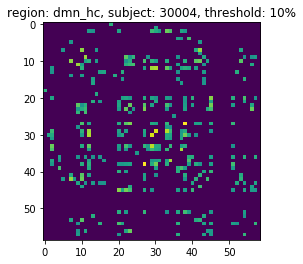

(59,)


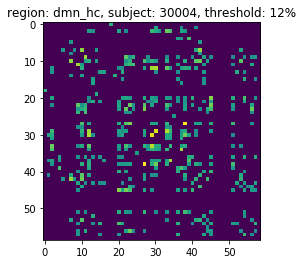

(59,)


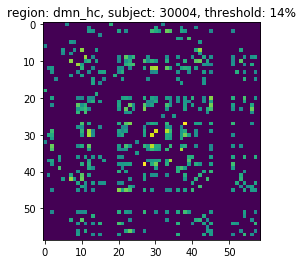

(59,)


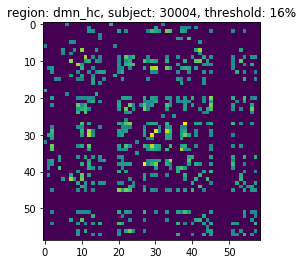

(59,)


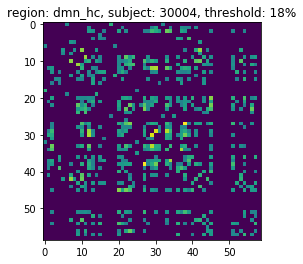

(59,)


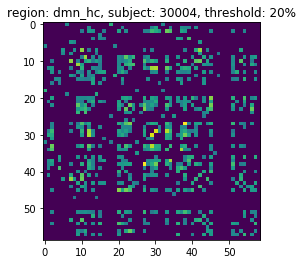

(59,)
(26, 26, 89)


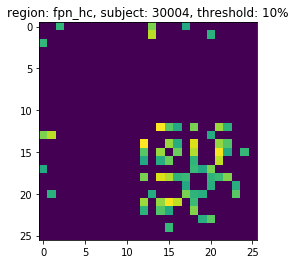

(26,)


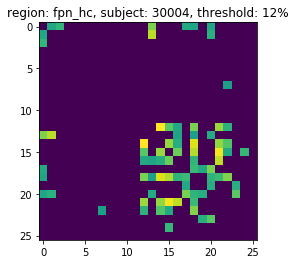

(26,)


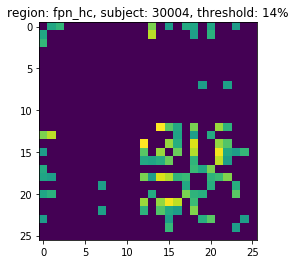

(26,)


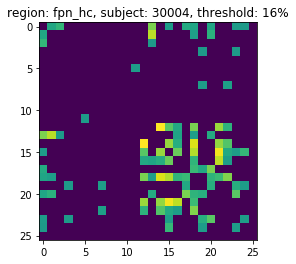

(26,)


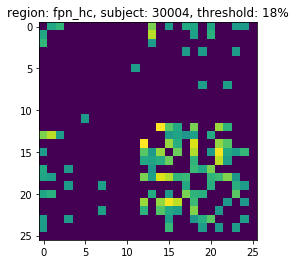

(26,)


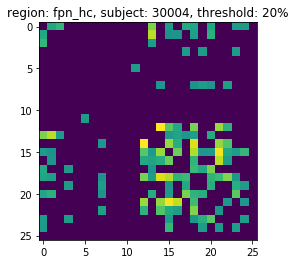

(26,)
(6, 6, 89)


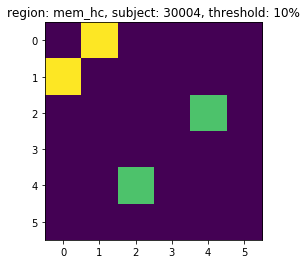

(6,)


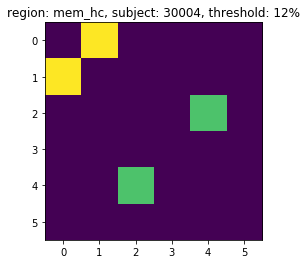

(6,)


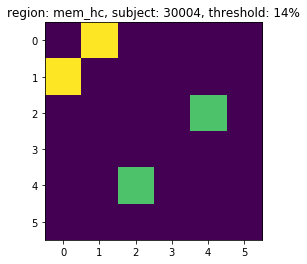

(6,)


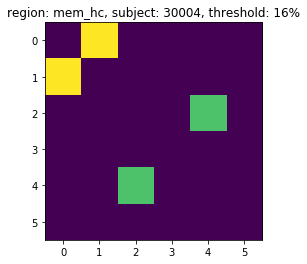

(6,)


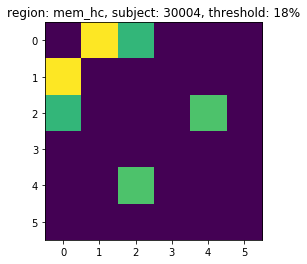

(6,)


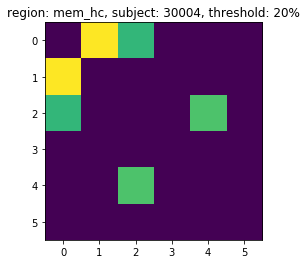

(6,)
   pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0           0.0   30004           NaN           NaN
1           NaN   30004           0.0           NaN
2           NaN   30004           NaN           0.0
(59, 59, 89)


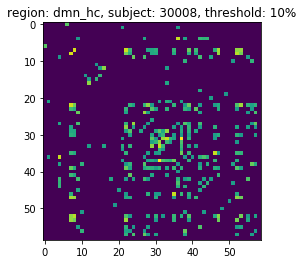

(59,)


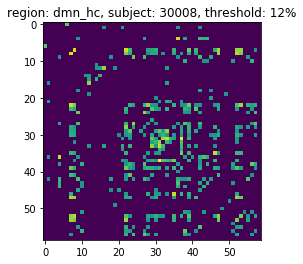

(59,)


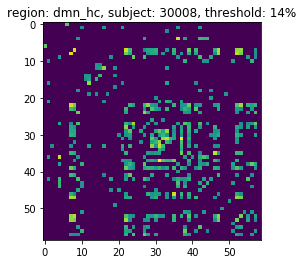

(59,)


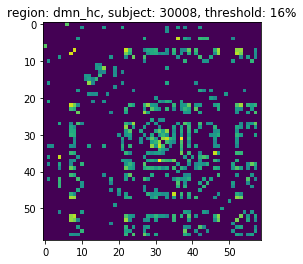

(59,)


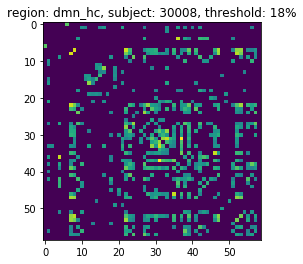

(59,)


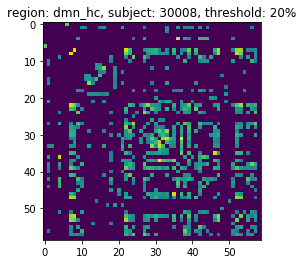

(59,)
(26, 26, 89)


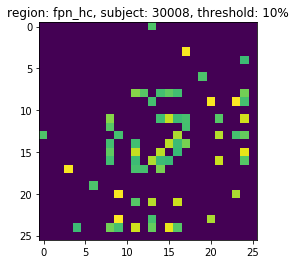

(26,)


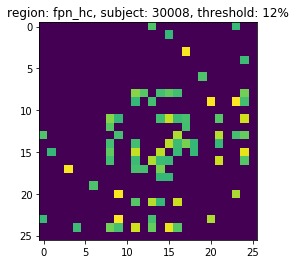

(26,)


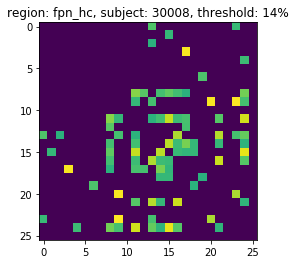

(26,)


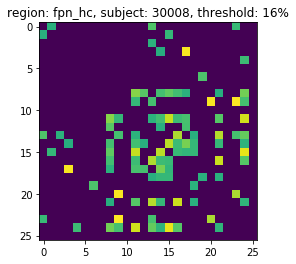

(26,)


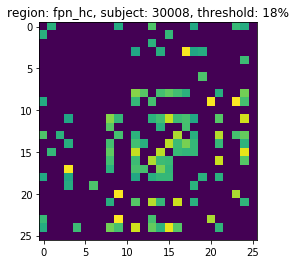

(26,)


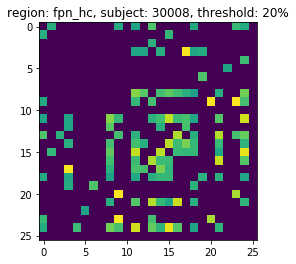

(26,)
(6, 6, 89)


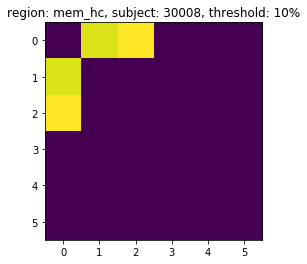

(6,)


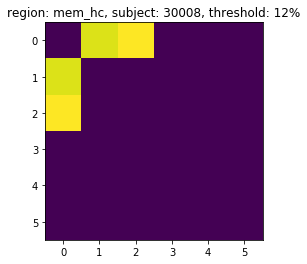

(6,)


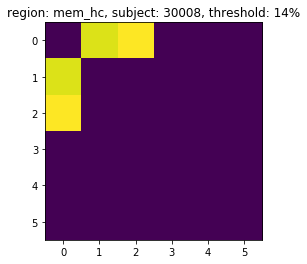

(6,)


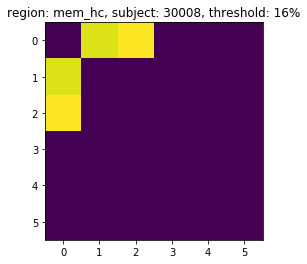

(6,)


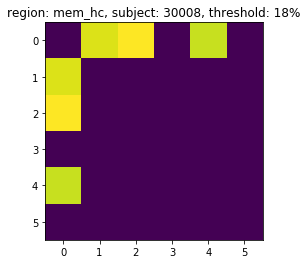

(6,)


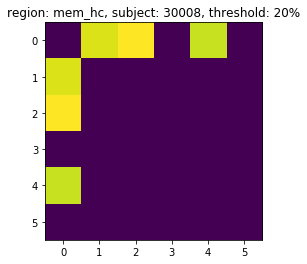

(6,)
   pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0           0.0   30004           NaN           NaN
1           NaN   30004           0.0           NaN
2           NaN   30004           NaN           0.0
3           0.0   30008           NaN           NaN
4           NaN   30008           0.0           NaN
5           NaN   30008           NaN           0.0
(59, 59, 89)


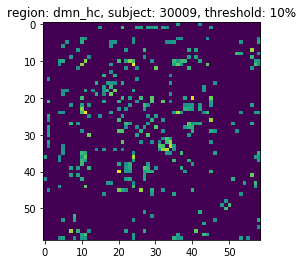

(59,)


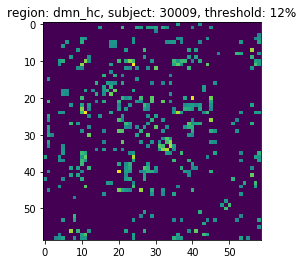

(59,)


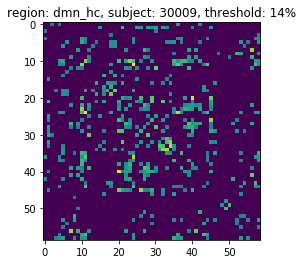

(59,)


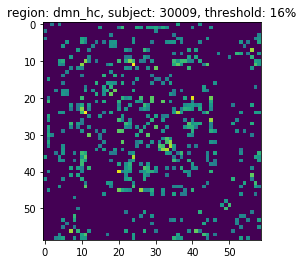

(59,)


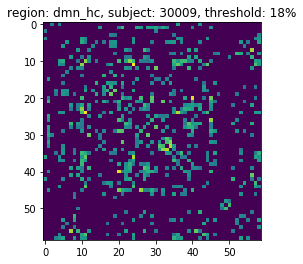

(59,)


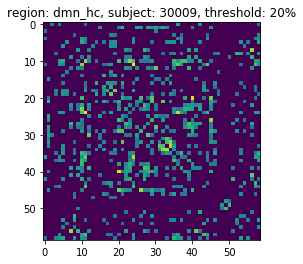

(59,)
(26, 26, 89)


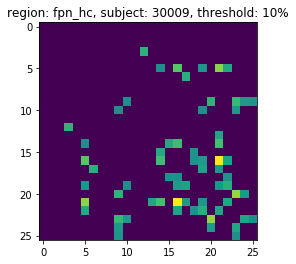

(26,)


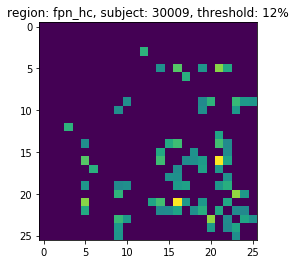

(26,)


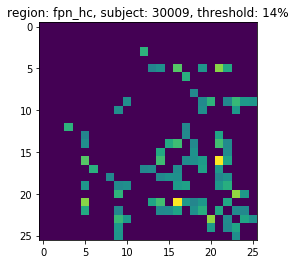

(26,)


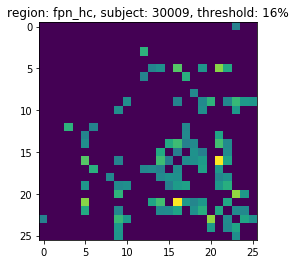

(26,)


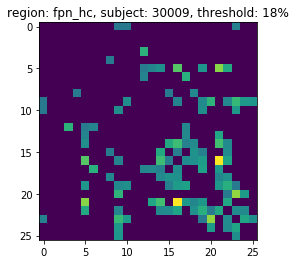

(26,)


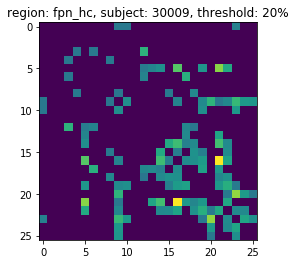

(26,)
(6, 6, 89)


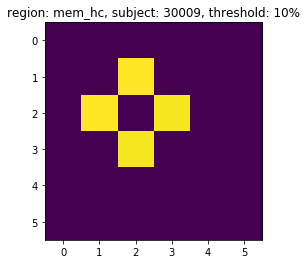

(6,)


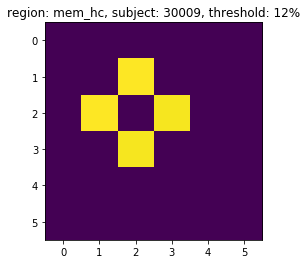

(6,)


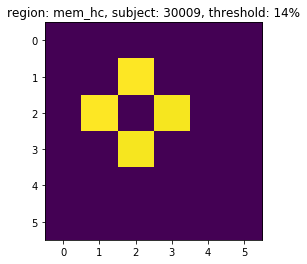

(6,)


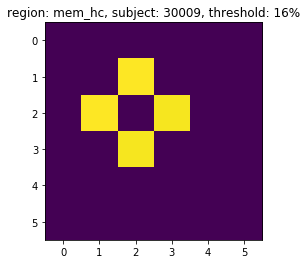

(6,)


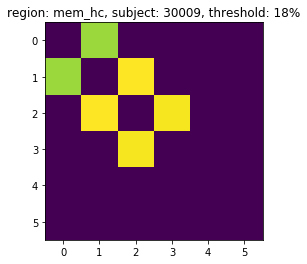

(6,)


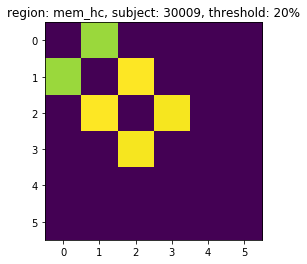

(6,)
   pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0           0.0   30004           NaN           NaN
1           NaN   30004           0.0           NaN
2           NaN   30004           NaN           0.0
3           0.0   30008           NaN           NaN
4           NaN   30008           0.0           NaN
5           NaN   30008           NaN           0.0
6           0.0   30009           NaN           NaN
7           NaN   30009           0.0           NaN
8           NaN   30009           NaN           0.0
(59, 59, 89)


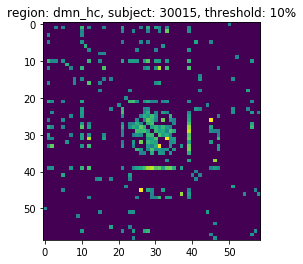

(59,)


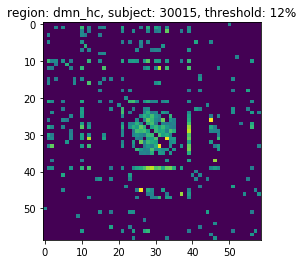

(59,)


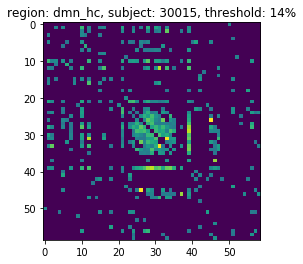

(59,)


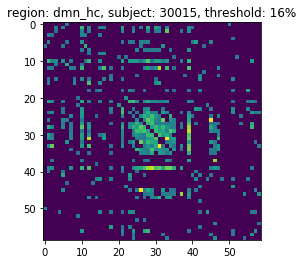

(59,)


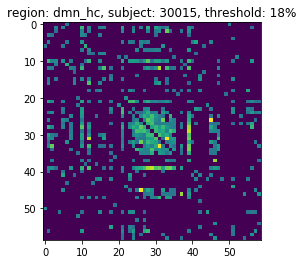

(59,)


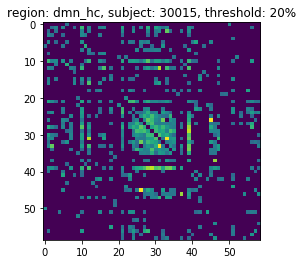

(59,)
(26, 26, 89)


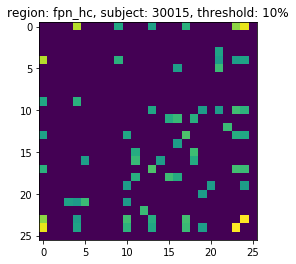

(26,)


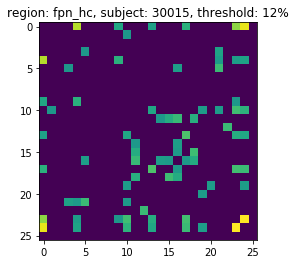

(26,)


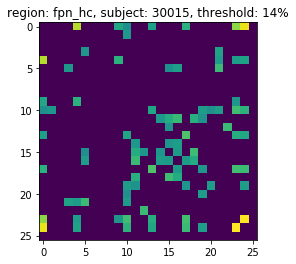

(26,)


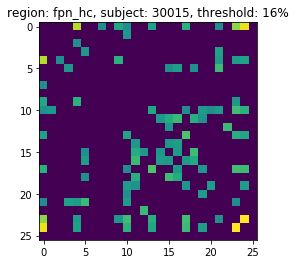

(26,)


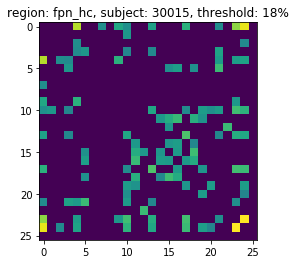

(26,)


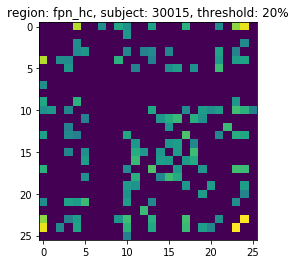

(26,)
(6, 6, 89)


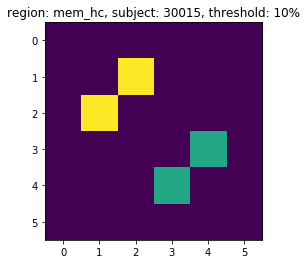

(6,)


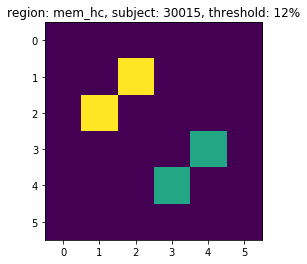

(6,)


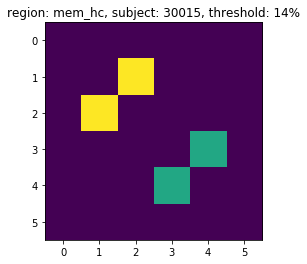

(6,)


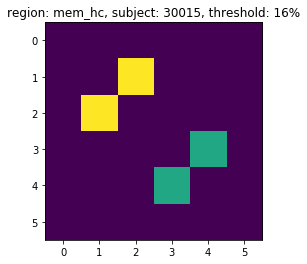

(6,)


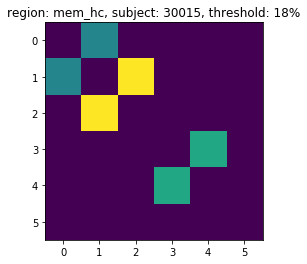

(6,)


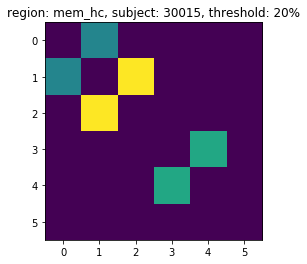

(6,)
    pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0            0.0   30004           NaN           NaN
1            NaN   30004           0.0           NaN
2            NaN   30004           NaN           0.0
3            0.0   30008           NaN           NaN
4            NaN   30008           0.0           NaN
5            NaN   30008           NaN           0.0
6            0.0   30009           NaN           NaN
7            NaN   30009           0.0           NaN
8            NaN   30009           NaN           0.0
9            0.0   30015           NaN           NaN
10           NaN   30015           0.0           NaN
11           NaN   30015           NaN           0.0
(59, 59, 89)


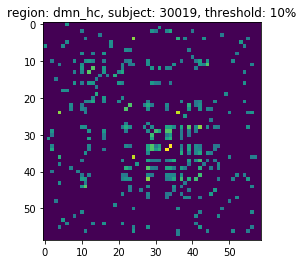

(59,)


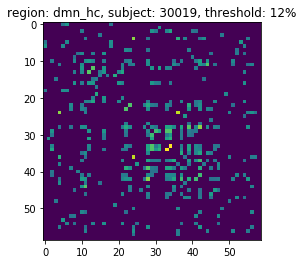

(59,)


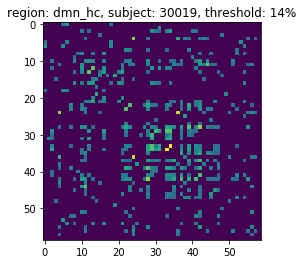

(59,)


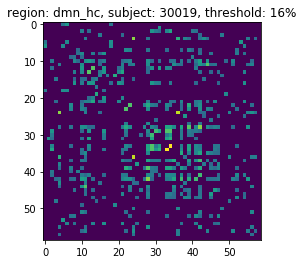

(59,)


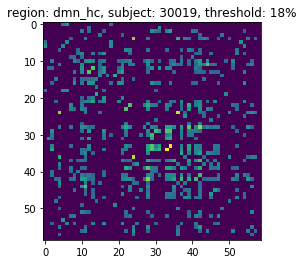

(59,)


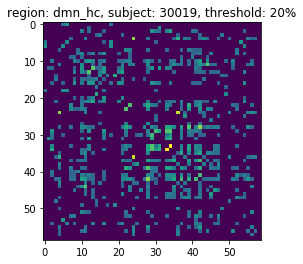

(59,)
(26, 26, 89)


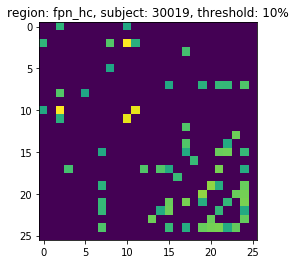

(26,)


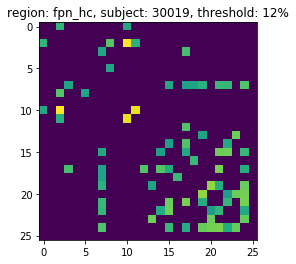

(26,)


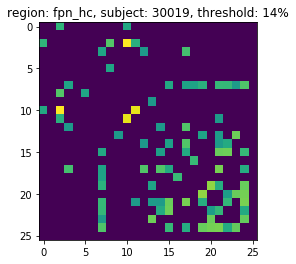

(26,)


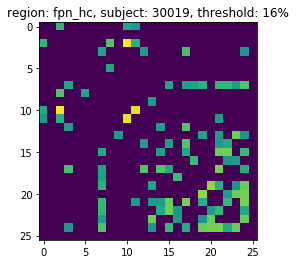

(26,)


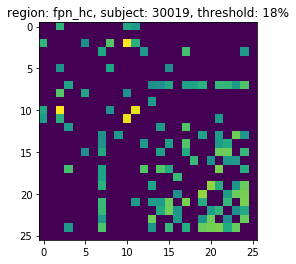

(26,)


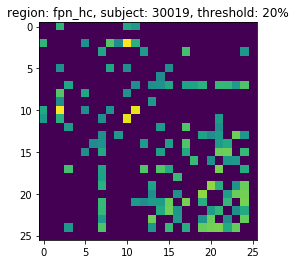

(26,)
(6, 6, 89)


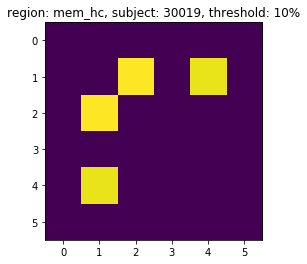

(6,)


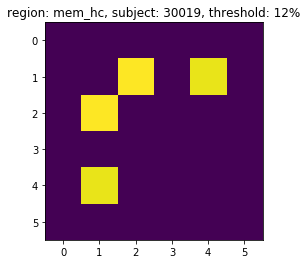

(6,)


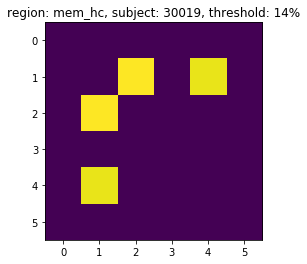

(6,)


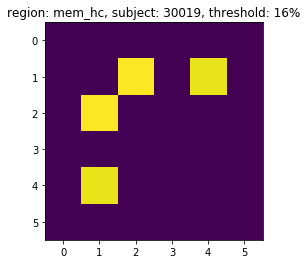

(6,)


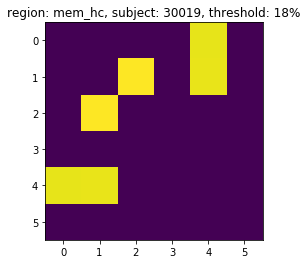

(6,)


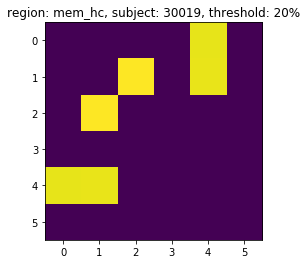

(6,)
    pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0            0.0   30004           NaN           NaN
1            NaN   30004           0.0           NaN
2            NaN   30004           NaN           0.0
3            0.0   30008           NaN           NaN
4            NaN   30008           0.0           NaN
5            NaN   30008           NaN           0.0
6            0.0   30009           NaN           NaN
7            NaN   30009           0.0           NaN
8            NaN   30009           NaN           0.0
9            0.0   30015           NaN           NaN
10           NaN   30015           0.0           NaN
11           NaN   30015           NaN           0.0
12           0.0   30019           NaN           NaN
13           NaN   30019           0.0           NaN
14           NaN   30019           NaN           0.0
(59, 59, 89)


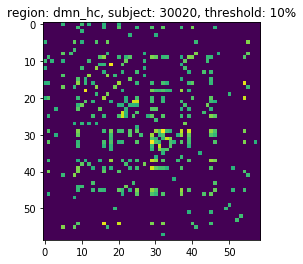

(59,)


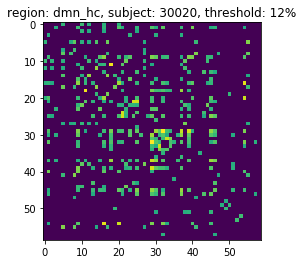

(59,)


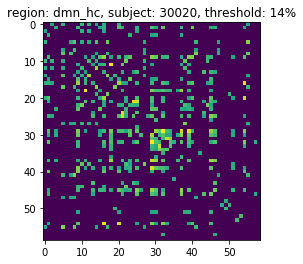

(59,)


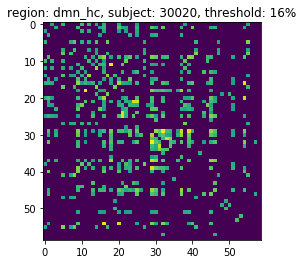

(59,)


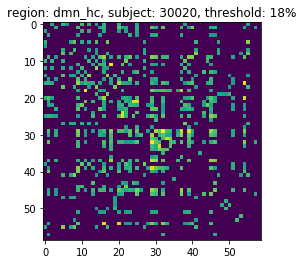

(59,)


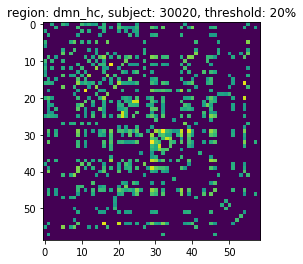

(59,)
(26, 26, 89)


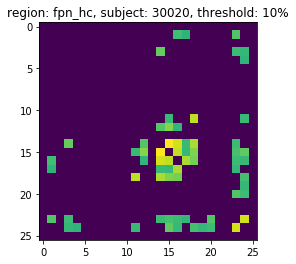

(26,)


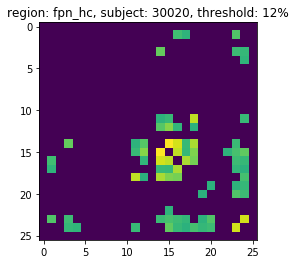

(26,)


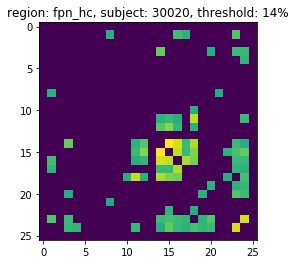

(26,)


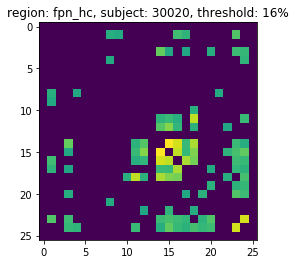

(26,)


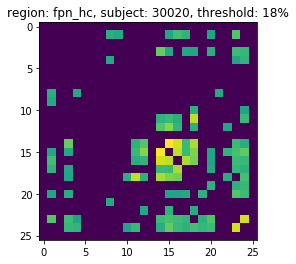

(26,)


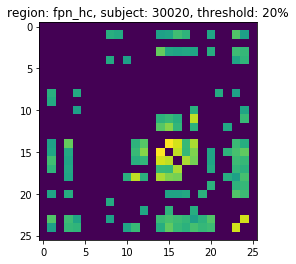

(26,)
(6, 6, 89)


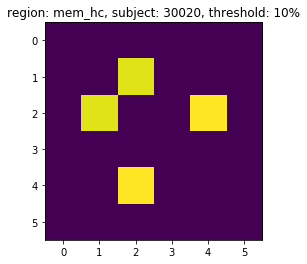

(6,)


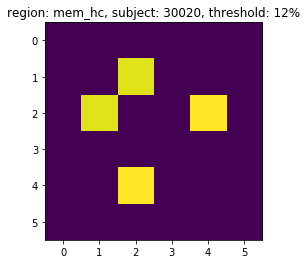

(6,)


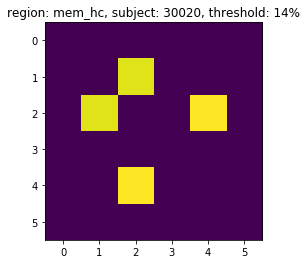

(6,)


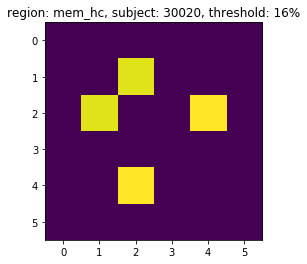

(6,)


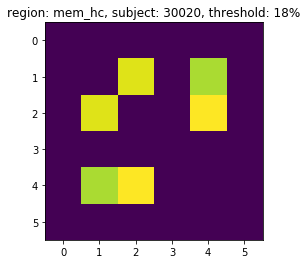

(6,)


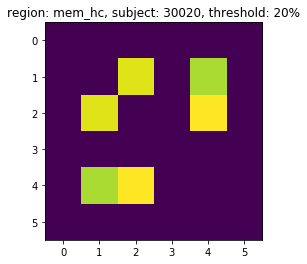

(6,)
    pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0            0.0   30004           NaN           NaN
1            NaN   30004           0.0           NaN
2            NaN   30004           NaN           0.0
3            0.0   30008           NaN           NaN
4            NaN   30008           0.0           NaN
5            NaN   30008           NaN           0.0
6            0.0   30009           NaN           NaN
7            NaN   30009           0.0           NaN
8            NaN   30009           NaN           0.0
9            0.0   30015           NaN           NaN
10           NaN   30015           0.0           NaN
11           NaN   30015           NaN           0.0
12           0.0   30019           NaN           NaN
13           NaN   30019           0.0           NaN
14           NaN   30019           NaN           0.0
15           0.0   30020           NaN           NaN
16           NaN   30020           0.0           NaN
17           NaN   30020           NaN   

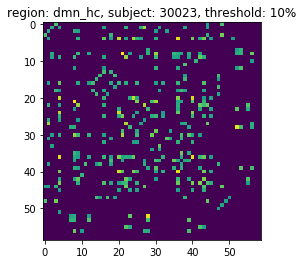

(59,)


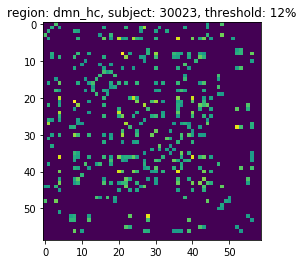

(59,)


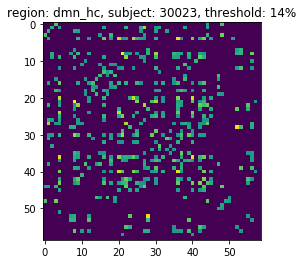

(59,)


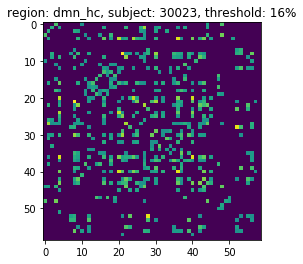

(59,)


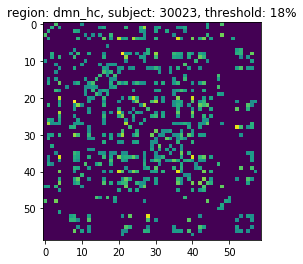

(59,)


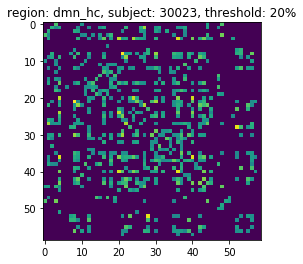

(59,)
(26, 26, 89)


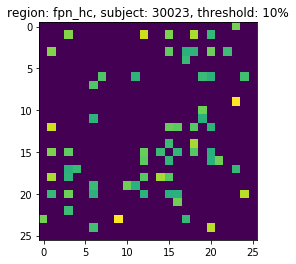

(26,)


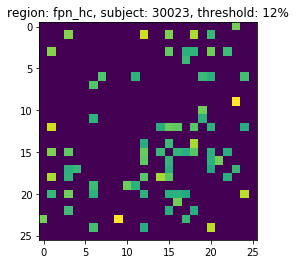

(26,)


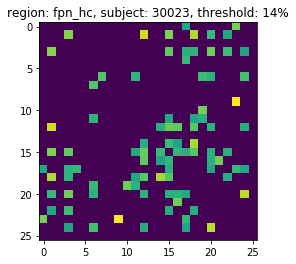

(26,)


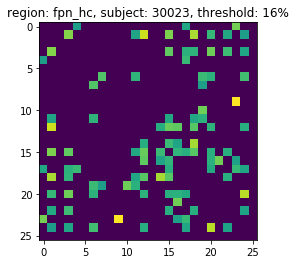

(26,)


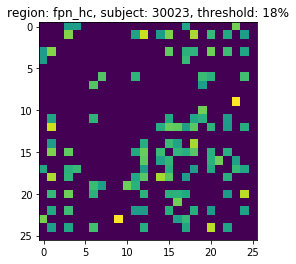

(26,)


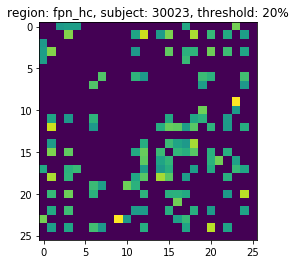

(26,)
(6, 6, 89)


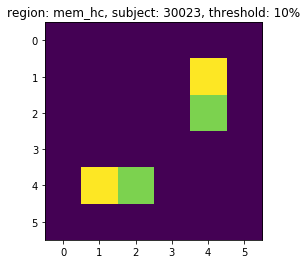

(6,)


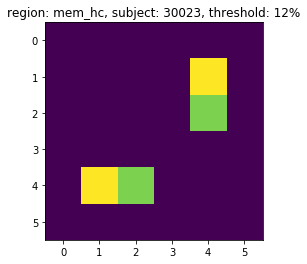

(6,)


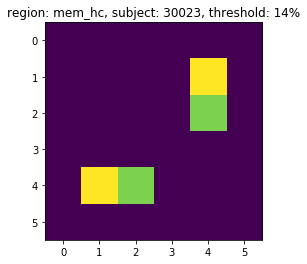

(6,)


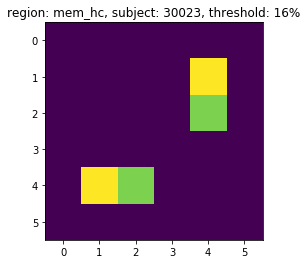

(6,)


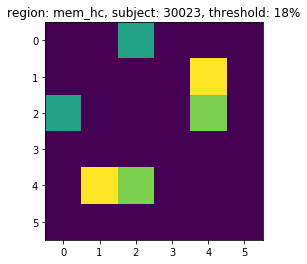

(6,)


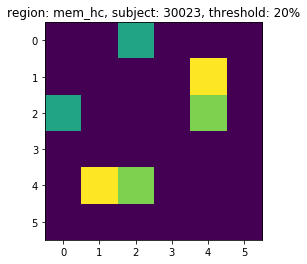

(6,)
    pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0            0.0   30004           NaN           NaN
1            NaN   30004           0.0           NaN
2            NaN   30004           NaN           0.0
3            0.0   30008           NaN           NaN
4            NaN   30008           0.0           NaN
5            NaN   30008           NaN           0.0
6            0.0   30009           NaN           NaN
7            NaN   30009           0.0           NaN
8            NaN   30009           NaN           0.0
9            0.0   30015           NaN           NaN
10           NaN   30015           0.0           NaN
11           NaN   30015           NaN           0.0
12           0.0   30019           NaN           NaN
13           NaN   30019           0.0           NaN
14           NaN   30019           NaN           0.0
15           0.0   30020           NaN           NaN
16           NaN   30020           0.0           NaN
17           NaN   30020           NaN   

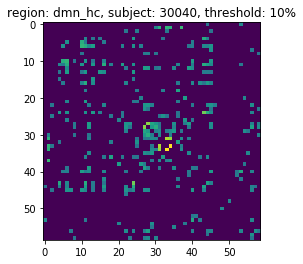

(59,)


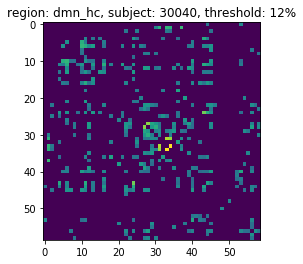

(59,)


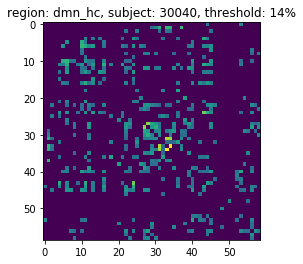

(59,)


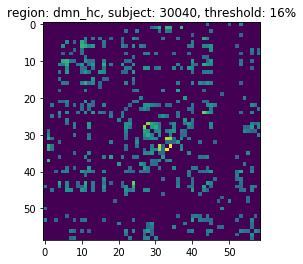

(59,)


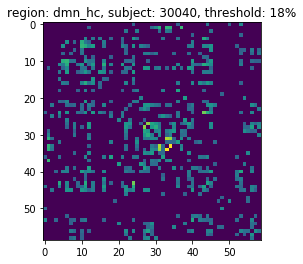

(59,)


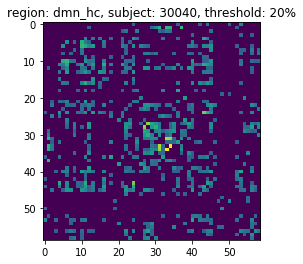

(59,)
(26, 26, 89)


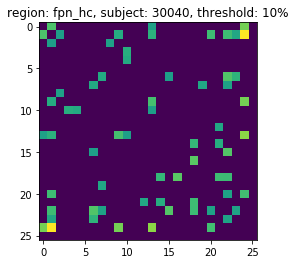

(26,)


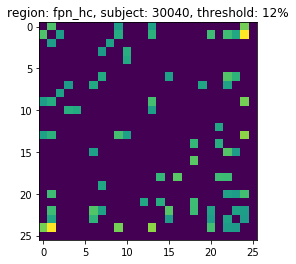

(26,)


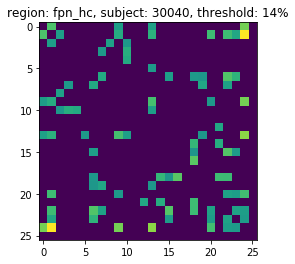

(26,)


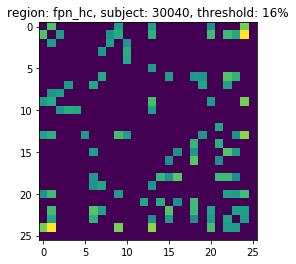

(26,)


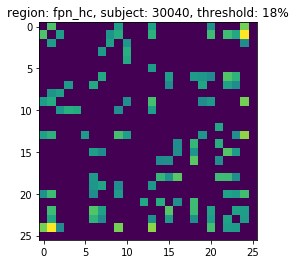

(26,)


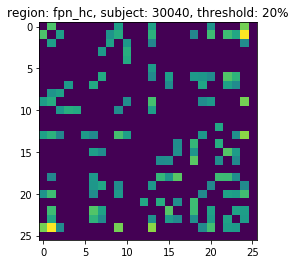

(26,)
(6, 6, 89)


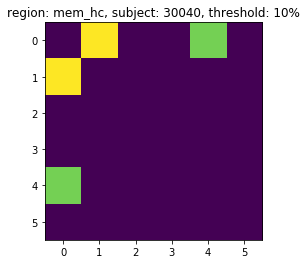

(6,)


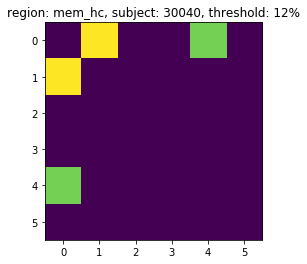

(6,)


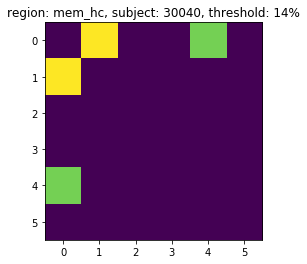

(6,)


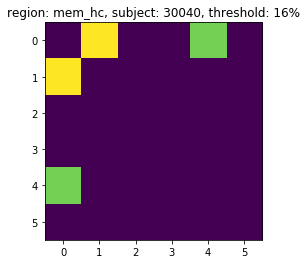

(6,)


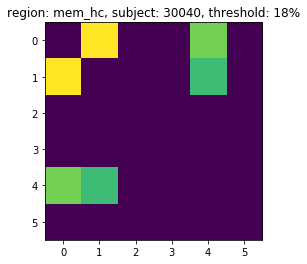

(6,)


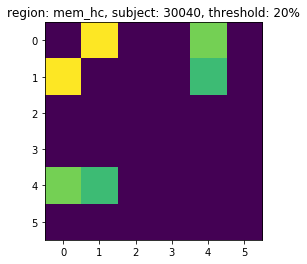

(6,)
    pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0            0.0   30004           NaN           NaN
1            NaN   30004           0.0           NaN
2            NaN   30004           NaN           0.0
3            0.0   30008           NaN           NaN
4            NaN   30008           0.0           NaN
5            NaN   30008           NaN           0.0
6            0.0   30009           NaN           NaN
7            NaN   30009           0.0           NaN
8            NaN   30009           NaN           0.0
9            0.0   30015           NaN           NaN
10           NaN   30015           0.0           NaN
11           NaN   30015           NaN           0.0
12           0.0   30019           NaN           NaN
13           NaN   30019           0.0           NaN
14           NaN   30019           NaN           0.0
15           0.0   30020           NaN           NaN
16           NaN   30020           0.0           NaN
17           NaN   30020           NaN   

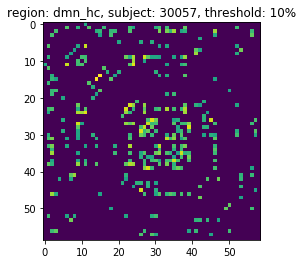

(59,)


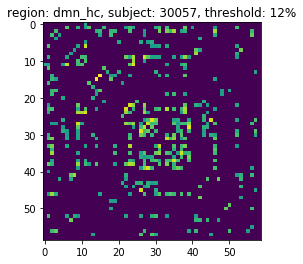

(59,)


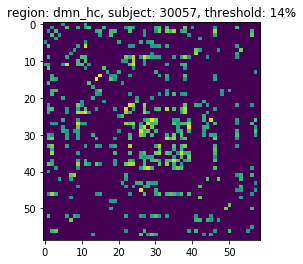

(59,)


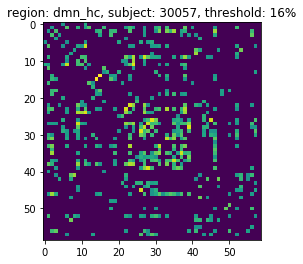

(59,)


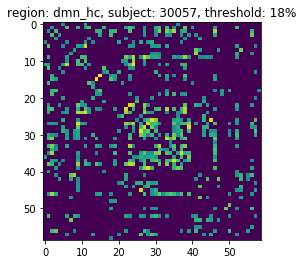

(59,)


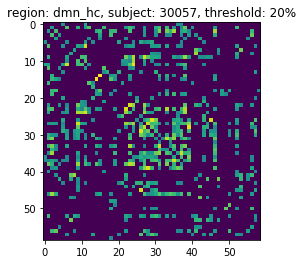

(59,)
(26, 26, 89)


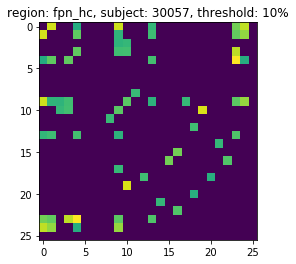

(26,)


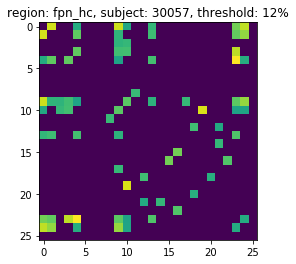

(26,)


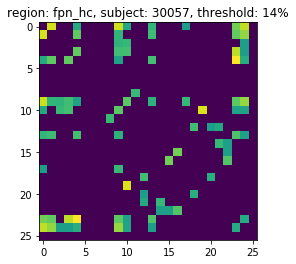

(26,)


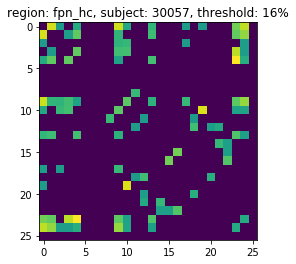

(26,)


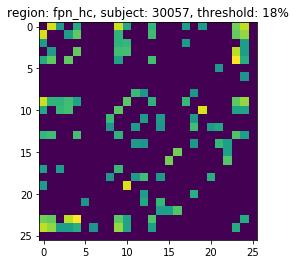

(26,)


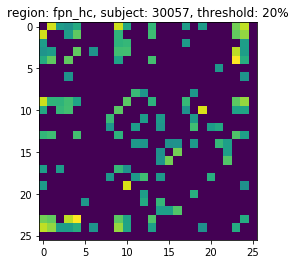

(26,)
(6, 6, 89)


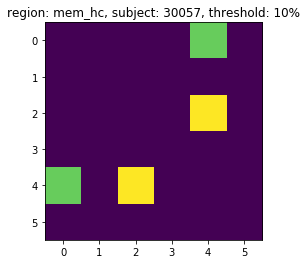

(6,)


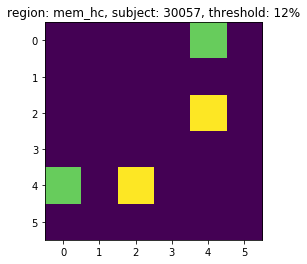

(6,)


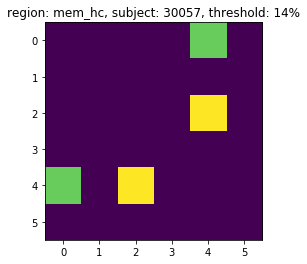

(6,)


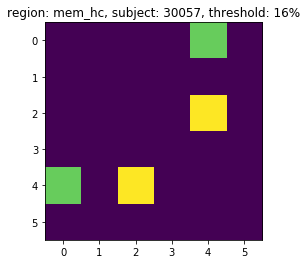

(6,)


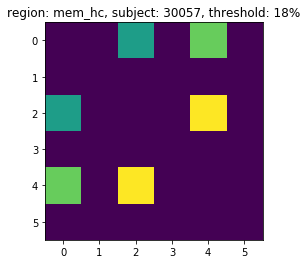

(6,)


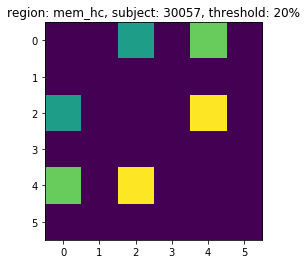

(6,)
    pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0            0.0   30004           NaN           NaN
1            NaN   30004           0.0           NaN
2            NaN   30004           NaN           0.0
3            0.0   30008           NaN           NaN
4            NaN   30008           0.0           NaN
5            NaN   30008           NaN           0.0
6            0.0   30009           NaN           NaN
7            NaN   30009           0.0           NaN
8            NaN   30009           NaN           0.0
9            0.0   30015           NaN           NaN
10           NaN   30015           0.0           NaN
11           NaN   30015           NaN           0.0
12           0.0   30019           NaN           NaN
13           NaN   30019           0.0           NaN
14           NaN   30019           NaN           0.0
15           0.0   30020           NaN           NaN
16           NaN   30020           0.0           NaN
17           NaN   30020           NaN   

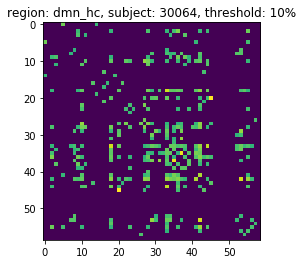

(59,)


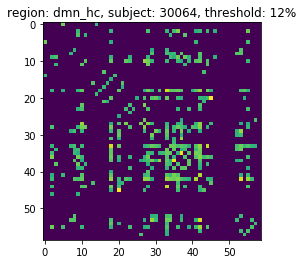

(59,)


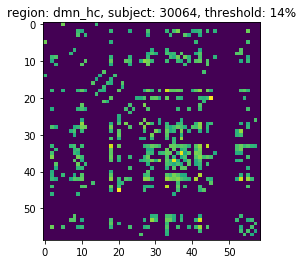

(59,)


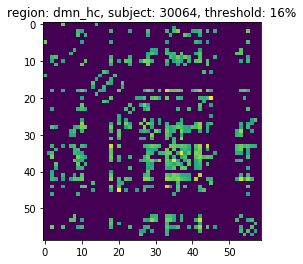

(59,)


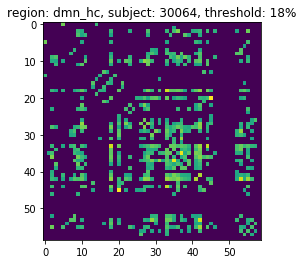

(59,)


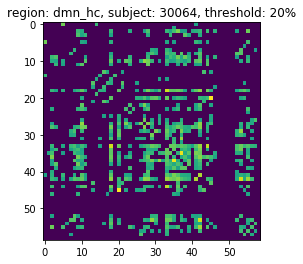

(59,)
(26, 26, 89)


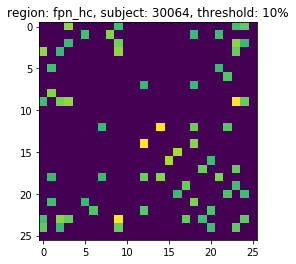

(26,)


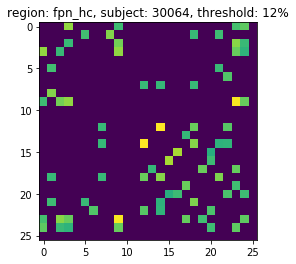

(26,)


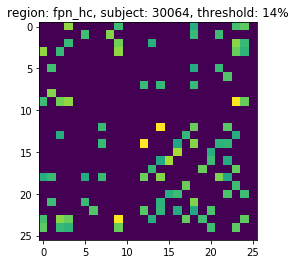

(26,)


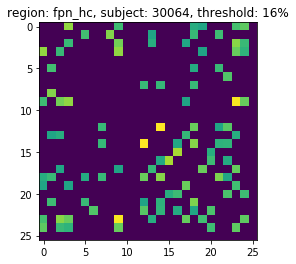

(26,)


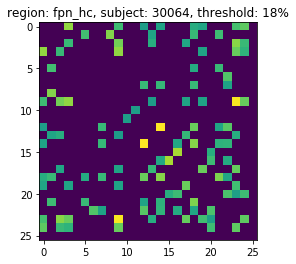

(26,)


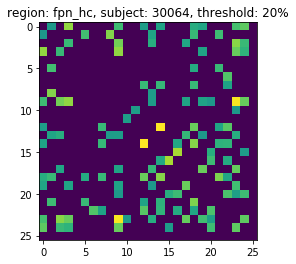

(26,)
(6, 6, 89)


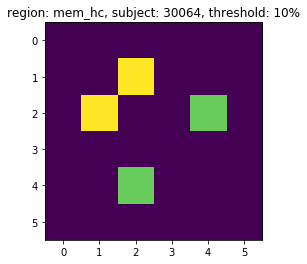

(6,)


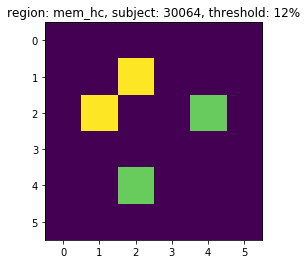

(6,)


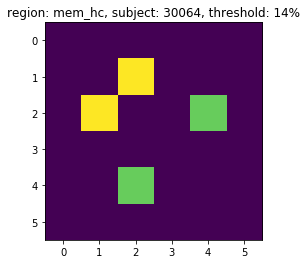

(6,)


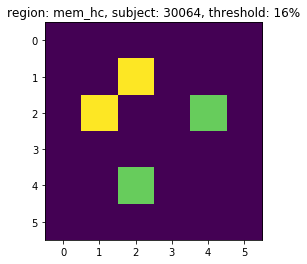

(6,)


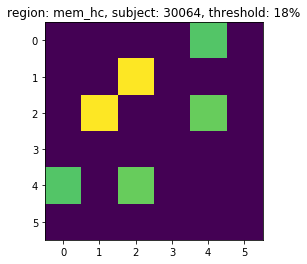

(6,)


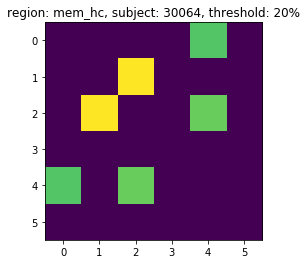

(6,)
    pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0            0.0   30004           NaN           NaN
1            NaN   30004           0.0           NaN
2            NaN   30004           NaN           0.0
3            0.0   30008           NaN           NaN
4            NaN   30008           0.0           NaN
5            NaN   30008           NaN           0.0
6            0.0   30009           NaN           NaN
7            NaN   30009           0.0           NaN
8            NaN   30009           NaN           0.0
9            0.0   30015           NaN           NaN
10           NaN   30015           0.0           NaN
11           NaN   30015           NaN           0.0
12           0.0   30019           NaN           NaN
13           NaN   30019           0.0           NaN
14           NaN   30019           NaN           0.0
15           0.0   30020           NaN           NaN
16           NaN   30020           0.0           NaN
17           NaN   30020           NaN   

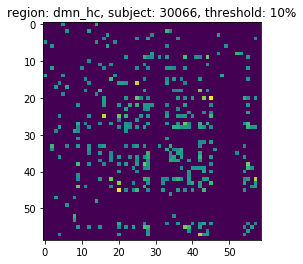

(59,)


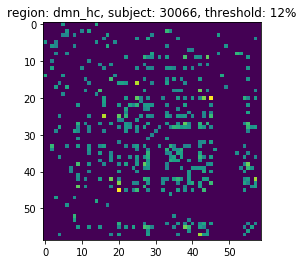

(59,)


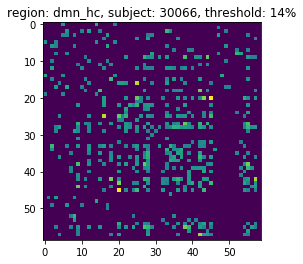

(59,)


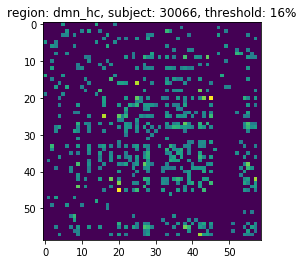

(59,)


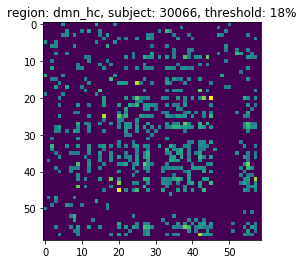

(59,)


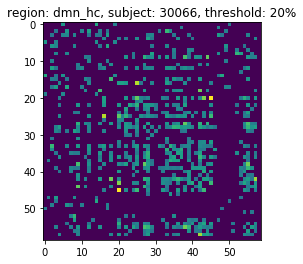

(59,)
(26, 26, 89)


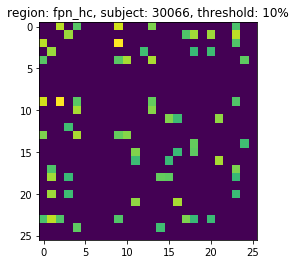

(26,)


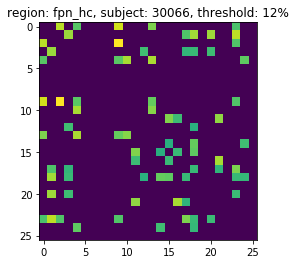

(26,)


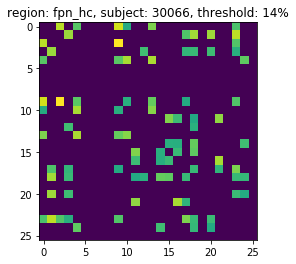

(26,)


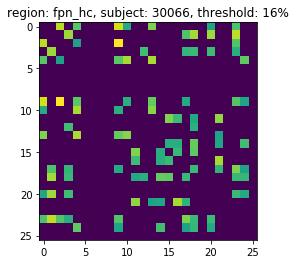

(26,)


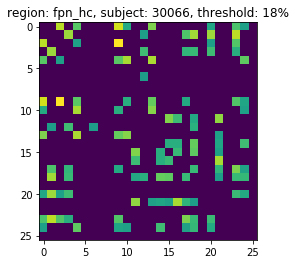

(26,)


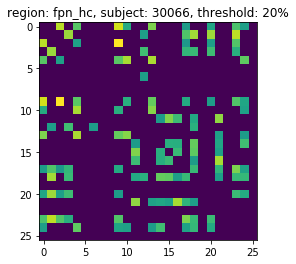

(26,)
(6, 6, 89)


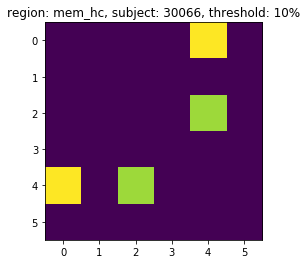

(6,)


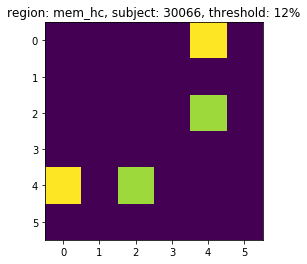

(6,)


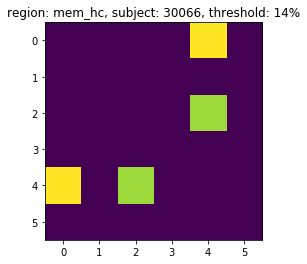

(6,)


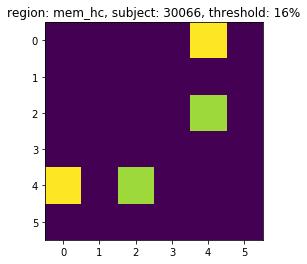

(6,)


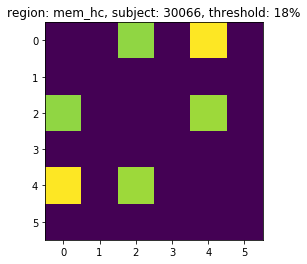

(6,)


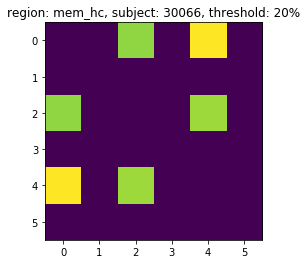

(6,)
    pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0            0.0   30004           NaN           NaN
1            NaN   30004           0.0           NaN
2            NaN   30004           NaN           0.0
3            0.0   30008           NaN           NaN
4            NaN   30008           0.0           NaN
5            NaN   30008           NaN           0.0
6            0.0   30009           NaN           NaN
7            NaN   30009           0.0           NaN
8            NaN   30009           NaN           0.0
9            0.0   30015           NaN           NaN
10           NaN   30015           0.0           NaN
11           NaN   30015           NaN           0.0
12           0.0   30019           NaN           NaN
13           NaN   30019           0.0           NaN
14           NaN   30019           NaN           0.0
15           0.0   30020           NaN           NaN
16           NaN   30020           0.0           NaN
17           NaN   30020           NaN   

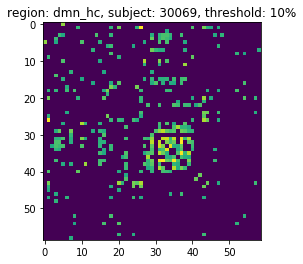

(59,)


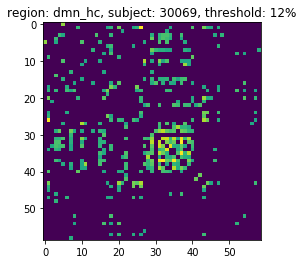

(59,)


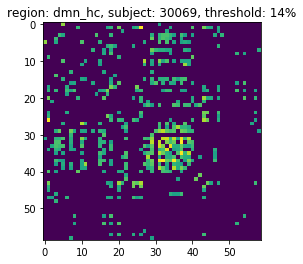

(59,)


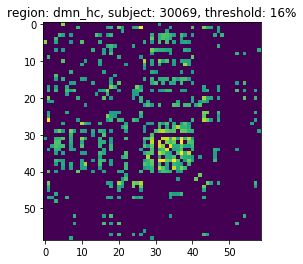

(59,)


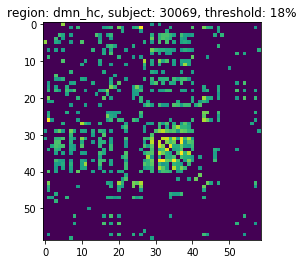

(59,)


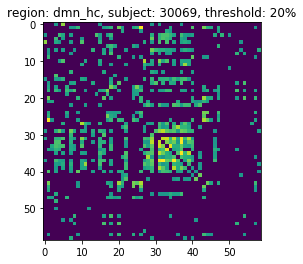

(59,)
(26, 26, 89)


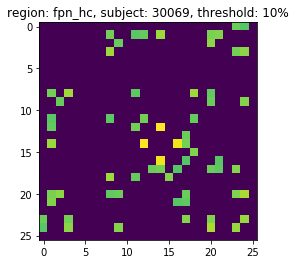

(26,)


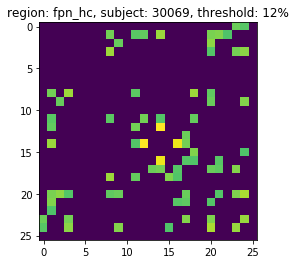

(26,)


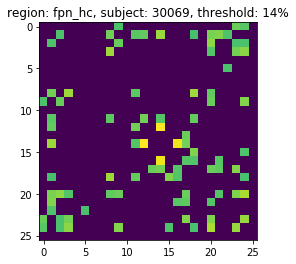

(26,)


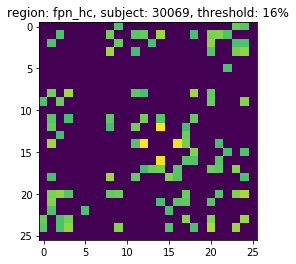

(26,)


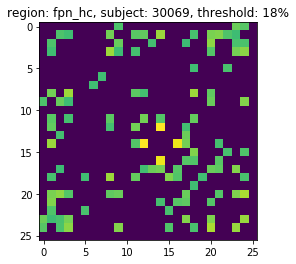

(26,)


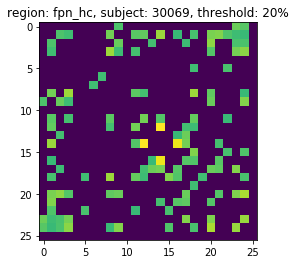

(26,)
(6, 6, 89)


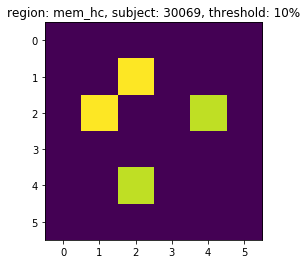

(6,)


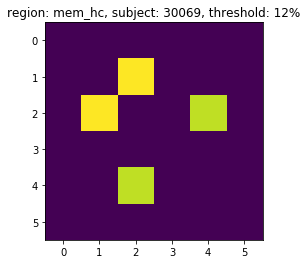

(6,)


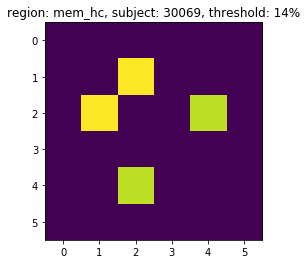

(6,)


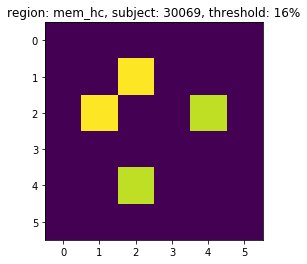

(6,)


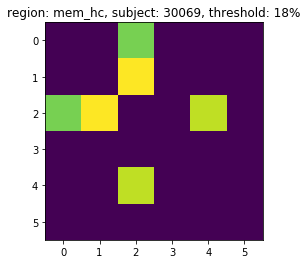

(6,)


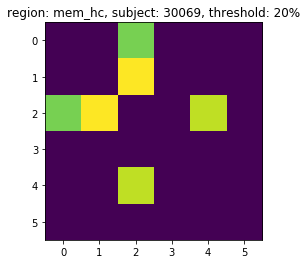

(6,)
    pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0            0.0   30004           NaN           NaN
1            NaN   30004           0.0           NaN
2            NaN   30004           NaN           0.0
3            0.0   30008           NaN           NaN
4            NaN   30008           0.0           NaN
5            NaN   30008           NaN           0.0
6            0.0   30009           NaN           NaN
7            NaN   30009           0.0           NaN
8            NaN   30009           NaN           0.0
9            0.0   30015           NaN           NaN
10           NaN   30015           0.0           NaN
11           NaN   30015           NaN           0.0
12           0.0   30019           NaN           NaN
13           NaN   30019           0.0           NaN
14           NaN   30019           NaN           0.0
15           0.0   30020           NaN           NaN
16           NaN   30020           0.0           NaN
17           NaN   30020           NaN   

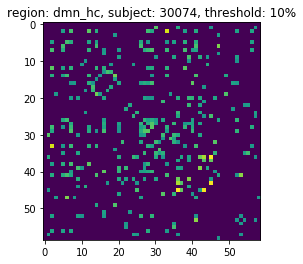

(59,)


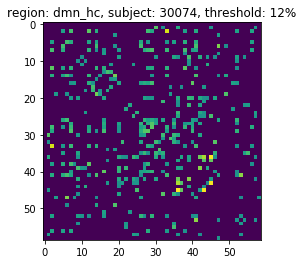

(59,)


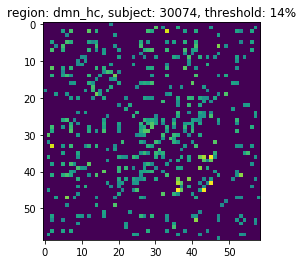

(59,)


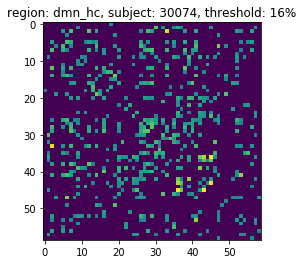

(59,)


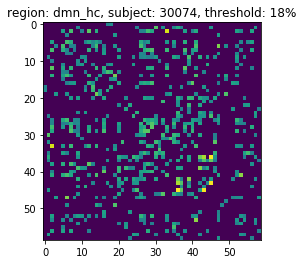

(59,)


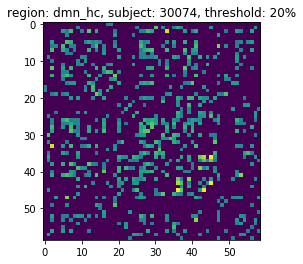

(59,)
(26, 26, 89)


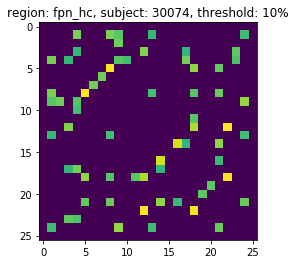

(26,)


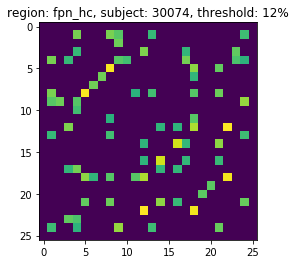

(26,)


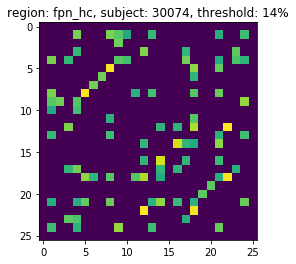

(26,)


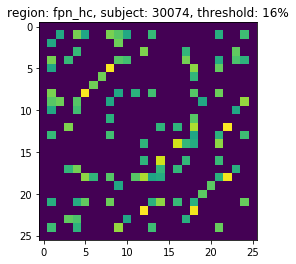

(26,)


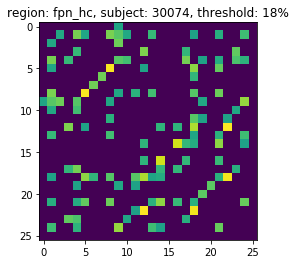

(26,)


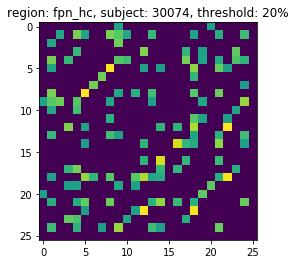

(26,)
(6, 6, 89)


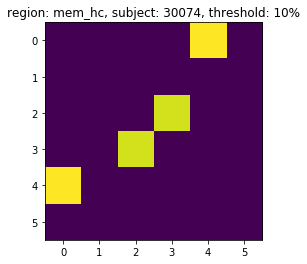

(6,)


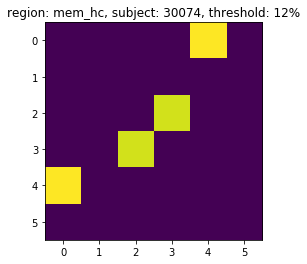

(6,)


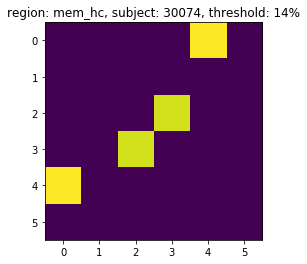

(6,)


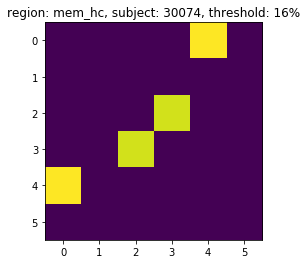

(6,)


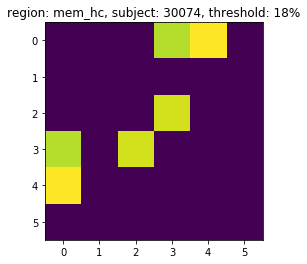

(6,)


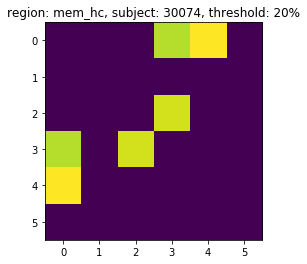

(6,)
    pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0            0.0   30004           NaN           NaN
1            NaN   30004           0.0           NaN
2            NaN   30004           NaN           0.0
3            0.0   30008           NaN           NaN
4            NaN   30008           0.0           NaN
5            NaN   30008           NaN           0.0
6            0.0   30009           NaN           NaN
7            NaN   30009           0.0           NaN
8            NaN   30009           NaN           0.0
9            0.0   30015           NaN           NaN
10           NaN   30015           0.0           NaN
11           NaN   30015           NaN           0.0
12           0.0   30019           NaN           NaN
13           NaN   30019           0.0           NaN
14           NaN   30019           NaN           0.0
15           0.0   30020           NaN           NaN
16           NaN   30020           0.0           NaN
17           NaN   30020           NaN   

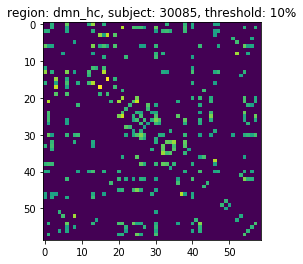

(59,)


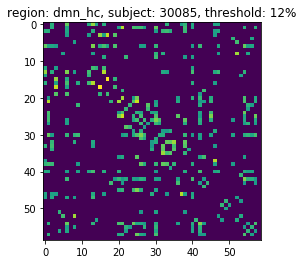

(59,)


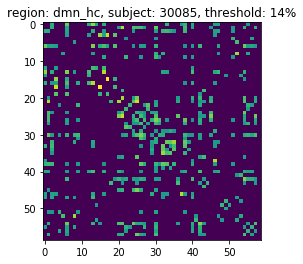

(59,)


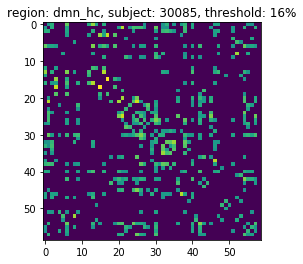

(59,)


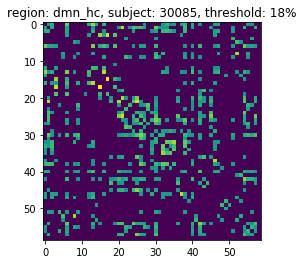

(59,)


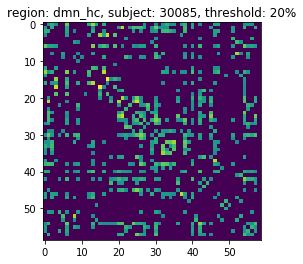

(59,)
(26, 26, 89)


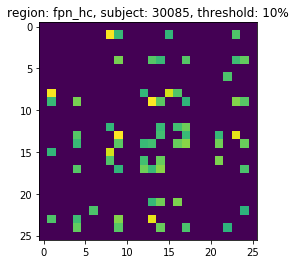

(26,)


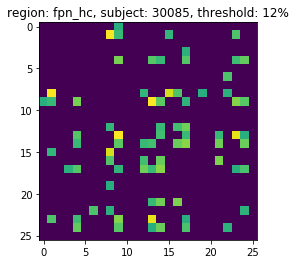

(26,)


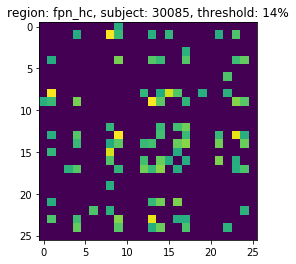

(26,)


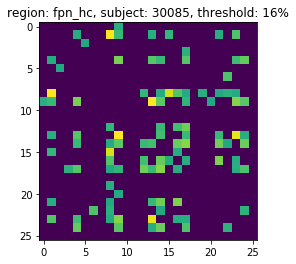

(26,)


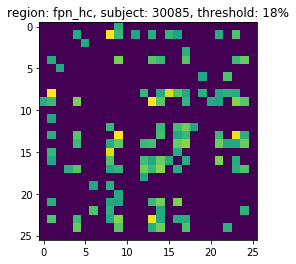

(26,)


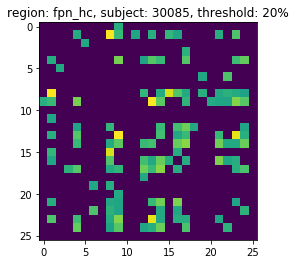

(26,)
(6, 6, 89)


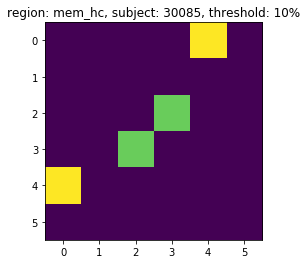

(6,)


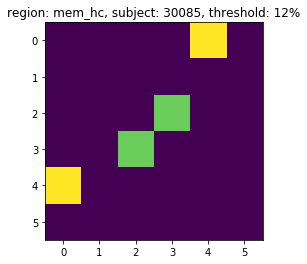

(6,)


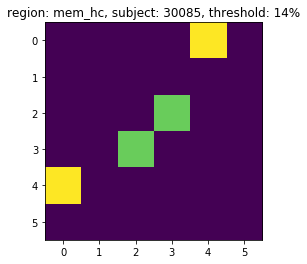

(6,)


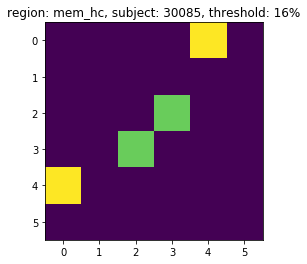

(6,)


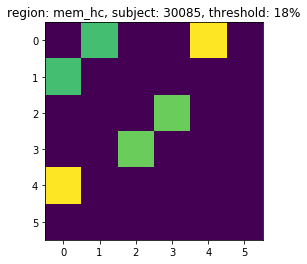

(6,)


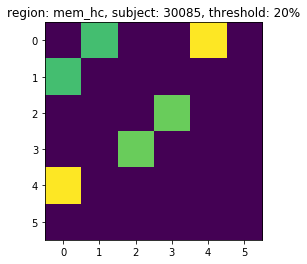

(6,)
    pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0            0.0   30004           NaN           NaN
1            NaN   30004           0.0           NaN
2            NaN   30004           NaN           0.0
3            0.0   30008           NaN           NaN
4            NaN   30008           0.0           NaN
5            NaN   30008           NaN           0.0
6            0.0   30009           NaN           NaN
7            NaN   30009           0.0           NaN
8            NaN   30009           NaN           0.0
9            0.0   30015           NaN           NaN
10           NaN   30015           0.0           NaN
11           NaN   30015           NaN           0.0
12           0.0   30019           NaN           NaN
13           NaN   30019           0.0           NaN
14           NaN   30019           NaN           0.0
15           0.0   30020           NaN           NaN
16           NaN   30020           0.0           NaN
17           NaN   30020           NaN   

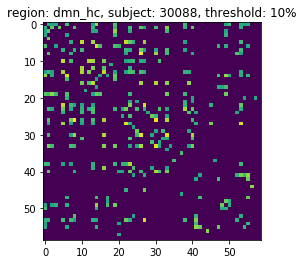

(59,)


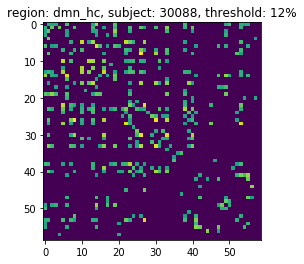

(59,)


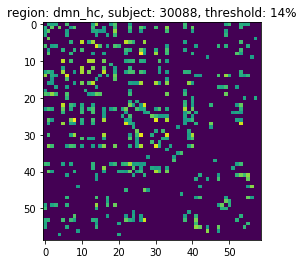

(59,)


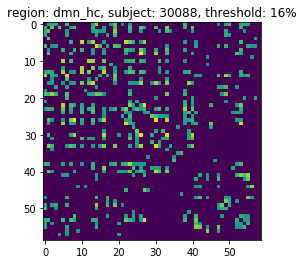

(59,)


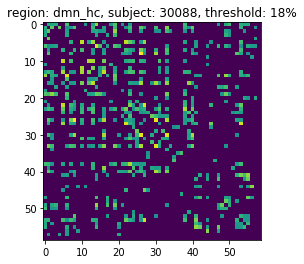

(59,)


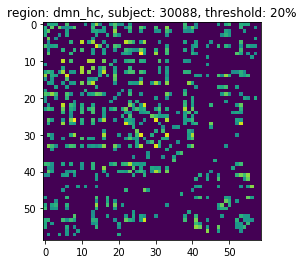

(59,)
(26, 26, 89)


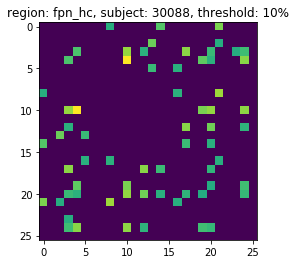

(26,)


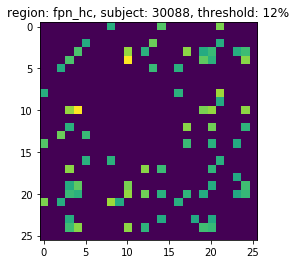

(26,)


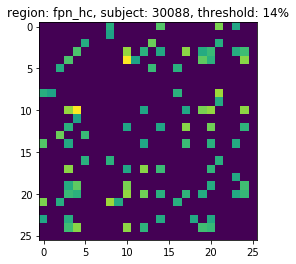

(26,)


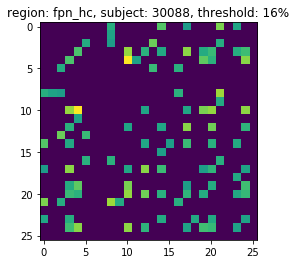

(26,)


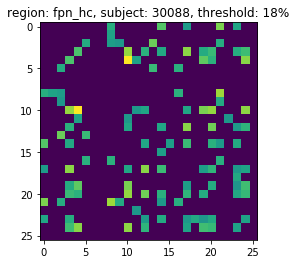

(26,)


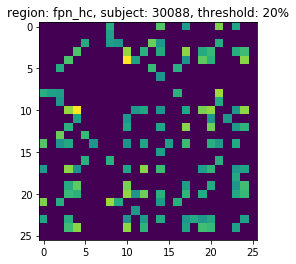

(26,)
(6, 6, 89)


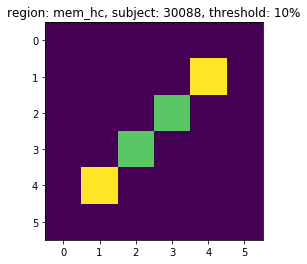

(6,)


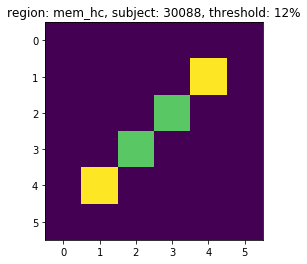

(6,)


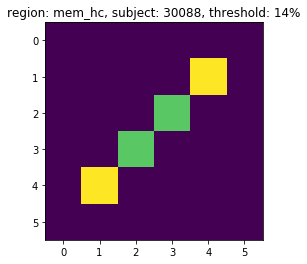

(6,)


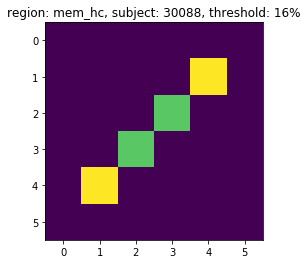

(6,)


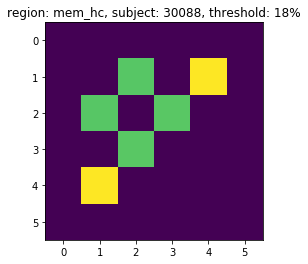

(6,)


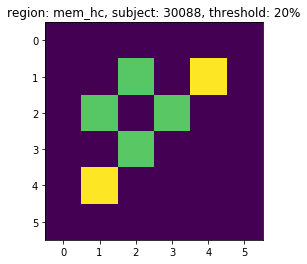

(6,)
    pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0            0.0   30004           NaN           NaN
1            NaN   30004           0.0           NaN
2            NaN   30004           NaN           0.0
3            0.0   30008           NaN           NaN
4            NaN   30008           0.0           NaN
5            NaN   30008           NaN           0.0
6            0.0   30009           NaN           NaN
7            NaN   30009           0.0           NaN
8            NaN   30009           NaN           0.0
9            0.0   30015           NaN           NaN
10           NaN   30015           0.0           NaN
11           NaN   30015           NaN           0.0
12           0.0   30019           NaN           NaN
13           NaN   30019           0.0           NaN
14           NaN   30019           NaN           0.0
15           0.0   30020           NaN           NaN
16           NaN   30020           0.0           NaN
17           NaN   30020           NaN   

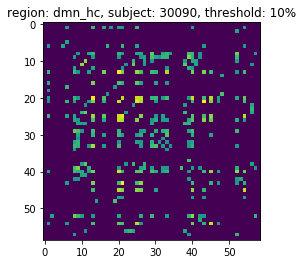

(59,)


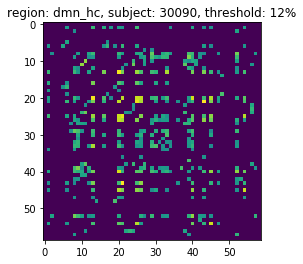

(59,)


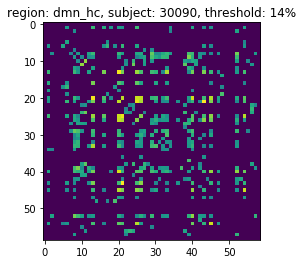

(59,)


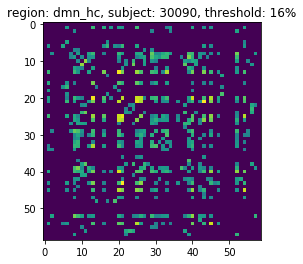

(59,)


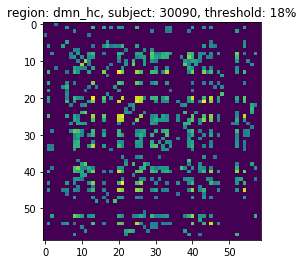

(59,)


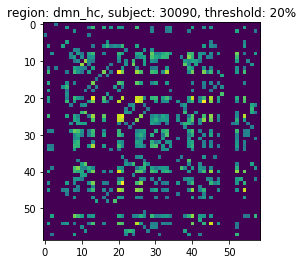

(59,)
(26, 26, 89)


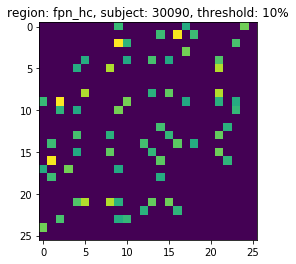

(26,)


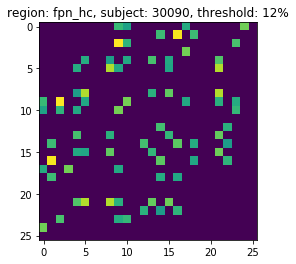

(26,)


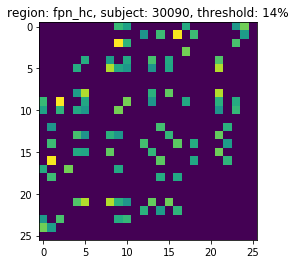

(26,)


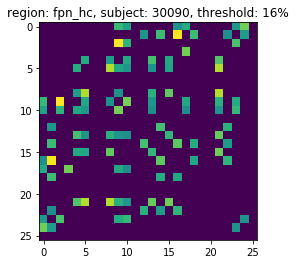

(26,)


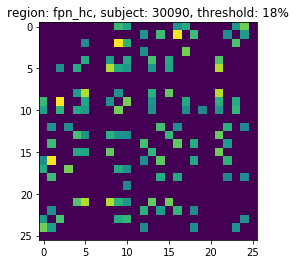

(26,)


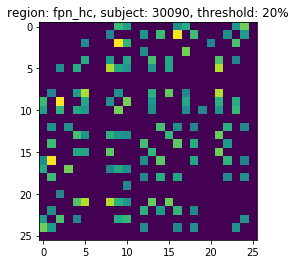

(26,)
(6, 6, 89)


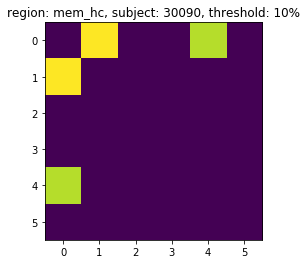

(6,)


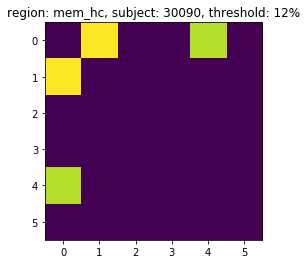

(6,)


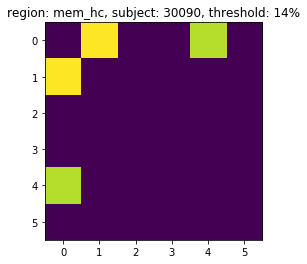

(6,)


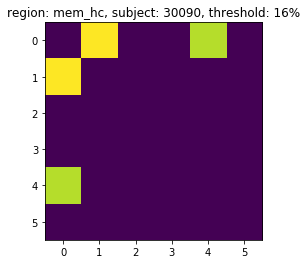

(6,)


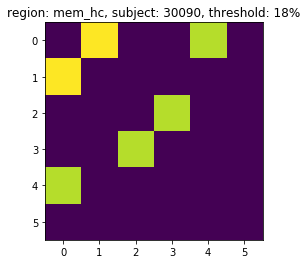

(6,)


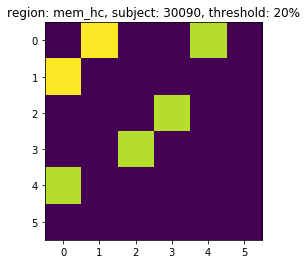

(6,)
    pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0            0.0   30004           NaN           NaN
1            NaN   30004           0.0           NaN
2            NaN   30004           NaN           0.0
3            0.0   30008           NaN           NaN
4            NaN   30008           0.0           NaN
5            NaN   30008           NaN           0.0
6            0.0   30009           NaN           NaN
7            NaN   30009           0.0           NaN
8            NaN   30009           NaN           0.0
9            0.0   30015           NaN           NaN
10           NaN   30015           0.0           NaN
11           NaN   30015           NaN           0.0
12           0.0   30019           NaN           NaN
13           NaN   30019           0.0           NaN
14           NaN   30019           NaN           0.0
15           0.0   30020           NaN           NaN
16           NaN   30020           0.0           NaN
17           NaN   30020           NaN   

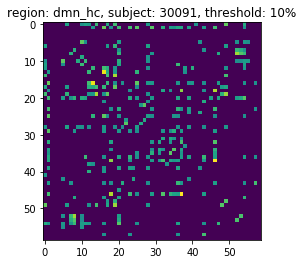

(59,)


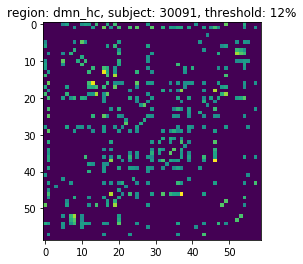

(59,)


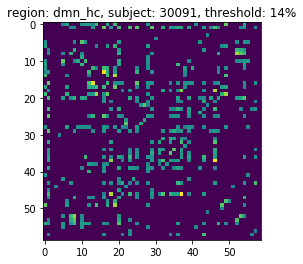

(59,)


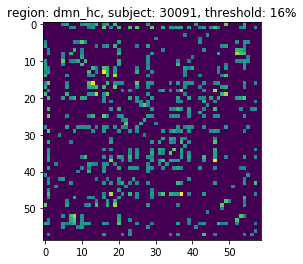

(59,)


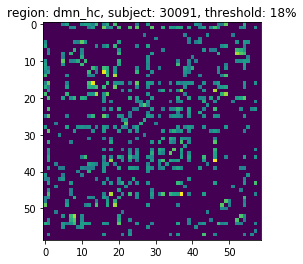

(59,)


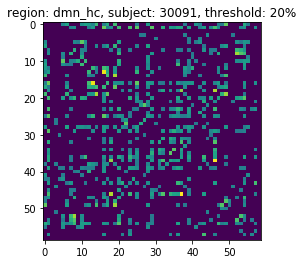

(59,)
(26, 26, 89)


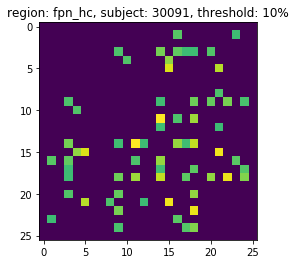

(26,)


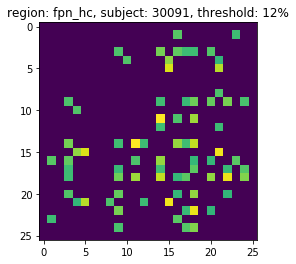

(26,)


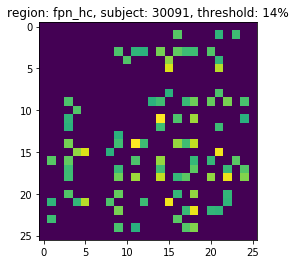

(26,)


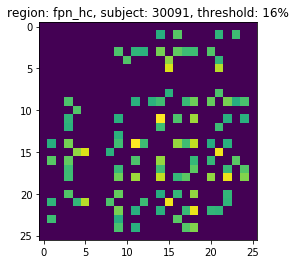

(26,)


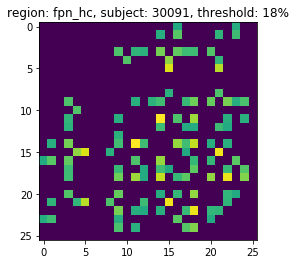

(26,)


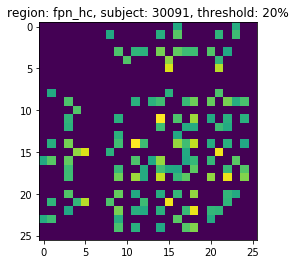

(26,)
(6, 6, 89)


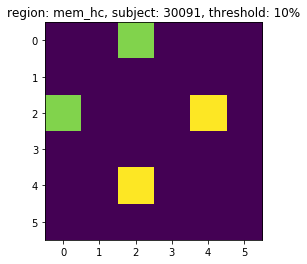

(6,)


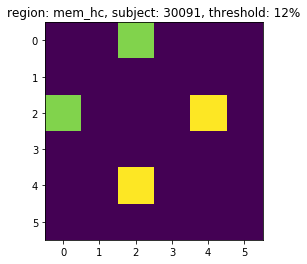

(6,)


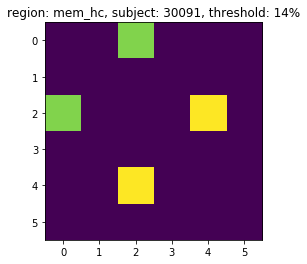

(6,)


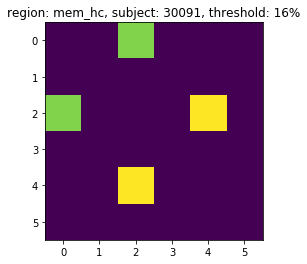

(6,)


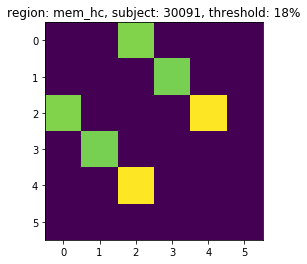

(6,)


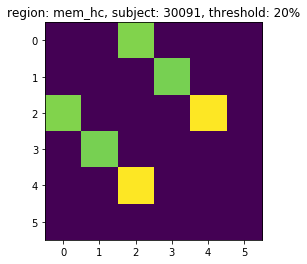

(6,)
    pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0            0.0   30004           NaN           NaN
1            NaN   30004           0.0           NaN
2            NaN   30004           NaN           0.0
3            0.0   30008           NaN           NaN
4            NaN   30008           0.0           NaN
5            NaN   30008           NaN           0.0
6            0.0   30009           NaN           NaN
7            NaN   30009           0.0           NaN
8            NaN   30009           NaN           0.0
9            0.0   30015           NaN           NaN
10           NaN   30015           0.0           NaN
11           NaN   30015           NaN           0.0
12           0.0   30019           NaN           NaN
13           NaN   30019           0.0           NaN
14           NaN   30019           NaN           0.0
15           0.0   30020           NaN           NaN
16           NaN   30020           0.0           NaN
17           NaN   30020           NaN   

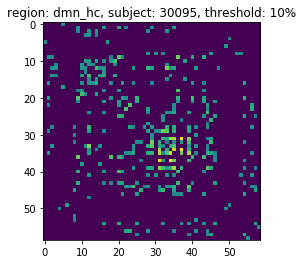

(59,)


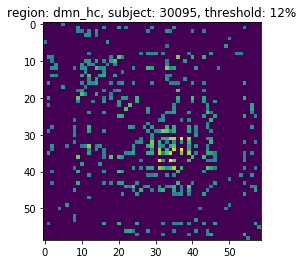

(59,)


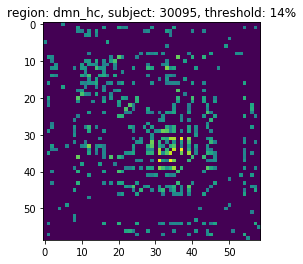

(59,)


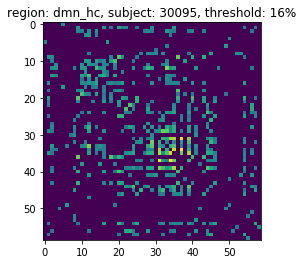

(59,)


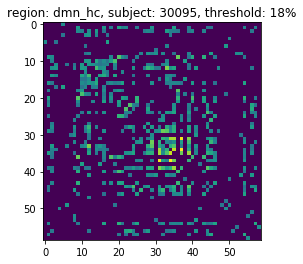

(59,)


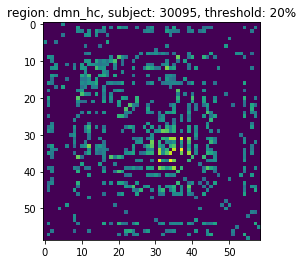

(59,)
(26, 26, 89)


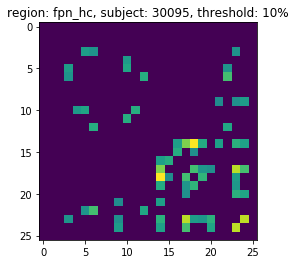

(26,)


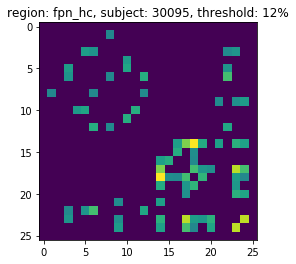

(26,)


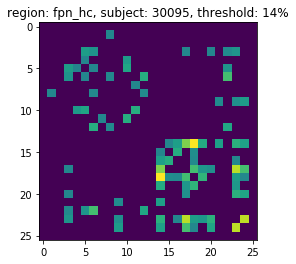

(26,)


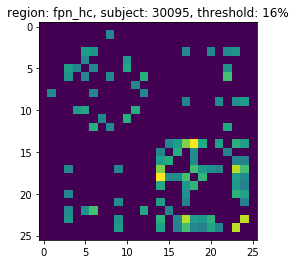

(26,)


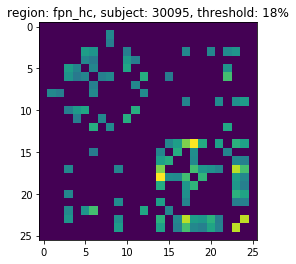

(26,)


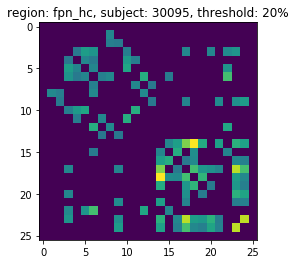

(26,)
(6, 6, 89)


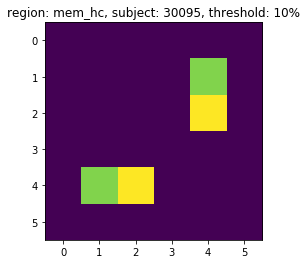

(6,)


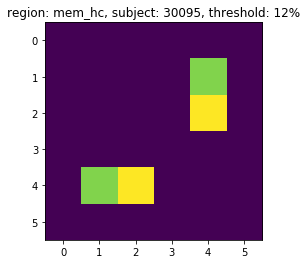

(6,)


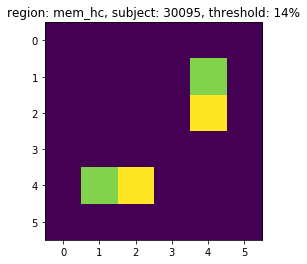

(6,)


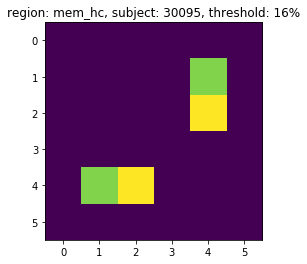

(6,)


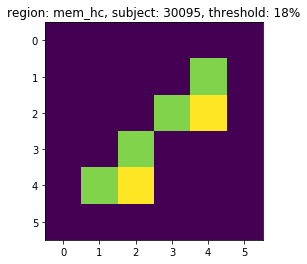

(6,)


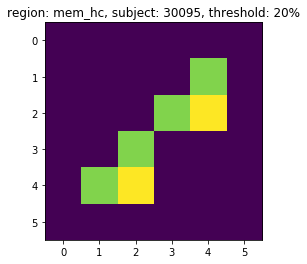

(6,)
    pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0            0.0   30004           NaN           NaN
1            NaN   30004           0.0           NaN
2            NaN   30004           NaN           0.0
3            0.0   30008           NaN           NaN
4            NaN   30008           0.0           NaN
5            NaN   30008           NaN           0.0
6            0.0   30009           NaN           NaN
7            NaN   30009           0.0           NaN
8            NaN   30009           NaN           0.0
9            0.0   30015           NaN           NaN
10           NaN   30015           0.0           NaN
11           NaN   30015           NaN           0.0
12           0.0   30019           NaN           NaN
13           NaN   30019           0.0           NaN
14           NaN   30019           NaN           0.0
15           0.0   30020           NaN           NaN
16           NaN   30020           0.0           NaN
17           NaN   30020           NaN   

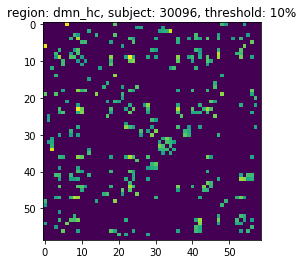

(59,)


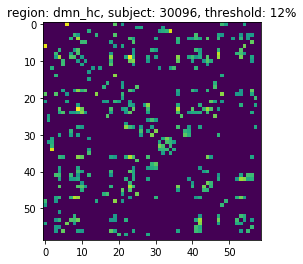

(59,)


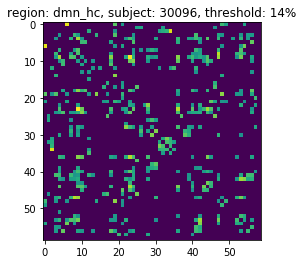

(59,)


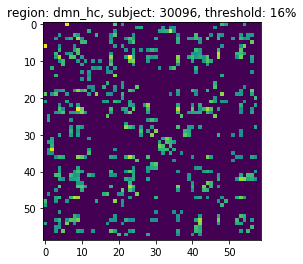

(59,)


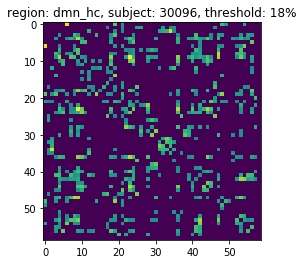

(59,)


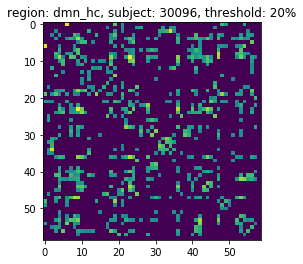

(59,)
(26, 26, 89)


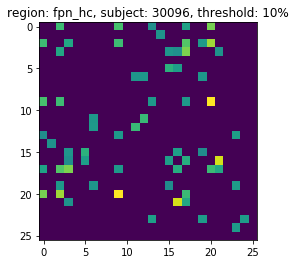

(26,)


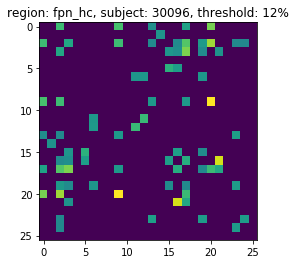

(26,)


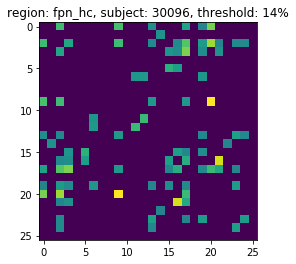

(26,)


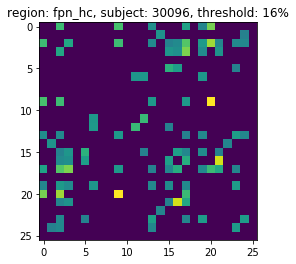

(26,)


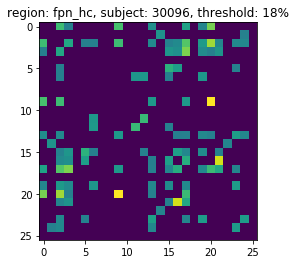

(26,)


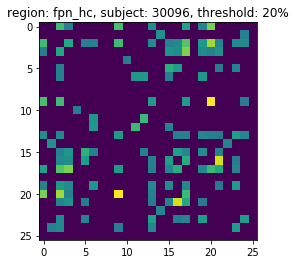

(26,)
(6, 6, 89)


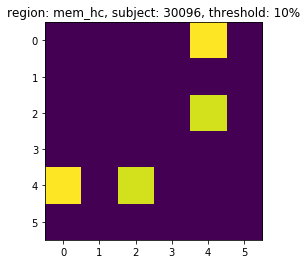

(6,)


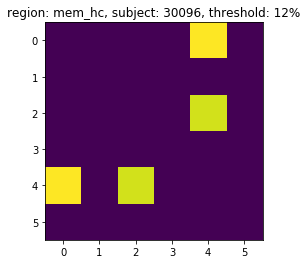

(6,)


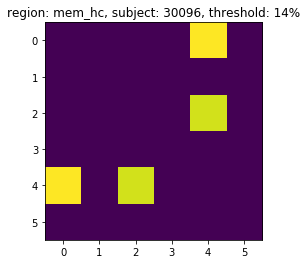

(6,)


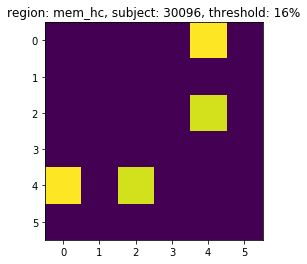

(6,)


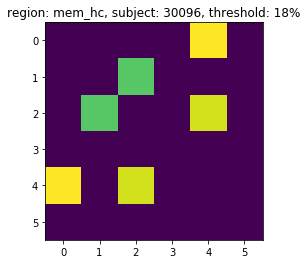

(6,)


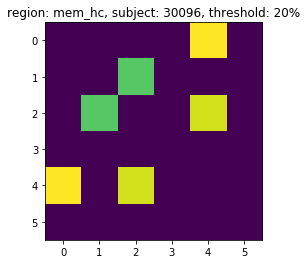

(6,)
    pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0            0.0   30004           NaN           NaN
1            NaN   30004           0.0           NaN
2            NaN   30004           NaN           0.0
3            0.0   30008           NaN           NaN
4            NaN   30008           0.0           NaN
5            NaN   30008           NaN           0.0
6            0.0   30009           NaN           NaN
7            NaN   30009           0.0           NaN
8            NaN   30009           NaN           0.0
9            0.0   30015           NaN           NaN
10           NaN   30015           0.0           NaN
11           NaN   30015           NaN           0.0
12           0.0   30019           NaN           NaN
13           NaN   30019           0.0           NaN
14           NaN   30019           NaN           0.0
15           0.0   30020           NaN           NaN
16           NaN   30020           0.0           NaN
17           NaN   30020           NaN   

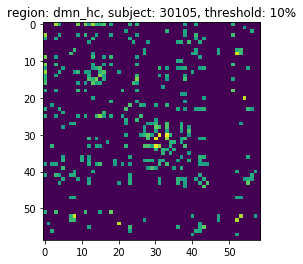

(59,)


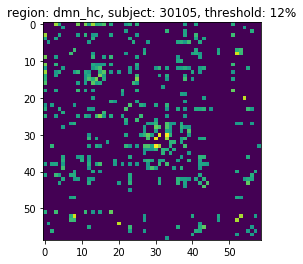

(59,)


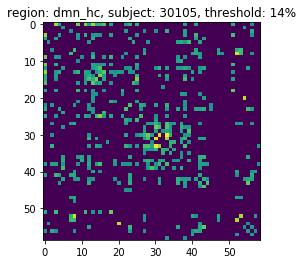

(59,)


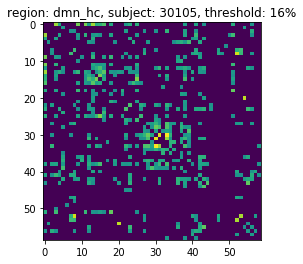

(59,)


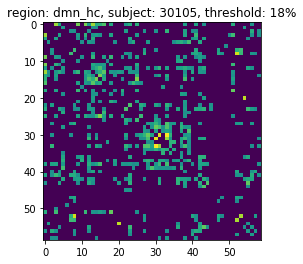

(59,)


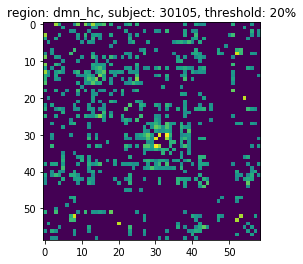

(59,)
(26, 26, 89)


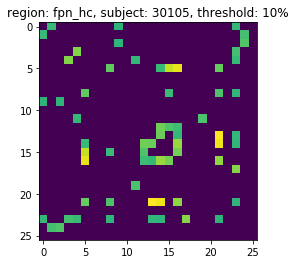

(26,)


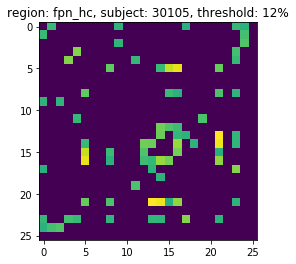

(26,)


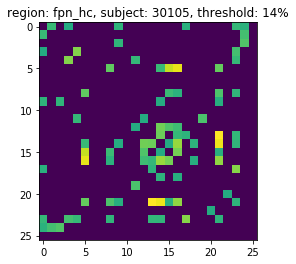

(26,)


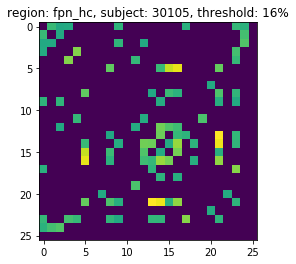

(26,)


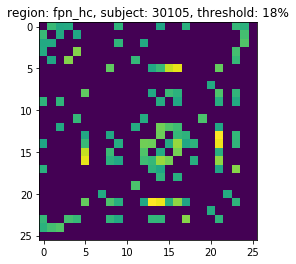

(26,)


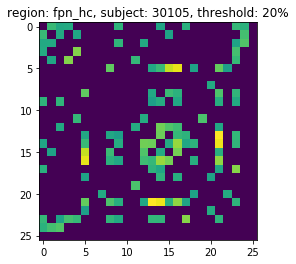

(26,)
(6, 6, 89)


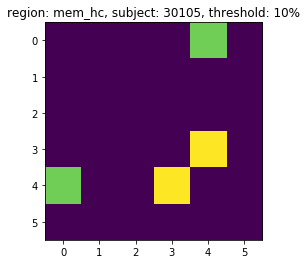

(6,)


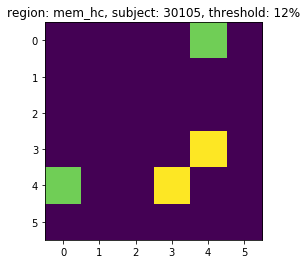

(6,)


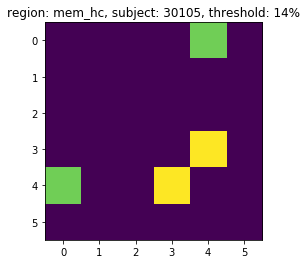

(6,)


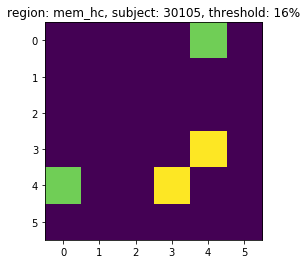

(6,)


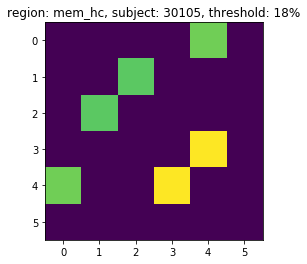

(6,)


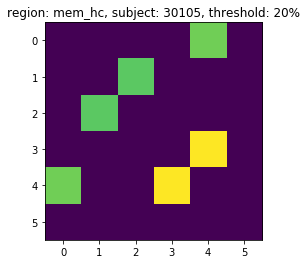

(6,)
    pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0            0.0   30004           NaN           NaN
1            NaN   30004           0.0           NaN
2            NaN   30004           NaN           0.0
3            0.0   30008           NaN           NaN
4            NaN   30008           0.0           NaN
5            NaN   30008           NaN           0.0
6            0.0   30009           NaN           NaN
7            NaN   30009           0.0           NaN
8            NaN   30009           NaN           0.0
9            0.0   30015           NaN           NaN
10           NaN   30015           0.0           NaN
11           NaN   30015           NaN           0.0
12           0.0   30019           NaN           NaN
13           NaN   30019           0.0           NaN
14           NaN   30019           NaN           0.0
15           0.0   30020           NaN           NaN
16           NaN   30020           0.0           NaN
17           NaN   30020           NaN   

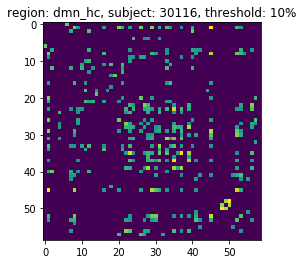

(59,)


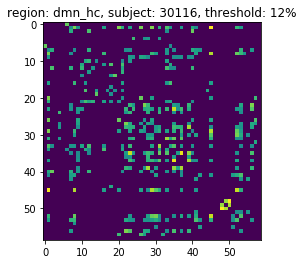

(59,)


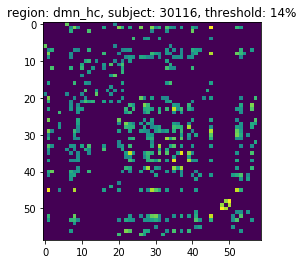

(59,)


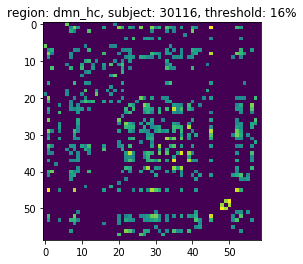

(59,)


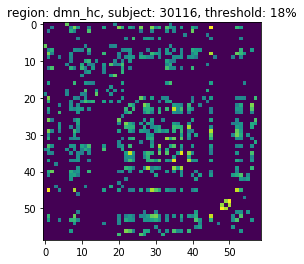

(59,)


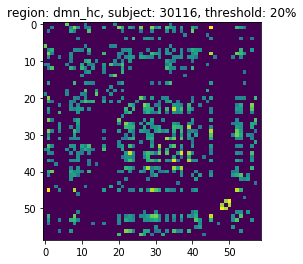

(59,)
(26, 26, 89)


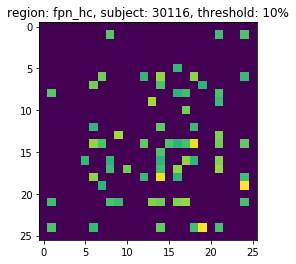

(26,)


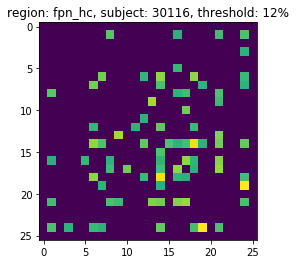

(26,)


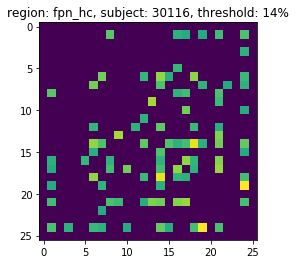

(26,)


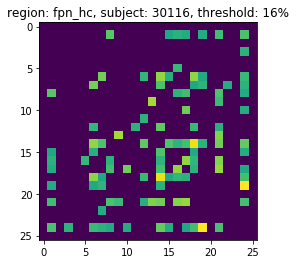

(26,)


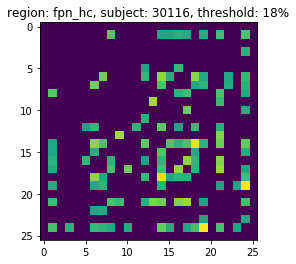

(26,)


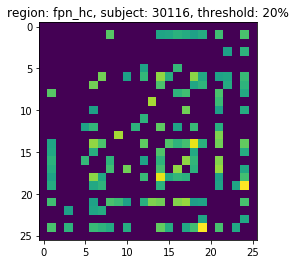

(26,)
(6, 6, 89)


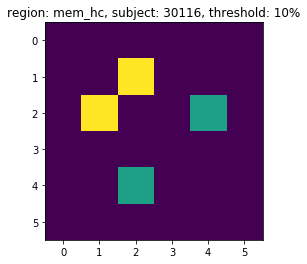

(6,)


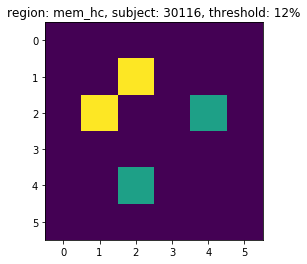

(6,)


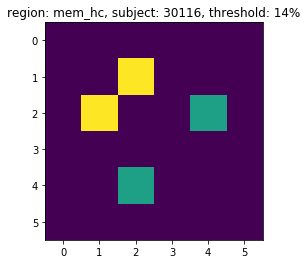

(6,)


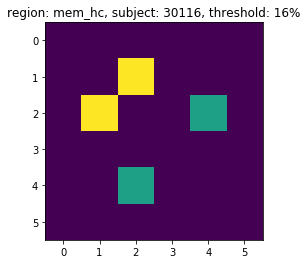

(6,)


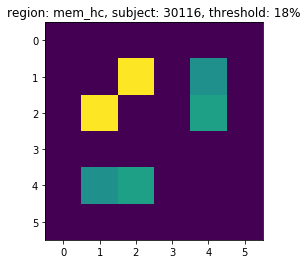

(6,)


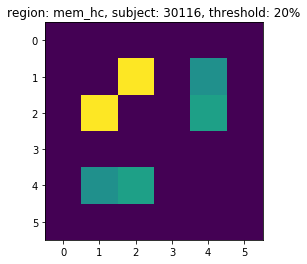

(6,)
    pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0            0.0   30004           NaN           NaN
1            NaN   30004           0.0           NaN
2            NaN   30004           NaN           0.0
3            0.0   30008           NaN           NaN
4            NaN   30008           0.0           NaN
5            NaN   30008           NaN           0.0
6            0.0   30009           NaN           NaN
7            NaN   30009           0.0           NaN
8            NaN   30009           NaN           0.0
9            0.0   30015           NaN           NaN
10           NaN   30015           0.0           NaN
11           NaN   30015           NaN           0.0
12           0.0   30019           NaN           NaN
13           NaN   30019           0.0           NaN
14           NaN   30019           NaN           0.0
15           0.0   30020           NaN           NaN
16           NaN   30020           0.0           NaN
17           NaN   30020           NaN   

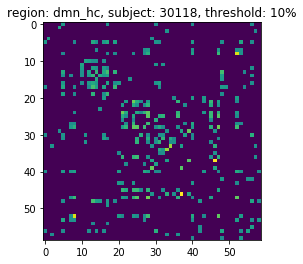

(59,)


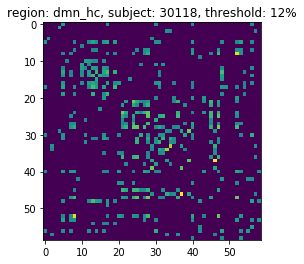

(59,)


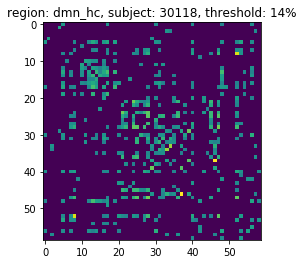

(59,)


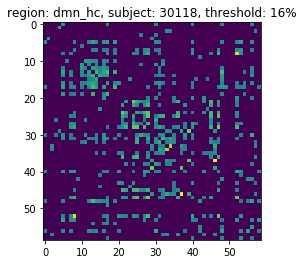

(59,)


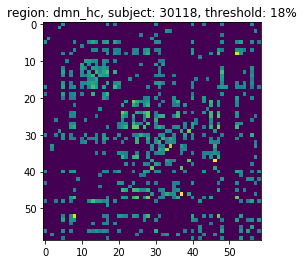

(59,)


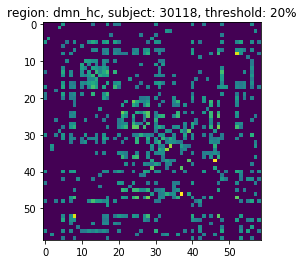

(59,)
(26, 26, 89)


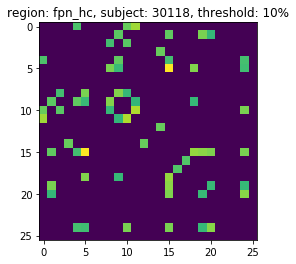

(26,)


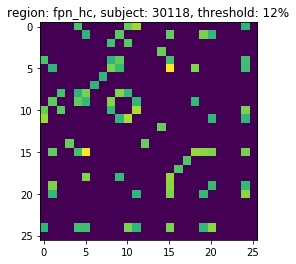

(26,)


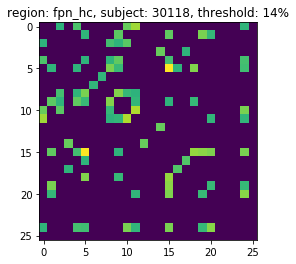

(26,)


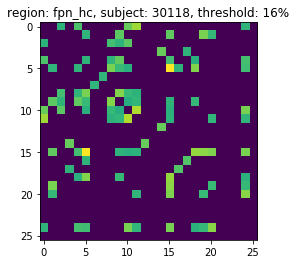

(26,)


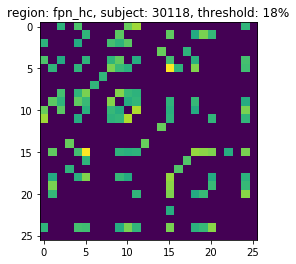

(26,)


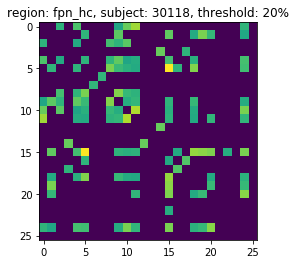

(26,)
(6, 6, 89)


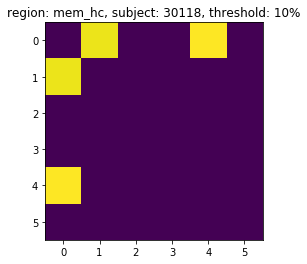

(6,)


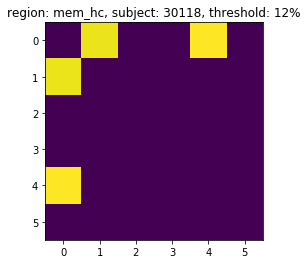

(6,)


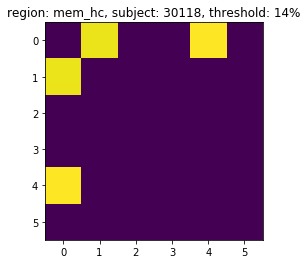

(6,)


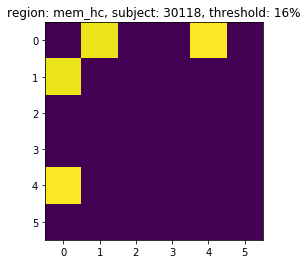

(6,)


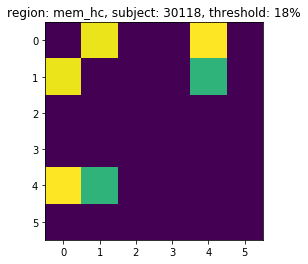

(6,)


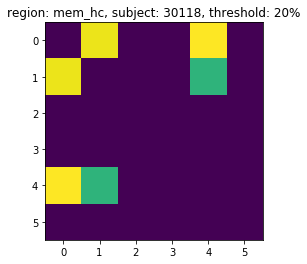

(6,)
    pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0            0.0   30004           NaN           NaN
1            NaN   30004           0.0           NaN
2            NaN   30004           NaN           0.0
3            0.0   30008           NaN           NaN
4            NaN   30008           0.0           NaN
5            NaN   30008           NaN           0.0
6            0.0   30009           NaN           NaN
7            NaN   30009           0.0           NaN
8            NaN   30009           NaN           0.0
9            0.0   30015           NaN           NaN
10           NaN   30015           0.0           NaN
11           NaN   30015           NaN           0.0
12           0.0   30019           NaN           NaN
13           NaN   30019           0.0           NaN
14           NaN   30019           NaN           0.0
15           0.0   30020           NaN           NaN
16           NaN   30020           0.0           NaN
17           NaN   30020           NaN   

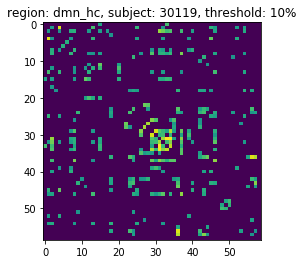

(59,)


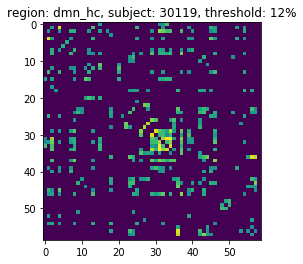

(59,)


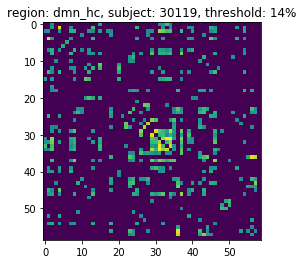

(59,)


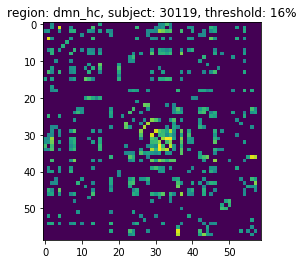

(59,)


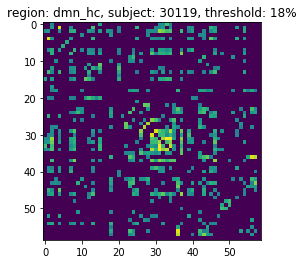

(59,)


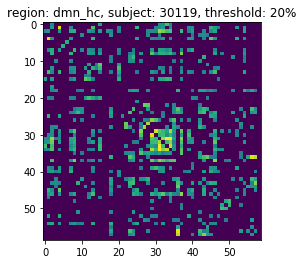

(59,)
(26, 26, 89)


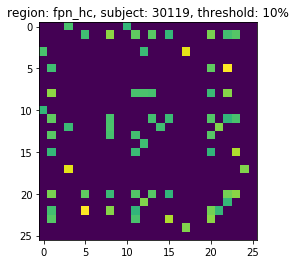

(26,)


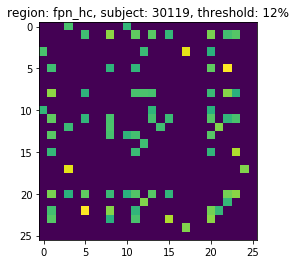

(26,)


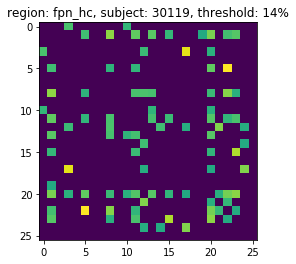

(26,)


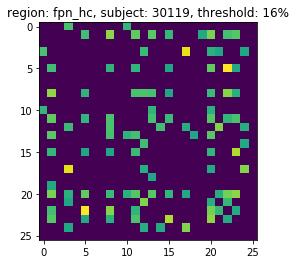

(26,)


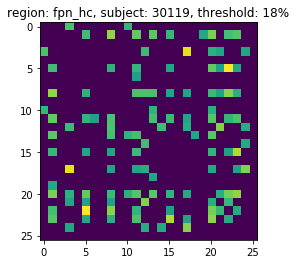

(26,)


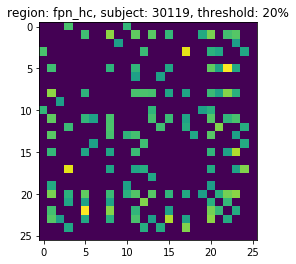

(26,)
(6, 6, 89)


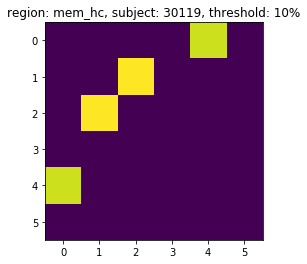

(6,)


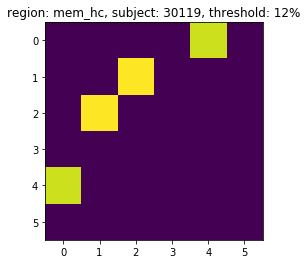

(6,)


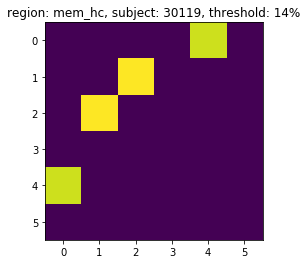

(6,)


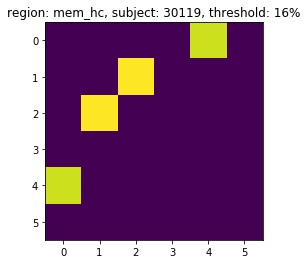

(6,)


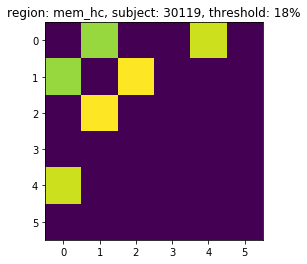

(6,)


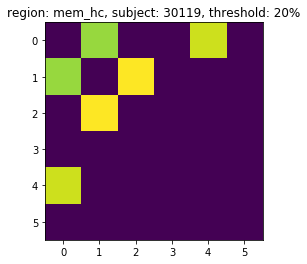

(6,)
    pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0            0.0   30004           NaN           NaN
1            NaN   30004           0.0           NaN
2            NaN   30004           NaN           0.0
3            0.0   30008           NaN           NaN
4            NaN   30008           0.0           NaN
5            NaN   30008           NaN           0.0
6            0.0   30009           NaN           NaN
7            NaN   30009           0.0           NaN
8            NaN   30009           NaN           0.0
9            0.0   30015           NaN           NaN
10           NaN   30015           0.0           NaN
11           NaN   30015           NaN           0.0
12           0.0   30019           NaN           NaN
13           NaN   30019           0.0           NaN
14           NaN   30019           NaN           0.0
15           0.0   30020           NaN           NaN
16           NaN   30020           0.0           NaN
17           NaN   30020           NaN   

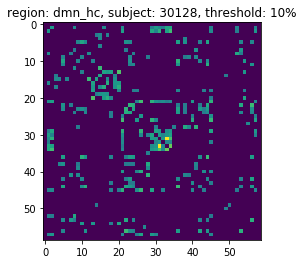

(59,)


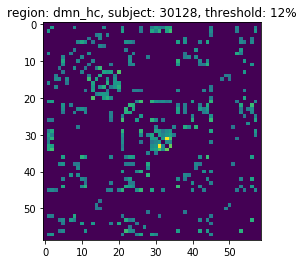

(59,)


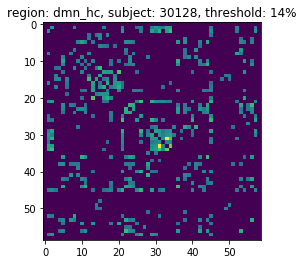

(59,)


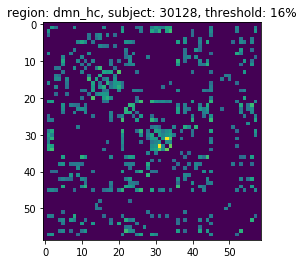

(59,)


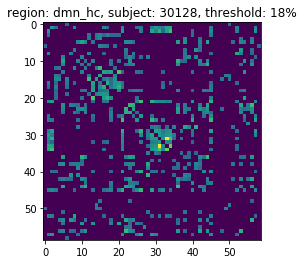

(59,)


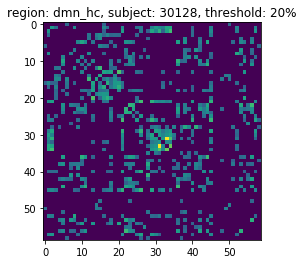

(59,)
(26, 26, 89)


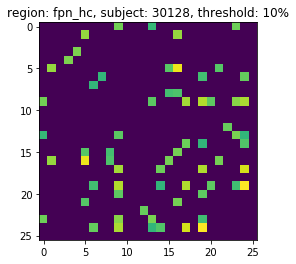

(26,)


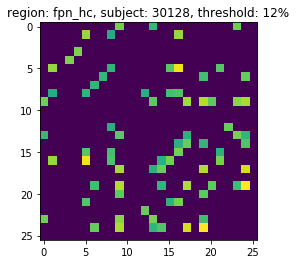

(26,)


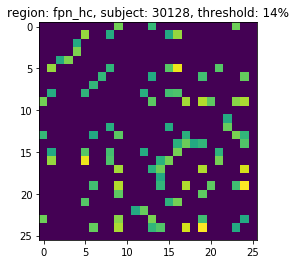

(26,)


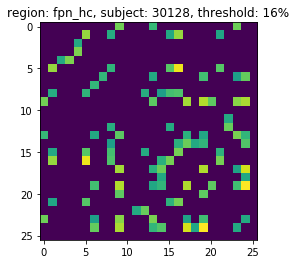

(26,)


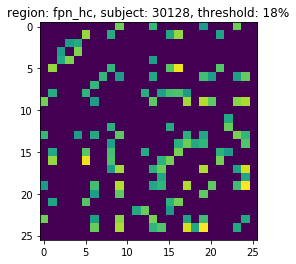

(26,)


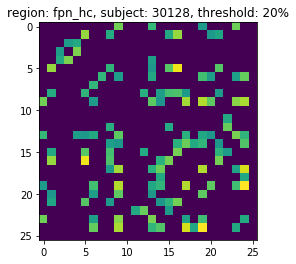

(26,)
(6, 6, 89)


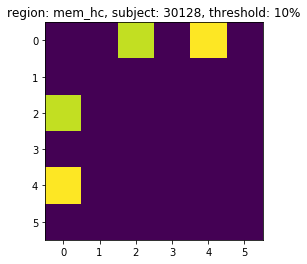

(6,)


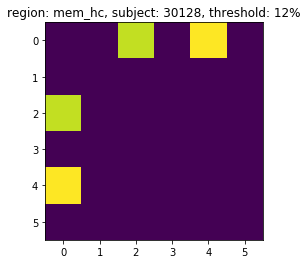

(6,)


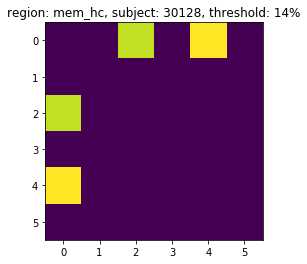

(6,)


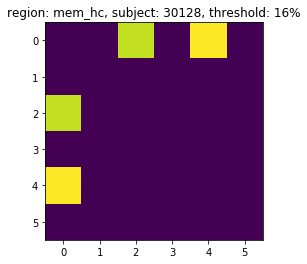

(6,)


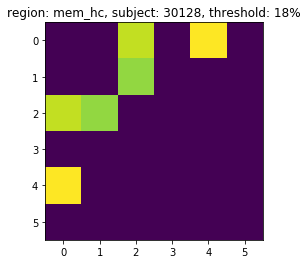

(6,)


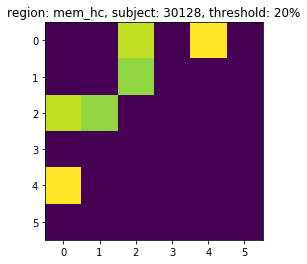

(6,)
    pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0            0.0   30004           NaN           NaN
1            NaN   30004           0.0           NaN
2            NaN   30004           NaN           0.0
3            0.0   30008           NaN           NaN
4            NaN   30008           0.0           NaN
5            NaN   30008           NaN           0.0
6            0.0   30009           NaN           NaN
7            NaN   30009           0.0           NaN
8            NaN   30009           NaN           0.0
9            0.0   30015           NaN           NaN
10           NaN   30015           0.0           NaN
11           NaN   30015           NaN           0.0
12           0.0   30019           NaN           NaN
13           NaN   30019           0.0           NaN
14           NaN   30019           NaN           0.0
15           0.0   30020           NaN           NaN
16           NaN   30020           0.0           NaN
17           NaN   30020           NaN   

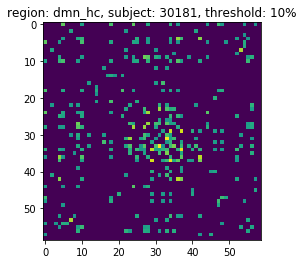

(59,)


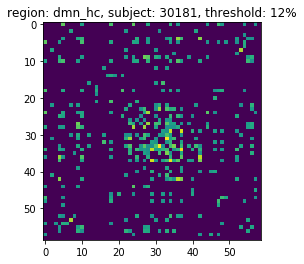

(59,)


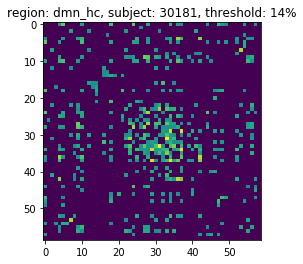

(59,)


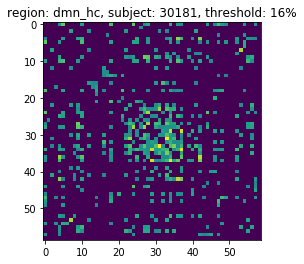

(59,)


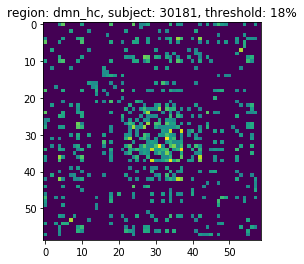

(59,)


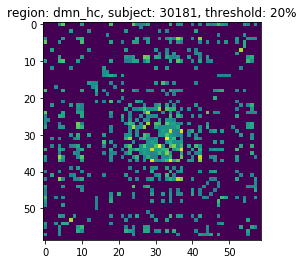

(59,)
(26, 26, 89)


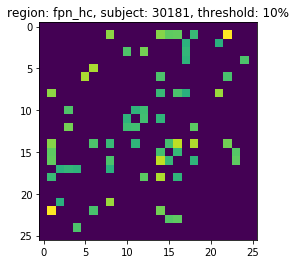

(26,)


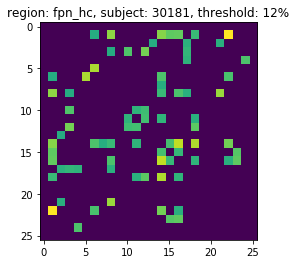

(26,)


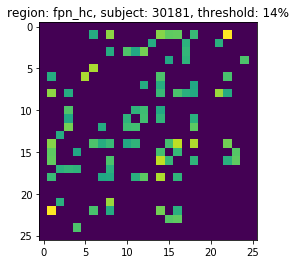

(26,)


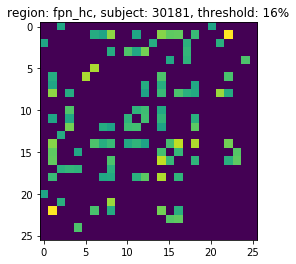

(26,)


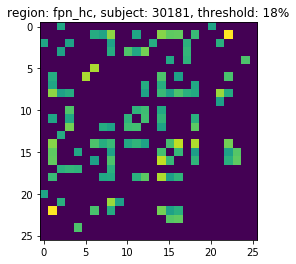

(26,)


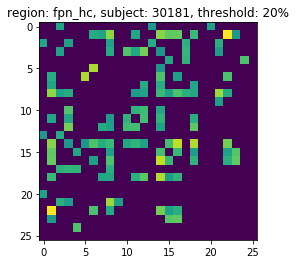

(26,)
(6, 6, 89)


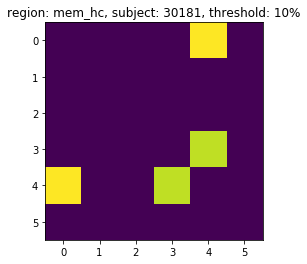

(6,)


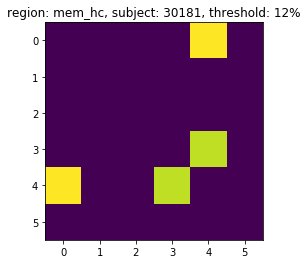

(6,)


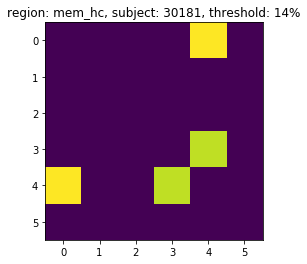

(6,)


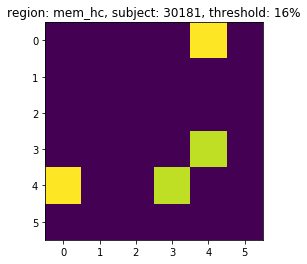

(6,)


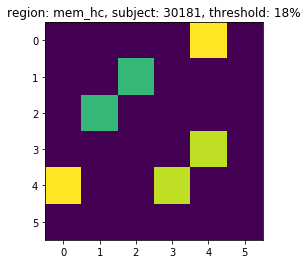

(6,)


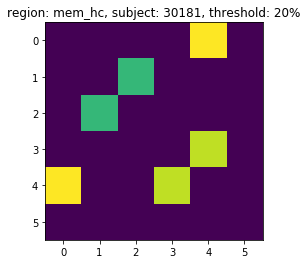

(6,)
    pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0            0.0   30004           NaN           NaN
1            NaN   30004           0.0           NaN
2            NaN   30004           NaN           0.0
3            0.0   30008           NaN           NaN
4            NaN   30008           0.0           NaN
5            NaN   30008           NaN           0.0
6            0.0   30009           NaN           NaN
7            NaN   30009           0.0           NaN
8            NaN   30009           NaN           0.0
9            0.0   30015           NaN           NaN
10           NaN   30015           0.0           NaN
11           NaN   30015           NaN           0.0
12           0.0   30019           NaN           NaN
13           NaN   30019           0.0           NaN
14           NaN   30019           NaN           0.0
15           0.0   30020           NaN           NaN
16           NaN   30020           0.0           NaN
17           NaN   30020           NaN   

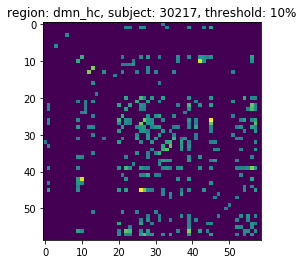

(59,)


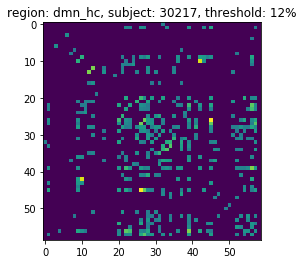

(59,)


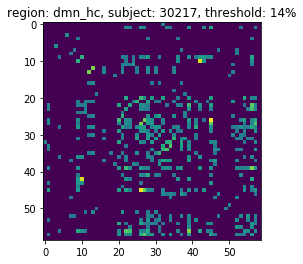

(59,)


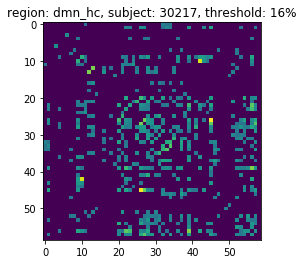

(59,)


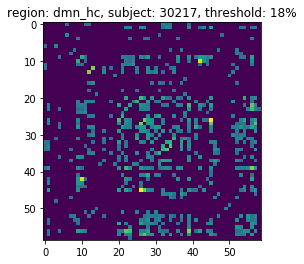

(59,)


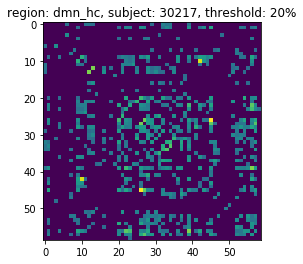

(59,)
(26, 26, 89)


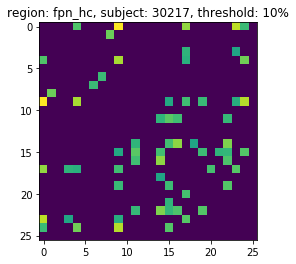

(26,)


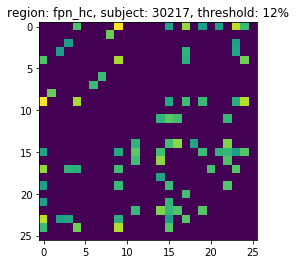

(26,)


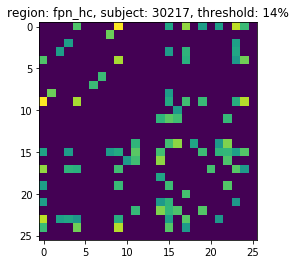

(26,)


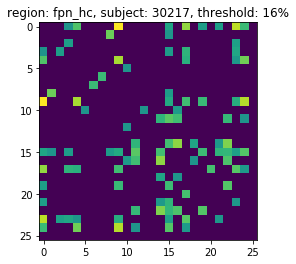

(26,)


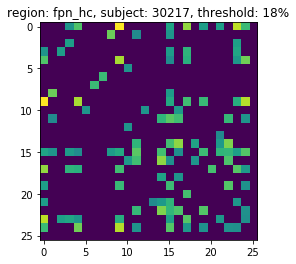

(26,)


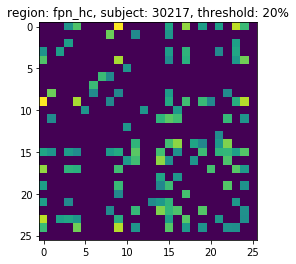

(26,)
(6, 6, 89)


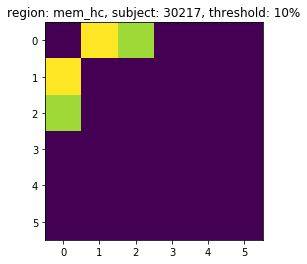

(6,)


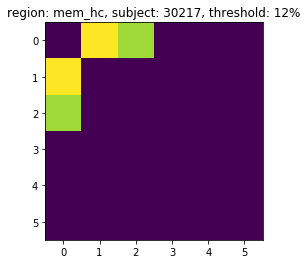

(6,)


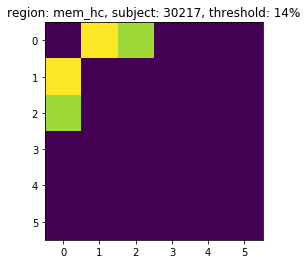

(6,)


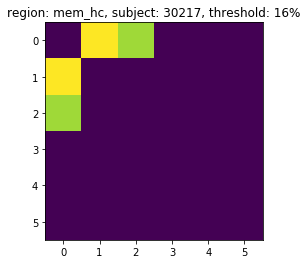

(6,)


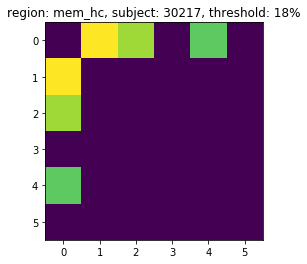

(6,)


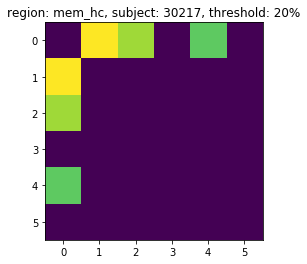

(6,)
    pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0            0.0   30004           NaN           NaN
1            NaN   30004           0.0           NaN
2            NaN   30004           NaN           0.0
3            0.0   30008           NaN           NaN
4            NaN   30008           0.0           NaN
5            NaN   30008           NaN           0.0
6            0.0   30009           NaN           NaN
7            NaN   30009           0.0           NaN
8            NaN   30009           NaN           0.0
9            0.0   30015           NaN           NaN
10           NaN   30015           0.0           NaN
11           NaN   30015           NaN           0.0
12           0.0   30019           NaN           NaN
13           NaN   30019           0.0           NaN
14           NaN   30019           NaN           0.0
15           0.0   30020           NaN           NaN
16           NaN   30020           0.0           NaN
17           NaN   30020           NaN   

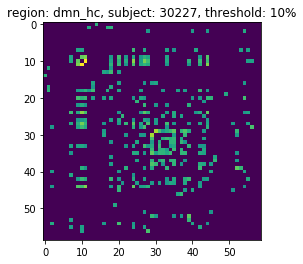

(59,)


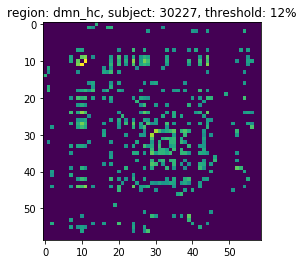

(59,)


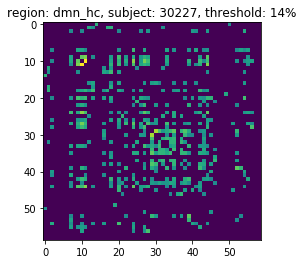

(59,)


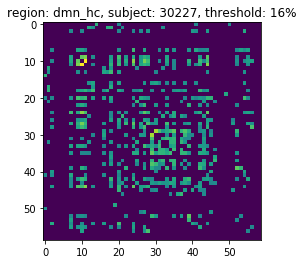

(59,)


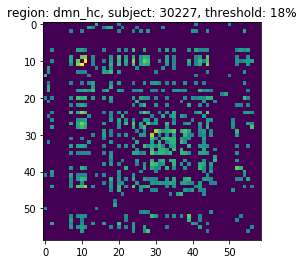

(59,)


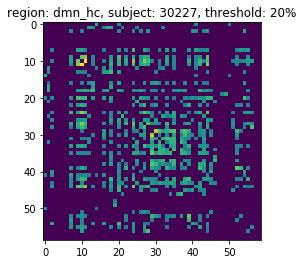

(59,)
(26, 26, 89)


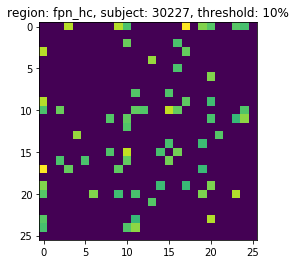

(26,)


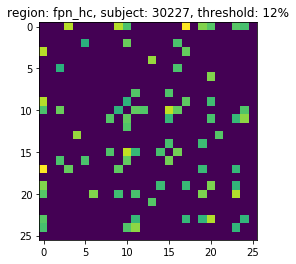

(26,)


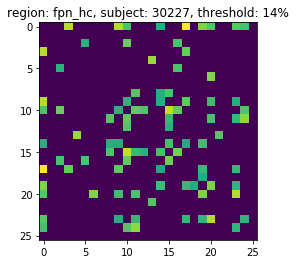

(26,)


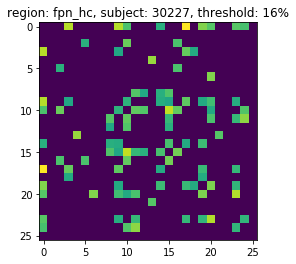

(26,)


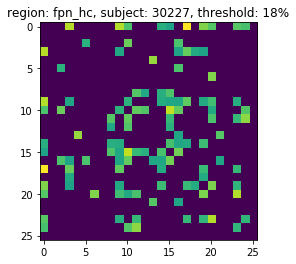

(26,)


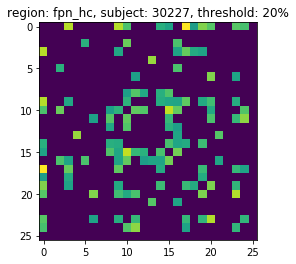

(26,)
(6, 6, 89)


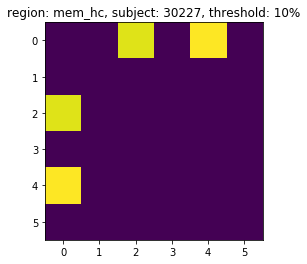

(6,)


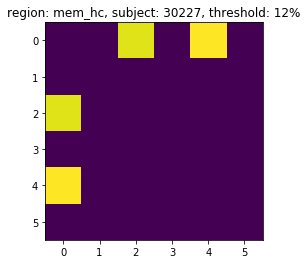

(6,)


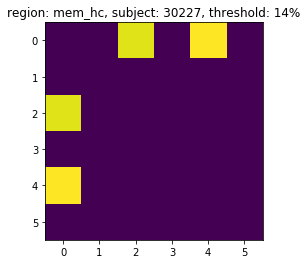

(6,)


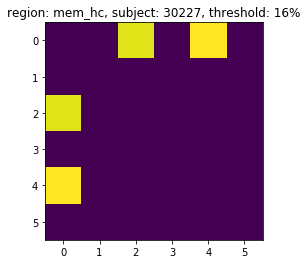

(6,)


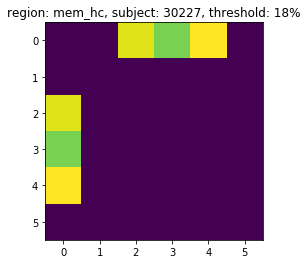

(6,)


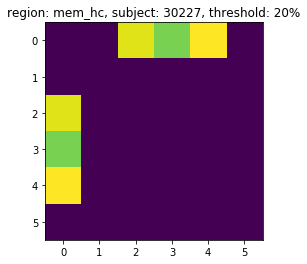

(6,)
    pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0            0.0   30004           NaN           NaN
1            NaN   30004           0.0           NaN
2            NaN   30004           NaN           0.0
3            0.0   30008           NaN           NaN
4            NaN   30008           0.0           NaN
5            NaN   30008           NaN           0.0
6            0.0   30009           NaN           NaN
7            NaN   30009           0.0           NaN
8            NaN   30009           NaN           0.0
9            0.0   30015           NaN           NaN
10           NaN   30015           0.0           NaN
11           NaN   30015           NaN           0.0
12           0.0   30019           NaN           NaN
13           NaN   30019           0.0           NaN
14           NaN   30019           NaN           0.0
15           0.0   30020           NaN           NaN
16           NaN   30020           0.0           NaN
17           NaN   30020           NaN   

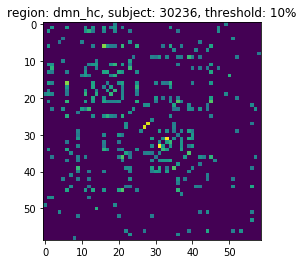

(59,)


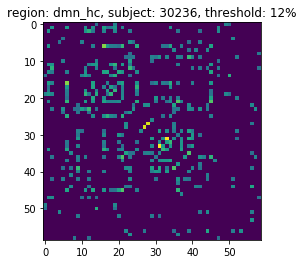

(59,)


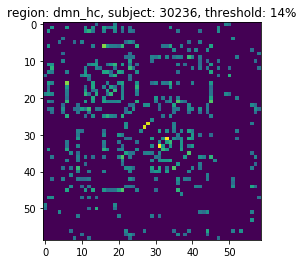

(59,)


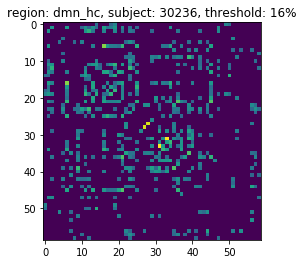

(59,)


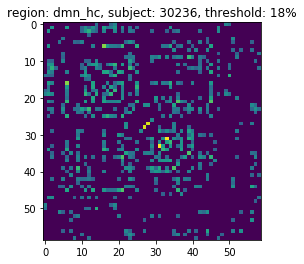

(59,)


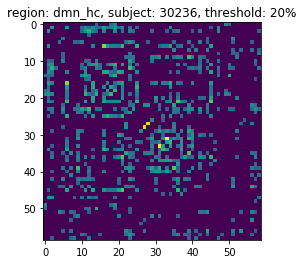

(59,)
(26, 26, 89)


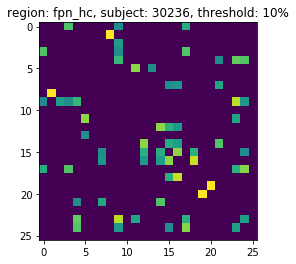

(26,)


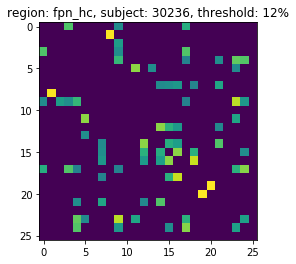

(26,)


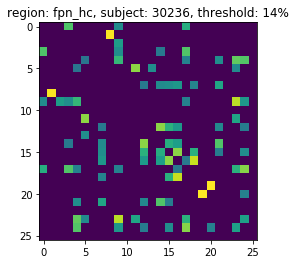

(26,)


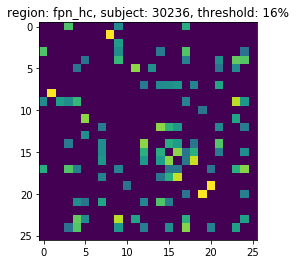

(26,)


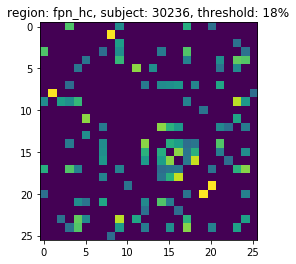

(26,)


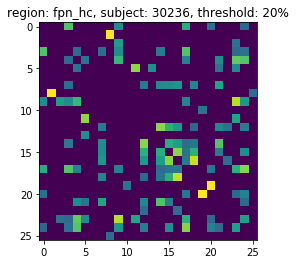

(26,)
(6, 6, 89)


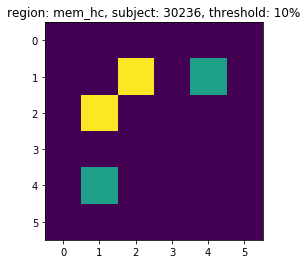

(6,)


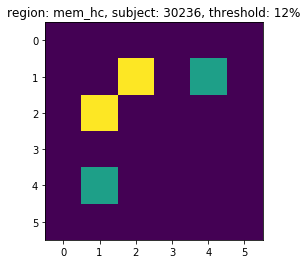

(6,)


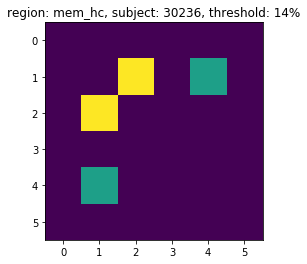

(6,)


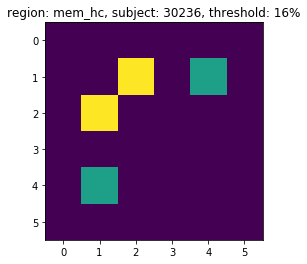

(6,)


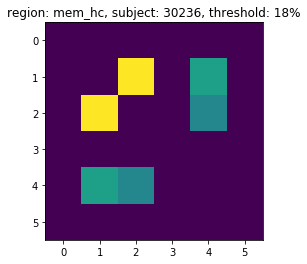

(6,)


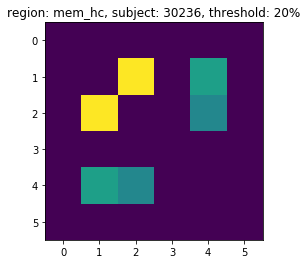

(6,)
    pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0            0.0   30004           NaN           NaN
1            NaN   30004           0.0           NaN
2            NaN   30004           NaN           0.0
3            0.0   30008           NaN           NaN
4            NaN   30008           0.0           NaN
5            NaN   30008           NaN           0.0
6            0.0   30009           NaN           NaN
7            NaN   30009           0.0           NaN
8            NaN   30009           NaN           0.0
9            0.0   30015           NaN           NaN
10           NaN   30015           0.0           NaN
11           NaN   30015           NaN           0.0
12           0.0   30019           NaN           NaN
13           NaN   30019           0.0           NaN
14           NaN   30019           NaN           0.0
15           0.0   30020           NaN           NaN
16           NaN   30020           0.0           NaN
17           NaN   30020           NaN   

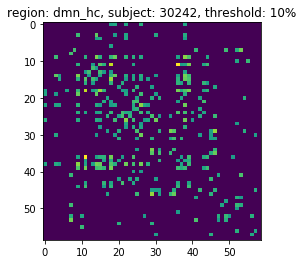

(59,)


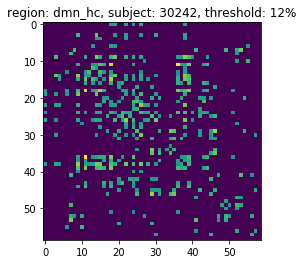

(59,)


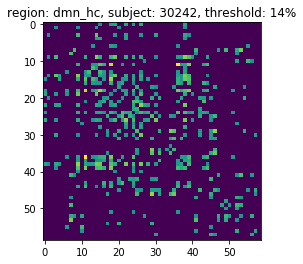

(59,)


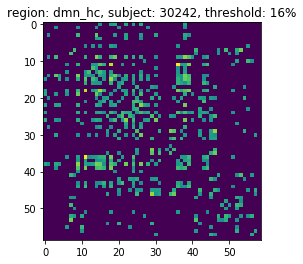

(59,)


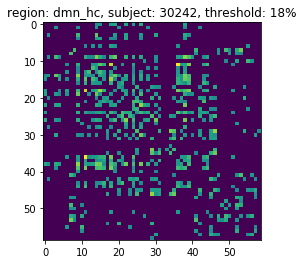

(59,)


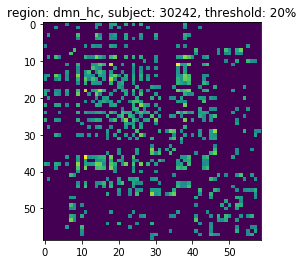

(59,)
(26, 26, 89)


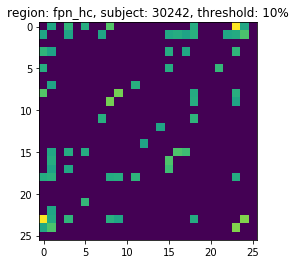

(26,)


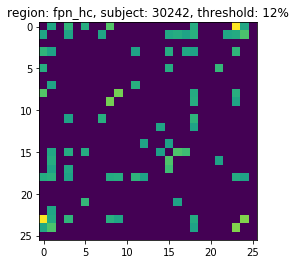

(26,)


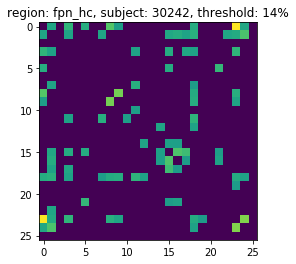

(26,)


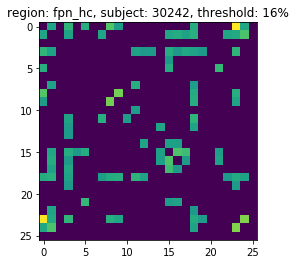

(26,)


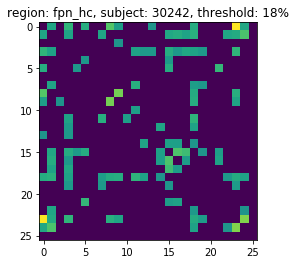

(26,)


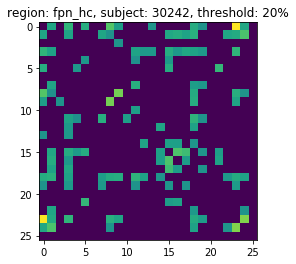

(26,)
(6, 6, 89)


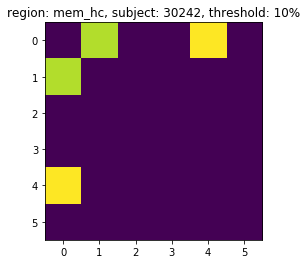

(6,)


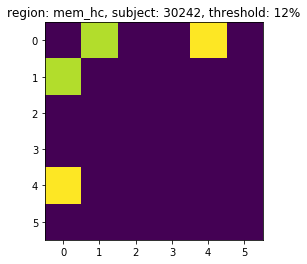

(6,)


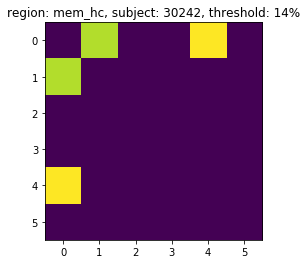

(6,)


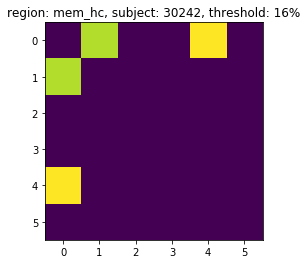

(6,)


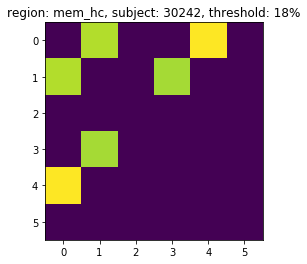

(6,)


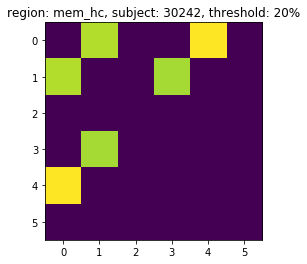

(6,)
    pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0            0.0   30004           NaN           NaN
1            NaN   30004           0.0           NaN
2            NaN   30004           NaN           0.0
3            0.0   30008           NaN           NaN
4            NaN   30008           0.0           NaN
5            NaN   30008           NaN           0.0
6            0.0   30009           NaN           NaN
7            NaN   30009           0.0           NaN
8            NaN   30009           NaN           0.0
9            0.0   30015           NaN           NaN
10           NaN   30015           0.0           NaN
11           NaN   30015           NaN           0.0
12           0.0   30019           NaN           NaN
13           NaN   30019           0.0           NaN
14           NaN   30019           NaN           0.0
15           0.0   30020           NaN           NaN
16           NaN   30020           0.0           NaN
17           NaN   30020           NaN   

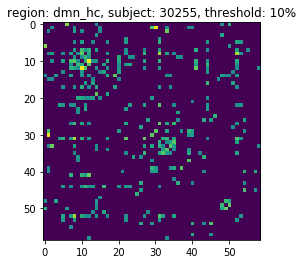

(59,)


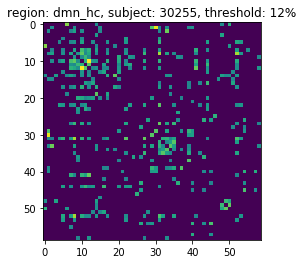

(59,)


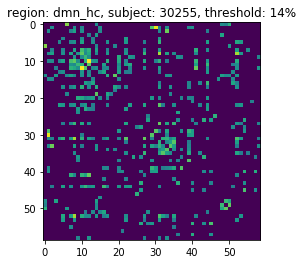

(59,)


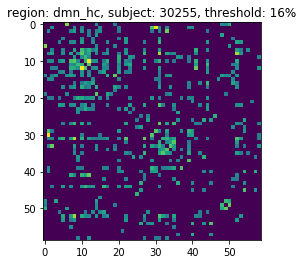

(59,)


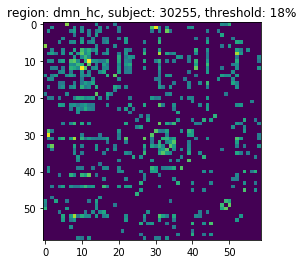

(59,)


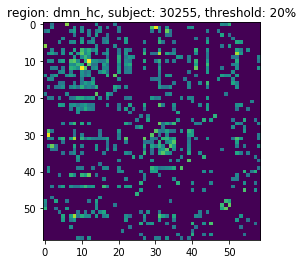

(59,)
(26, 26, 89)


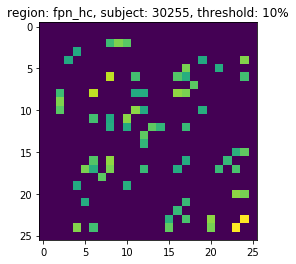

(26,)


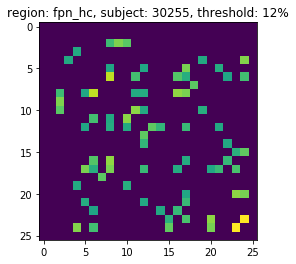

(26,)


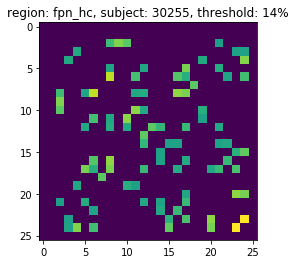

(26,)


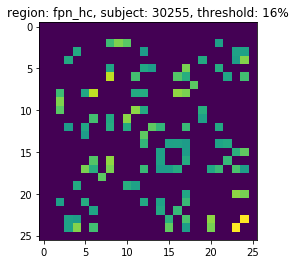

(26,)


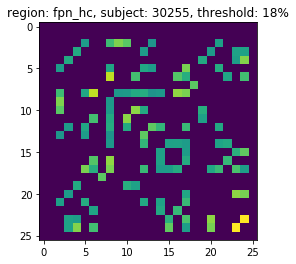

(26,)


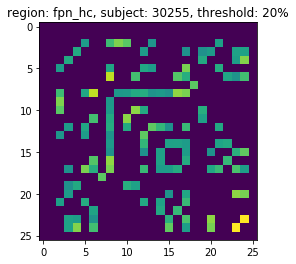

(26,)
(6, 6, 89)


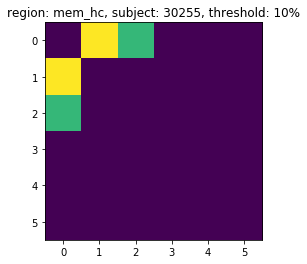

(6,)


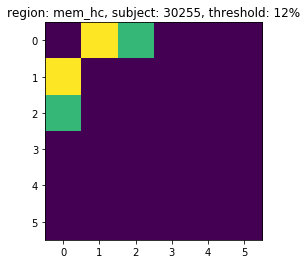

(6,)


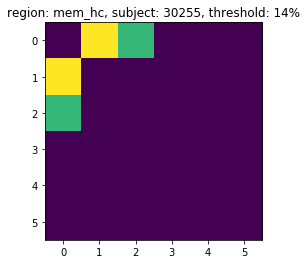

(6,)


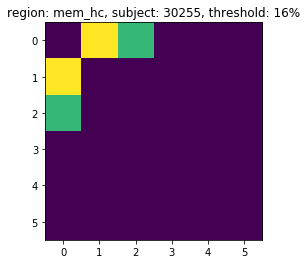

(6,)


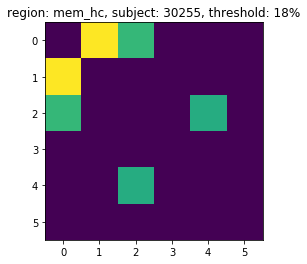

(6,)


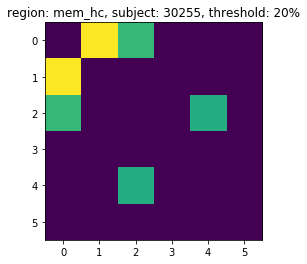

(6,)
    pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0            0.0   30004           NaN           NaN
1            NaN   30004           0.0           NaN
2            NaN   30004           NaN           0.0
3            0.0   30008           NaN           NaN
4            NaN   30008           0.0           NaN
5            NaN   30008           NaN           0.0
6            0.0   30009           NaN           NaN
7            NaN   30009           0.0           NaN
8            NaN   30009           NaN           0.0
9            0.0   30015           NaN           NaN
10           NaN   30015           0.0           NaN
11           NaN   30015           NaN           0.0
12           0.0   30019           NaN           NaN
13           NaN   30019           0.0           NaN
14           NaN   30019           NaN           0.0
15           0.0   30020           NaN           NaN
16           NaN   30020           0.0           NaN
17           NaN   30020           NaN   

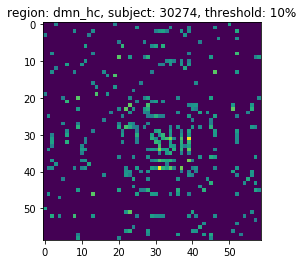

(59,)


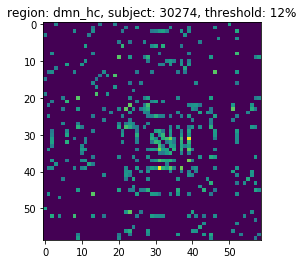

(59,)


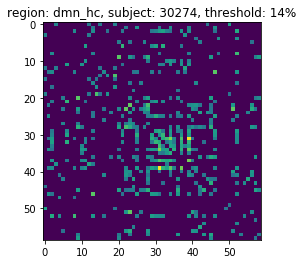

(59,)


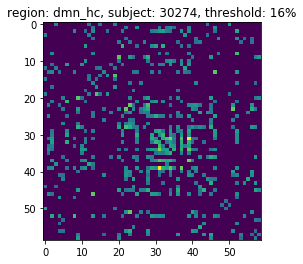

(59,)


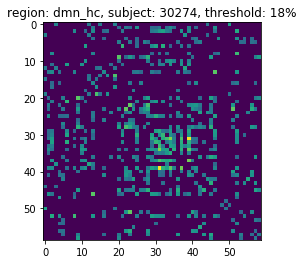

(59,)


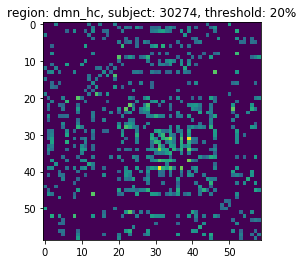

(59,)
(26, 26, 89)


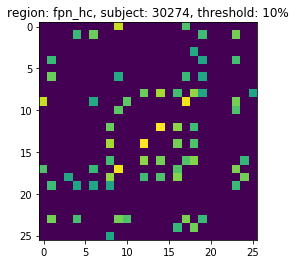

(26,)


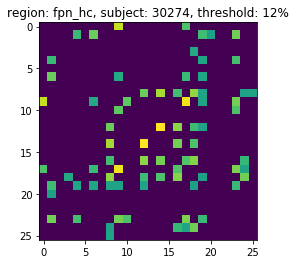

(26,)


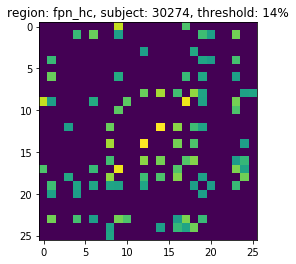

(26,)


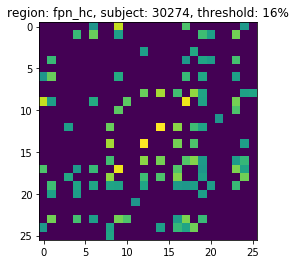

(26,)


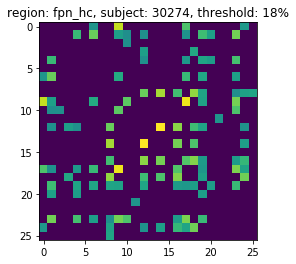

(26,)


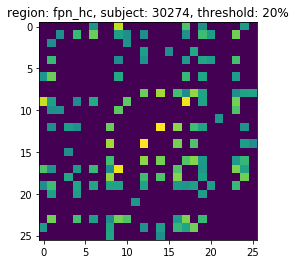

(26,)
(6, 6, 89)


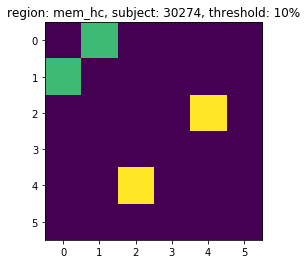

(6,)


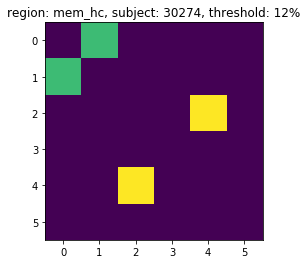

(6,)


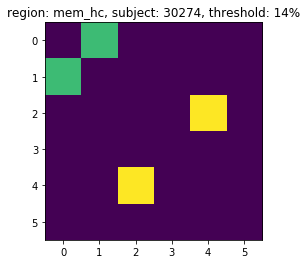

(6,)


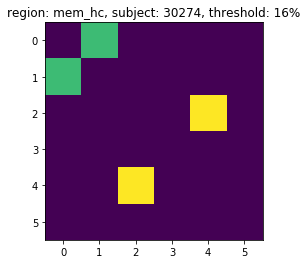

(6,)


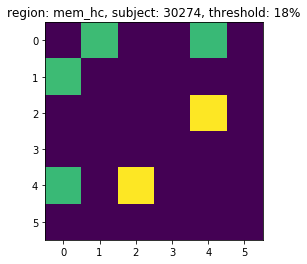

(6,)


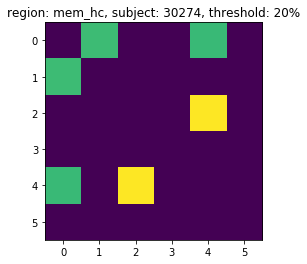

(6,)
    pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0            0.0   30004           NaN           NaN
1            NaN   30004           0.0           NaN
2            NaN   30004           NaN           0.0
3            0.0   30008           NaN           NaN
4            NaN   30008           0.0           NaN
5            NaN   30008           NaN           0.0
6            0.0   30009           NaN           NaN
7            NaN   30009           0.0           NaN
8            NaN   30009           NaN           0.0
9            0.0   30015           NaN           NaN
10           NaN   30015           0.0           NaN
11           NaN   30015           NaN           0.0
12           0.0   30019           NaN           NaN
13           NaN   30019           0.0           NaN
14           NaN   30019           NaN           0.0
15           0.0   30020           NaN           NaN
16           NaN   30020           0.0           NaN
17           NaN   30020           NaN   

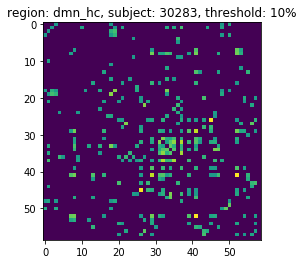

(59,)


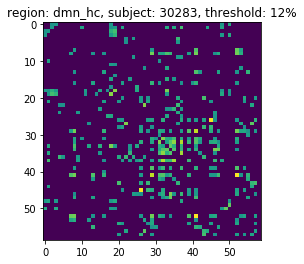

(59,)


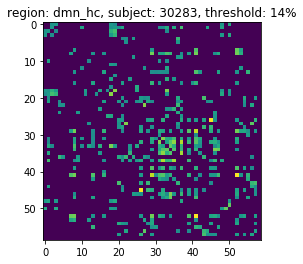

(59,)


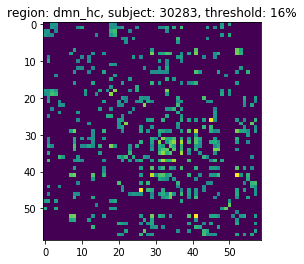

(59,)


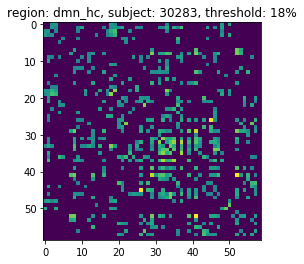

(59,)


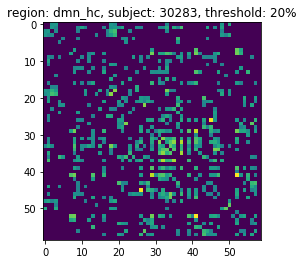

(59,)
(26, 26, 89)


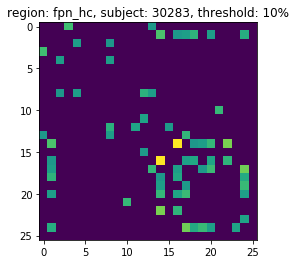

(26,)


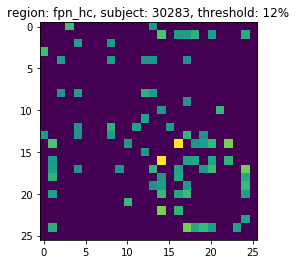

(26,)


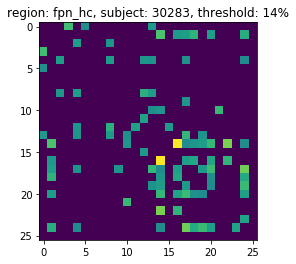

(26,)


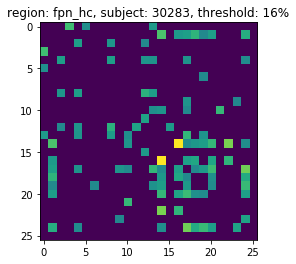

(26,)


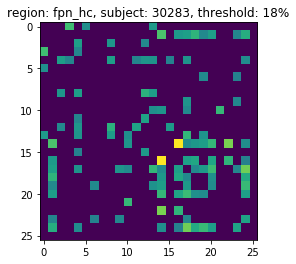

(26,)


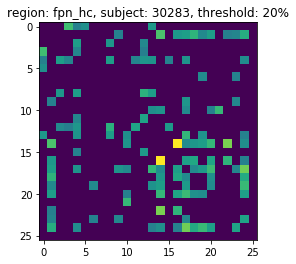

(26,)
(6, 6, 89)


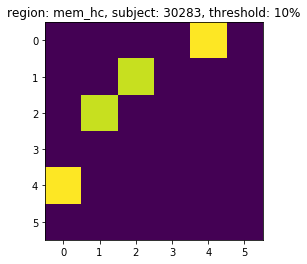

(6,)


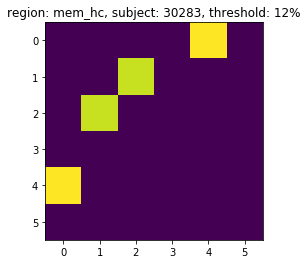

(6,)


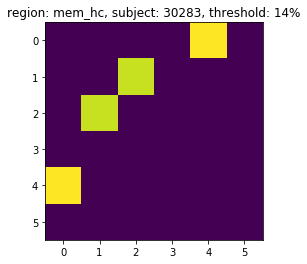

(6,)


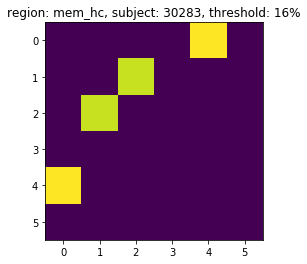

(6,)


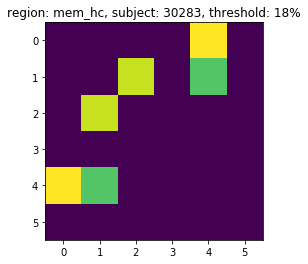

(6,)


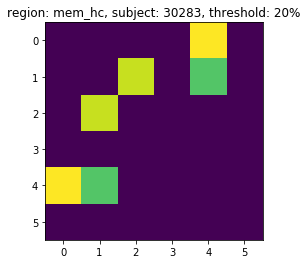

(6,)
    pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0            0.0   30004           NaN           NaN
1            NaN   30004           0.0           NaN
2            NaN   30004           NaN           0.0
3            0.0   30008           NaN           NaN
4            NaN   30008           0.0           NaN
5            NaN   30008           NaN           0.0
6            0.0   30009           NaN           NaN
7            NaN   30009           0.0           NaN
8            NaN   30009           NaN           0.0
9            0.0   30015           NaN           NaN
10           NaN   30015           0.0           NaN
11           NaN   30015           NaN           0.0
12           0.0   30019           NaN           NaN
13           NaN   30019           0.0           NaN
14           NaN   30019           NaN           0.0
15           0.0   30020           NaN           NaN
16           NaN   30020           0.0           NaN
17           NaN   30020           NaN   

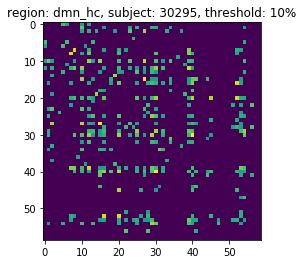

(59,)


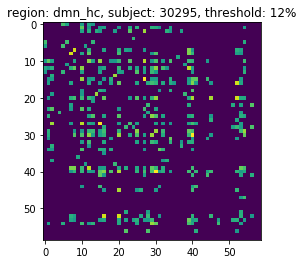

(59,)


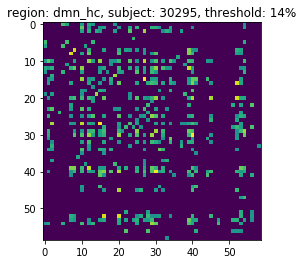

(59,)


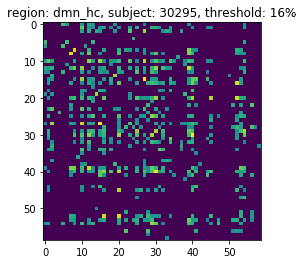

(59,)


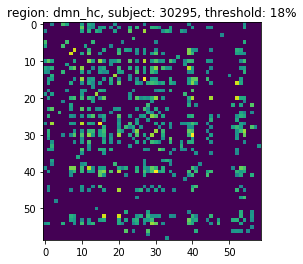

(59,)


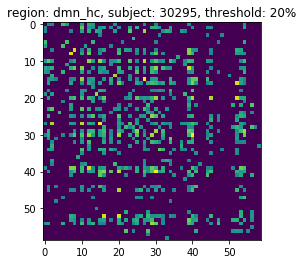

(59,)
(26, 26, 89)


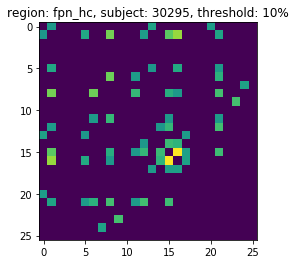

(26,)


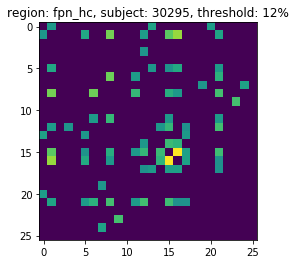

(26,)


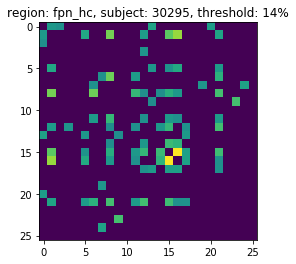

(26,)


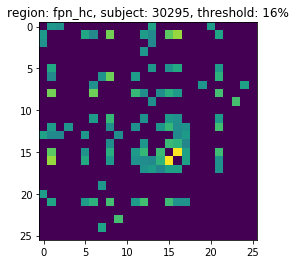

(26,)


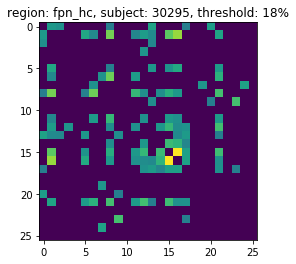

(26,)


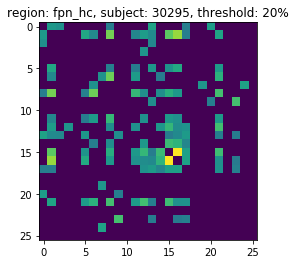

(26,)
(6, 6, 89)


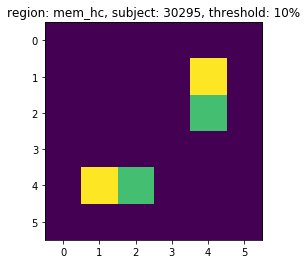

(6,)


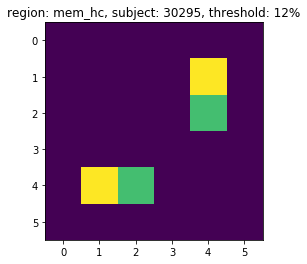

(6,)


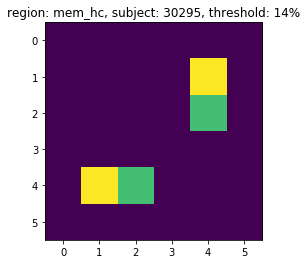

(6,)


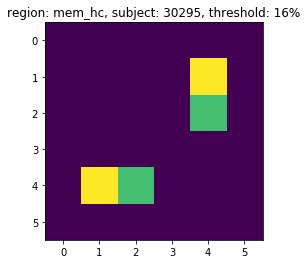

(6,)


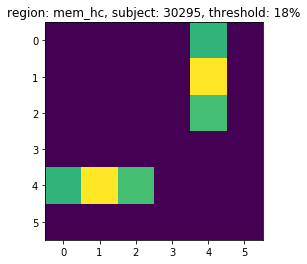

(6,)


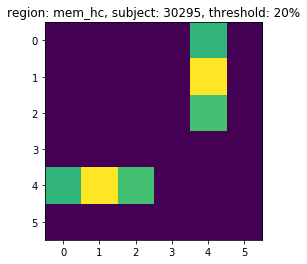

(6,)
    pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0            0.0   30004           NaN           NaN
1            NaN   30004           0.0           NaN
2            NaN   30004           NaN           0.0
3            0.0   30008           NaN           NaN
4            NaN   30008           0.0           NaN
5            NaN   30008           NaN           0.0
6            0.0   30009           NaN           NaN
7            NaN   30009           0.0           NaN
8            NaN   30009           NaN           0.0
9            0.0   30015           NaN           NaN
10           NaN   30015           0.0           NaN
11           NaN   30015           NaN           0.0
12           0.0   30019           NaN           NaN
13           NaN   30019           0.0           NaN
14           NaN   30019           NaN           0.0
15           0.0   30020           NaN           NaN
16           NaN   30020           0.0           NaN
17           NaN   30020           NaN   

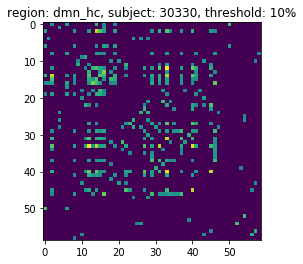

(59,)


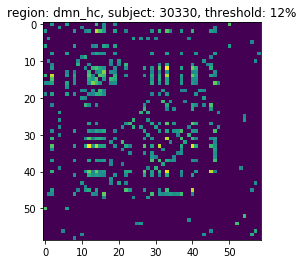

(59,)


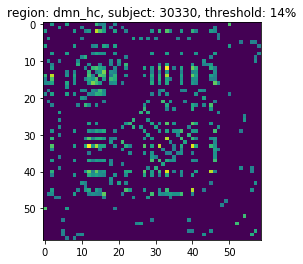

(59,)


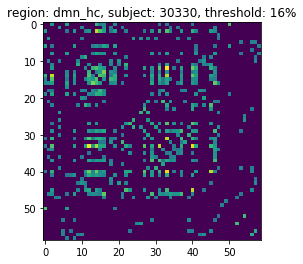

(59,)


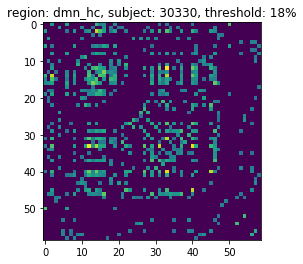

(59,)


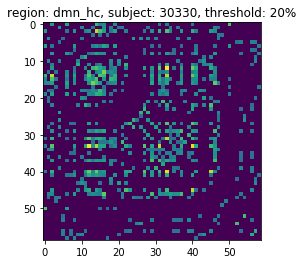

(59,)
(26, 26, 89)


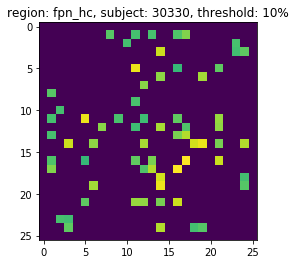

(26,)


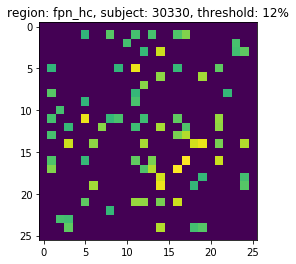

(26,)


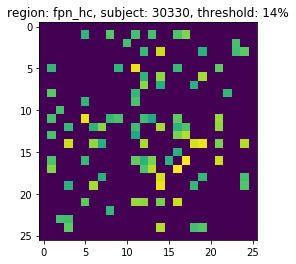

(26,)


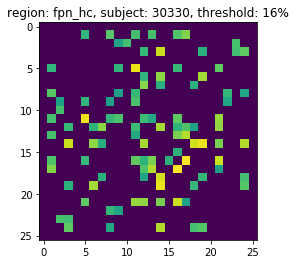

(26,)


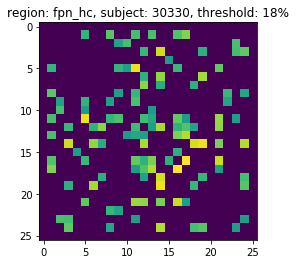

(26,)


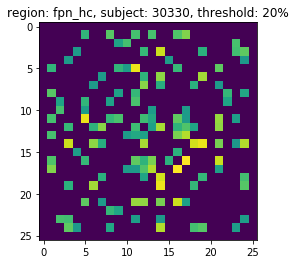

(26,)
(6, 6, 89)


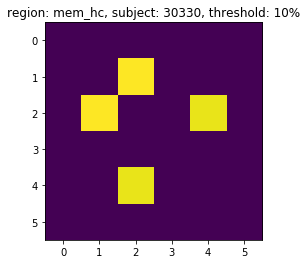

(6,)


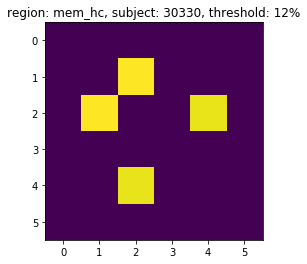

(6,)


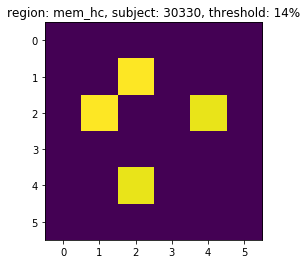

(6,)


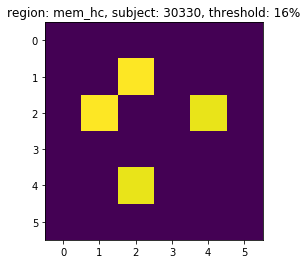

(6,)


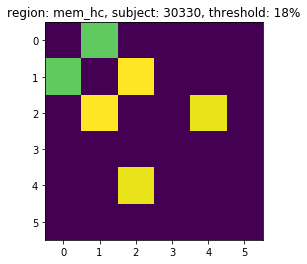

(6,)


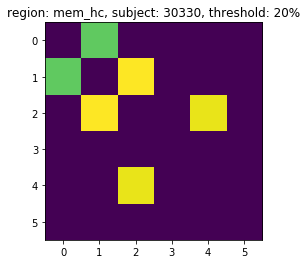

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

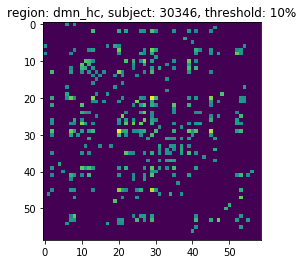

(59,)


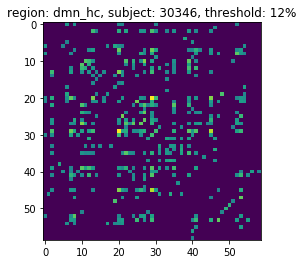

(59,)


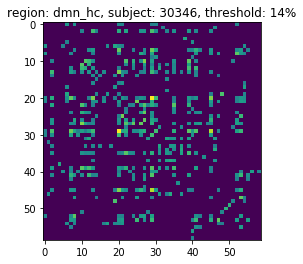

(59,)


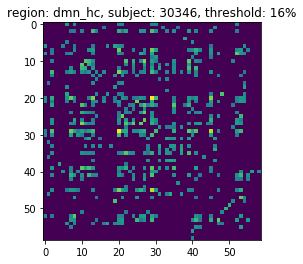

(59,)


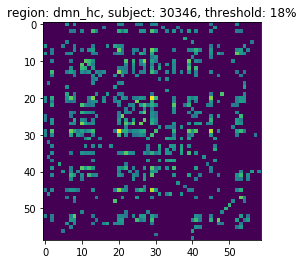

(59,)


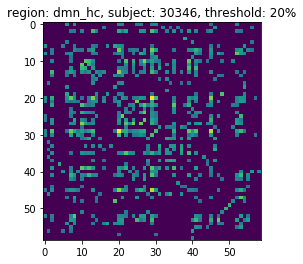

(59,)
(26, 26, 89)


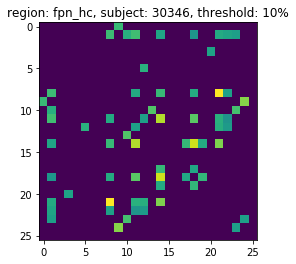

(26,)


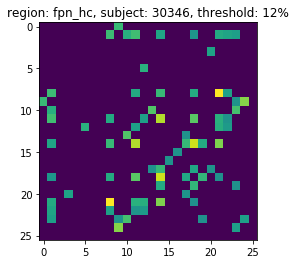

(26,)


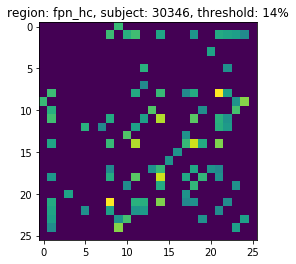

(26,)


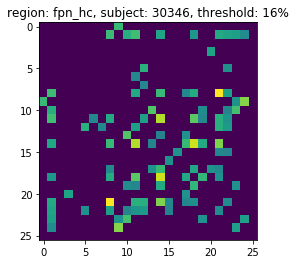

(26,)


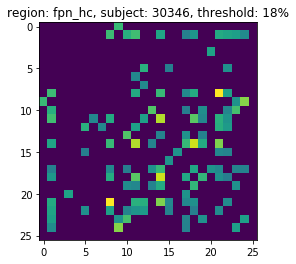

(26,)


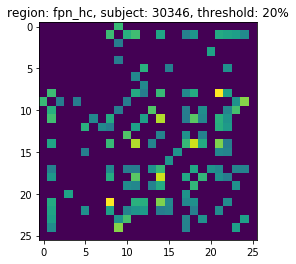

(26,)
(6, 6, 89)


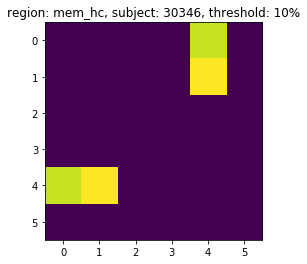

(6,)


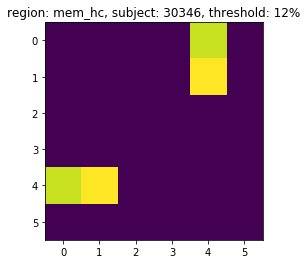

(6,)


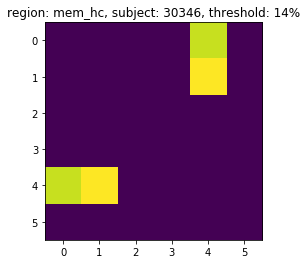

(6,)


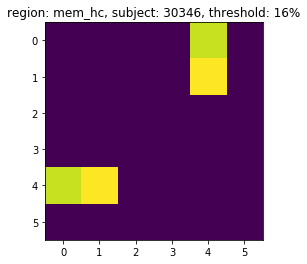

(6,)


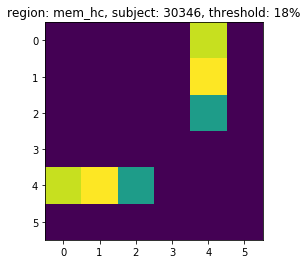

(6,)


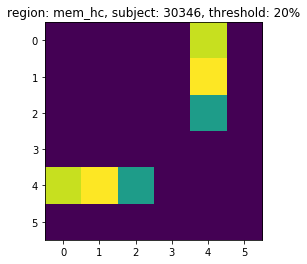

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

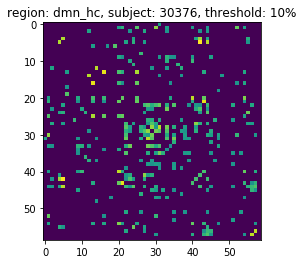

(59,)


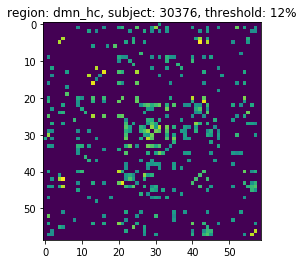

(59,)


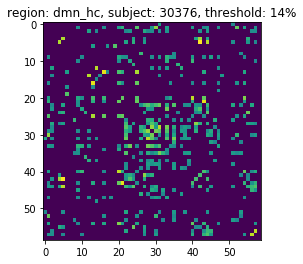

(59,)


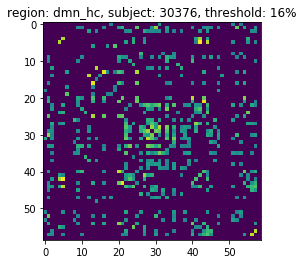

(59,)


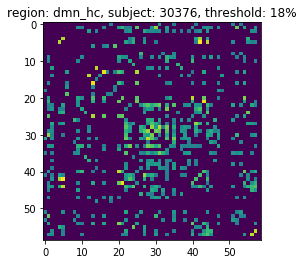

(59,)


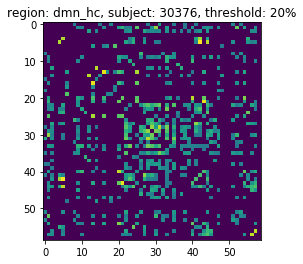

(59,)
(26, 26, 89)


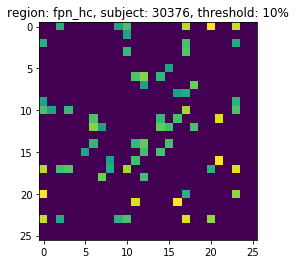

(26,)


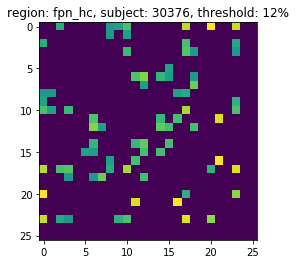

(26,)


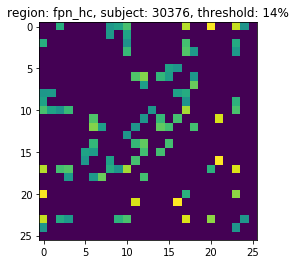

(26,)


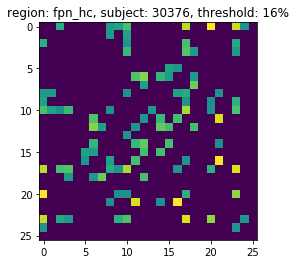

(26,)


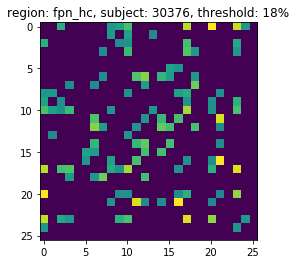

(26,)


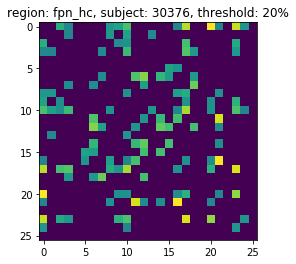

(26,)
(6, 6, 89)


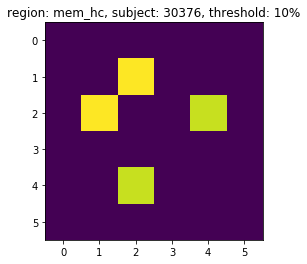

(6,)


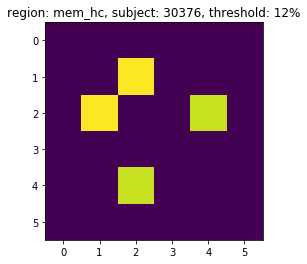

(6,)


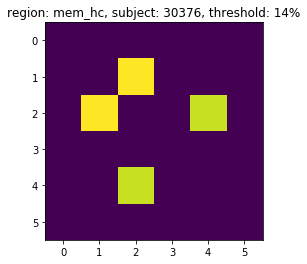

(6,)


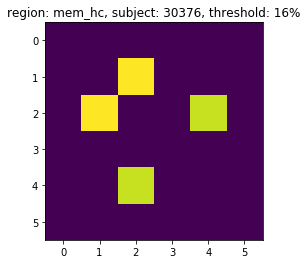

(6,)


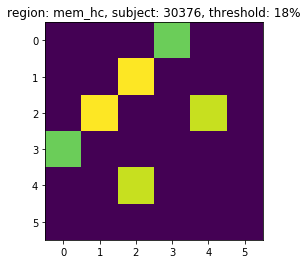

(6,)


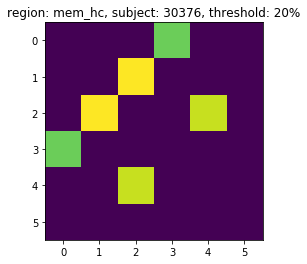

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

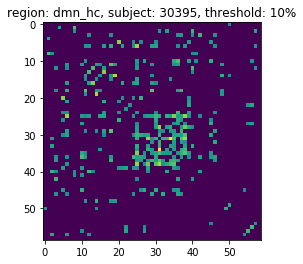

(59,)


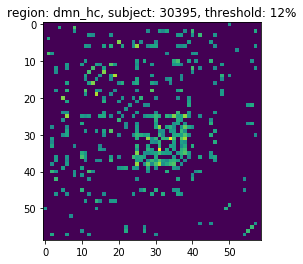

(59,)


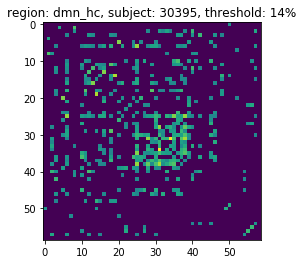

(59,)


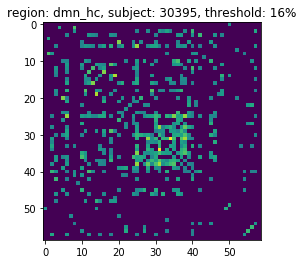

(59,)


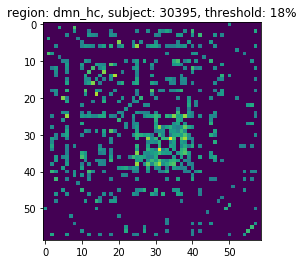

(59,)


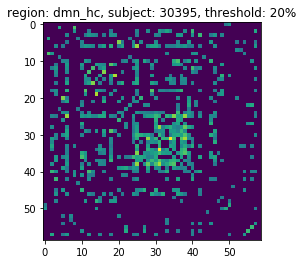

(59,)
(26, 26, 89)


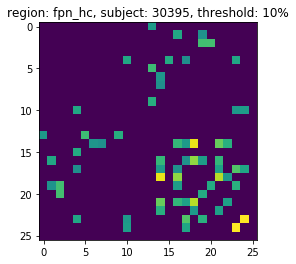

(26,)


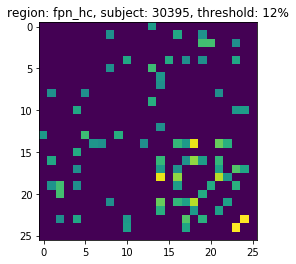

(26,)


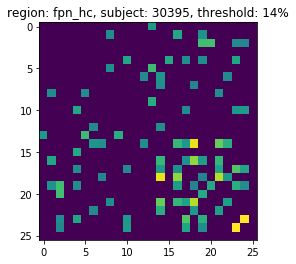

(26,)


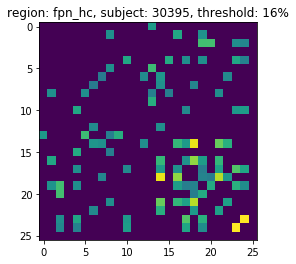

(26,)


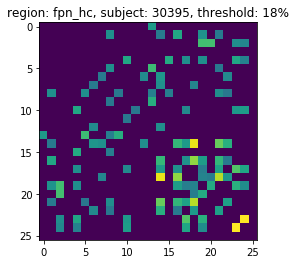

(26,)


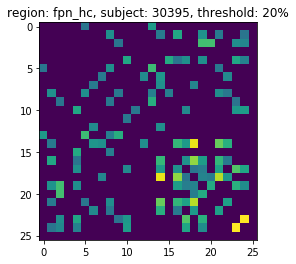

(26,)
(6, 6, 89)


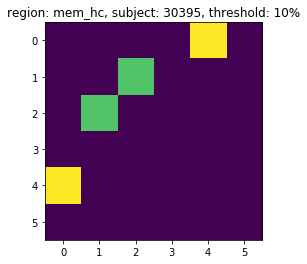

(6,)


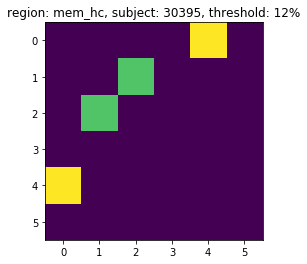

(6,)


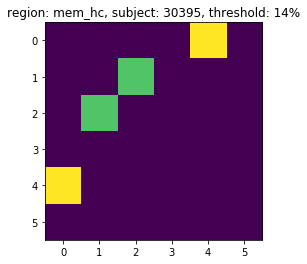

(6,)


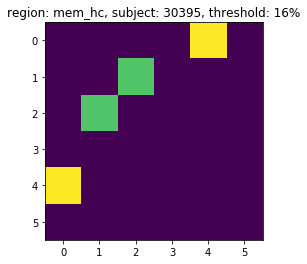

(6,)


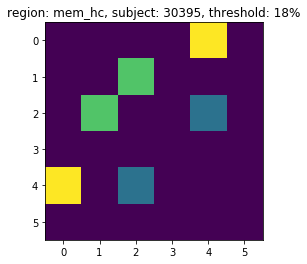

(6,)


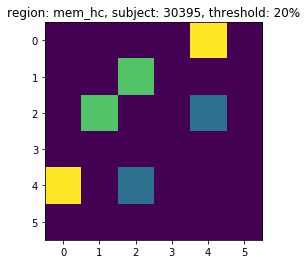

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

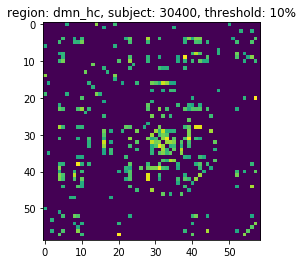

(59,)


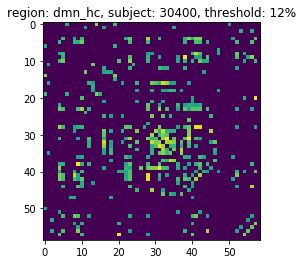

(59,)


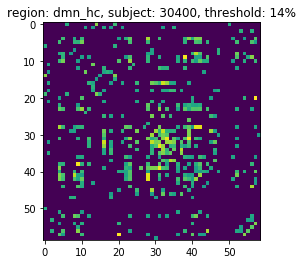

(59,)


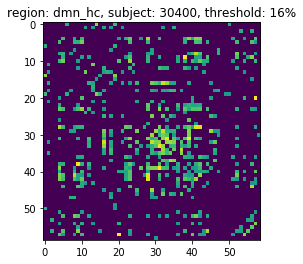

(59,)


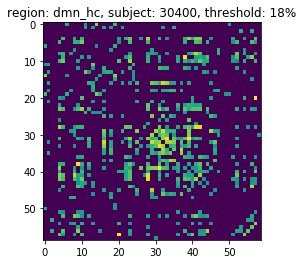

(59,)


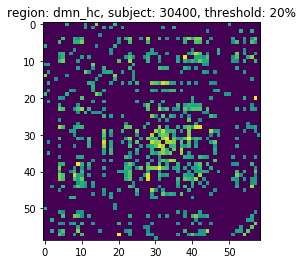

(59,)
(26, 26, 89)


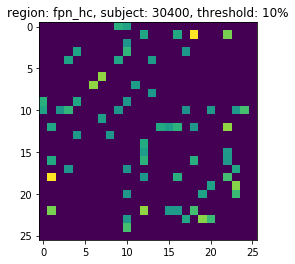

(26,)


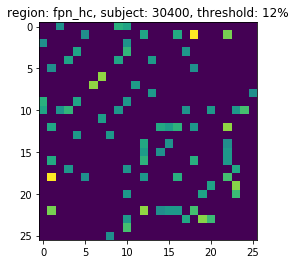

(26,)


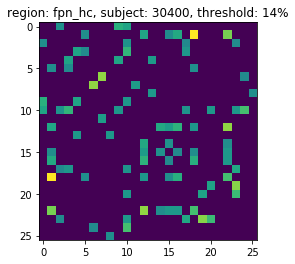

(26,)


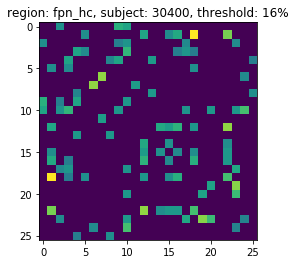

(26,)


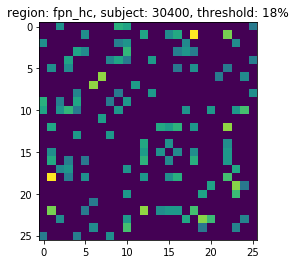

(26,)


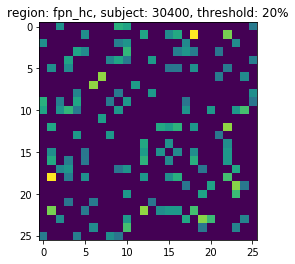

(26,)
(6, 6, 89)


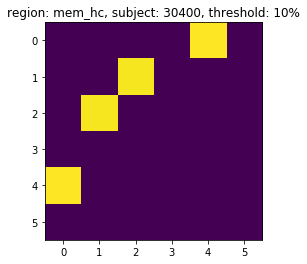

(6,)


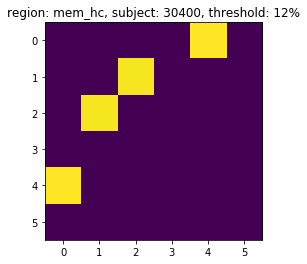

(6,)


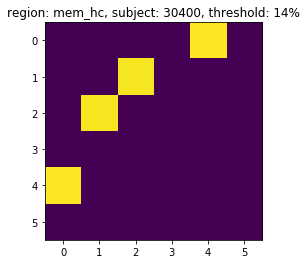

(6,)


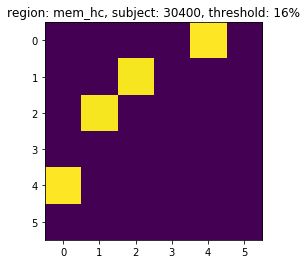

(6,)


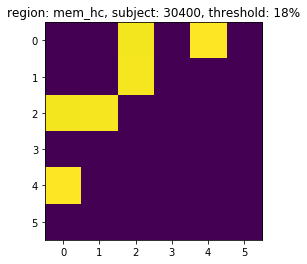

(6,)


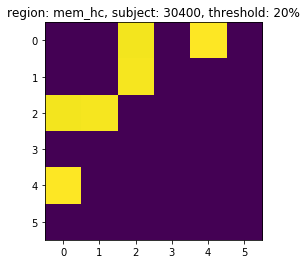

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

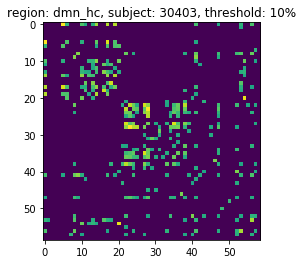

(59,)


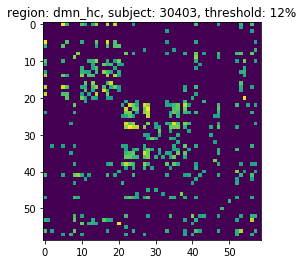

(59,)


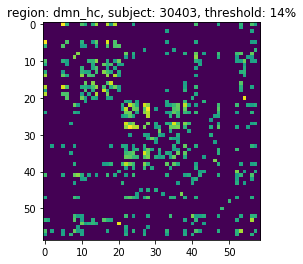

(59,)


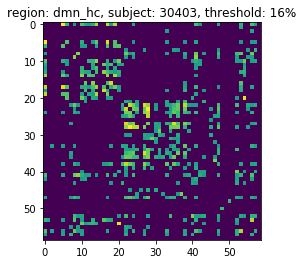

(59,)


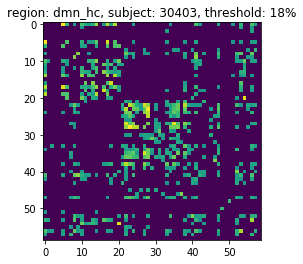

(59,)


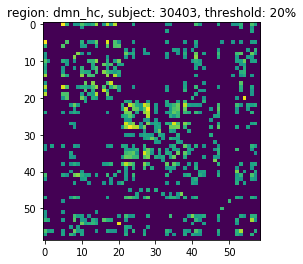

(59,)
(26, 26, 89)


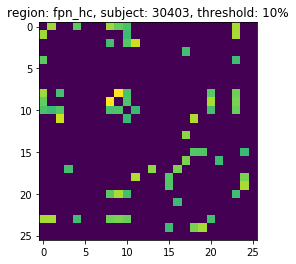

(26,)


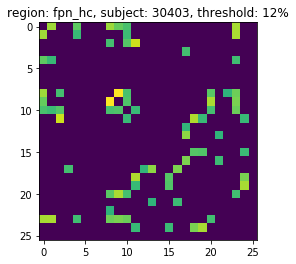

(26,)


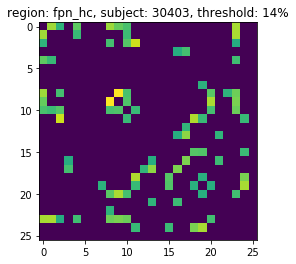

(26,)


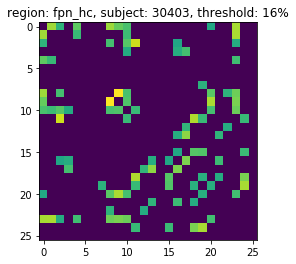

(26,)


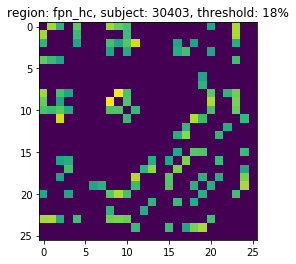

(26,)


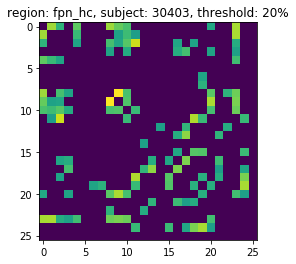

(26,)
(6, 6, 89)


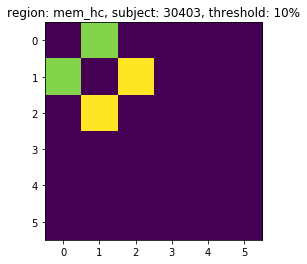

(6,)


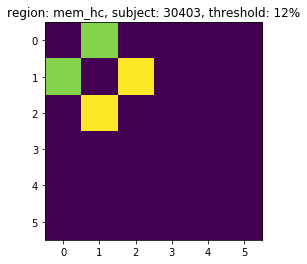

(6,)


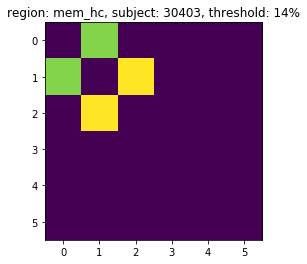

(6,)


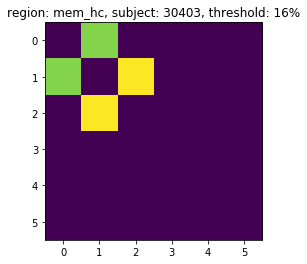

(6,)


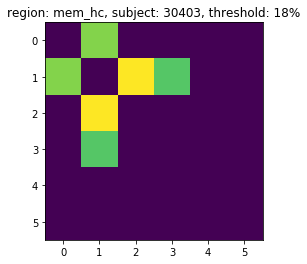

(6,)


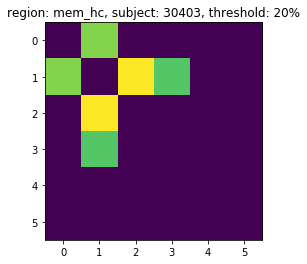

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

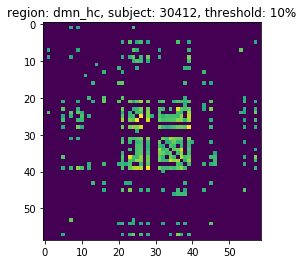

(59,)


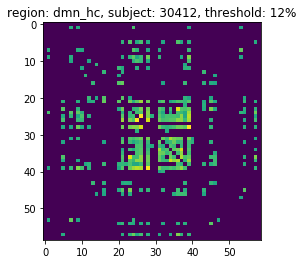

(59,)


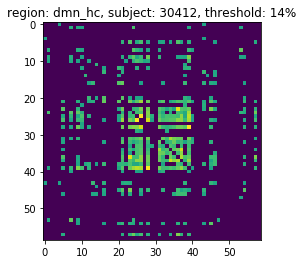

(59,)


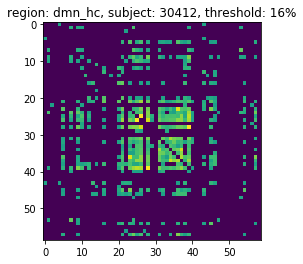

(59,)


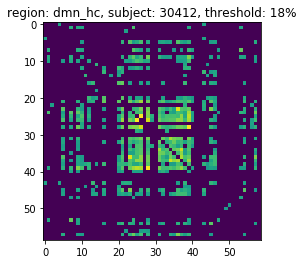

(59,)


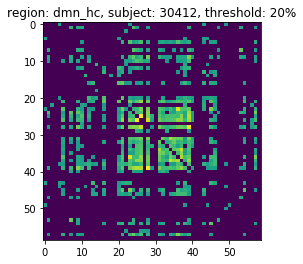

(59,)
(26, 26, 89)


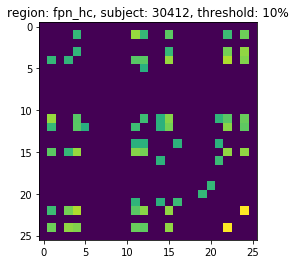

(26,)


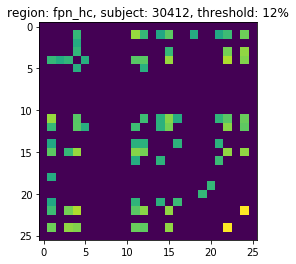

(26,)


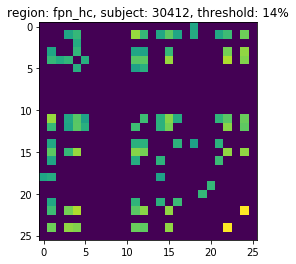

(26,)


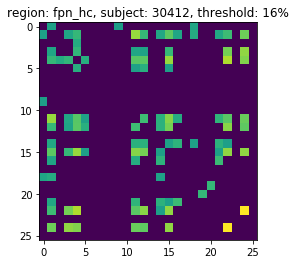

(26,)


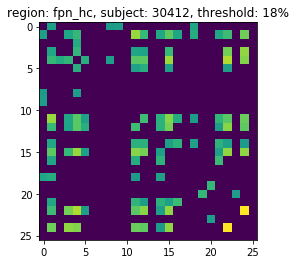

(26,)


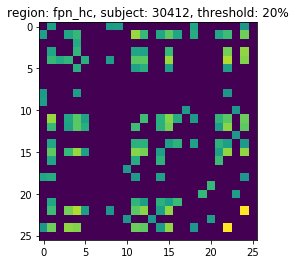

(26,)
(6, 6, 89)


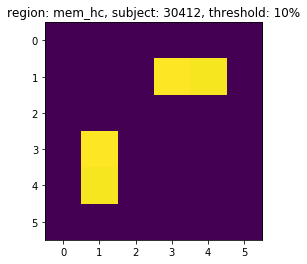

(6,)


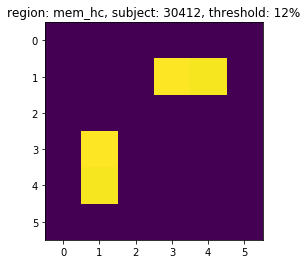

(6,)


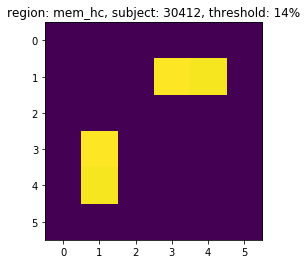

(6,)


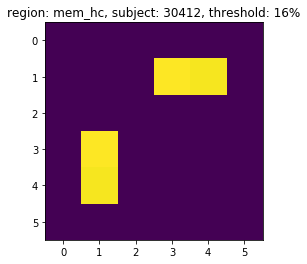

(6,)


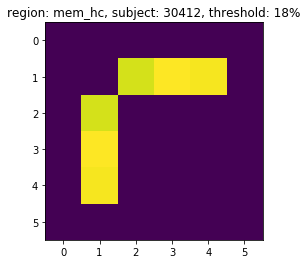

(6,)


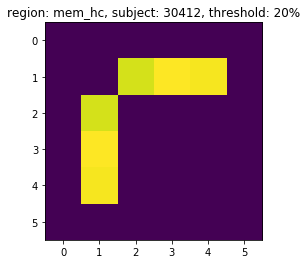

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

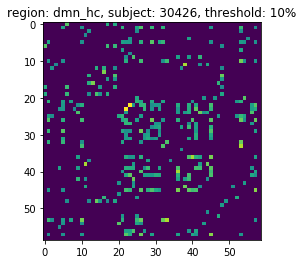

(59,)


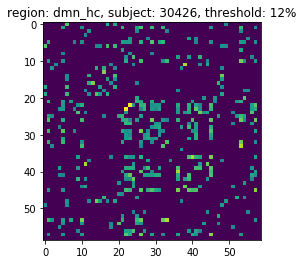

(59,)


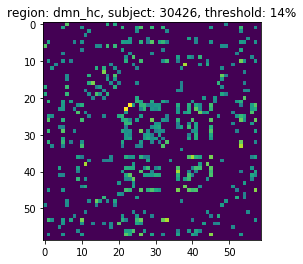

(59,)


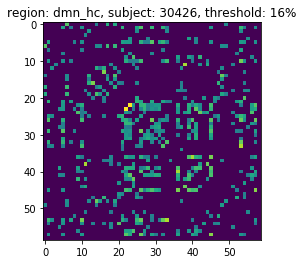

(59,)


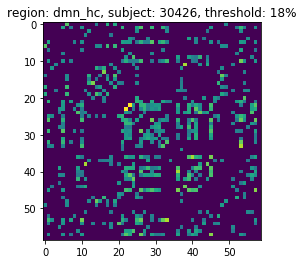

(59,)


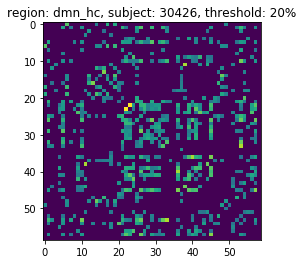

(59,)
(26, 26, 89)


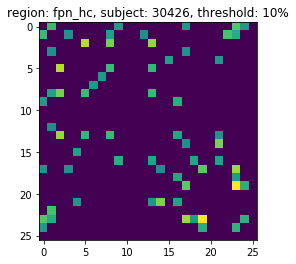

(26,)


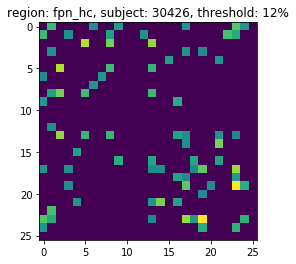

(26,)


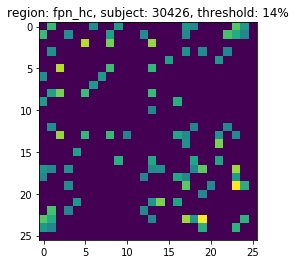

(26,)


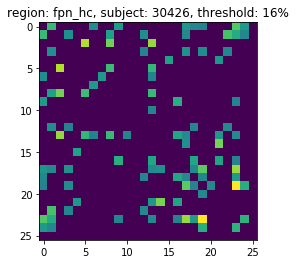

(26,)


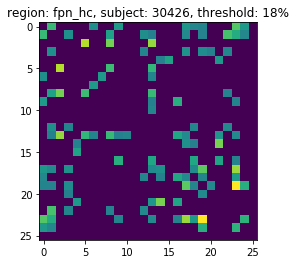

(26,)


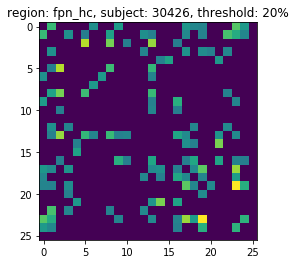

(26,)
(6, 6, 89)


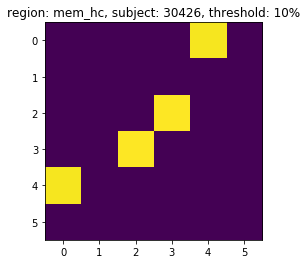

(6,)


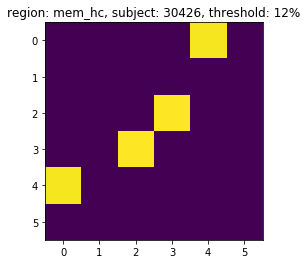

(6,)


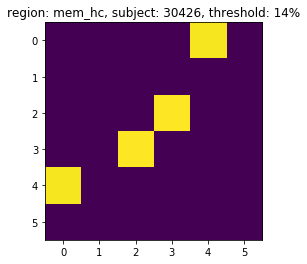

(6,)


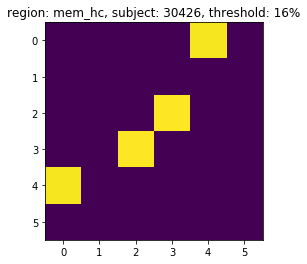

(6,)


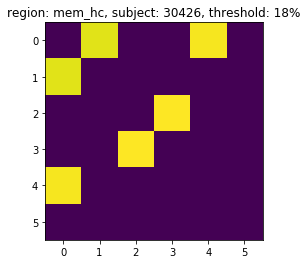

(6,)


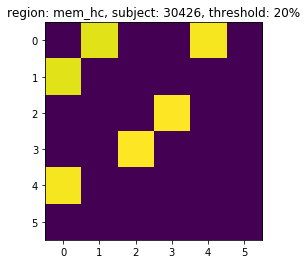

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

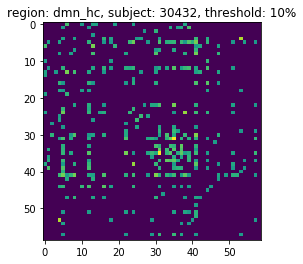

(59,)


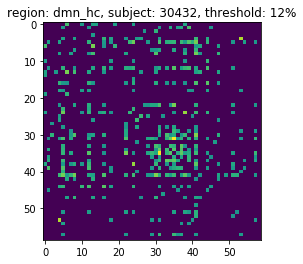

(59,)


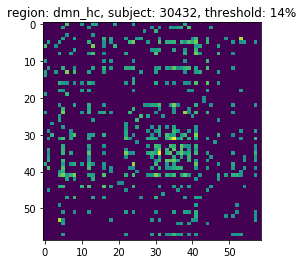

(59,)


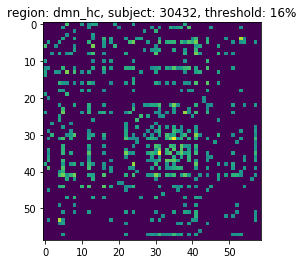

(59,)


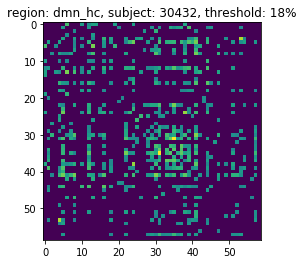

(59,)


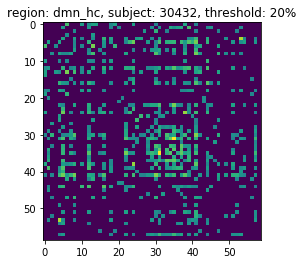

(59,)
(26, 26, 89)


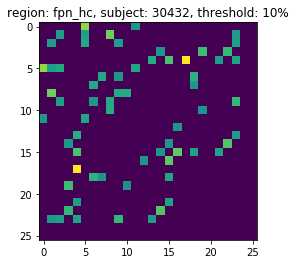

(26,)


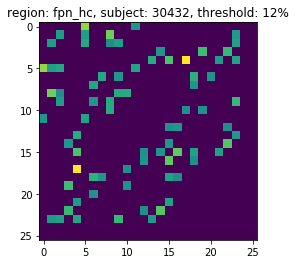

(26,)


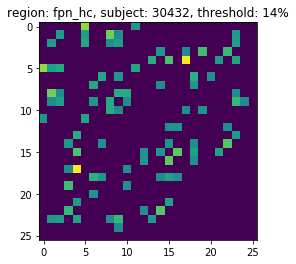

(26,)


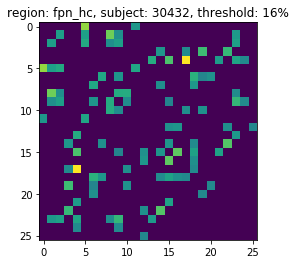

(26,)


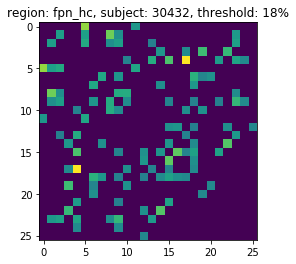

(26,)


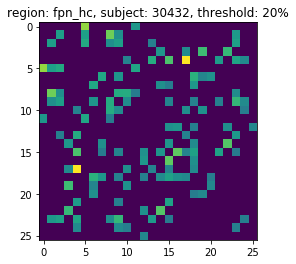

(26,)
(6, 6, 89)


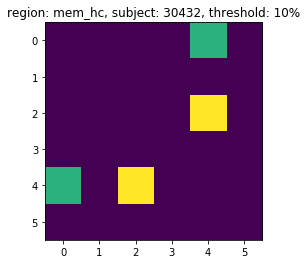

(6,)


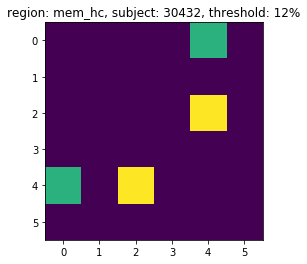

(6,)


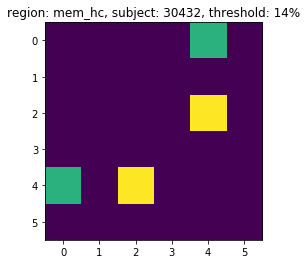

(6,)


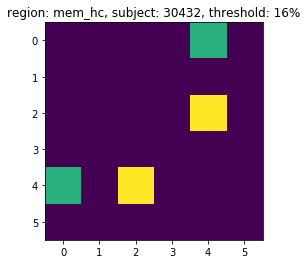

(6,)


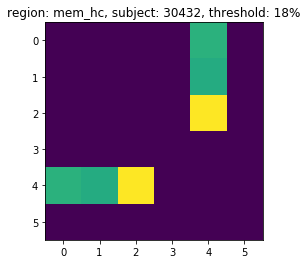

(6,)


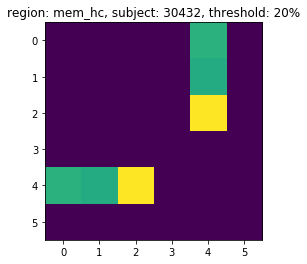

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

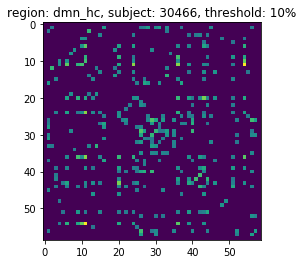

(59,)


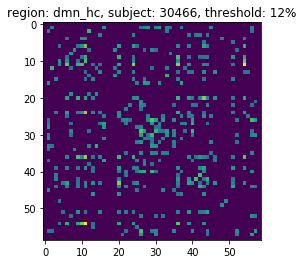

(59,)


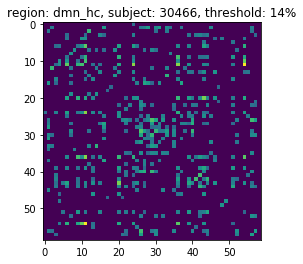

(59,)


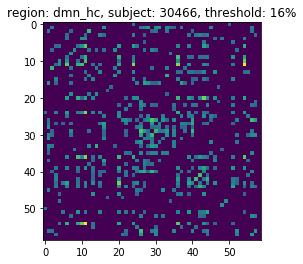

(59,)


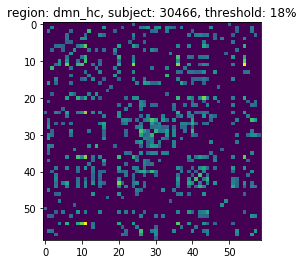

(59,)


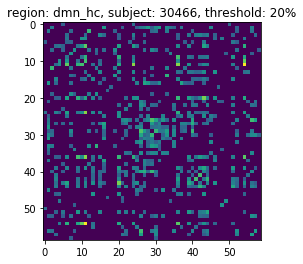

(59,)
(26, 26, 89)


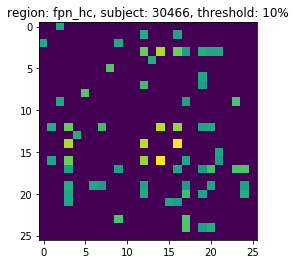

(26,)


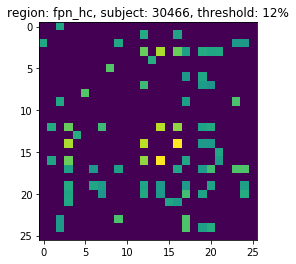

(26,)


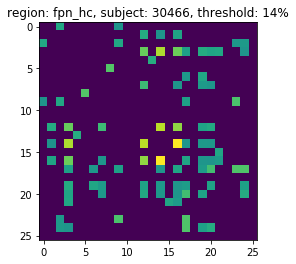

(26,)


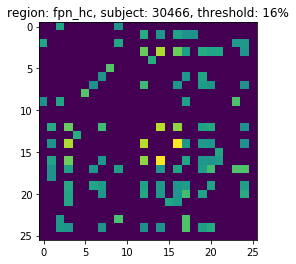

(26,)


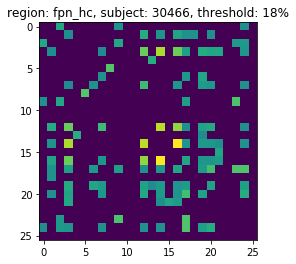

(26,)


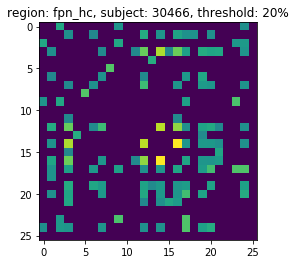

(26,)
(6, 6, 89)


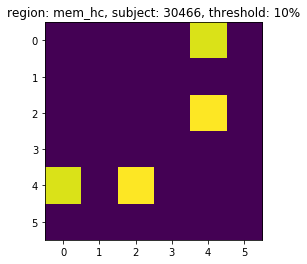

(6,)


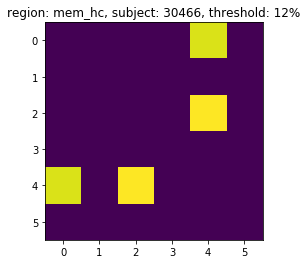

(6,)


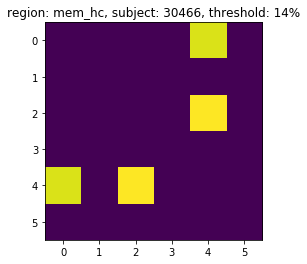

(6,)


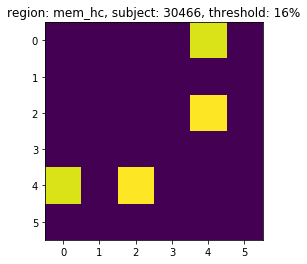

(6,)


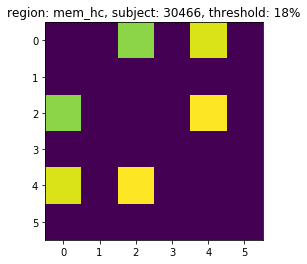

(6,)


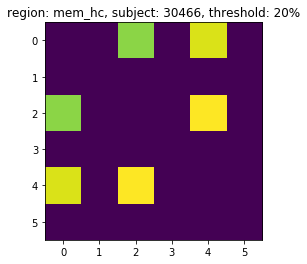

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

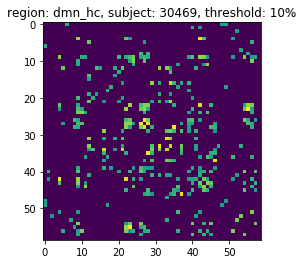

(59,)


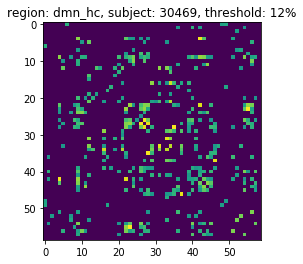

(59,)


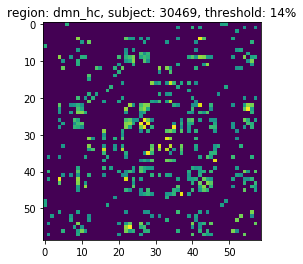

(59,)


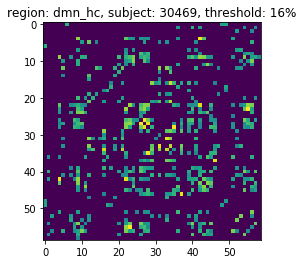

(59,)


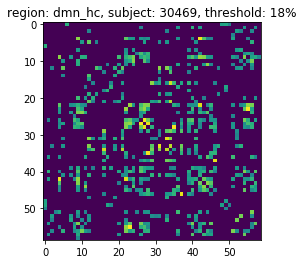

(59,)


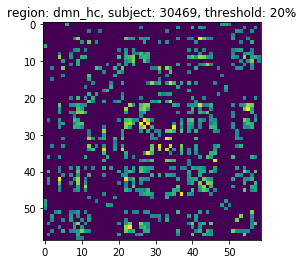

(59,)
(26, 26, 89)


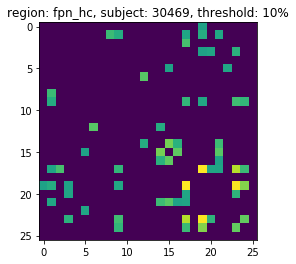

(26,)


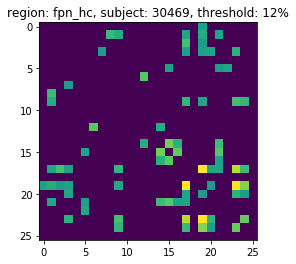

(26,)


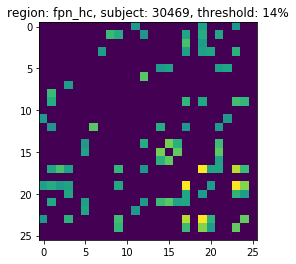

(26,)


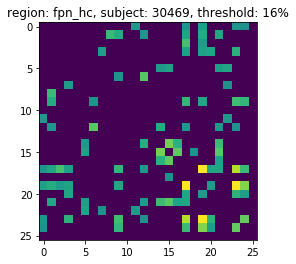

(26,)


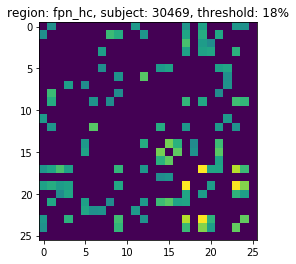

(26,)


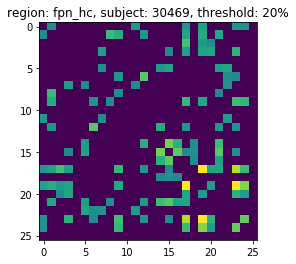

(26,)
(6, 6, 89)


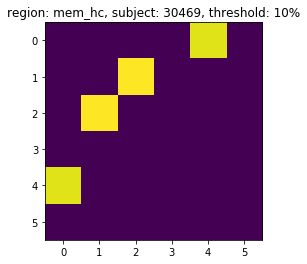

(6,)


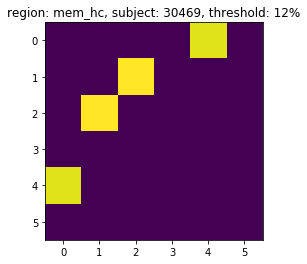

(6,)


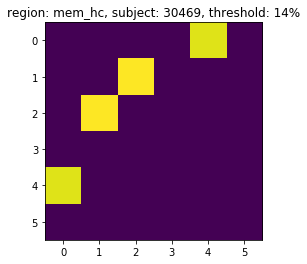

(6,)


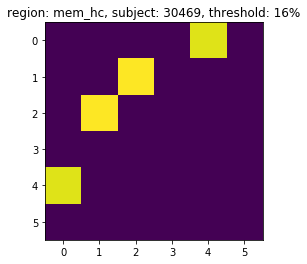

(6,)


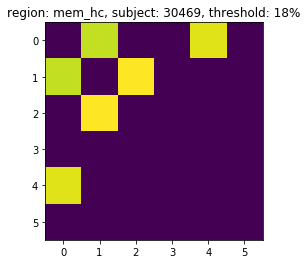

(6,)


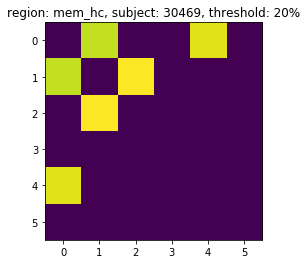

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

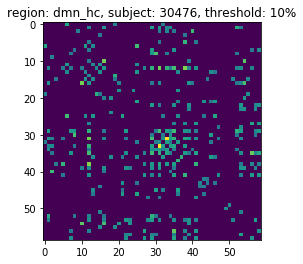

(59,)


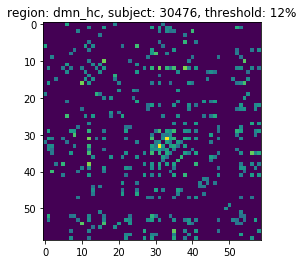

(59,)


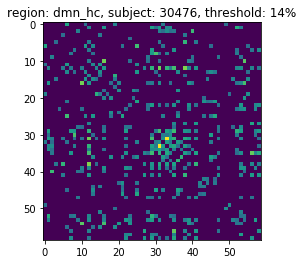

(59,)


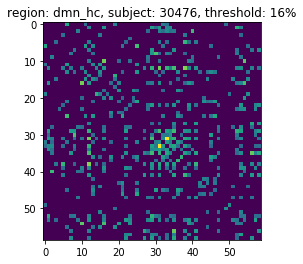

(59,)


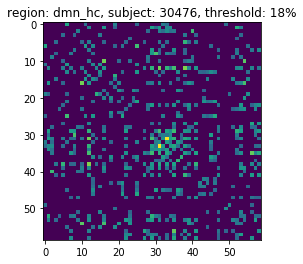

(59,)


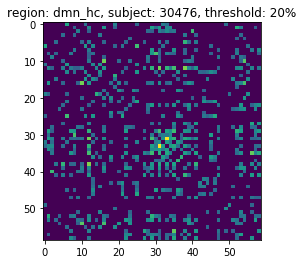

(59,)
(26, 26, 89)


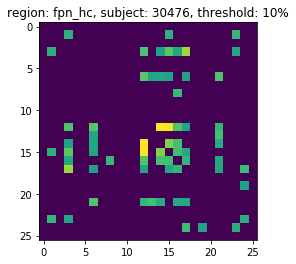

(26,)


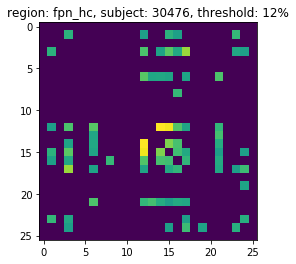

(26,)


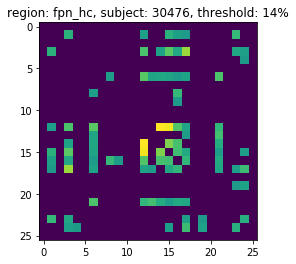

(26,)


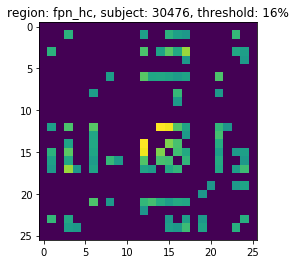

(26,)


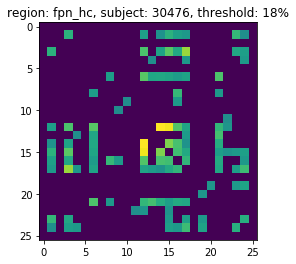

(26,)


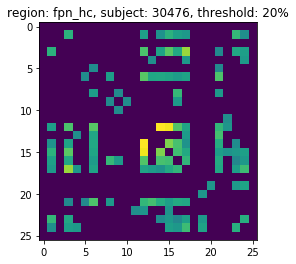

(26,)
(6, 6, 89)


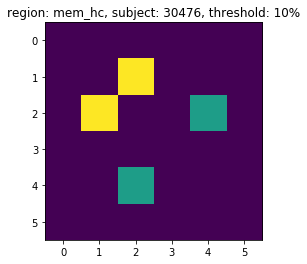

(6,)


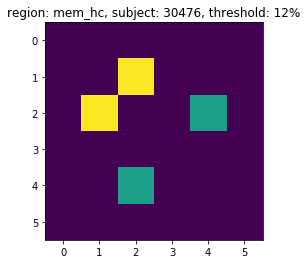

(6,)


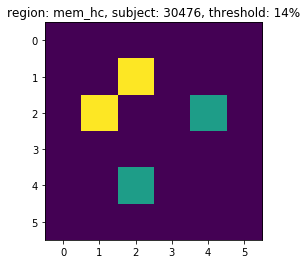

(6,)


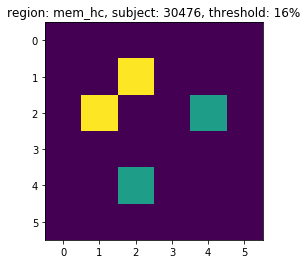

(6,)


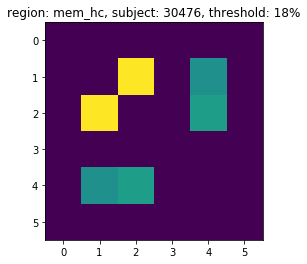

(6,)


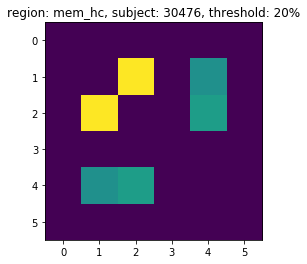

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

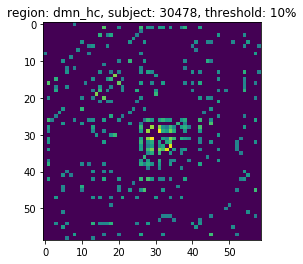

(59,)


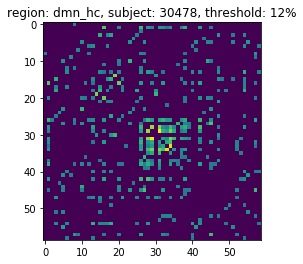

(59,)


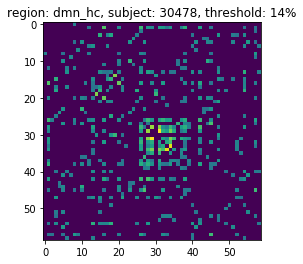

(59,)


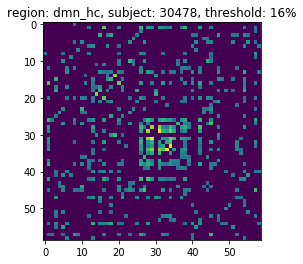

(59,)


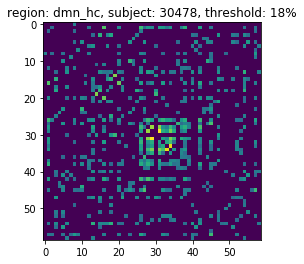

(59,)


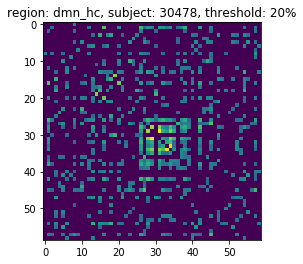

(59,)
(26, 26, 89)


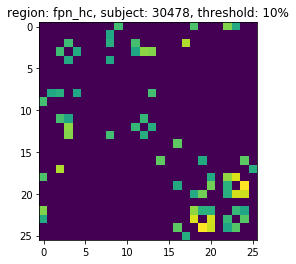

(26,)


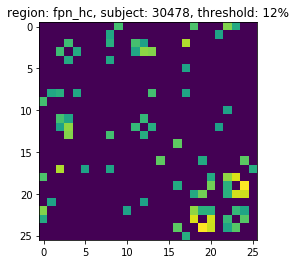

(26,)


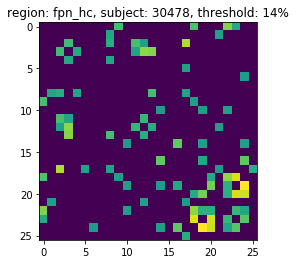

(26,)


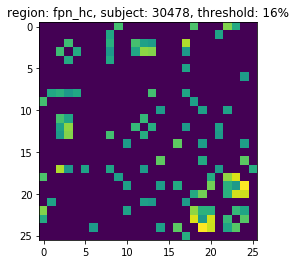

(26,)


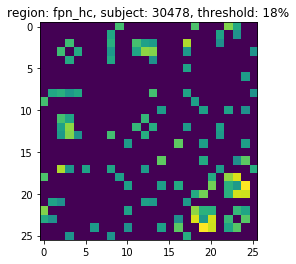

(26,)


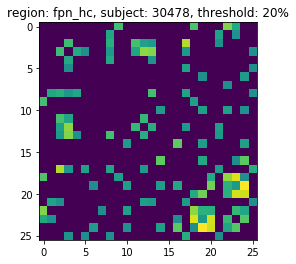

(26,)
(6, 6, 89)


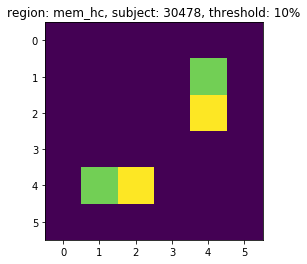

(6,)


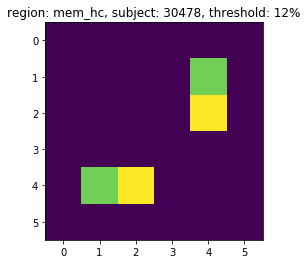

(6,)


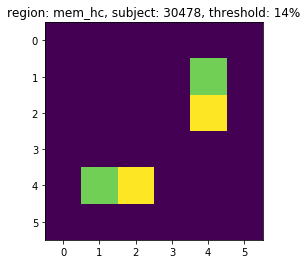

(6,)


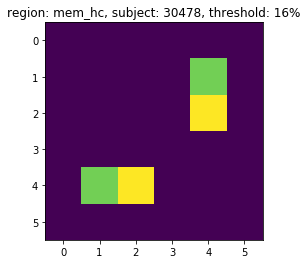

(6,)


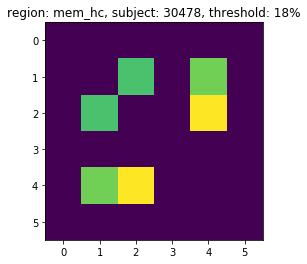

(6,)


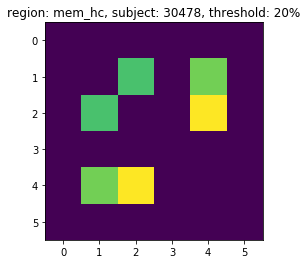

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

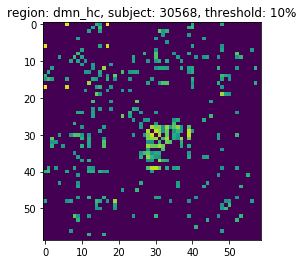

(59,)


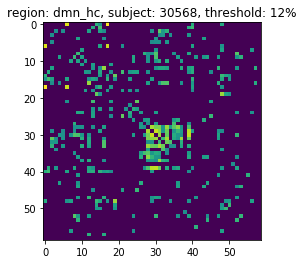

(59,)


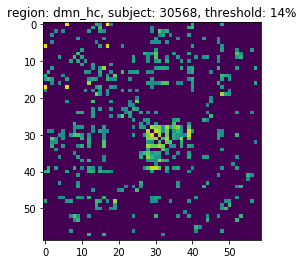

(59,)


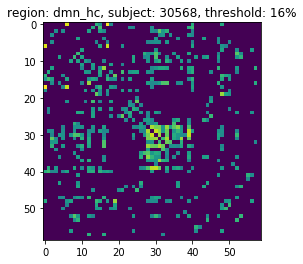

(59,)


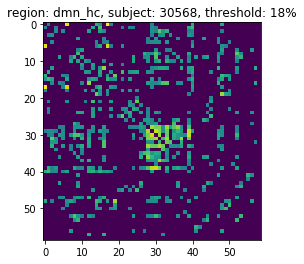

(59,)


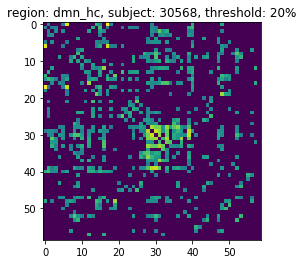

(59,)
(26, 26, 89)


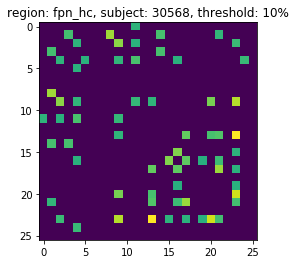

(26,)


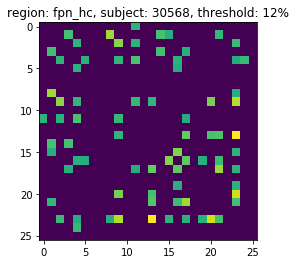

(26,)


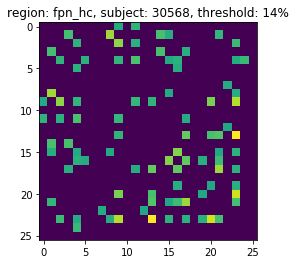

(26,)


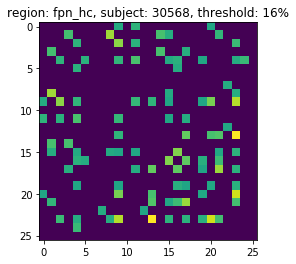

(26,)


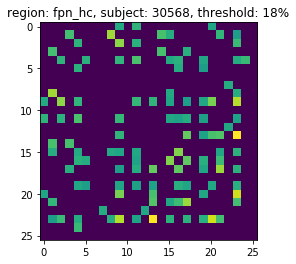

(26,)


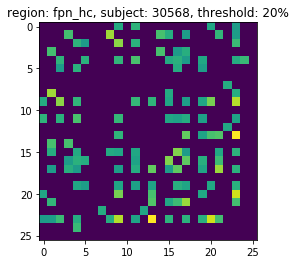

(26,)
(6, 6, 89)


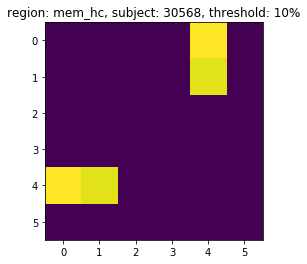

(6,)


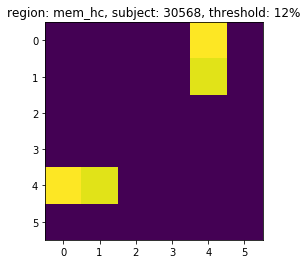

(6,)


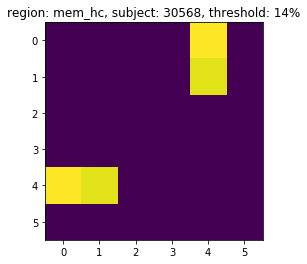

(6,)


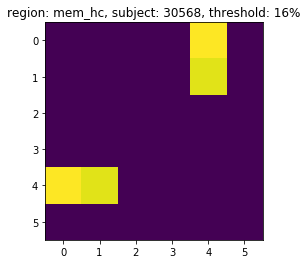

(6,)


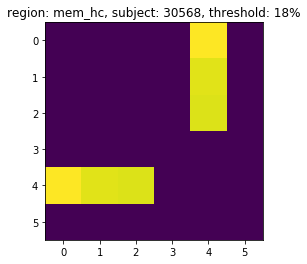

(6,)


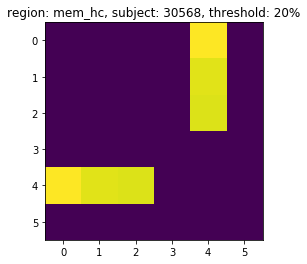

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

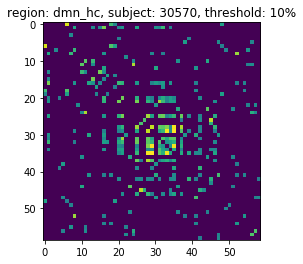

(59,)


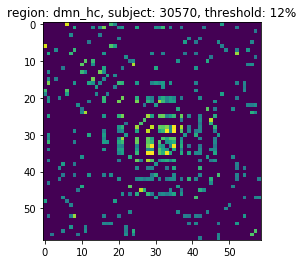

(59,)


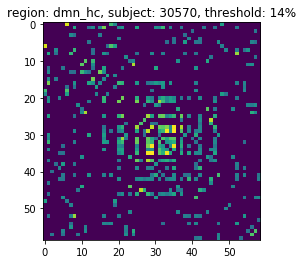

(59,)


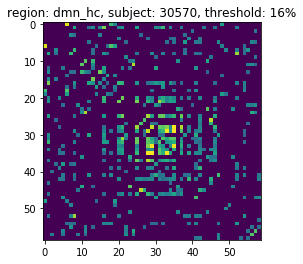

(59,)


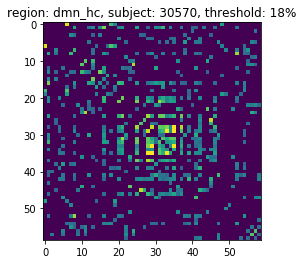

(59,)


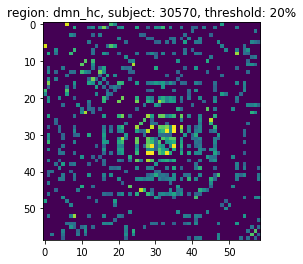

(59,)
(26, 26, 89)


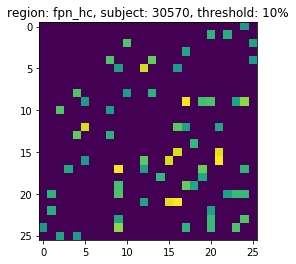

(26,)


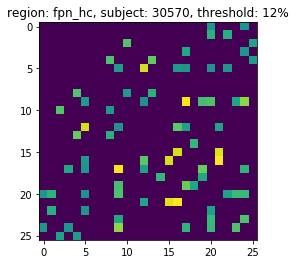

(26,)


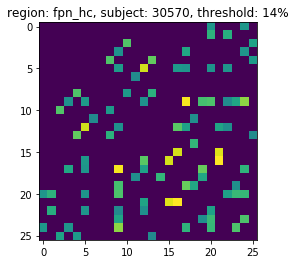

(26,)


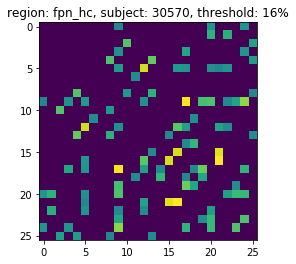

(26,)


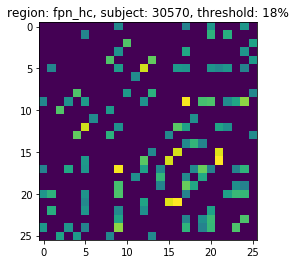

(26,)


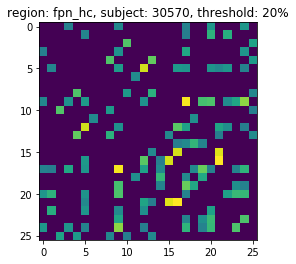

(26,)
(6, 6, 89)


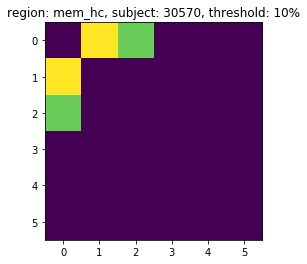

(6,)


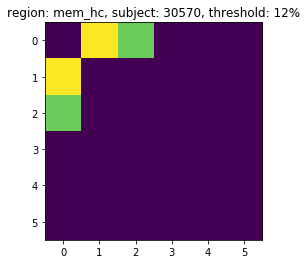

(6,)


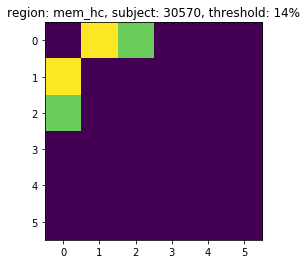

(6,)


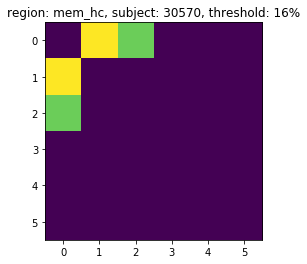

(6,)


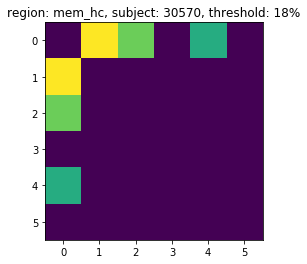

(6,)


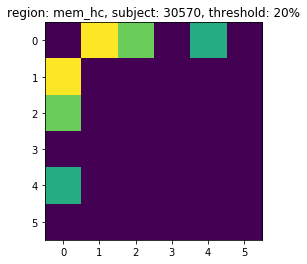

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

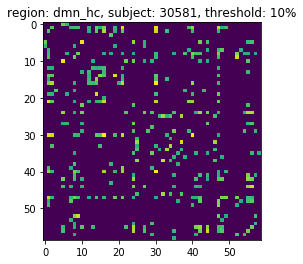

(59,)


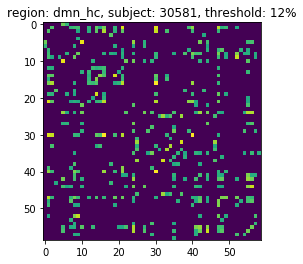

(59,)


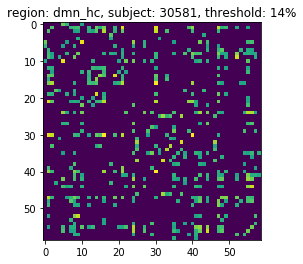

(59,)


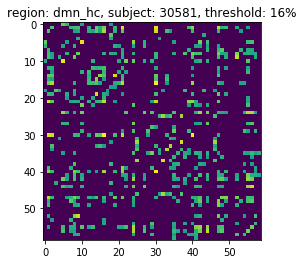

(59,)


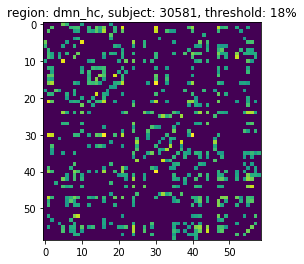

(59,)


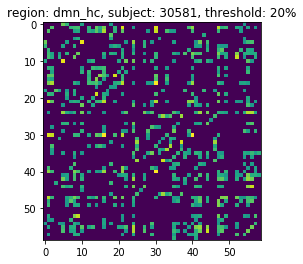

(59,)
(26, 26, 89)


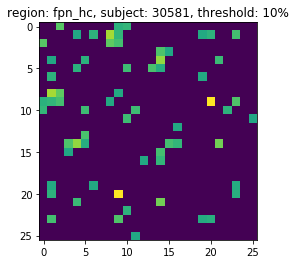

(26,)


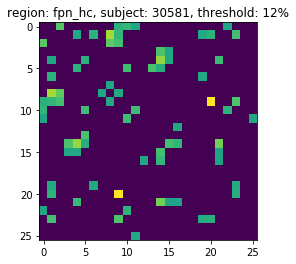

(26,)


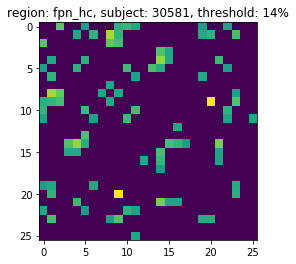

(26,)


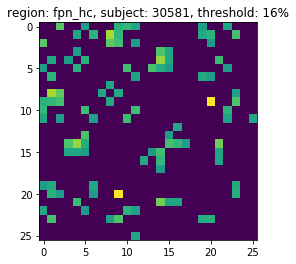

(26,)


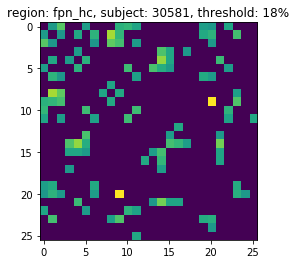

(26,)


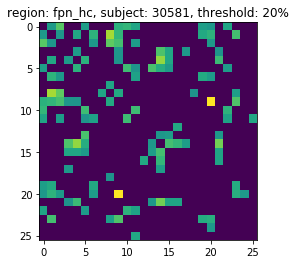

(26,)
(6, 6, 89)


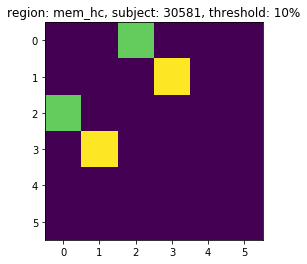

(6,)


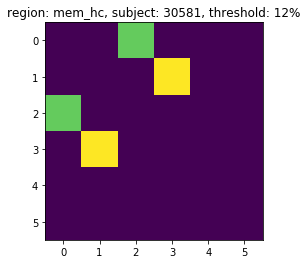

(6,)


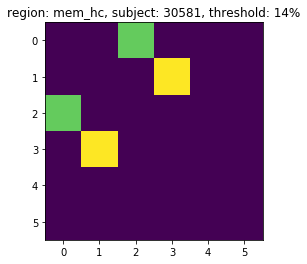

(6,)


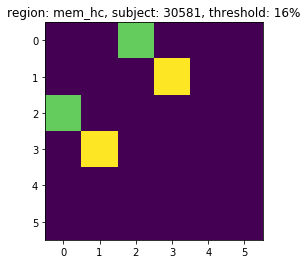

(6,)


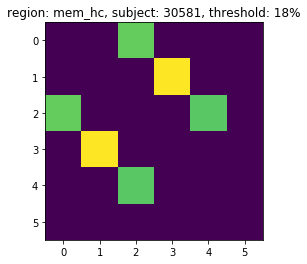

(6,)


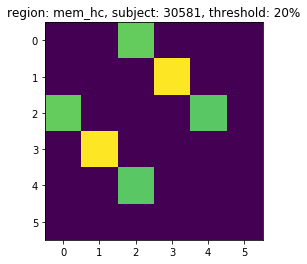

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

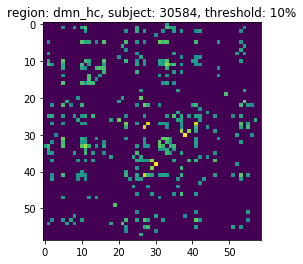

(59,)


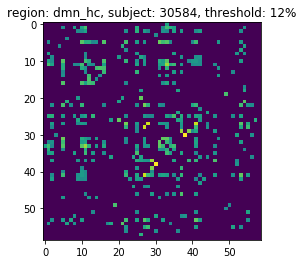

(59,)


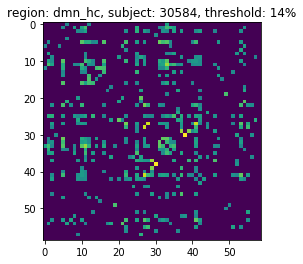

(59,)


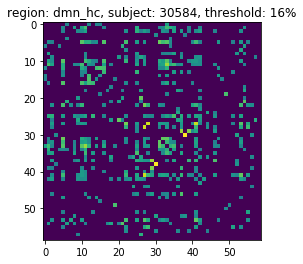

(59,)


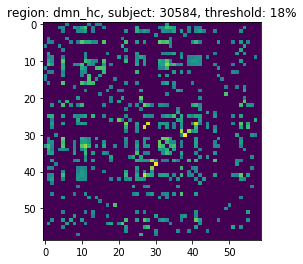

(59,)


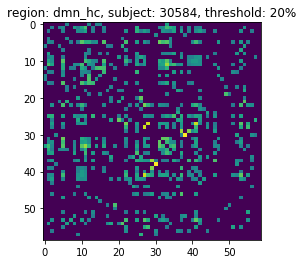

(59,)
(26, 26, 89)


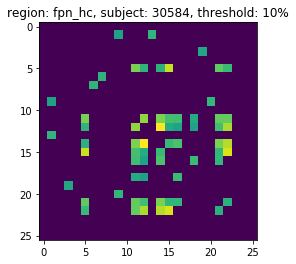

(26,)


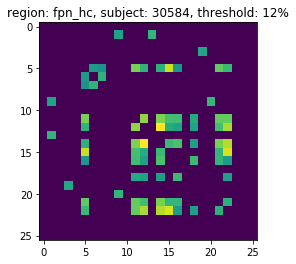

(26,)


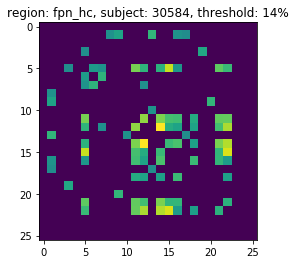

(26,)


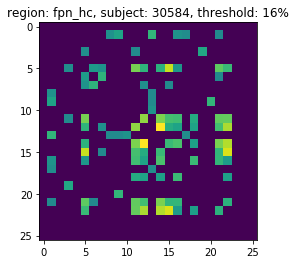

(26,)


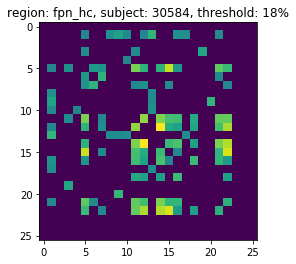

(26,)


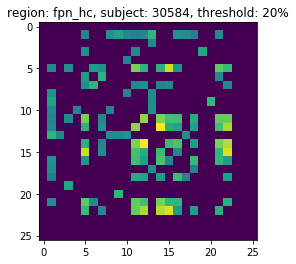

(26,)
(6, 6, 89)


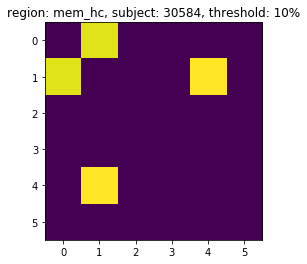

(6,)


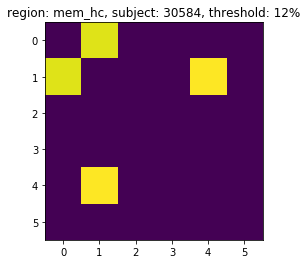

(6,)


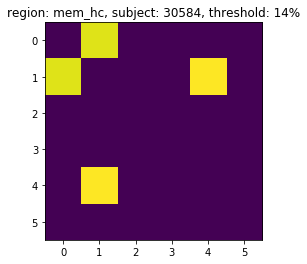

(6,)


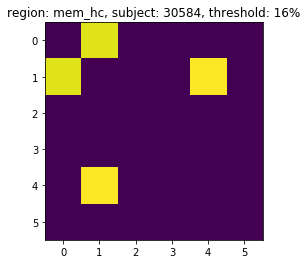

(6,)


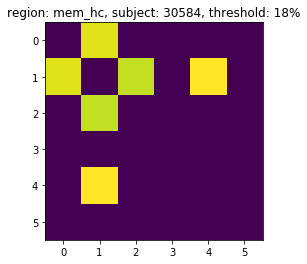

(6,)


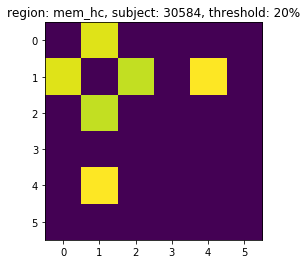

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

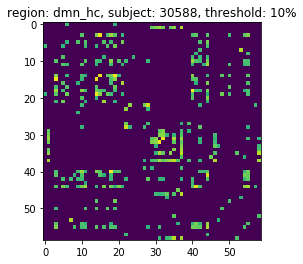

(59,)


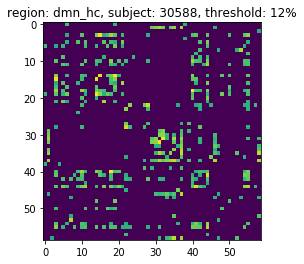

(59,)


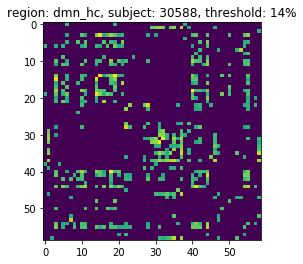

(59,)


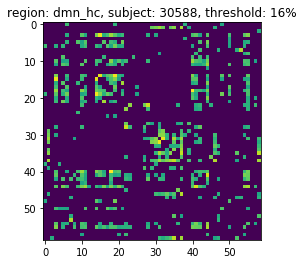

(59,)


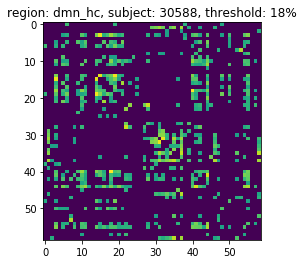

(59,)


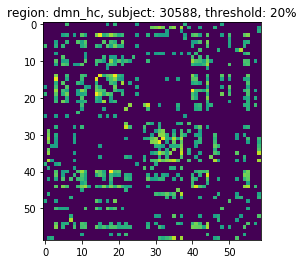

(59,)
(26, 26, 89)


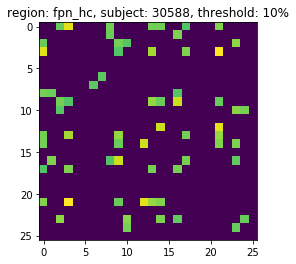

(26,)


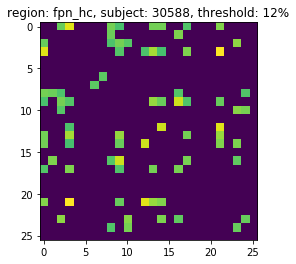

(26,)


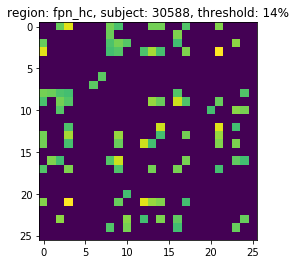

(26,)


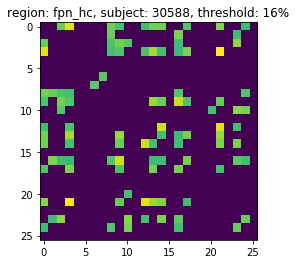

(26,)


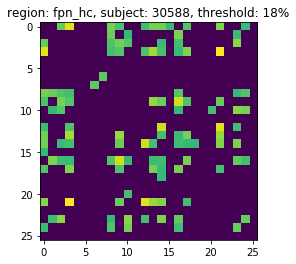

(26,)


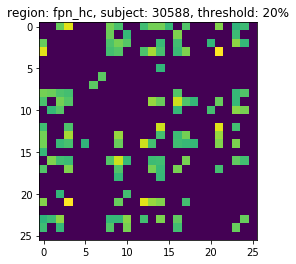

(26,)
(6, 6, 89)


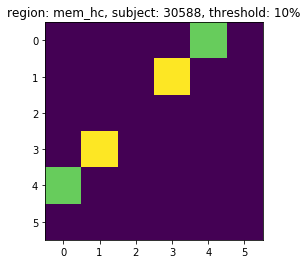

(6,)


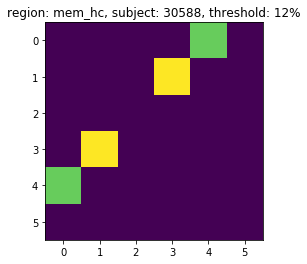

(6,)


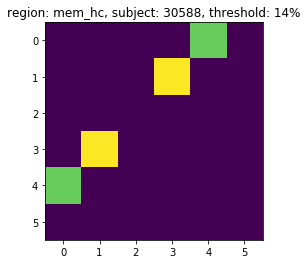

(6,)


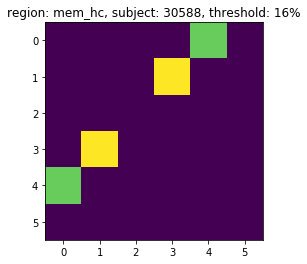

(6,)


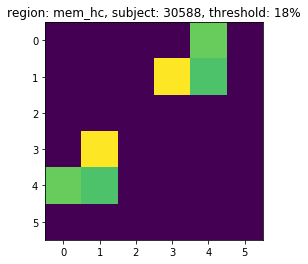

(6,)


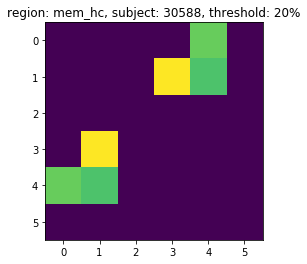

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

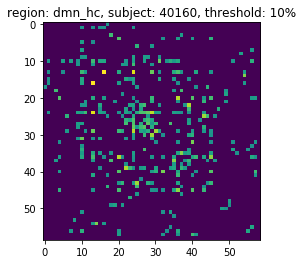

(59,)


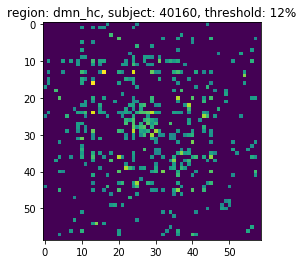

(59,)


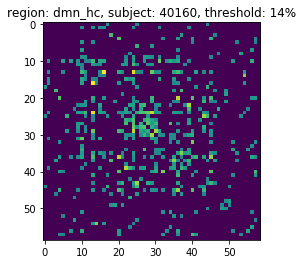

(59,)


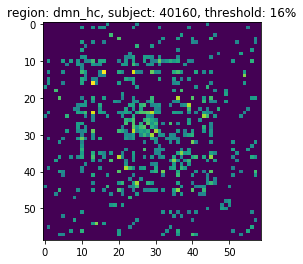

(59,)


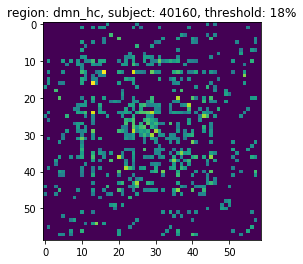

(59,)


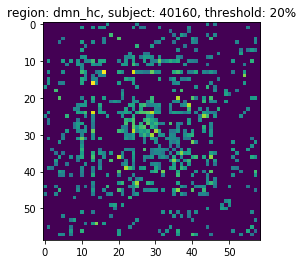

(59,)
(26, 26, 89)


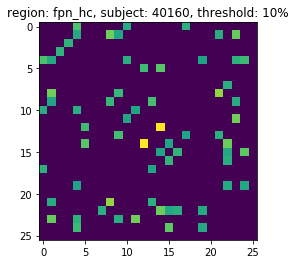

(26,)


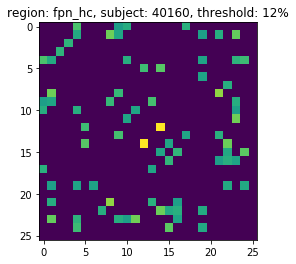

(26,)


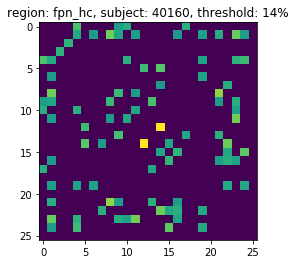

(26,)


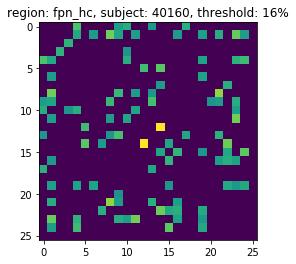

(26,)


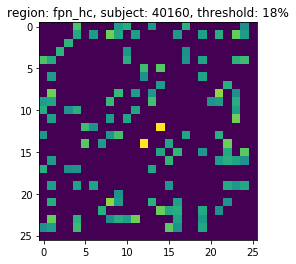

(26,)


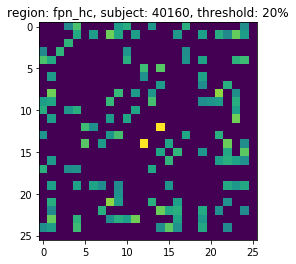

(26,)
(6, 6, 89)


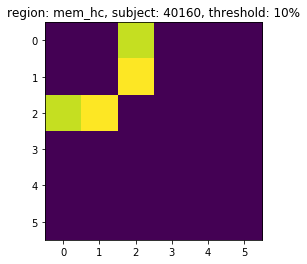

(6,)


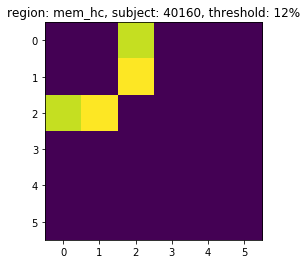

(6,)


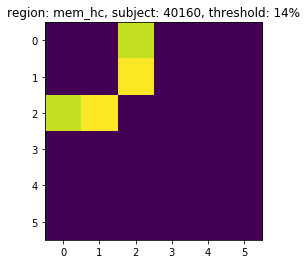

(6,)


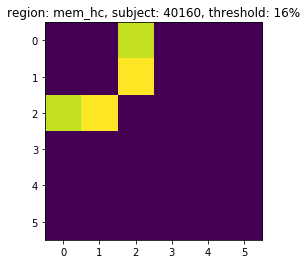

(6,)


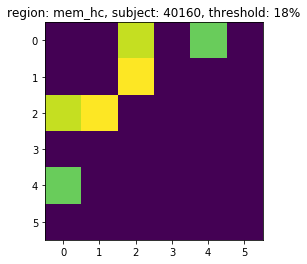

(6,)


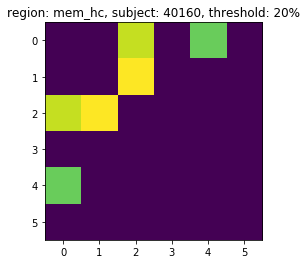

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

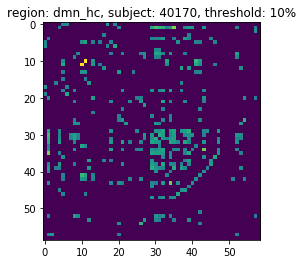

(59,)


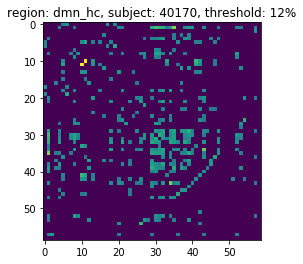

(59,)


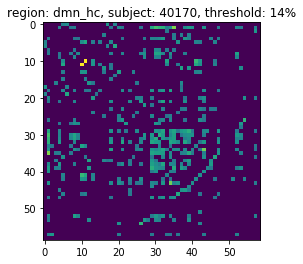

(59,)


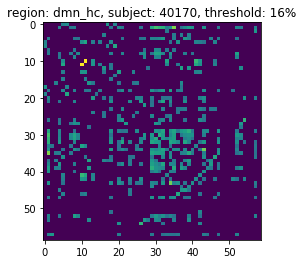

(59,)


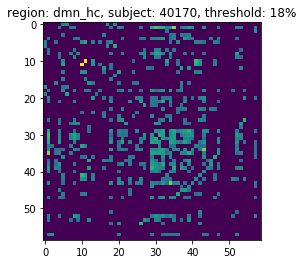

(59,)


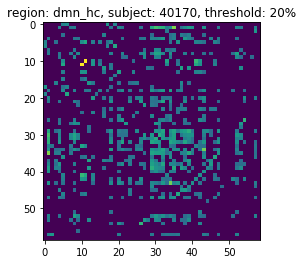

(59,)
(26, 26, 89)


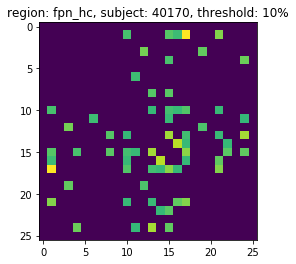

(26,)


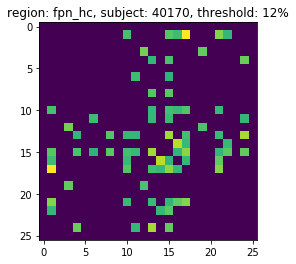

(26,)


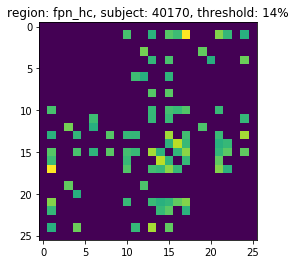

(26,)


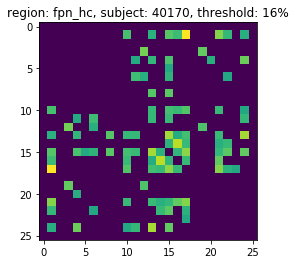

(26,)


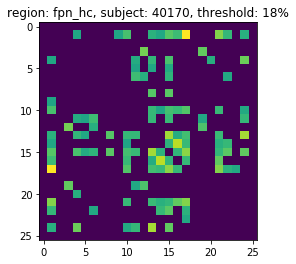

(26,)


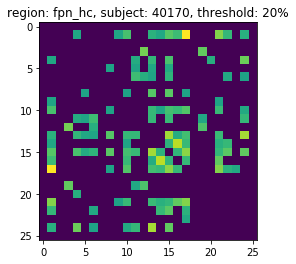

(26,)
(6, 6, 89)


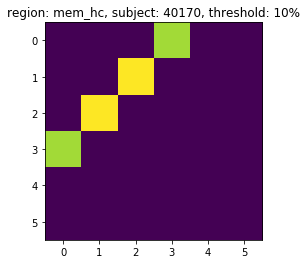

(6,)


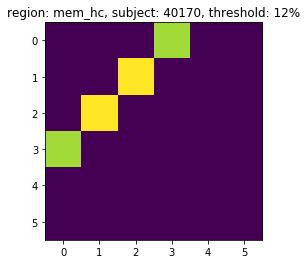

(6,)


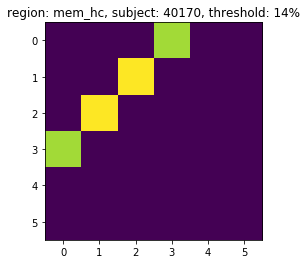

(6,)


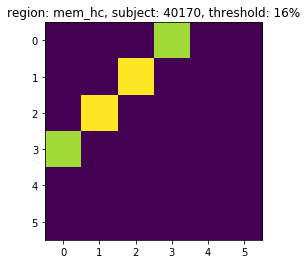

(6,)


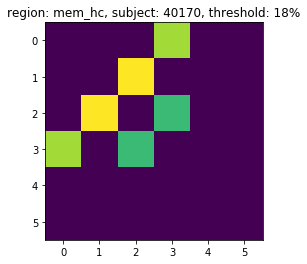

(6,)


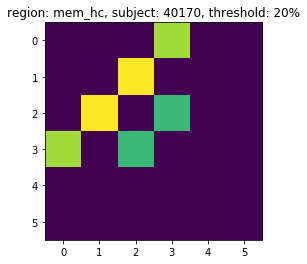

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

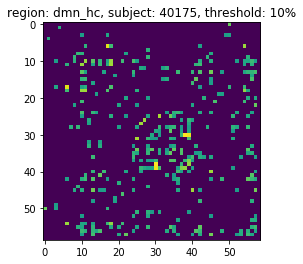

(59,)


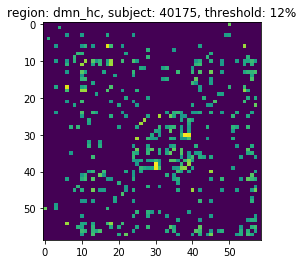

(59,)


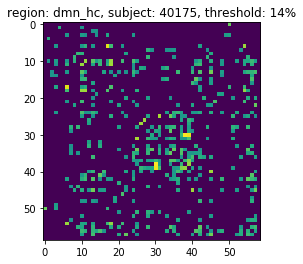

(59,)


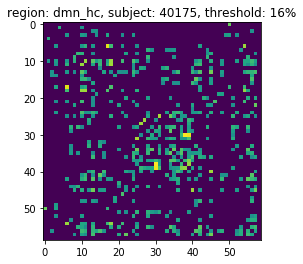

(59,)


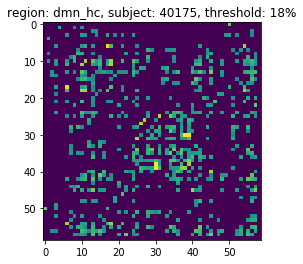

(59,)


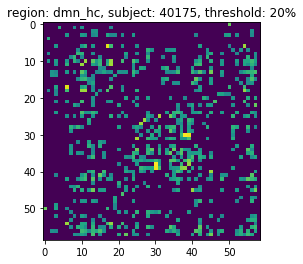

(59,)
(26, 26, 89)


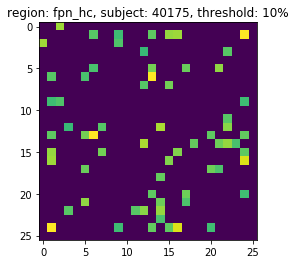

(26,)


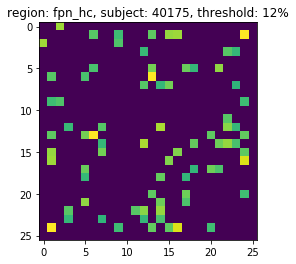

(26,)


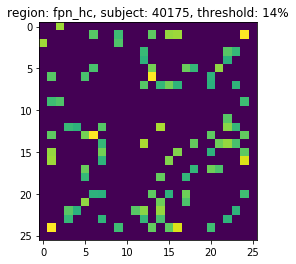

(26,)


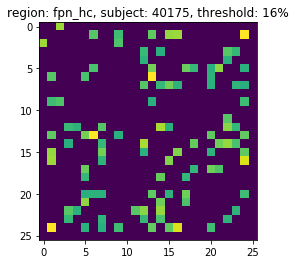

(26,)


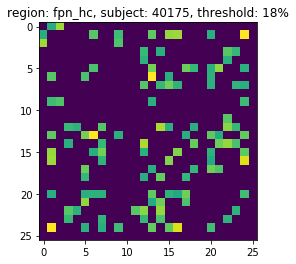

(26,)


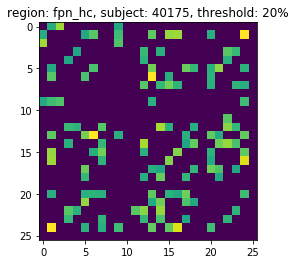

(26,)
(6, 6, 89)


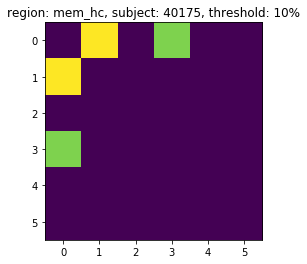

(6,)


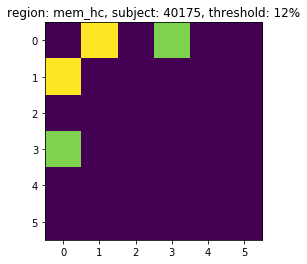

(6,)


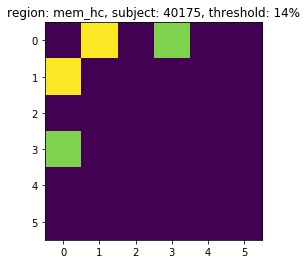

(6,)


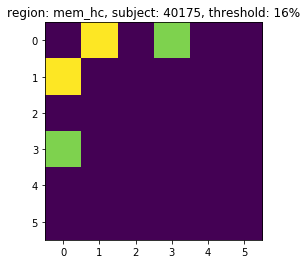

(6,)


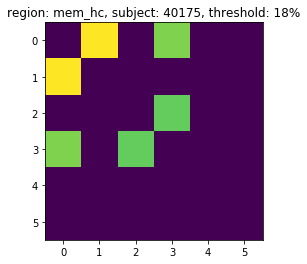

(6,)


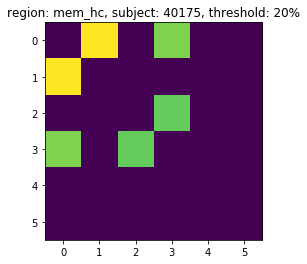

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

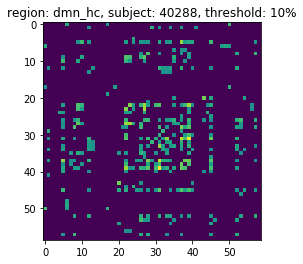

(59,)


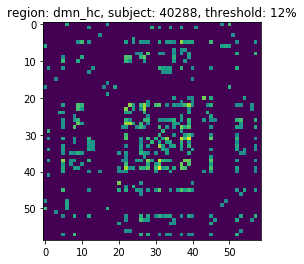

(59,)


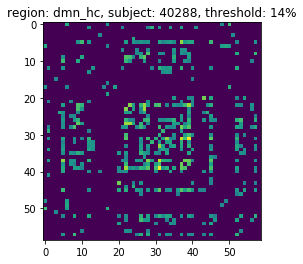

(59,)


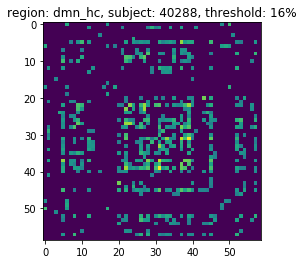

(59,)


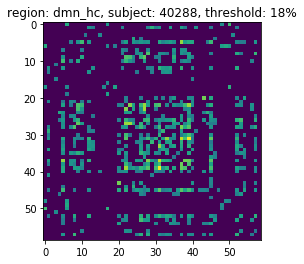

(59,)


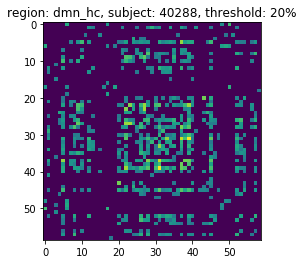

(59,)
(26, 26, 89)


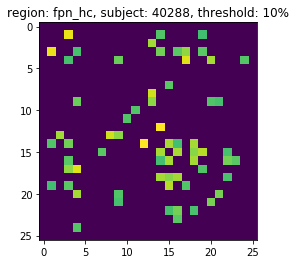

(26,)


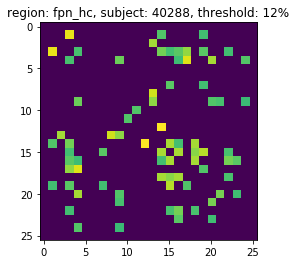

(26,)


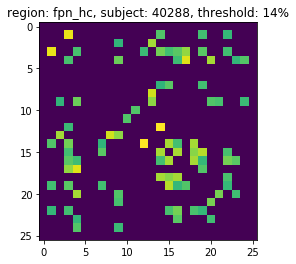

(26,)


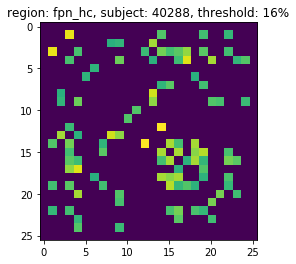

(26,)


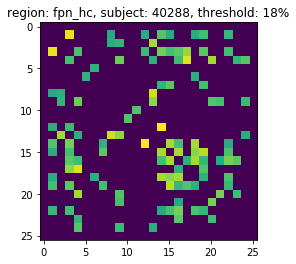

(26,)


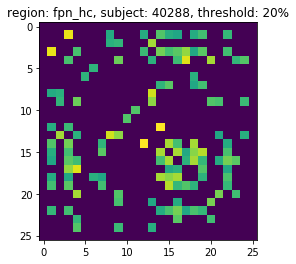

(26,)
(6, 6, 89)


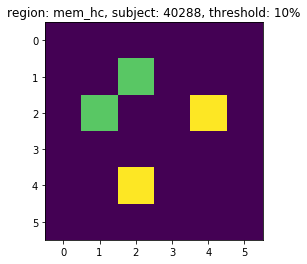

(6,)


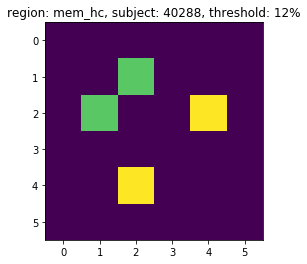

(6,)


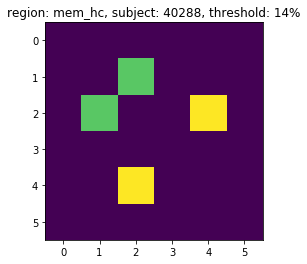

(6,)


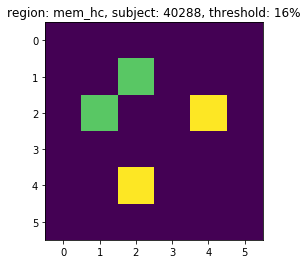

(6,)


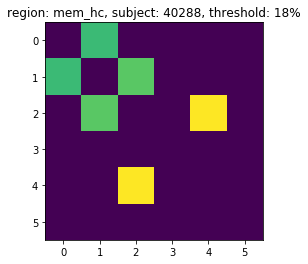

(6,)


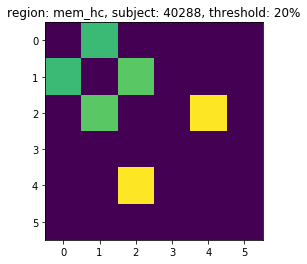

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

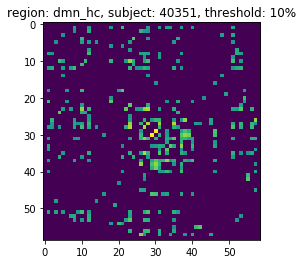

(59,)


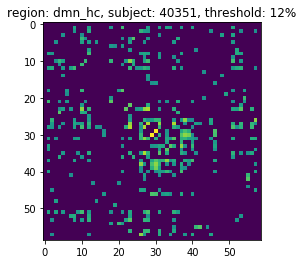

(59,)


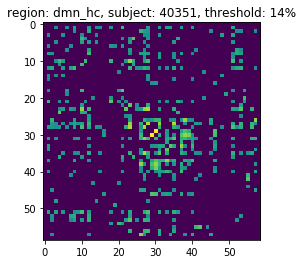

(59,)


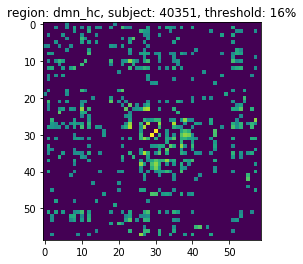

(59,)


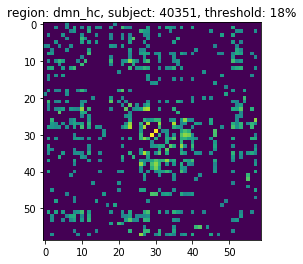

(59,)


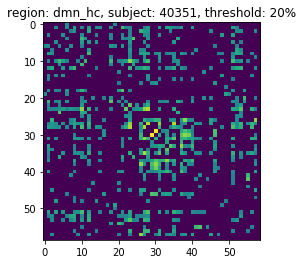

(59,)
(26, 26, 89)


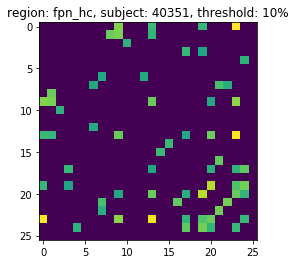

(26,)


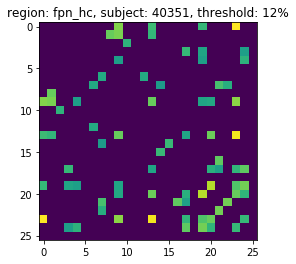

(26,)


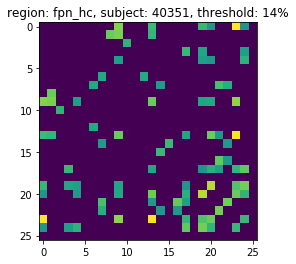

(26,)


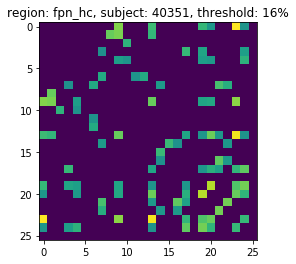

(26,)


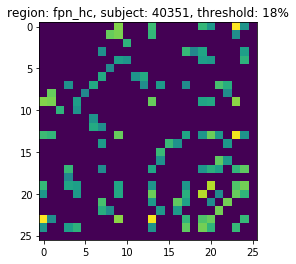

(26,)


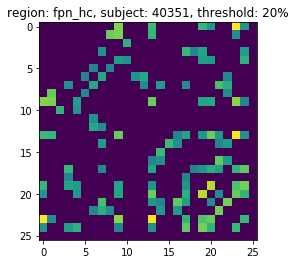

(26,)
(6, 6, 89)


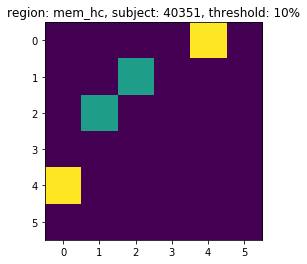

(6,)


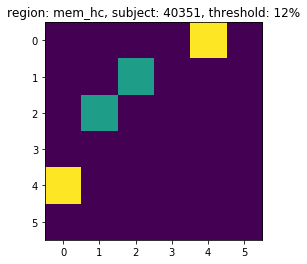

(6,)


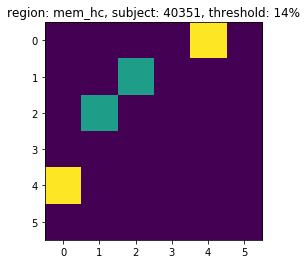

(6,)


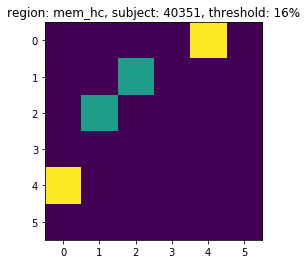

(6,)


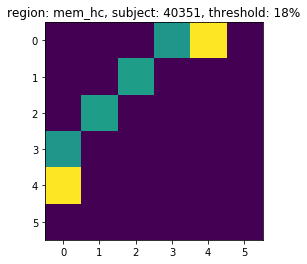

(6,)


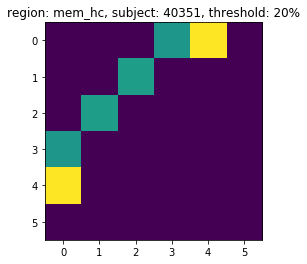

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

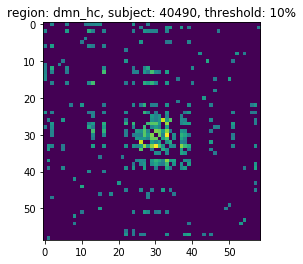

(59,)


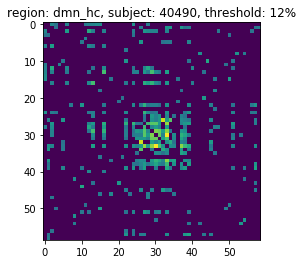

(59,)


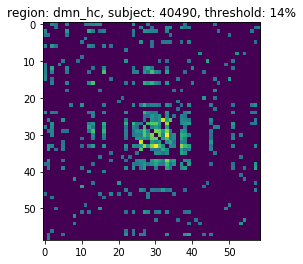

(59,)


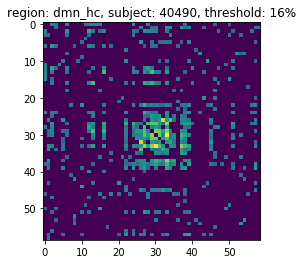

(59,)


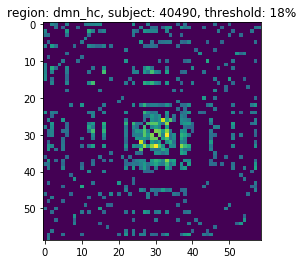

(59,)


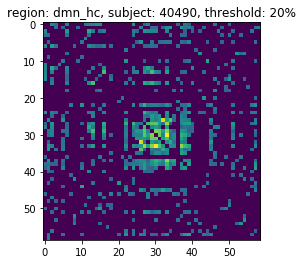

(59,)
(26, 26, 89)


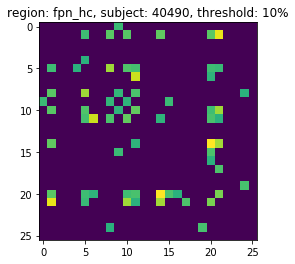

(26,)


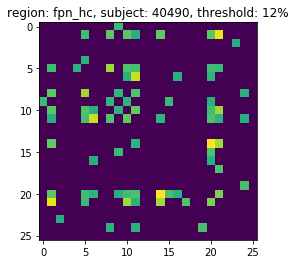

(26,)


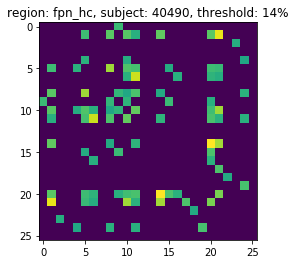

(26,)


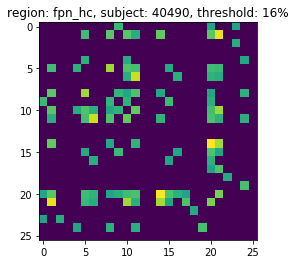

(26,)


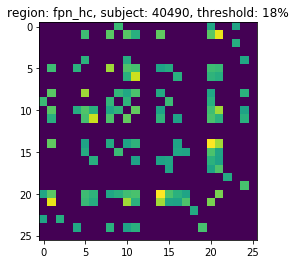

(26,)


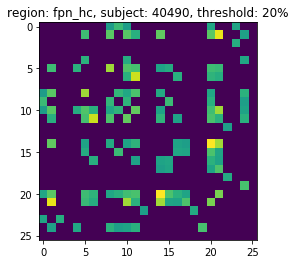

(26,)
(6, 6, 89)


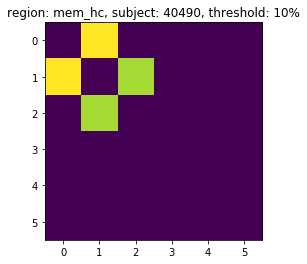

(6,)


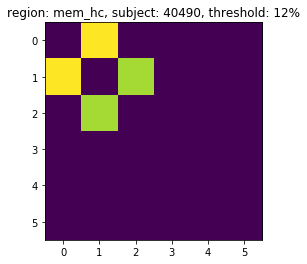

(6,)


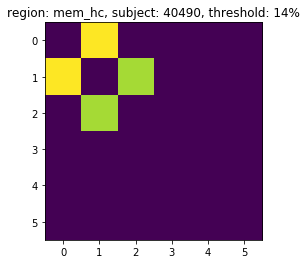

(6,)


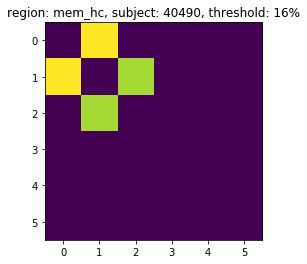

(6,)


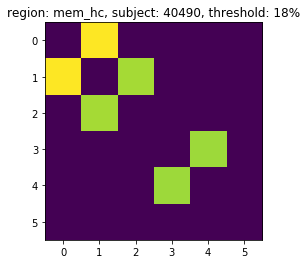

(6,)


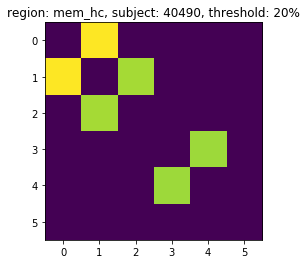

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

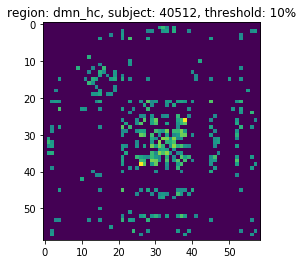

(59,)


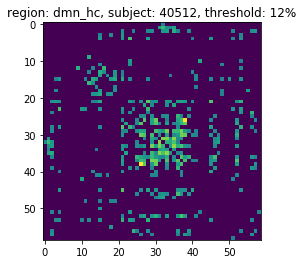

(59,)


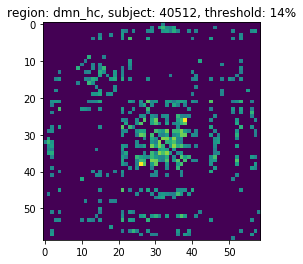

(59,)


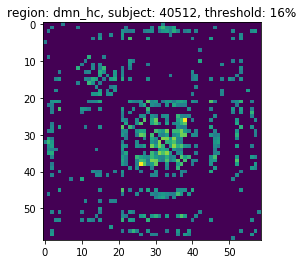

(59,)


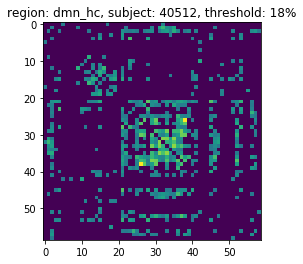

(59,)


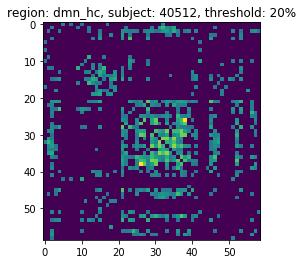

(59,)
(26, 26, 89)


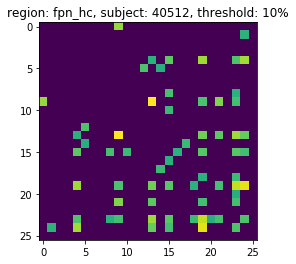

(26,)


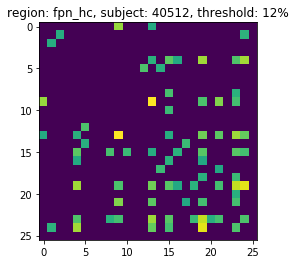

(26,)


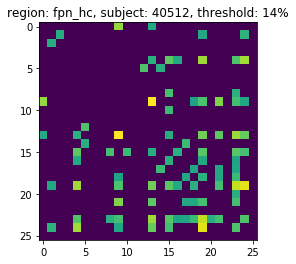

(26,)


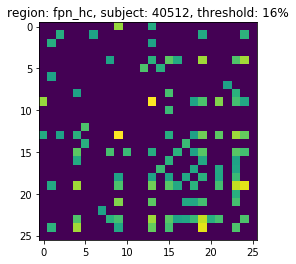

(26,)


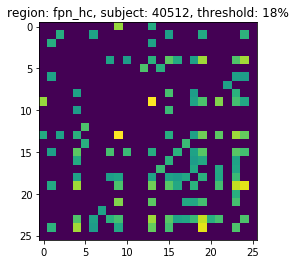

(26,)


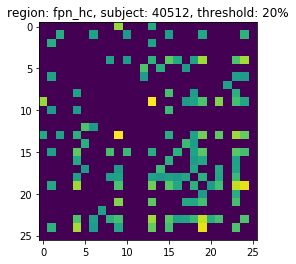

(26,)
(6, 6, 89)


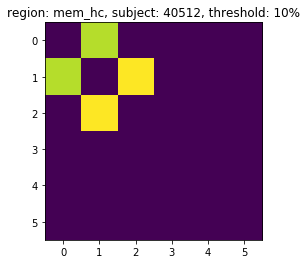

(6,)


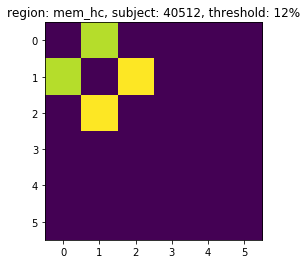

(6,)


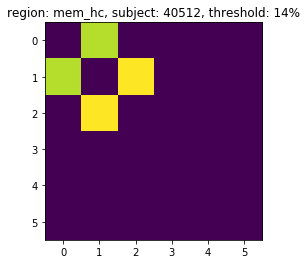

(6,)


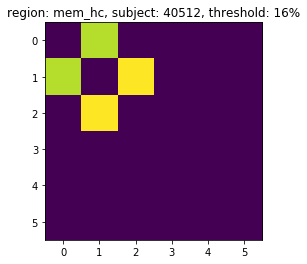

(6,)


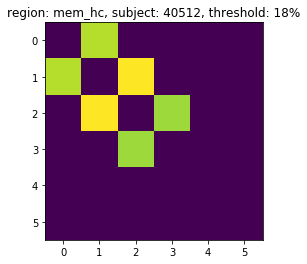

(6,)


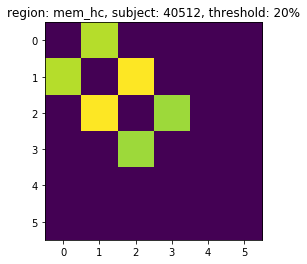

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

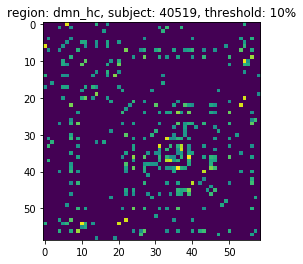

(59,)


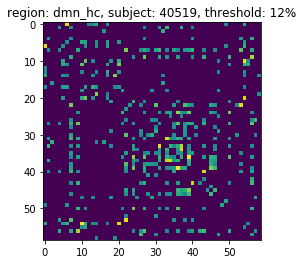

(59,)


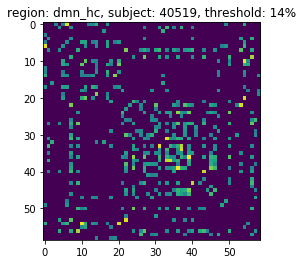

(59,)


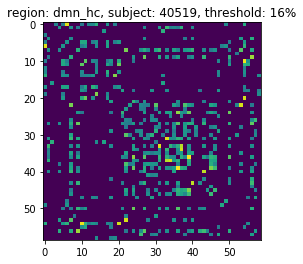

(59,)


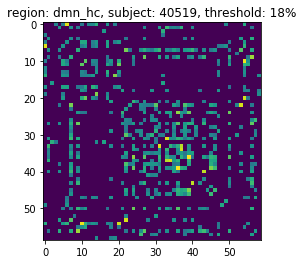

(59,)


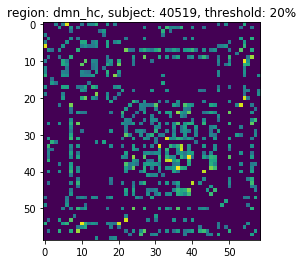

(59,)
(26, 26, 89)


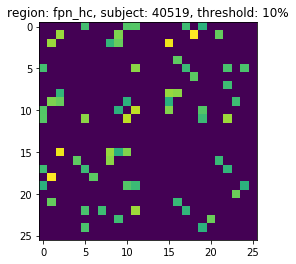

(26,)


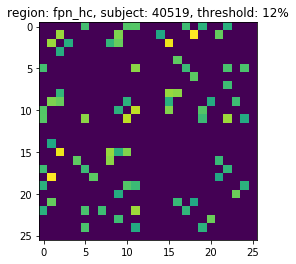

(26,)


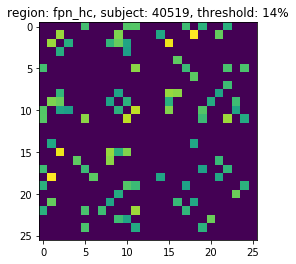

(26,)


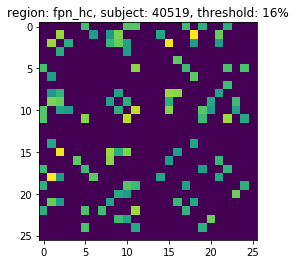

(26,)


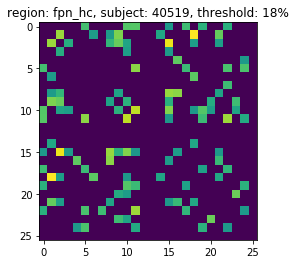

(26,)


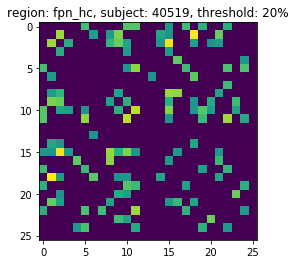

(26,)
(6, 6, 89)


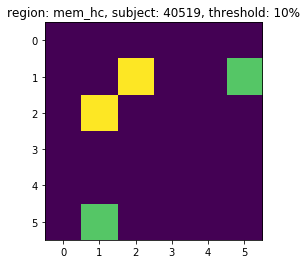

(6,)


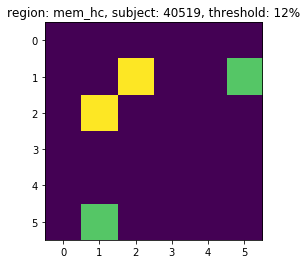

(6,)


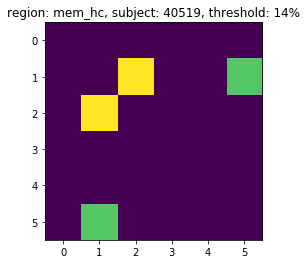

(6,)


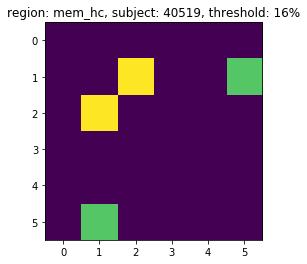

(6,)


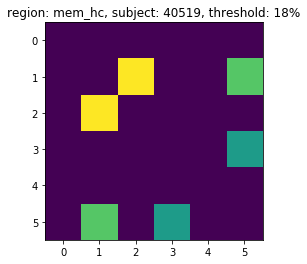

(6,)


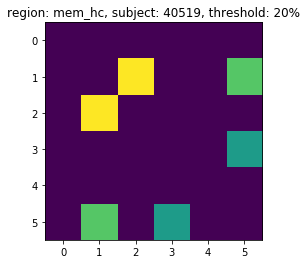

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

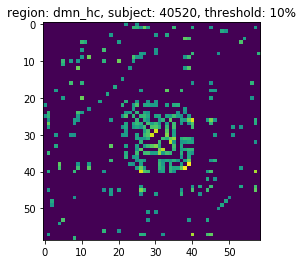

(59,)


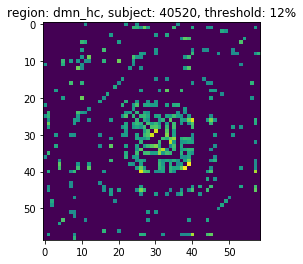

(59,)


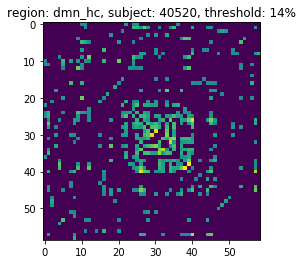

(59,)


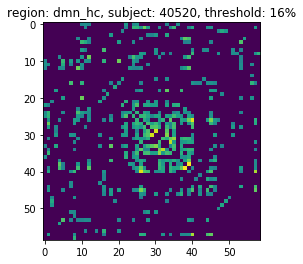

(59,)


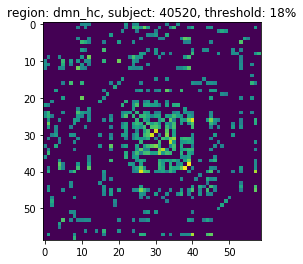

(59,)


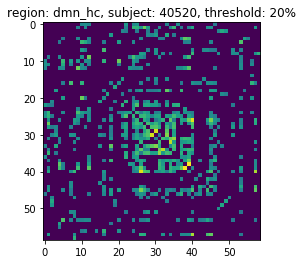

(59,)
(26, 26, 89)


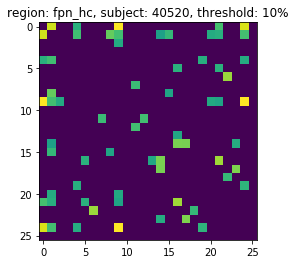

(26,)


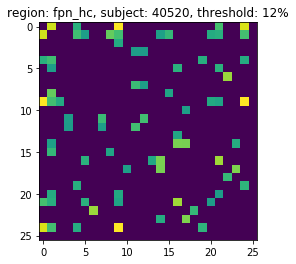

(26,)


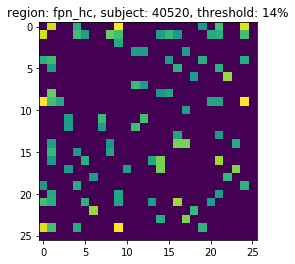

(26,)


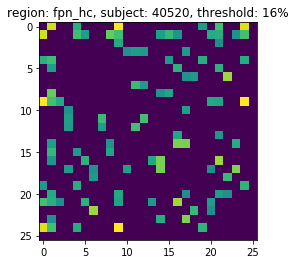

(26,)


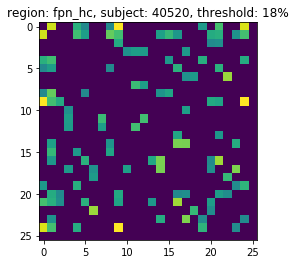

(26,)


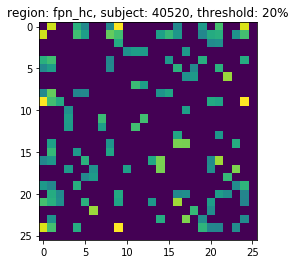

(26,)
(6, 6, 89)


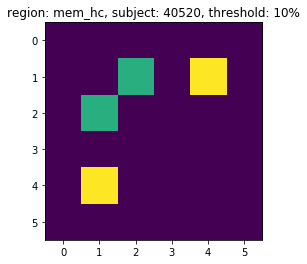

(6,)


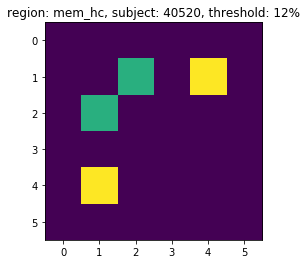

(6,)


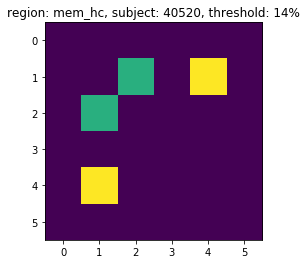

(6,)


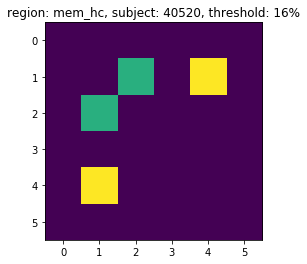

(6,)


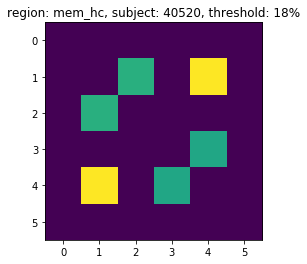

(6,)


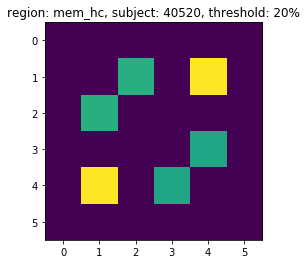

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

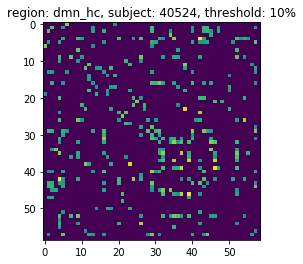

(59,)


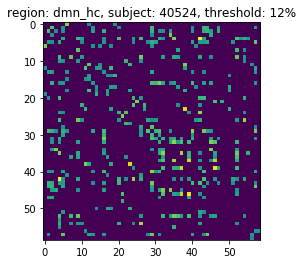

(59,)


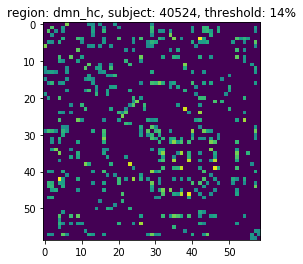

(59,)


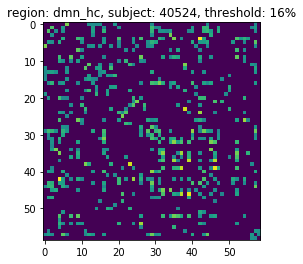

(59,)


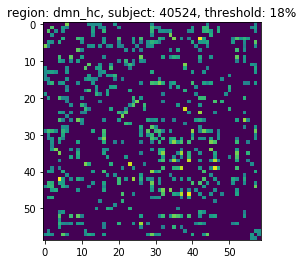

(59,)


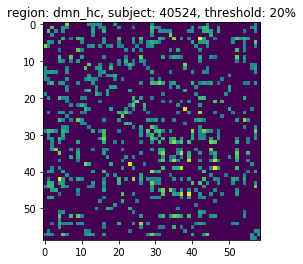

(59,)
(26, 26, 89)


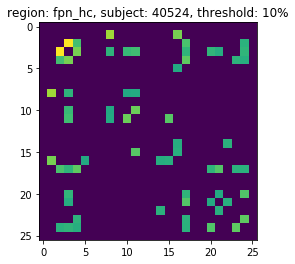

(26,)


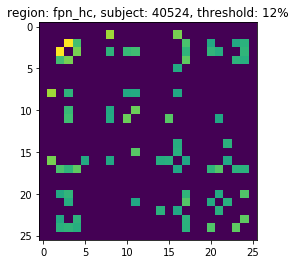

(26,)


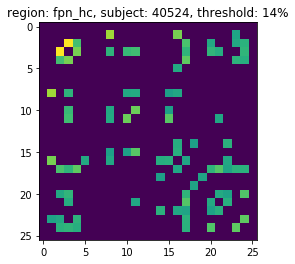

(26,)


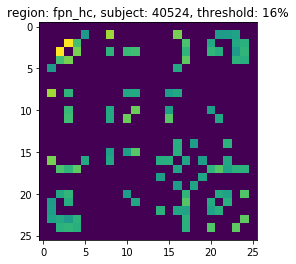

(26,)


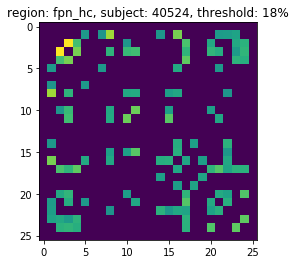

(26,)


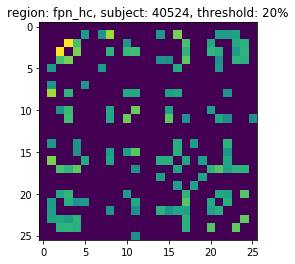

(26,)
(6, 6, 89)


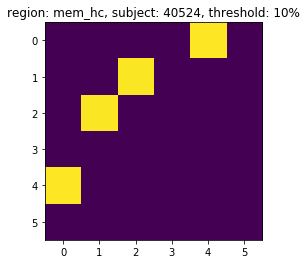

(6,)


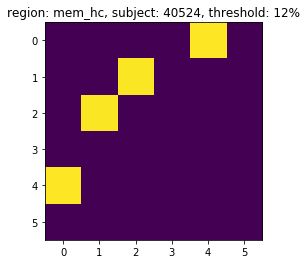

(6,)


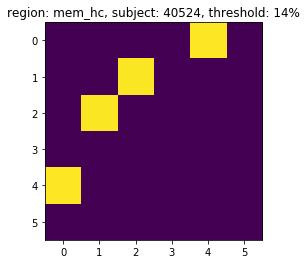

(6,)


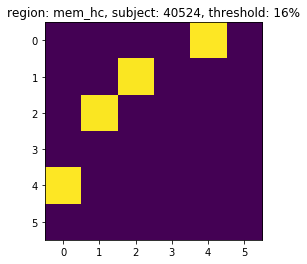

(6,)


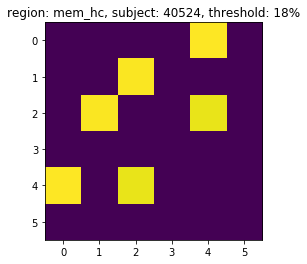

(6,)


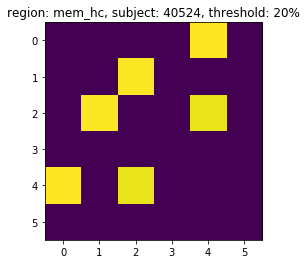

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

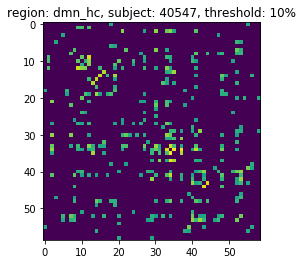

(59,)


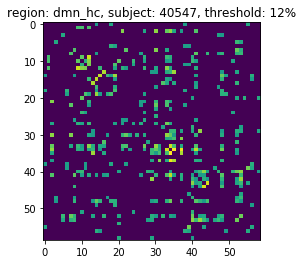

(59,)


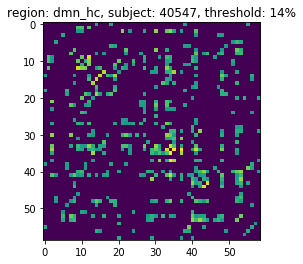

(59,)


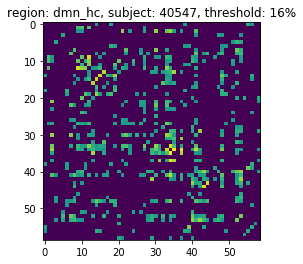

(59,)


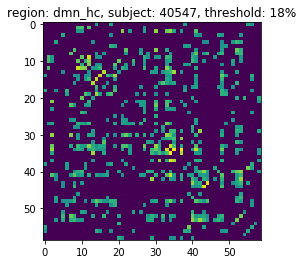

(59,)


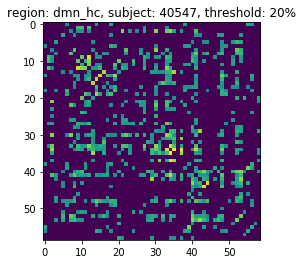

(59,)
(26, 26, 89)


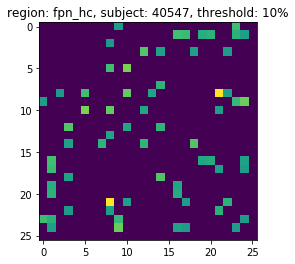

(26,)


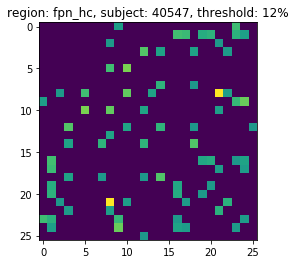

(26,)


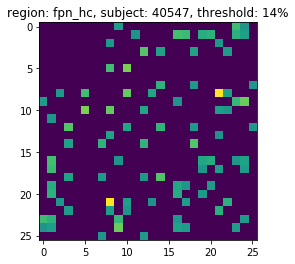

(26,)


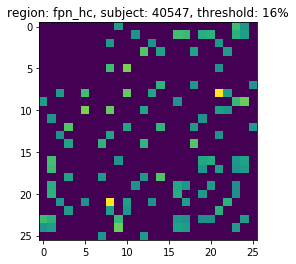

(26,)


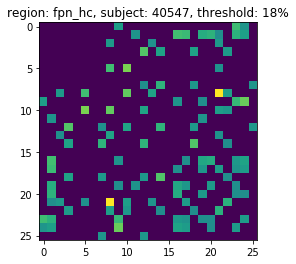

(26,)


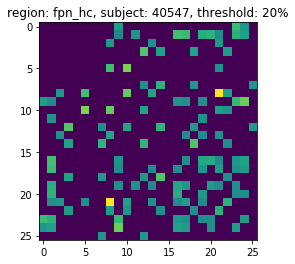

(26,)
(6, 6, 89)


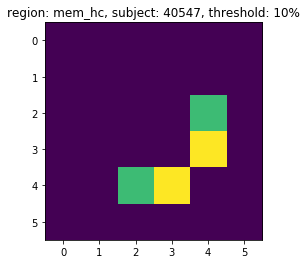

(6,)


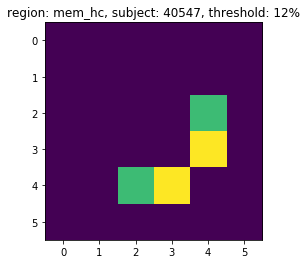

(6,)


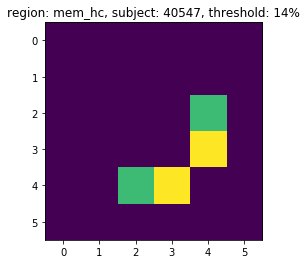

(6,)


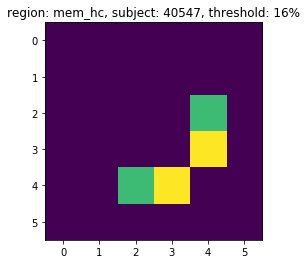

(6,)


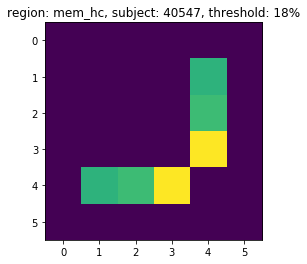

(6,)


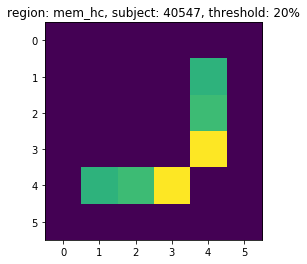

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

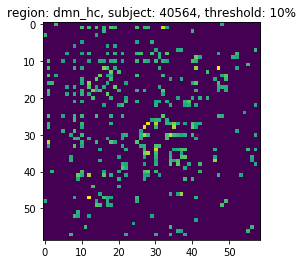

(59,)


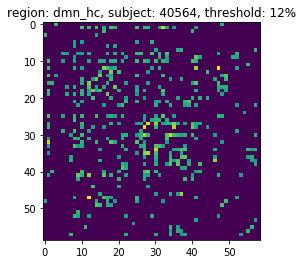

(59,)


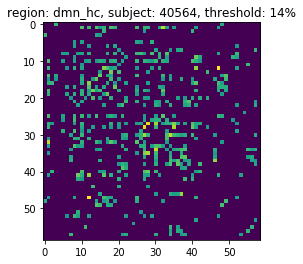

(59,)


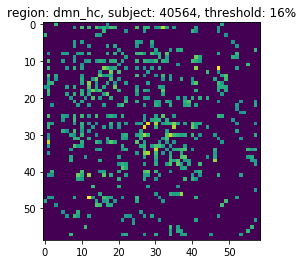

(59,)


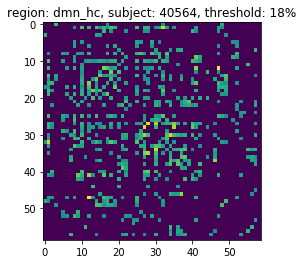

(59,)


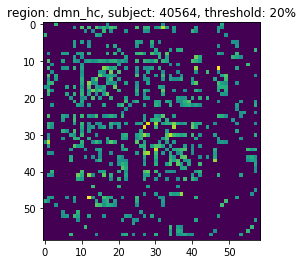

(59,)
(26, 26, 89)


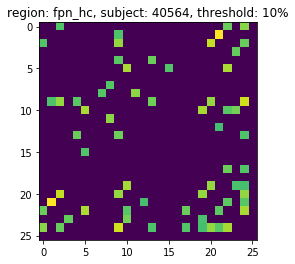

(26,)


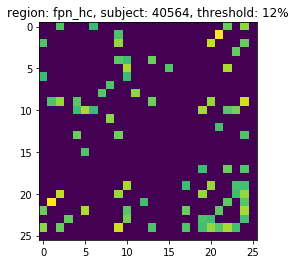

(26,)


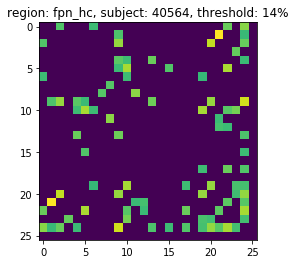

(26,)


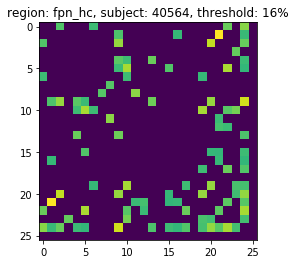

(26,)


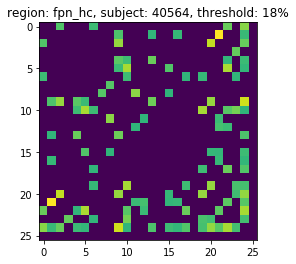

(26,)


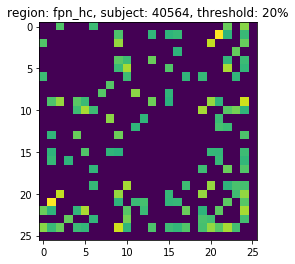

(26,)
(6, 6, 89)


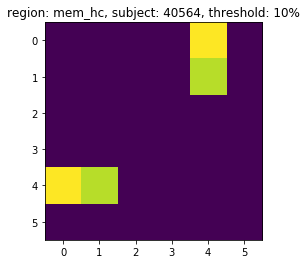

(6,)


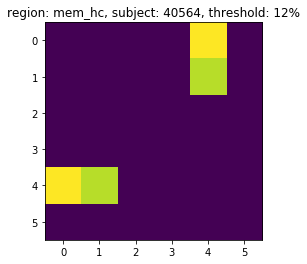

(6,)


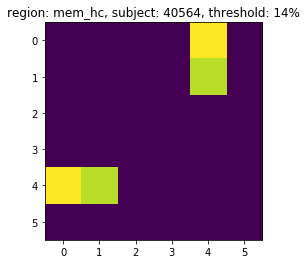

(6,)


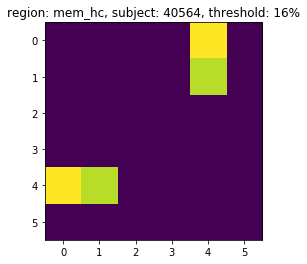

(6,)


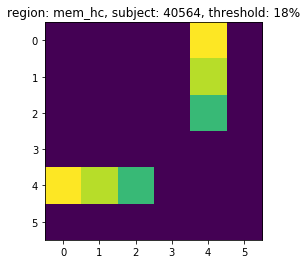

(6,)


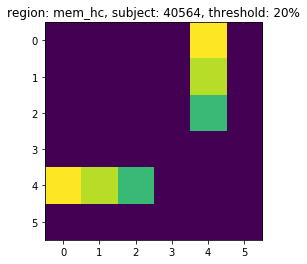

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

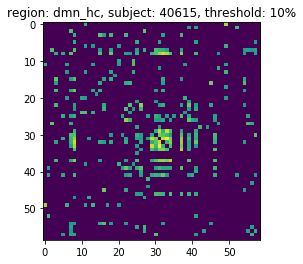

(59,)


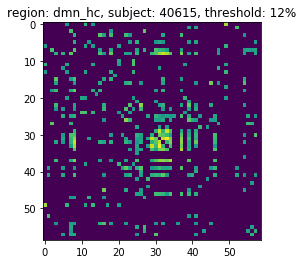

(59,)


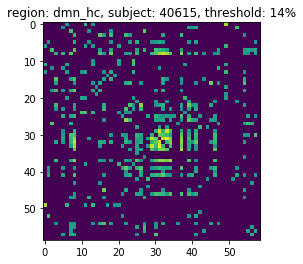

(59,)


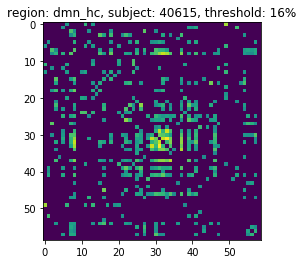

(59,)


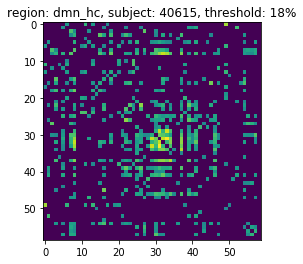

(59,)


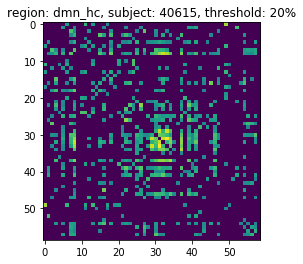

(59,)
(26, 26, 89)


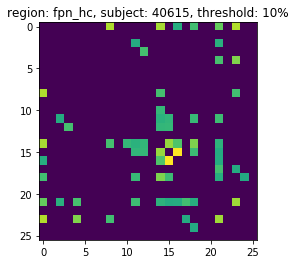

(26,)


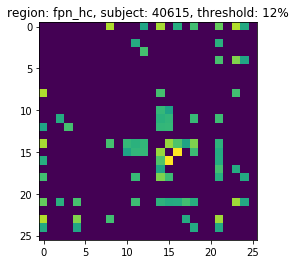

(26,)


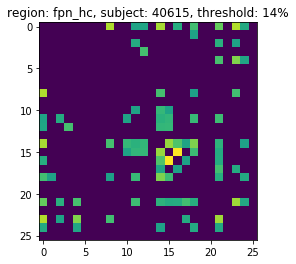

(26,)


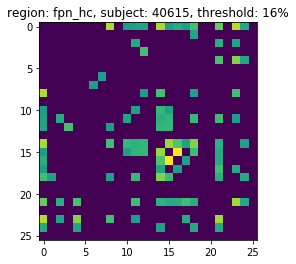

(26,)


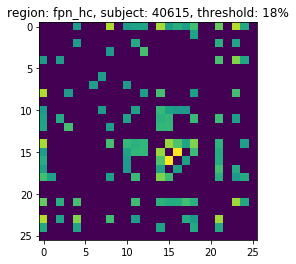

(26,)


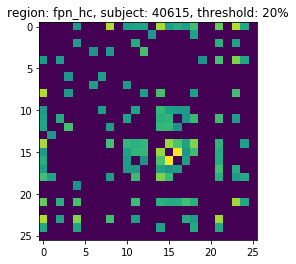

(26,)
(6, 6, 89)


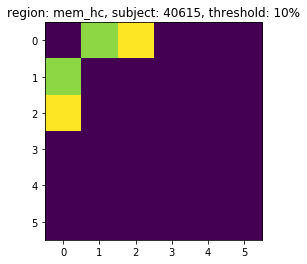

(6,)


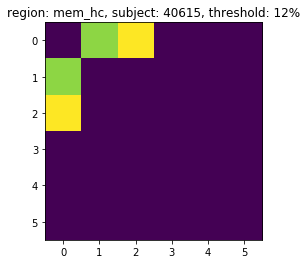

(6,)


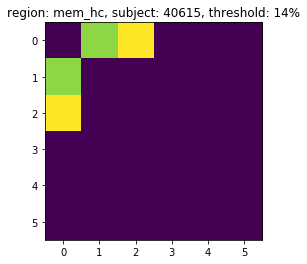

(6,)


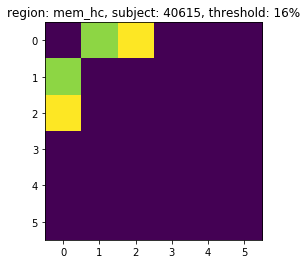

(6,)


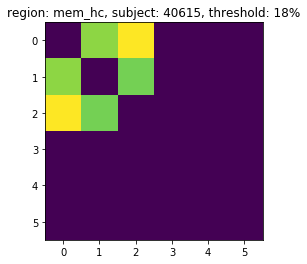

(6,)


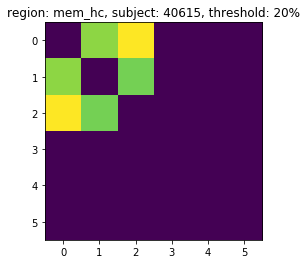

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

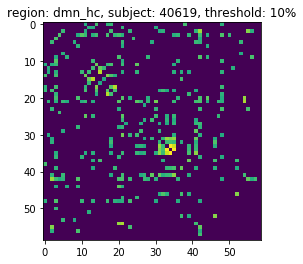

(59,)


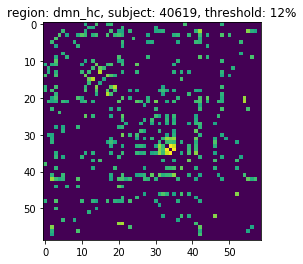

(59,)


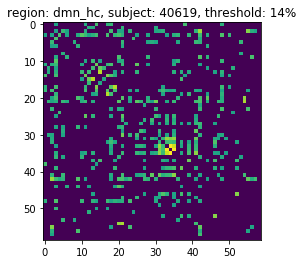

(59,)


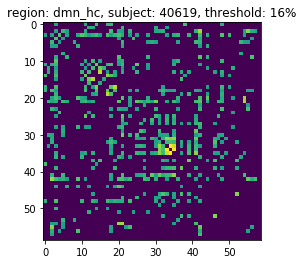

(59,)


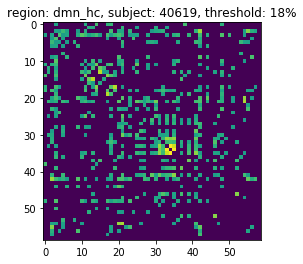

(59,)


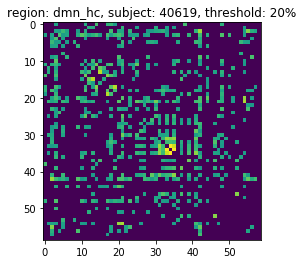

(59,)
(26, 26, 89)


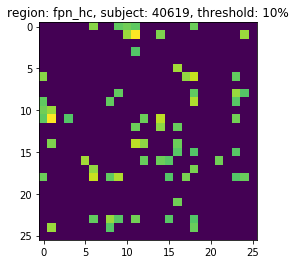

(26,)


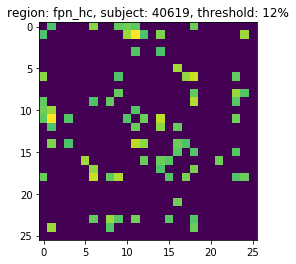

(26,)


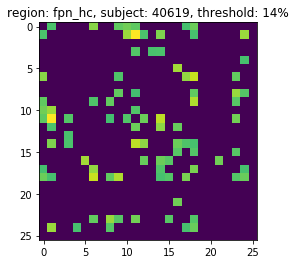

(26,)


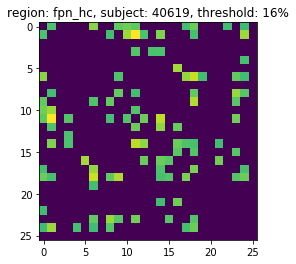

(26,)


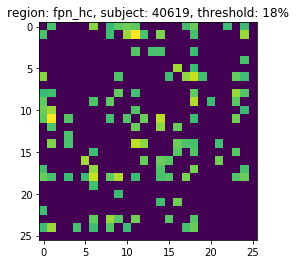

(26,)


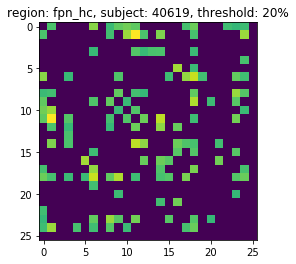

(26,)
(6, 6, 89)


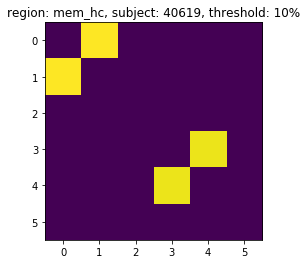

(6,)


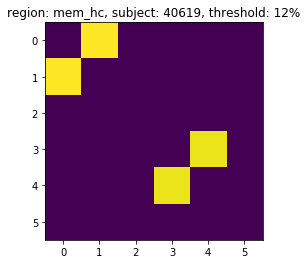

(6,)


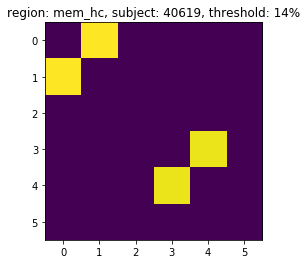

(6,)


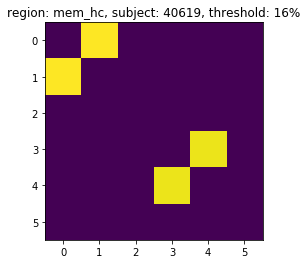

(6,)


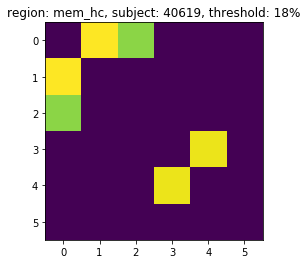

(6,)


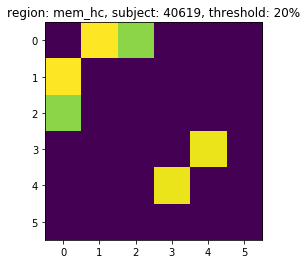

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

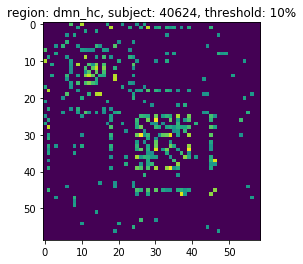

(59,)


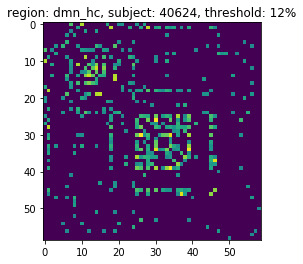

(59,)


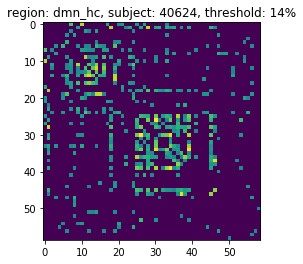

(59,)


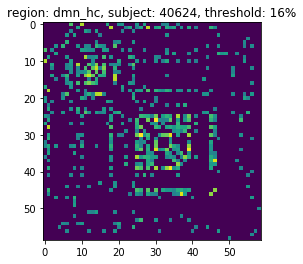

(59,)


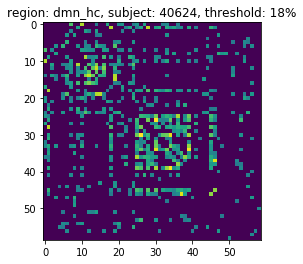

(59,)


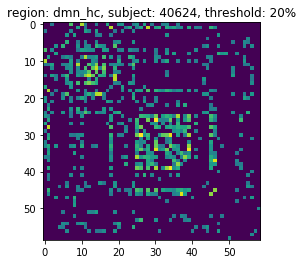

(59,)
(26, 26, 89)


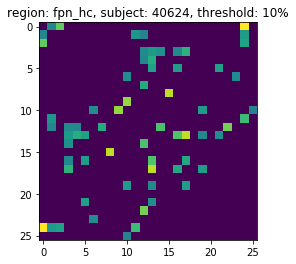

(26,)


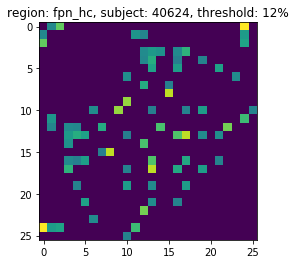

(26,)


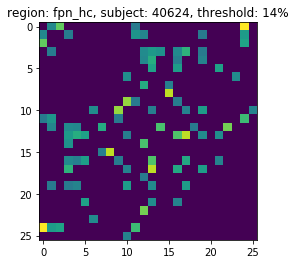

(26,)


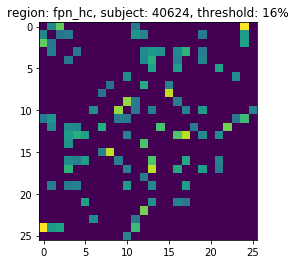

(26,)


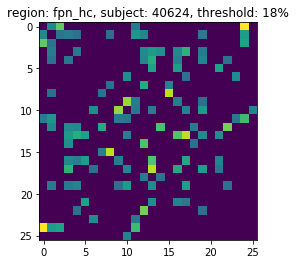

(26,)


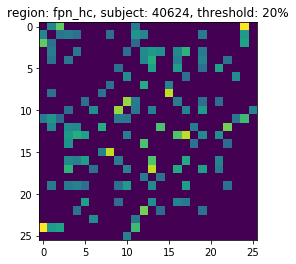

(26,)
(6, 6, 89)


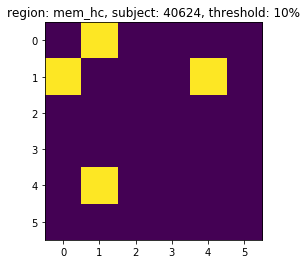

(6,)


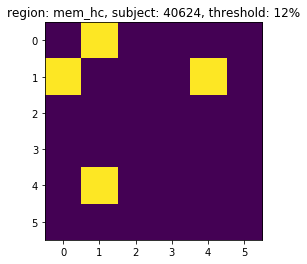

(6,)


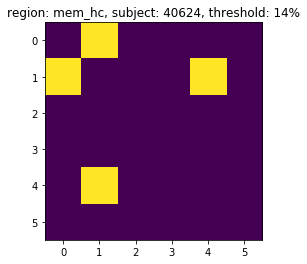

(6,)


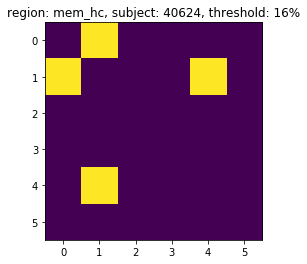

(6,)


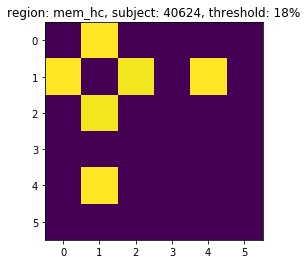

(6,)


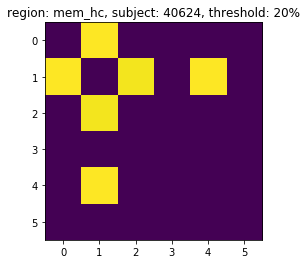

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

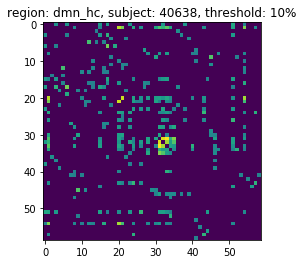

(59,)


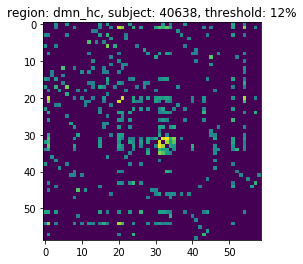

(59,)


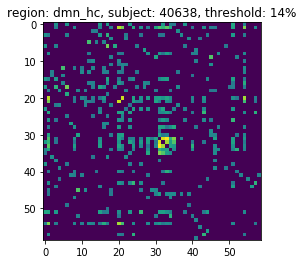

(59,)


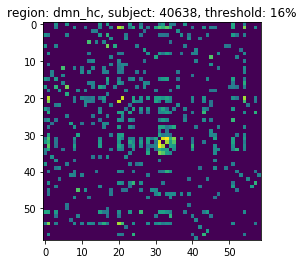

(59,)


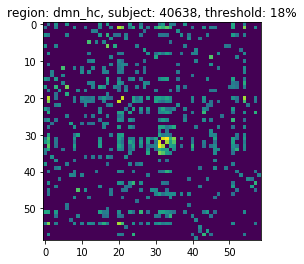

(59,)


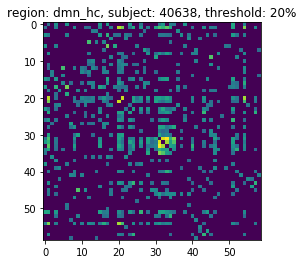

(59,)
(26, 26, 89)


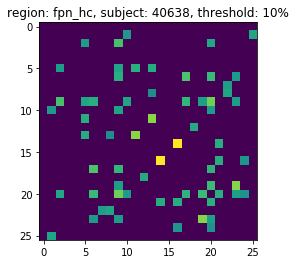

(26,)


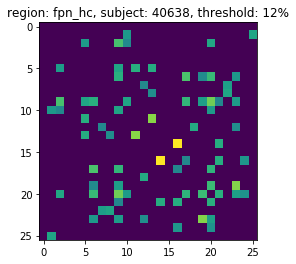

(26,)


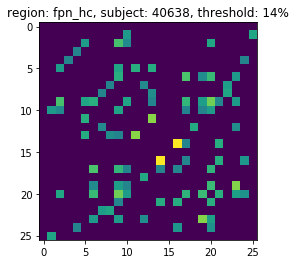

(26,)


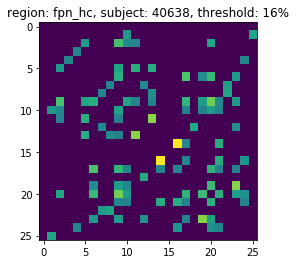

(26,)


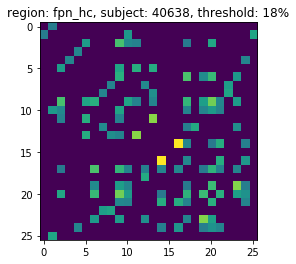

(26,)


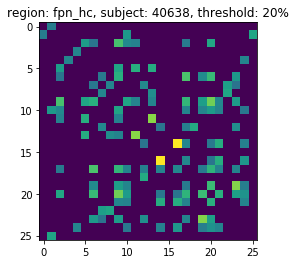

(26,)
(6, 6, 89)


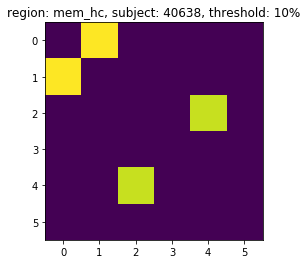

(6,)


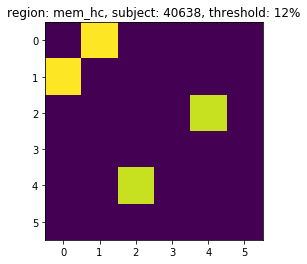

(6,)


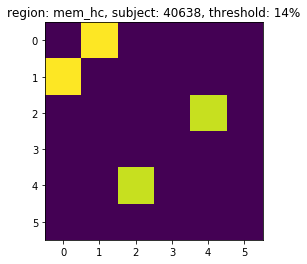

(6,)


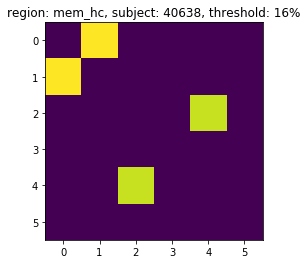

(6,)


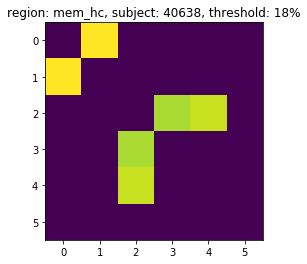

(6,)


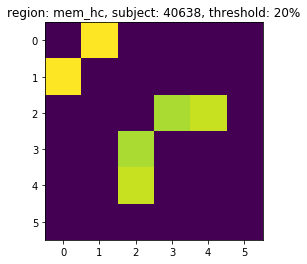

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

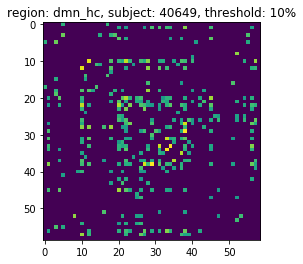

(59,)


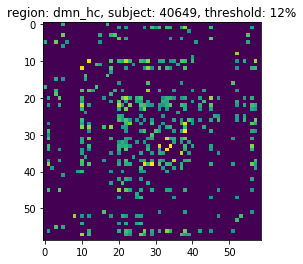

(59,)


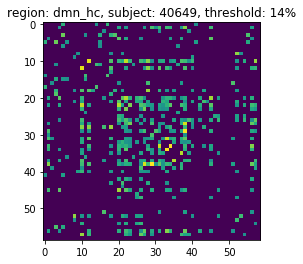

(59,)


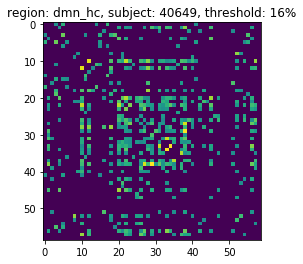

(59,)


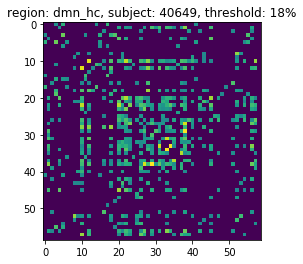

(59,)


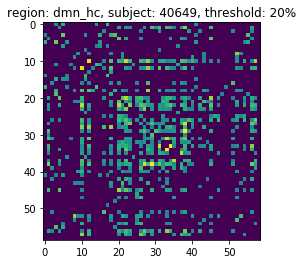

(59,)
(26, 26, 89)


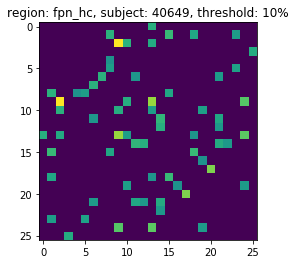

(26,)


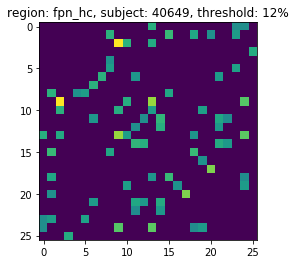

(26,)


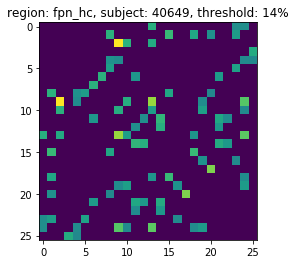

(26,)


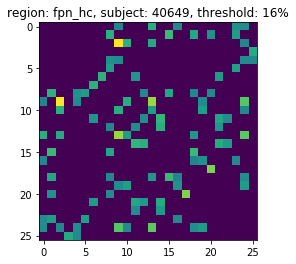

(26,)


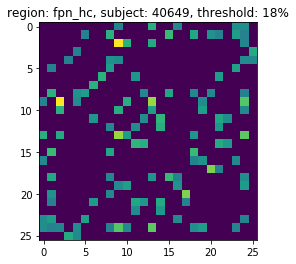

(26,)


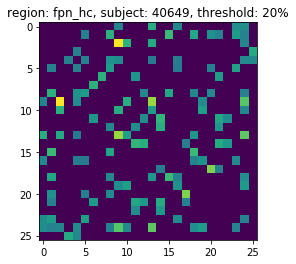

(26,)
(6, 6, 89)


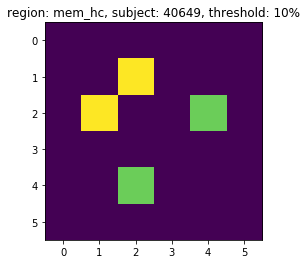

(6,)


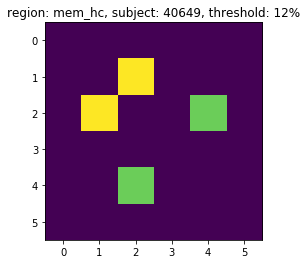

(6,)


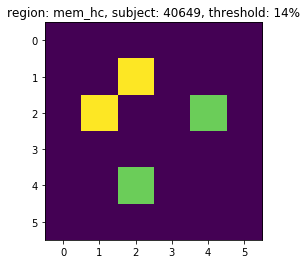

(6,)


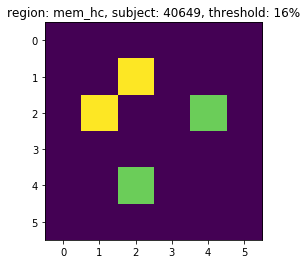

(6,)


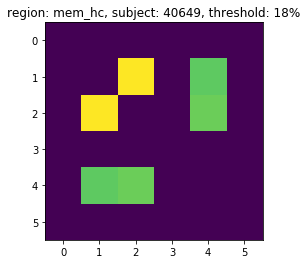

(6,)


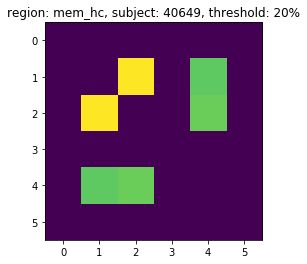

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

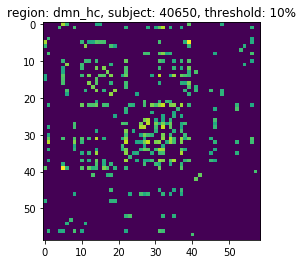

(59,)


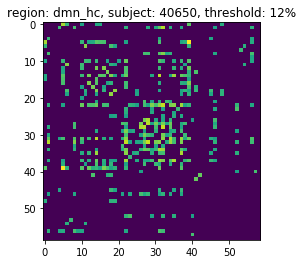

(59,)


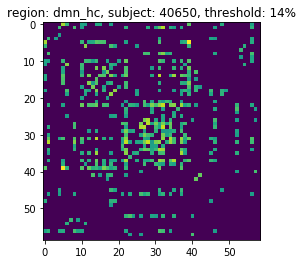

(59,)


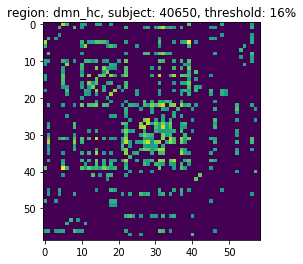

(59,)


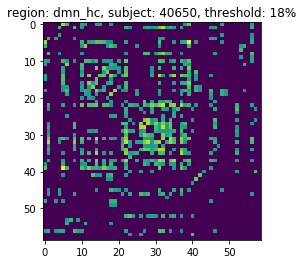

(59,)


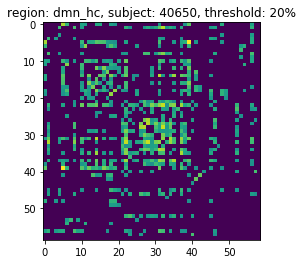

(59,)
(26, 26, 89)


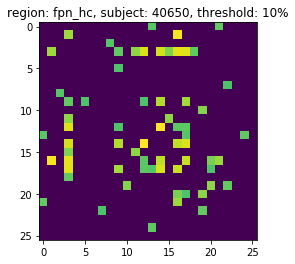

(26,)


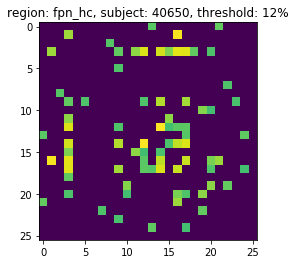

(26,)


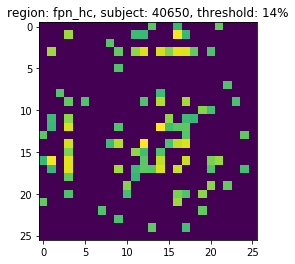

(26,)


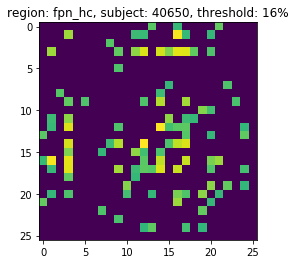

(26,)


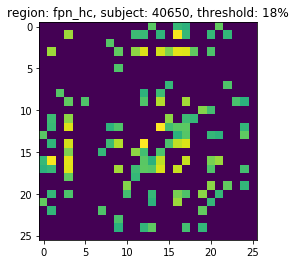

(26,)


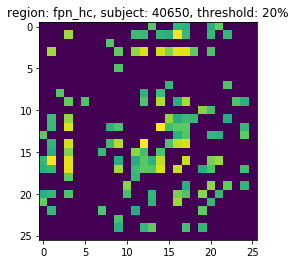

(26,)
(6, 6, 89)


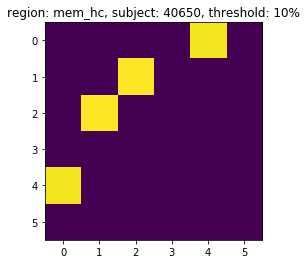

(6,)


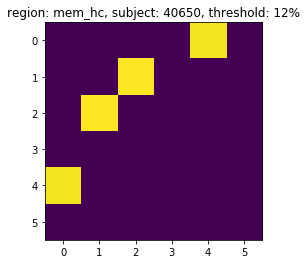

(6,)


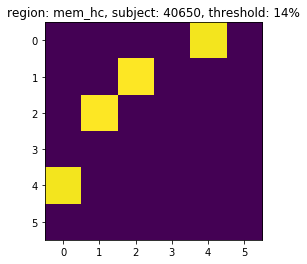

(6,)


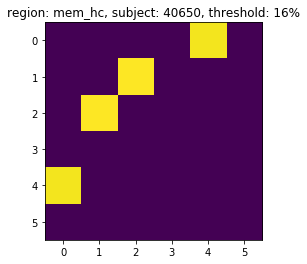

(6,)


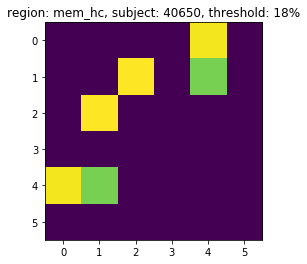

(6,)


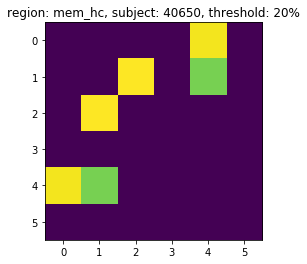

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

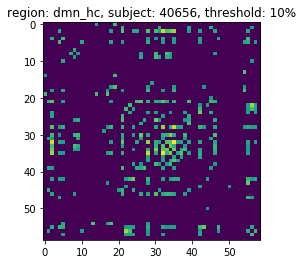

(59,)


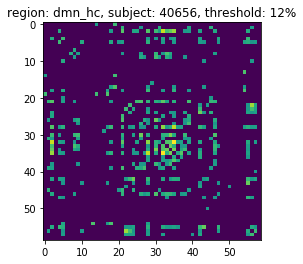

(59,)


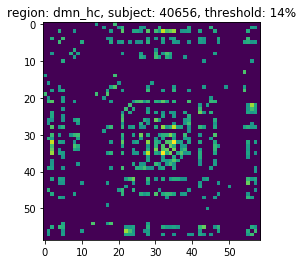

(59,)


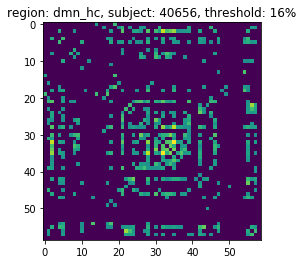

(59,)


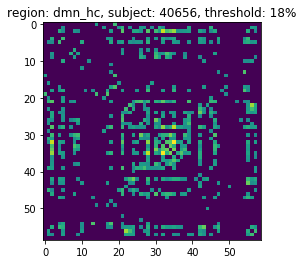

(59,)


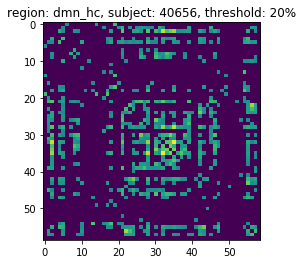

(59,)
(26, 26, 89)


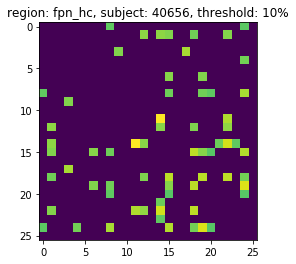

(26,)


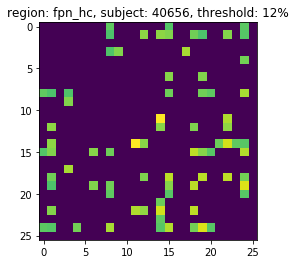

(26,)


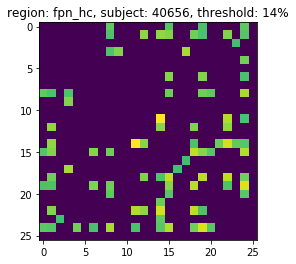

(26,)


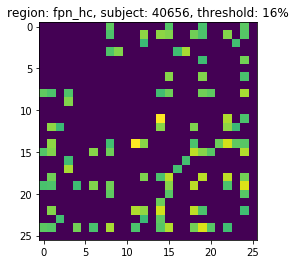

(26,)


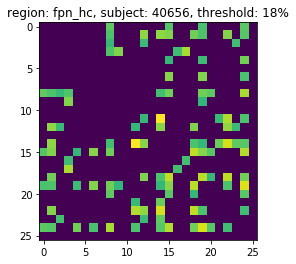

(26,)


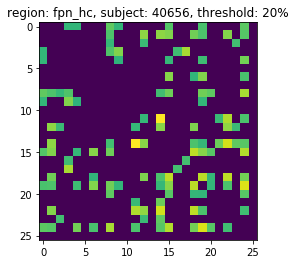

(26,)
(6, 6, 89)


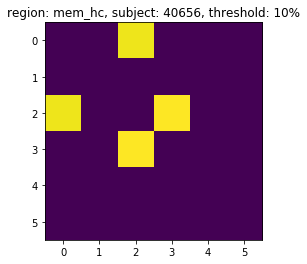

(6,)


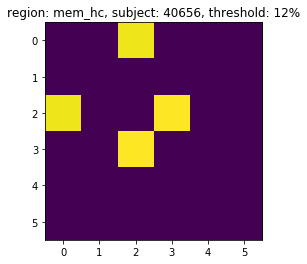

(6,)


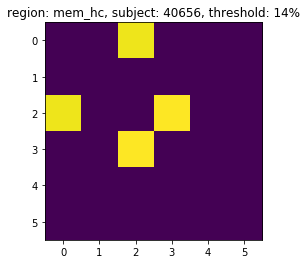

(6,)


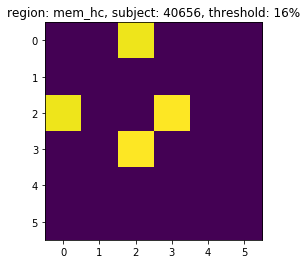

(6,)


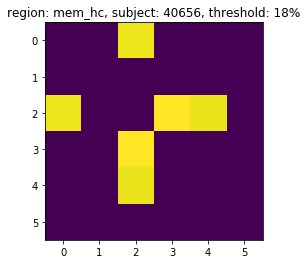

(6,)


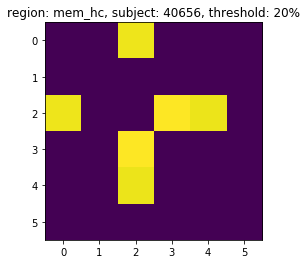

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

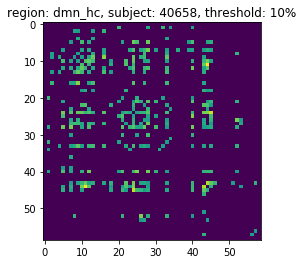

(59,)


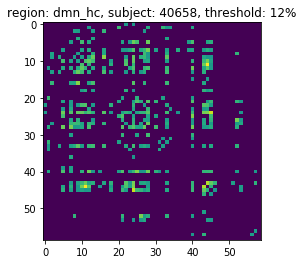

(59,)


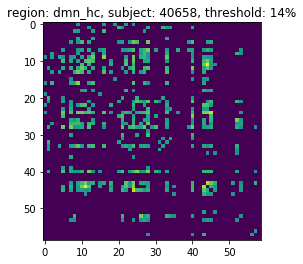

(59,)


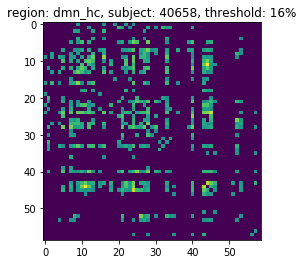

(59,)


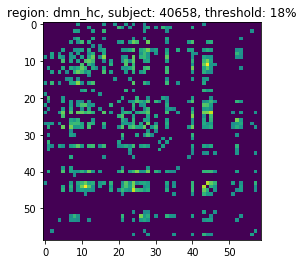

(59,)


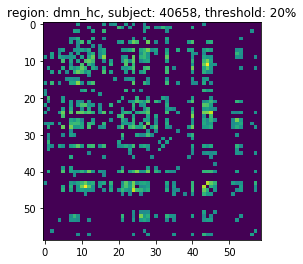

(59,)
(26, 26, 89)


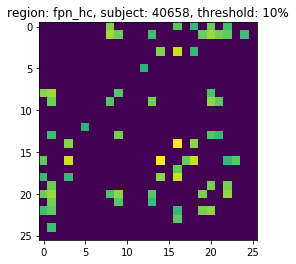

(26,)


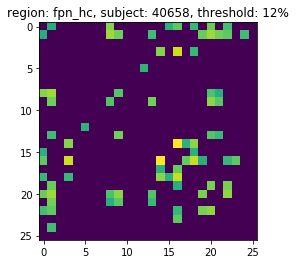

(26,)


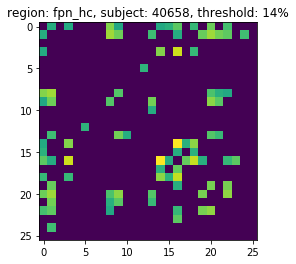

(26,)


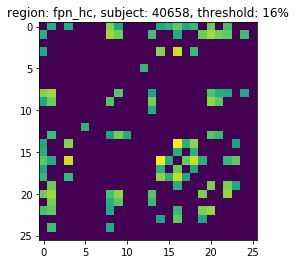

(26,)


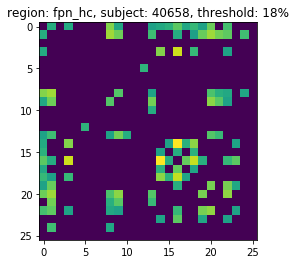

(26,)


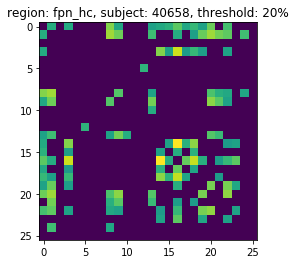

(26,)
(6, 6, 89)


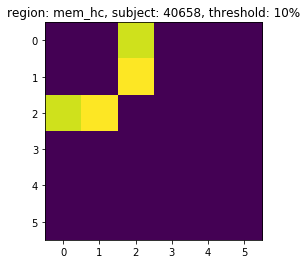

(6,)


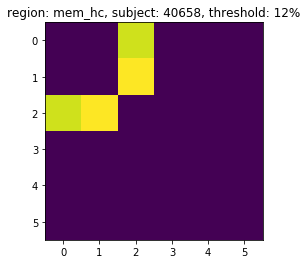

(6,)


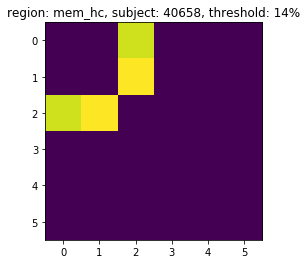

(6,)


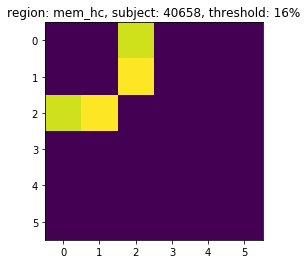

(6,)


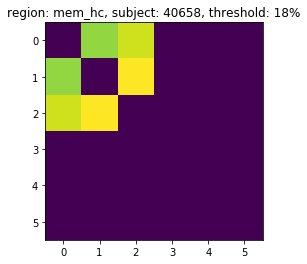

(6,)


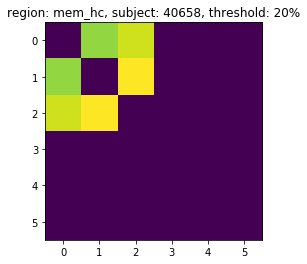

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

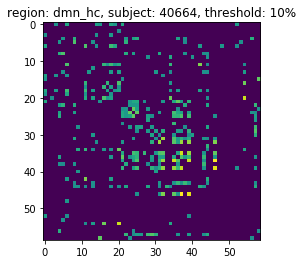

(59,)


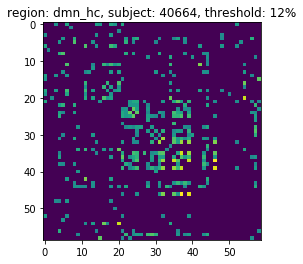

(59,)


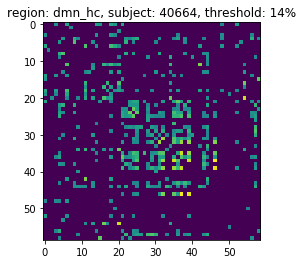

(59,)


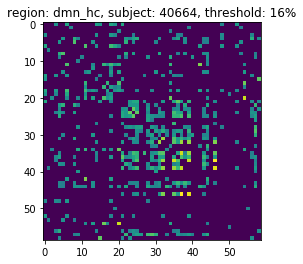

(59,)


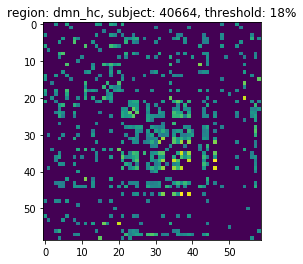

(59,)


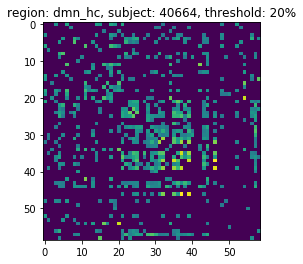

(59,)
(26, 26, 89)


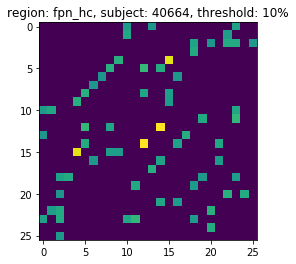

(26,)


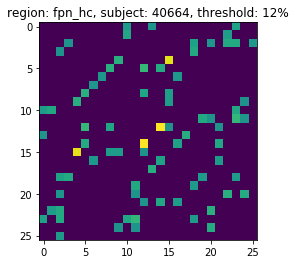

(26,)


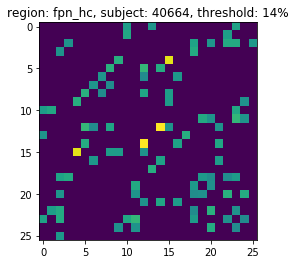

(26,)


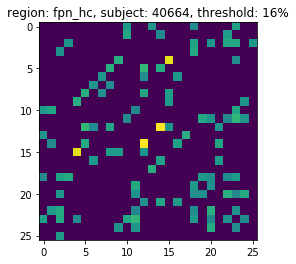

(26,)


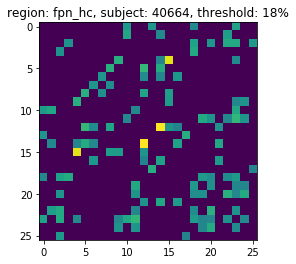

(26,)


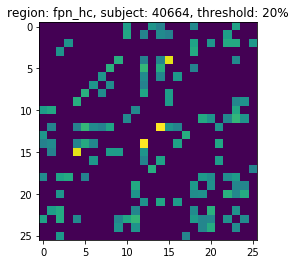

(26,)
(6, 6, 89)


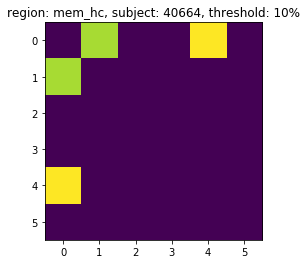

(6,)


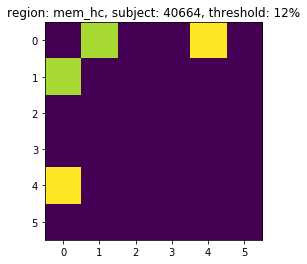

(6,)


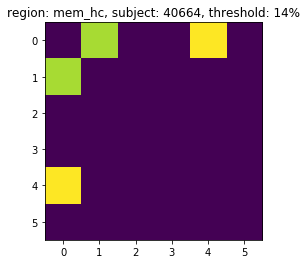

(6,)


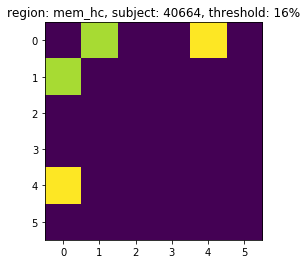

(6,)


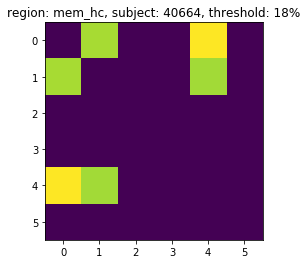

(6,)


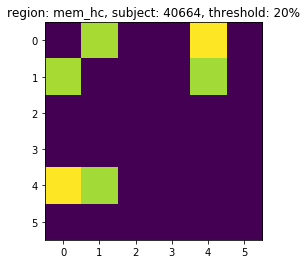

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

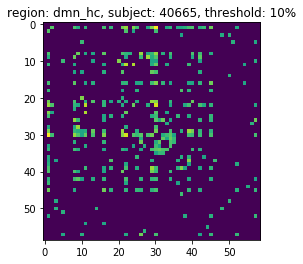

(59,)


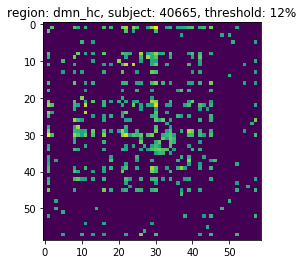

(59,)


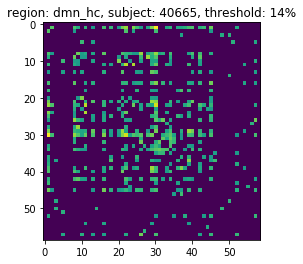

(59,)


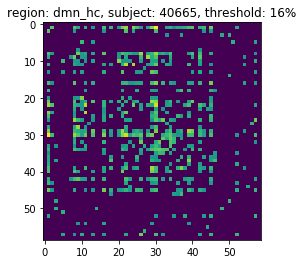

(59,)


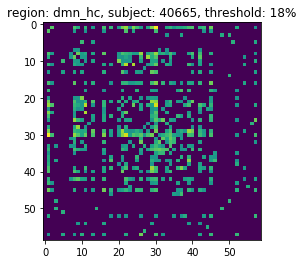

(59,)


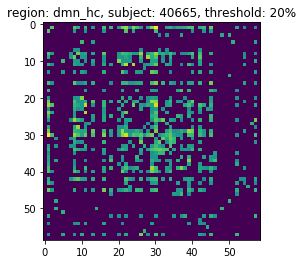

(59,)
(26, 26, 89)


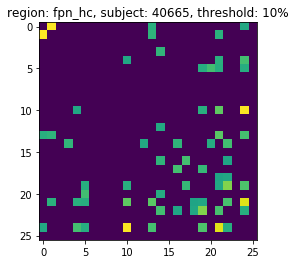

(26,)


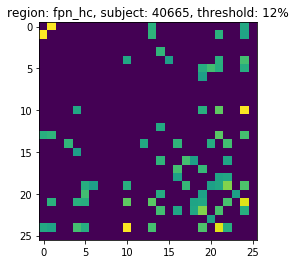

(26,)


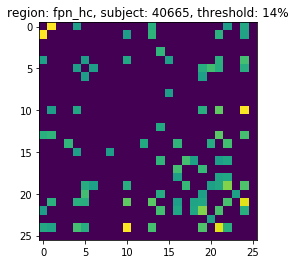

(26,)


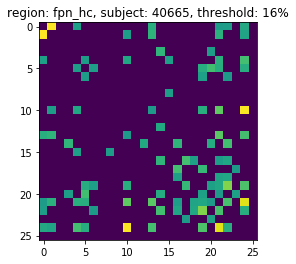

(26,)


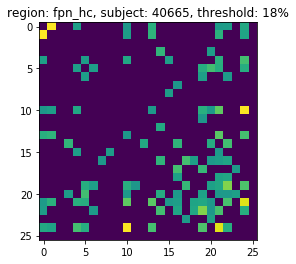

(26,)


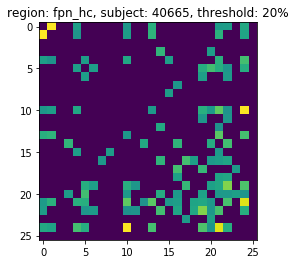

(26,)
(6, 6, 89)


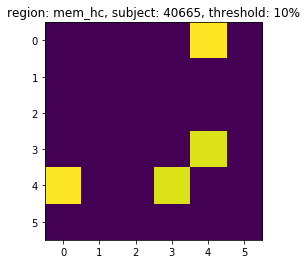

(6,)


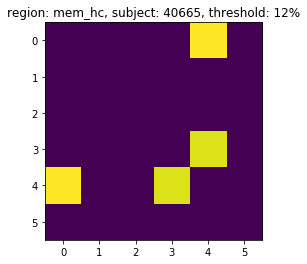

(6,)


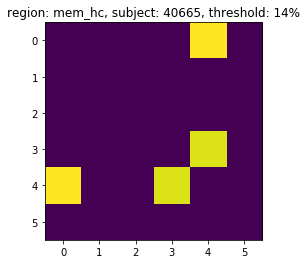

(6,)


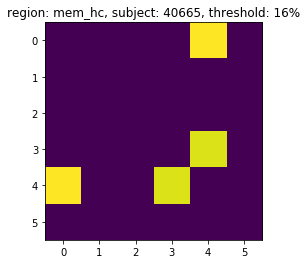

(6,)


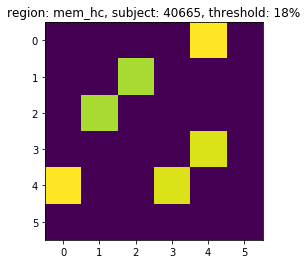

(6,)


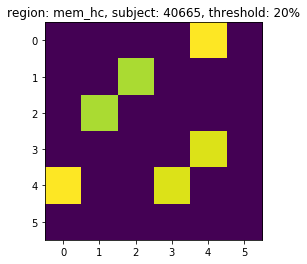

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

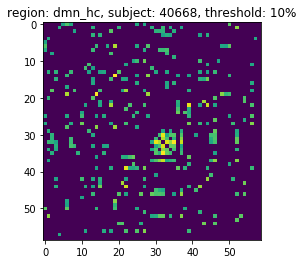

(59,)


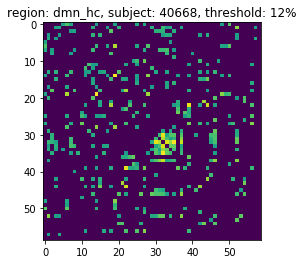

(59,)


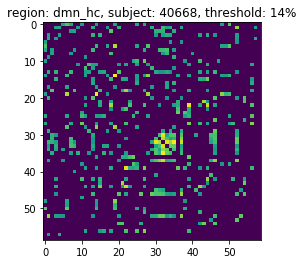

(59,)


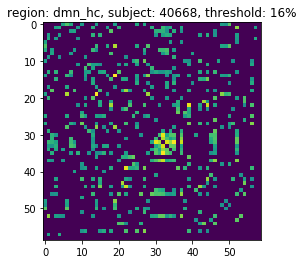

(59,)


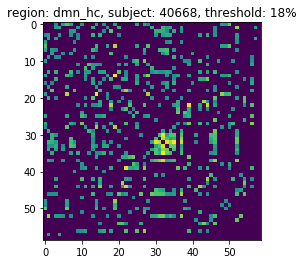

(59,)


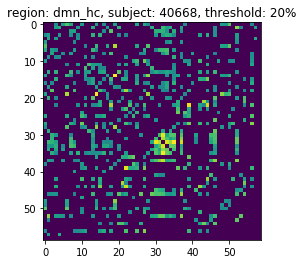

(59,)
(26, 26, 89)


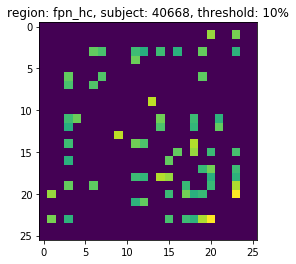

(26,)


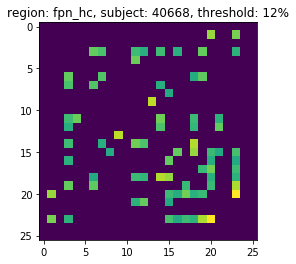

(26,)


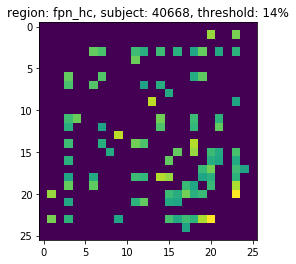

(26,)


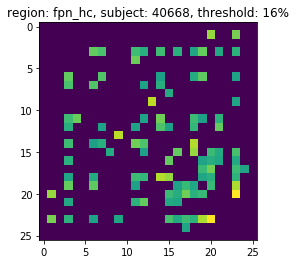

(26,)


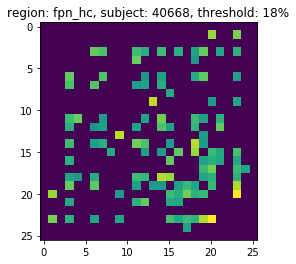

(26,)


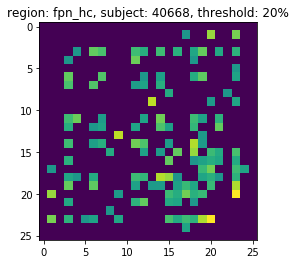

(26,)
(6, 6, 89)


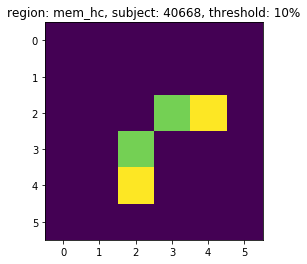

(6,)


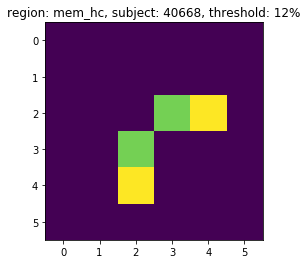

(6,)


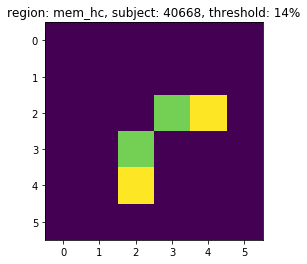

(6,)


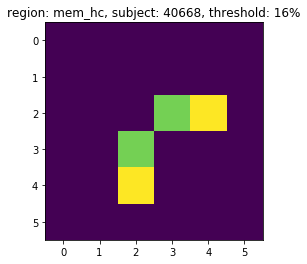

(6,)


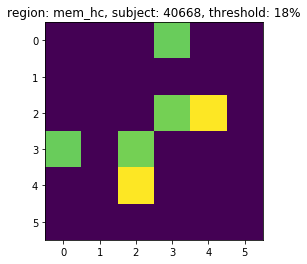

(6,)


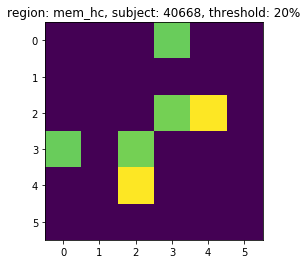

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

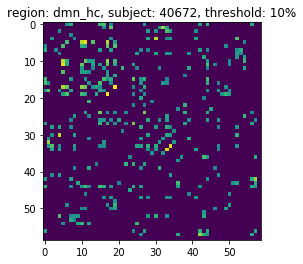

(59,)


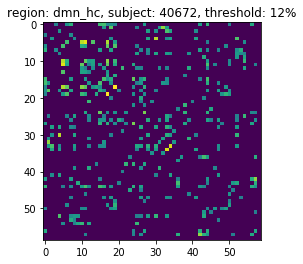

(59,)


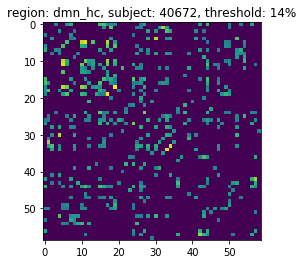

(59,)


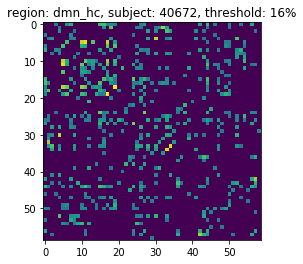

(59,)


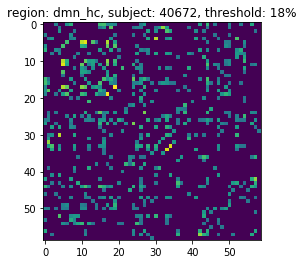

(59,)


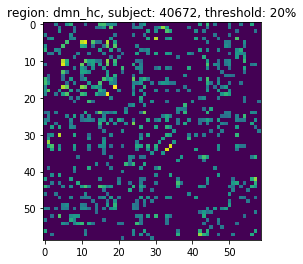

(59,)
(26, 26, 89)


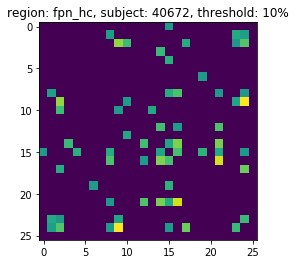

(26,)


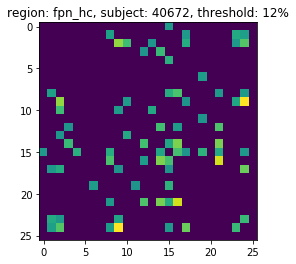

(26,)


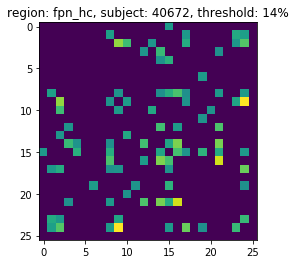

(26,)


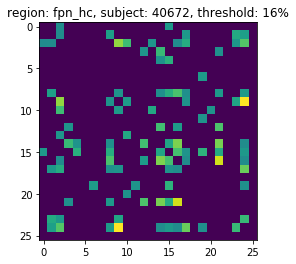

(26,)


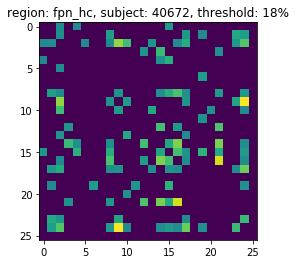

(26,)


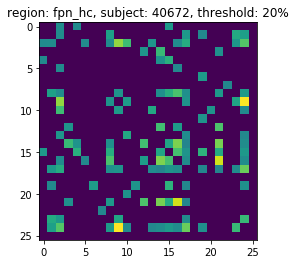

(26,)
(6, 6, 89)


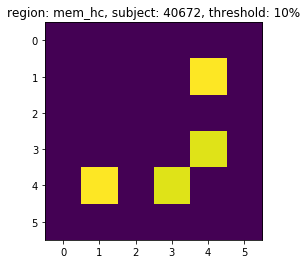

(6,)


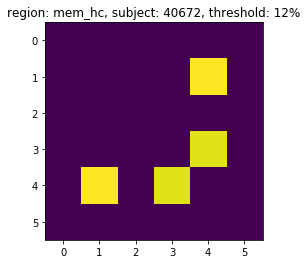

(6,)


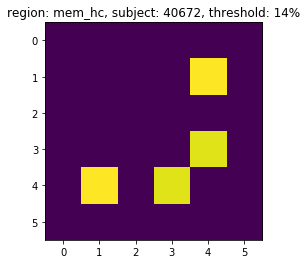

(6,)


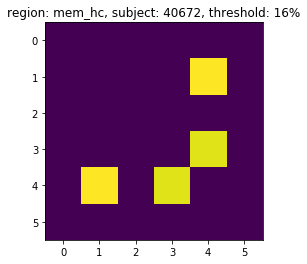

(6,)


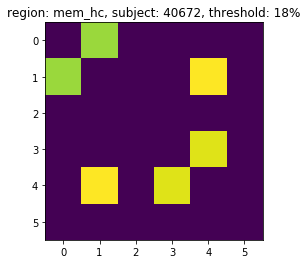

(6,)


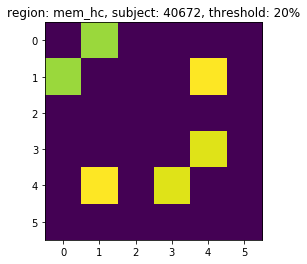

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

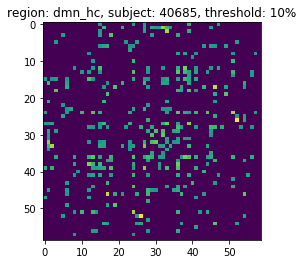

(59,)


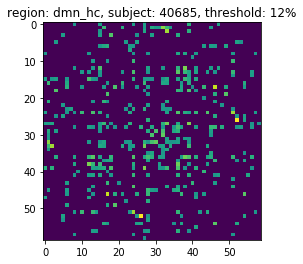

(59,)


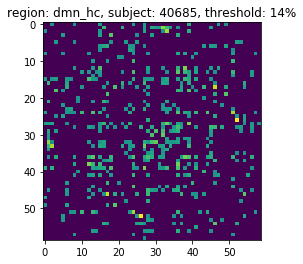

(59,)


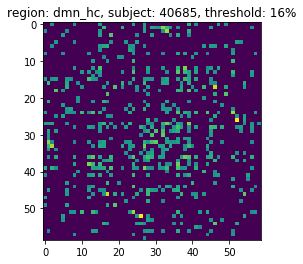

(59,)


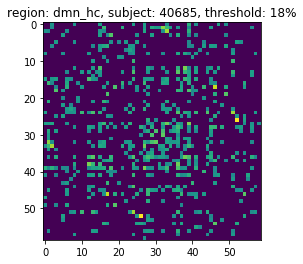

(59,)


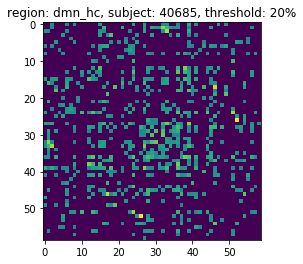

(59,)
(26, 26, 89)


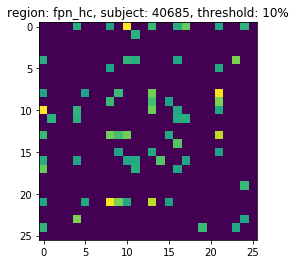

(26,)


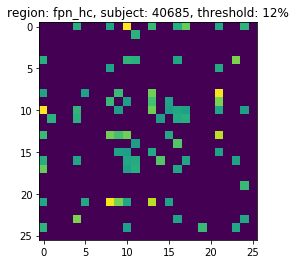

(26,)


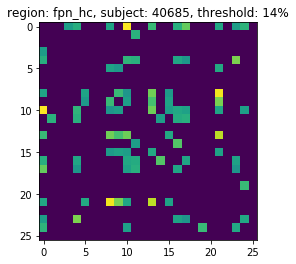

(26,)


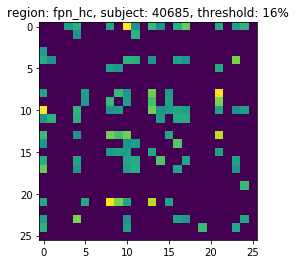

(26,)


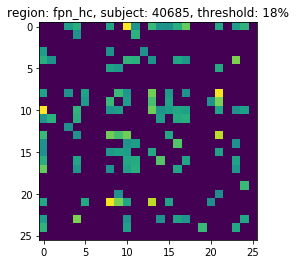

(26,)


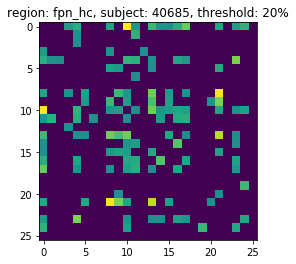

(26,)
(6, 6, 89)


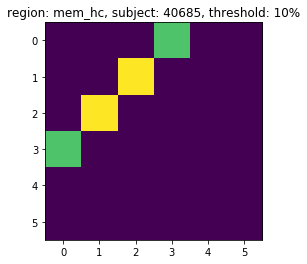

(6,)


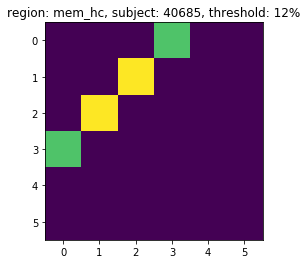

(6,)


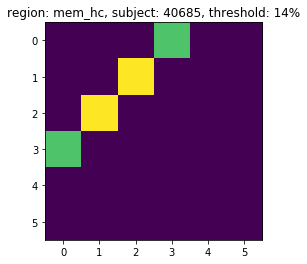

(6,)


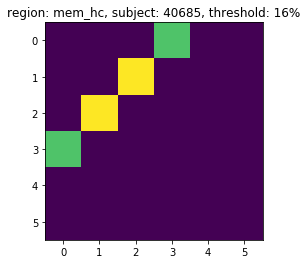

(6,)


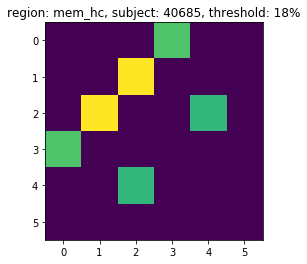

(6,)


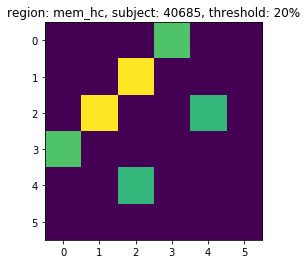

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

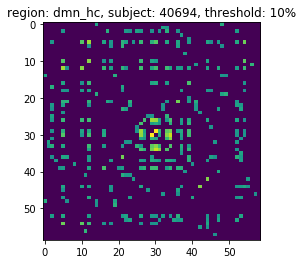

(59,)


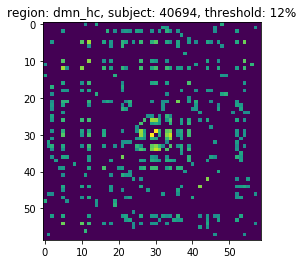

(59,)


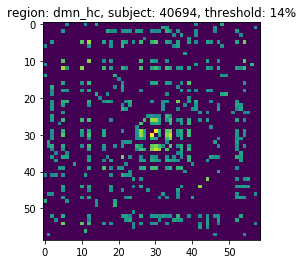

(59,)


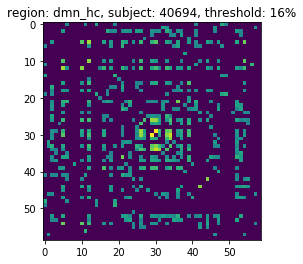

(59,)


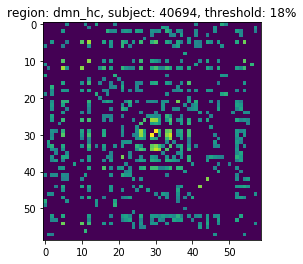

(59,)


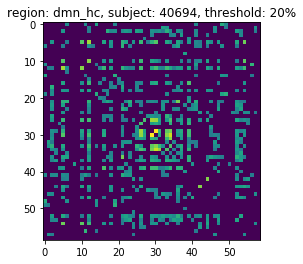

(59,)
(26, 26, 89)


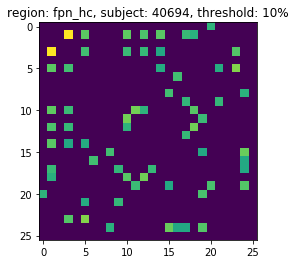

(26,)


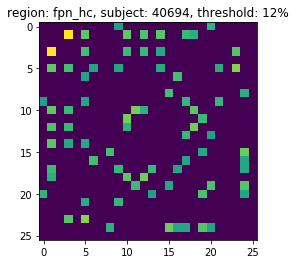

(26,)


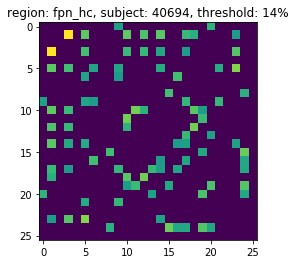

(26,)


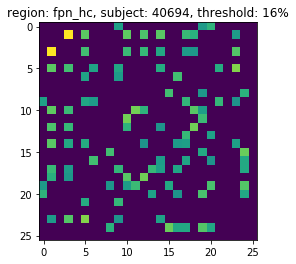

(26,)


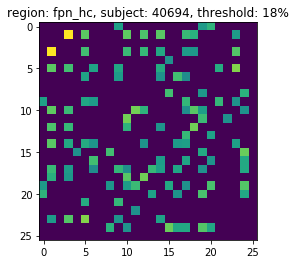

(26,)


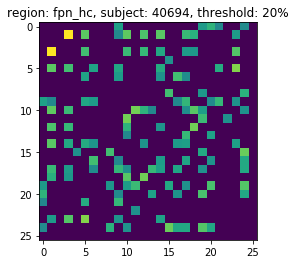

(26,)
(6, 6, 89)


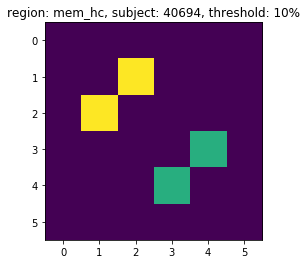

(6,)


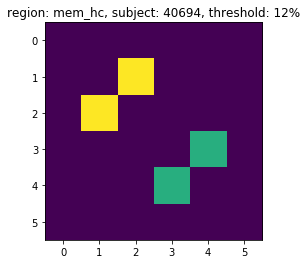

(6,)


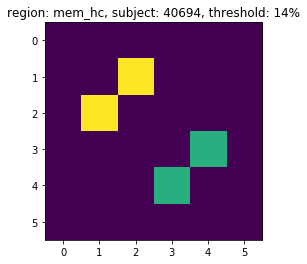

(6,)


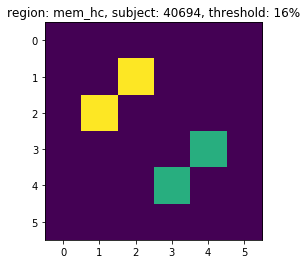

(6,)


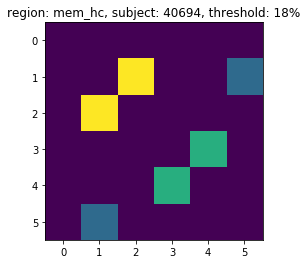

(6,)


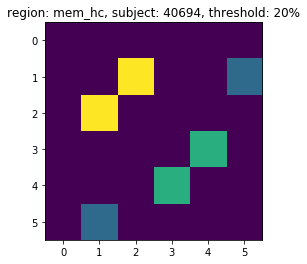

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

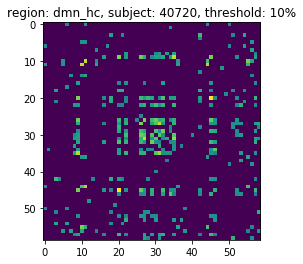

(59,)


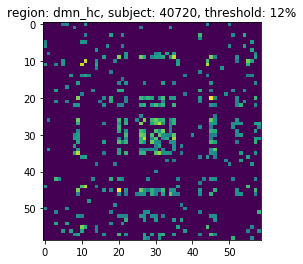

(59,)


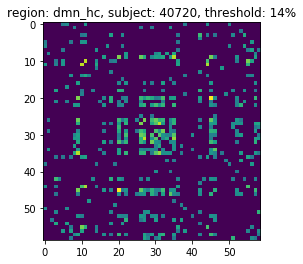

(59,)


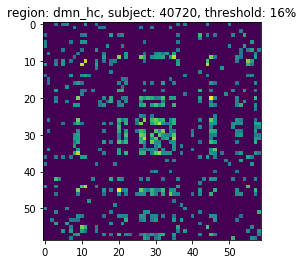

(59,)


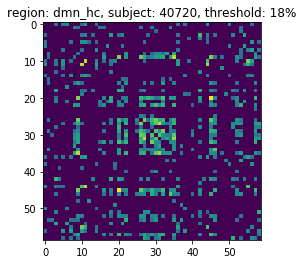

(59,)


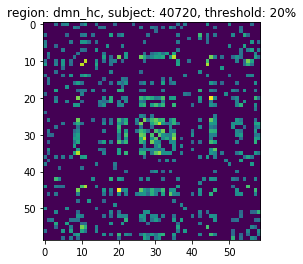

(59,)
(26, 26, 89)


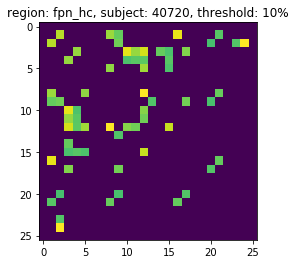

(26,)


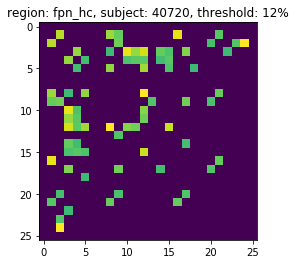

(26,)


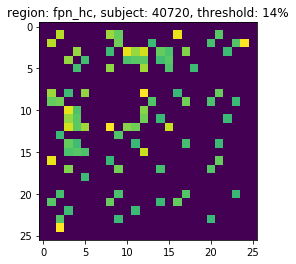

(26,)


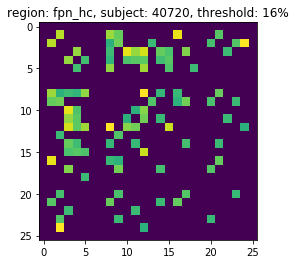

(26,)


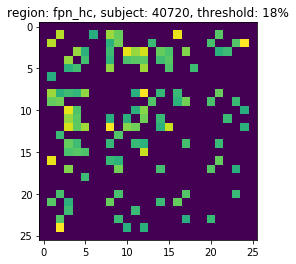

(26,)


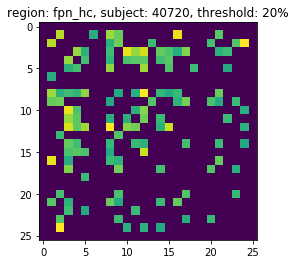

(26,)
(6, 6, 89)


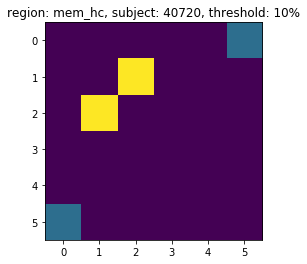

(6,)


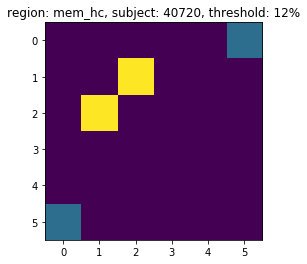

(6,)


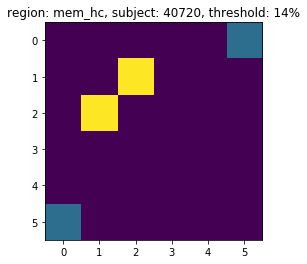

(6,)


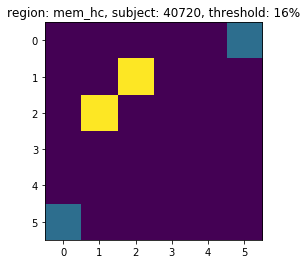

(6,)


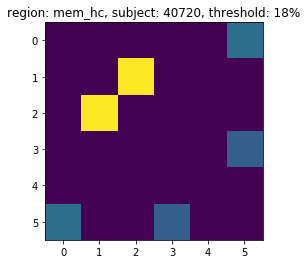

(6,)


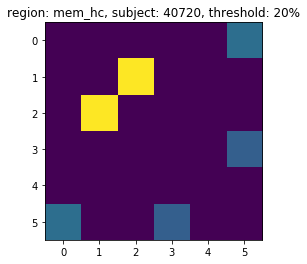

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

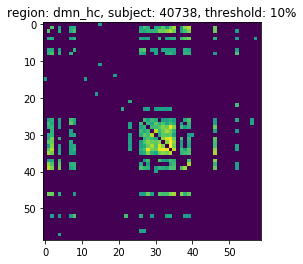

(59,)


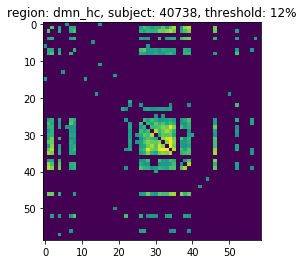

(59,)


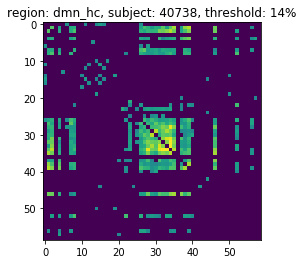

(59,)


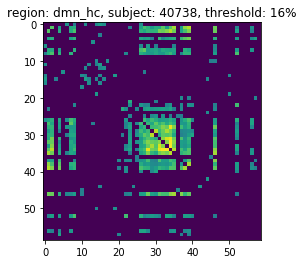

(59,)


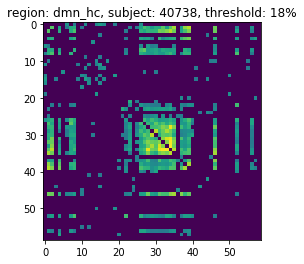

(59,)


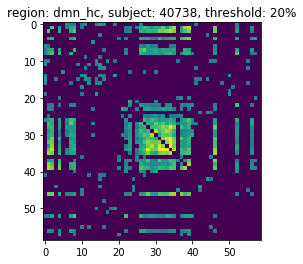

(59,)
(26, 26, 89)


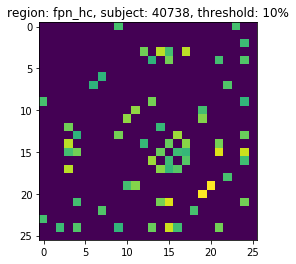

(26,)


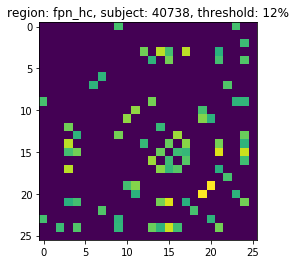

(26,)


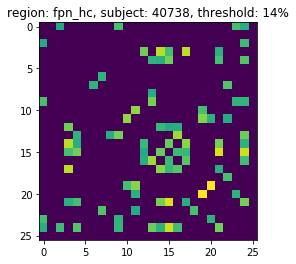

(26,)


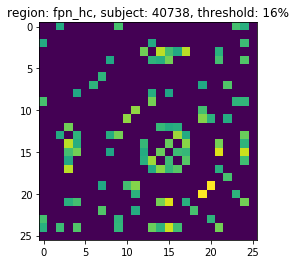

(26,)


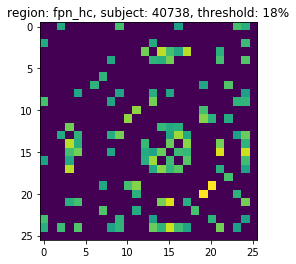

(26,)


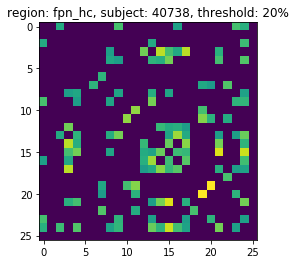

(26,)
(6, 6, 89)


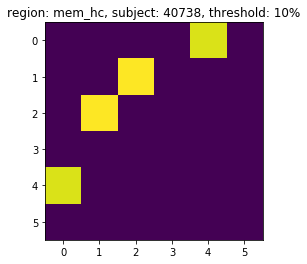

(6,)


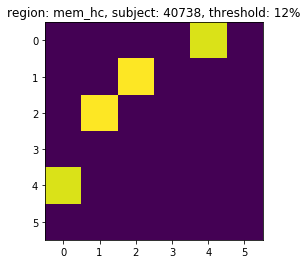

(6,)


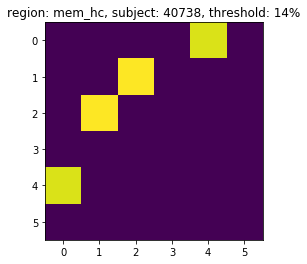

(6,)


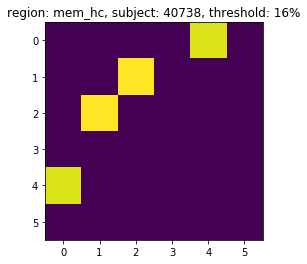

(6,)


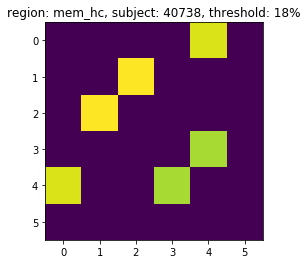

(6,)


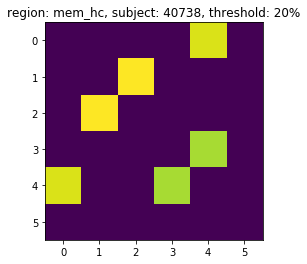

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

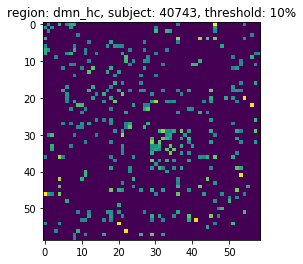

(59,)


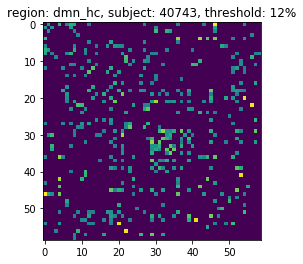

(59,)


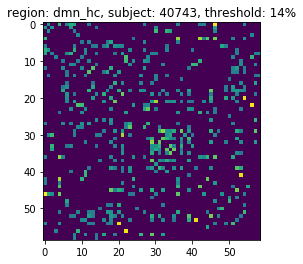

(59,)


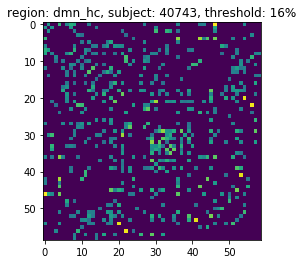

(59,)


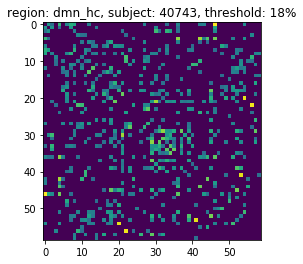

(59,)


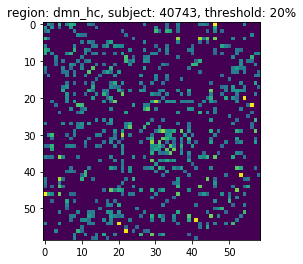

(59,)
(26, 26, 89)


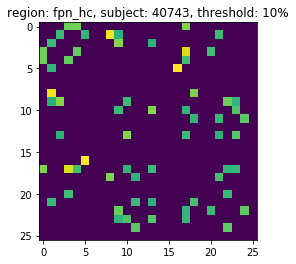

(26,)


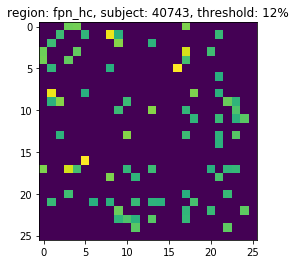

(26,)


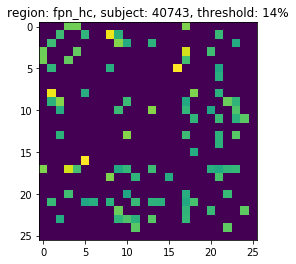

(26,)


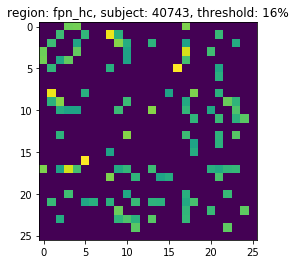

(26,)


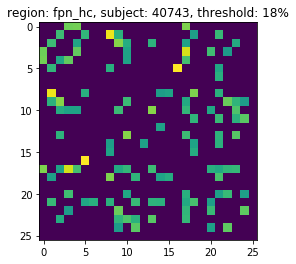

(26,)


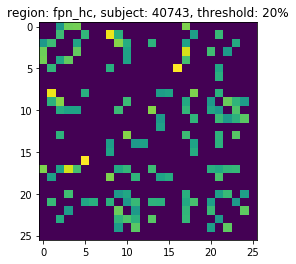

(26,)
(6, 6, 89)


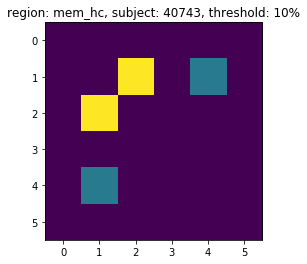

(6,)


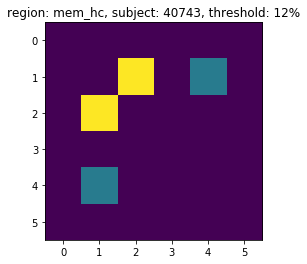

(6,)


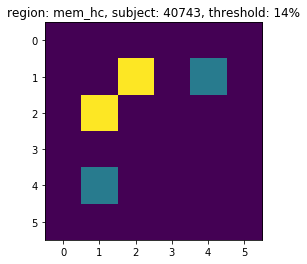

(6,)


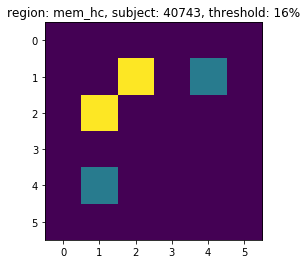

(6,)


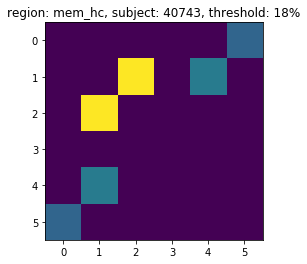

(6,)


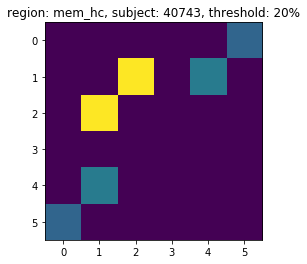

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

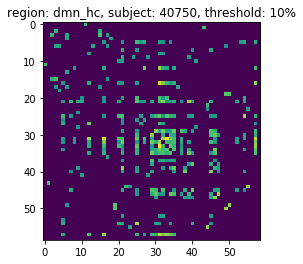

(59,)


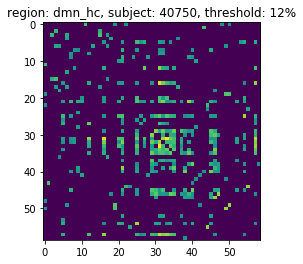

(59,)


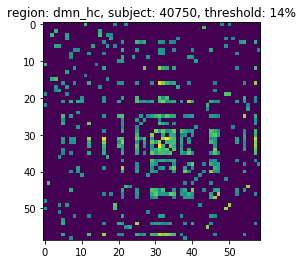

(59,)


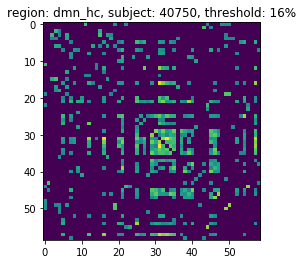

(59,)


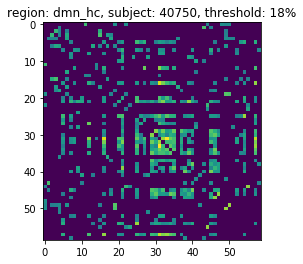

(59,)


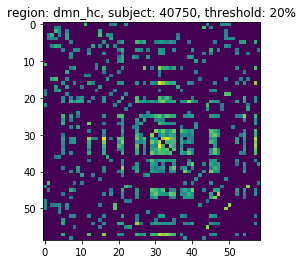

(59,)
(26, 26, 89)


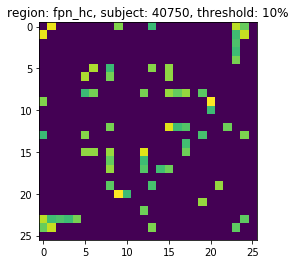

(26,)


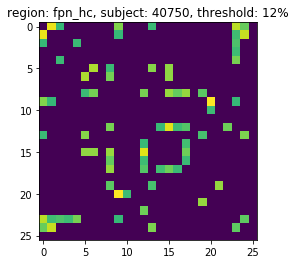

(26,)


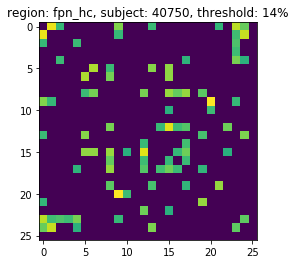

(26,)


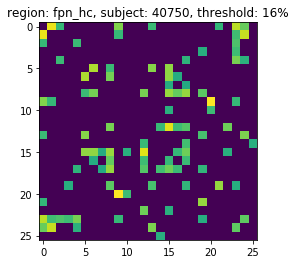

(26,)


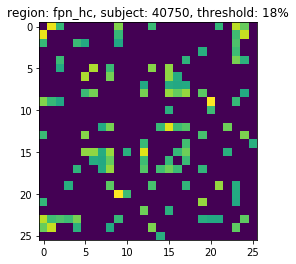

(26,)


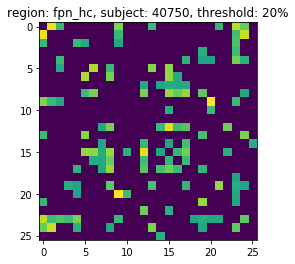

(26,)
(6, 6, 89)


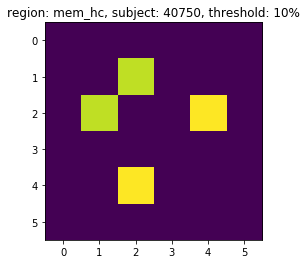

(6,)


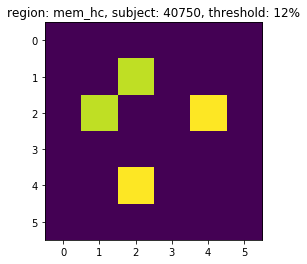

(6,)


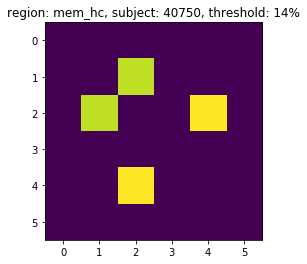

(6,)


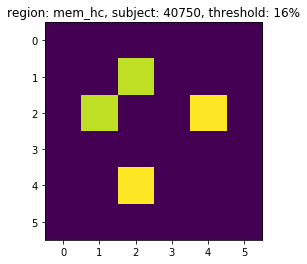

(6,)


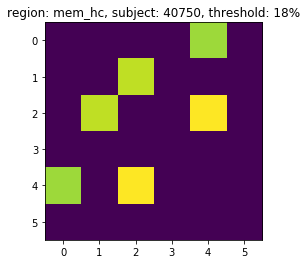

(6,)


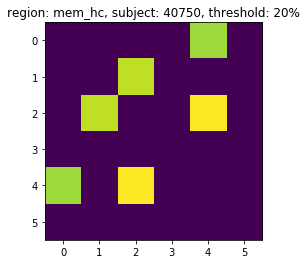

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

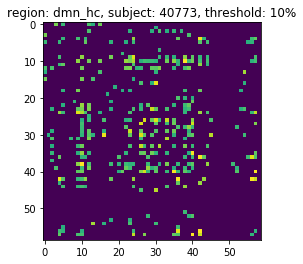

(59,)


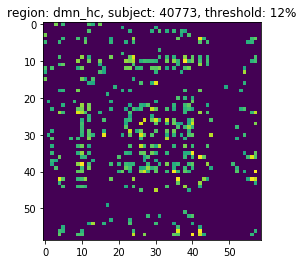

(59,)


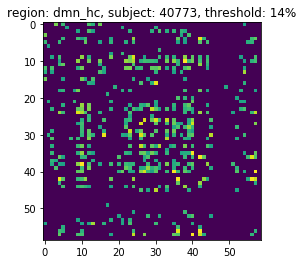

(59,)


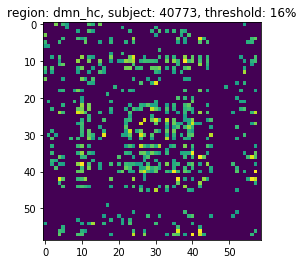

(59,)


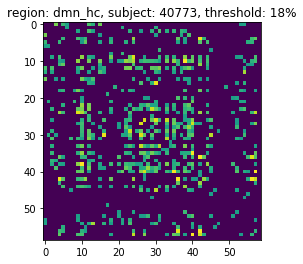

(59,)


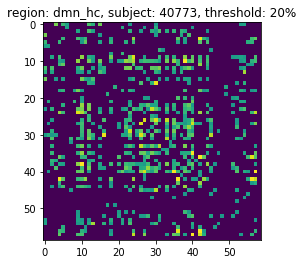

(59,)
(26, 26, 89)


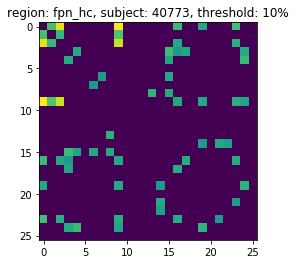

(26,)


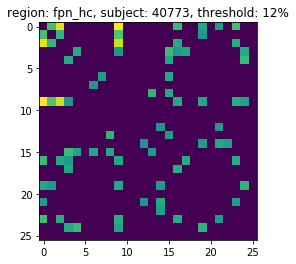

(26,)


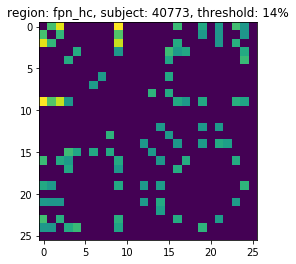

(26,)


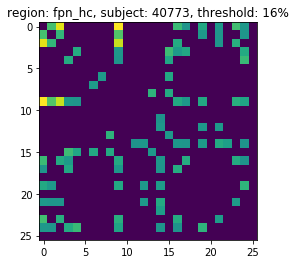

(26,)


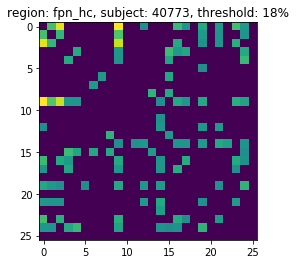

(26,)


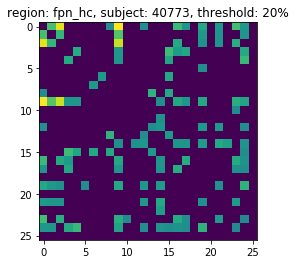

(26,)
(6, 6, 89)


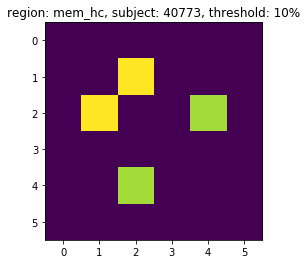

(6,)


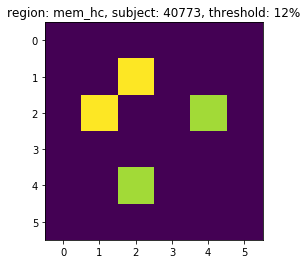

(6,)


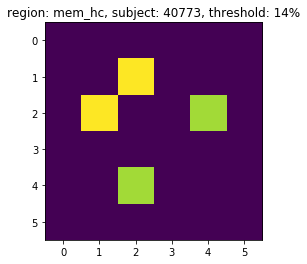

(6,)


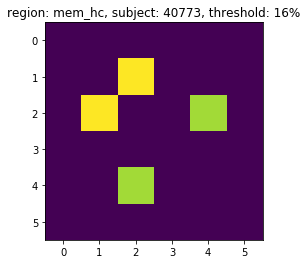

(6,)


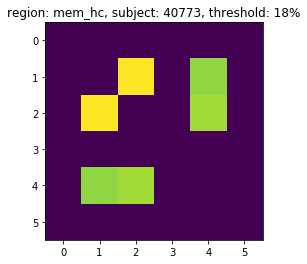

(6,)


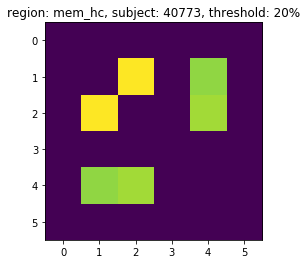

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

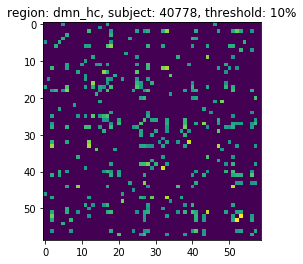

(59,)


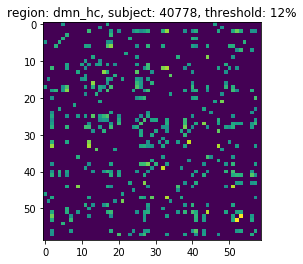

(59,)


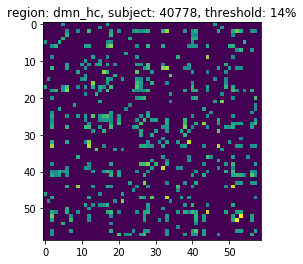

(59,)


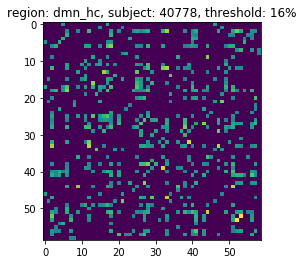

(59,)


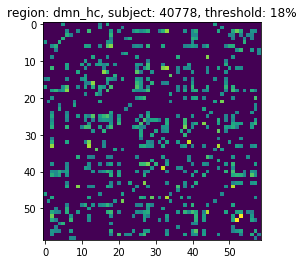

(59,)


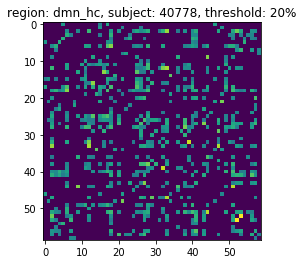

(59,)
(26, 26, 89)


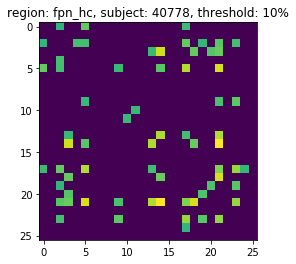

(26,)


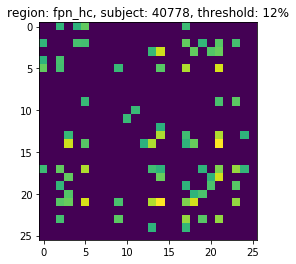

(26,)


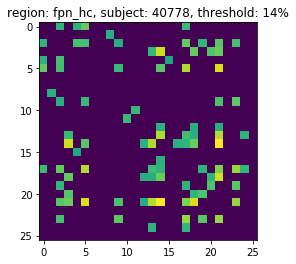

(26,)


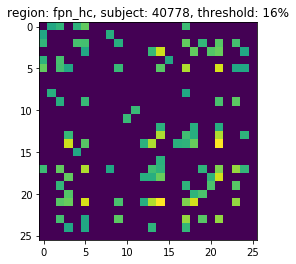

(26,)


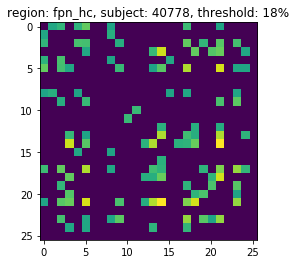

(26,)


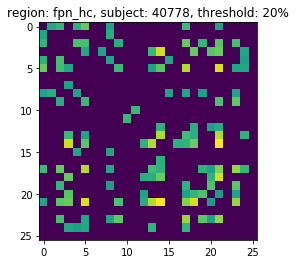

(26,)
(6, 6, 89)


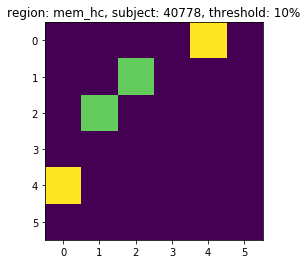

(6,)


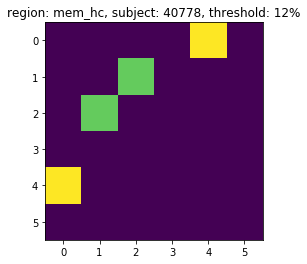

(6,)


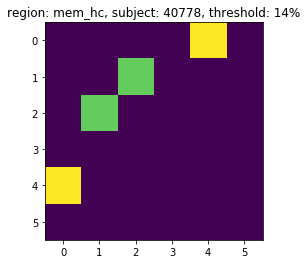

(6,)


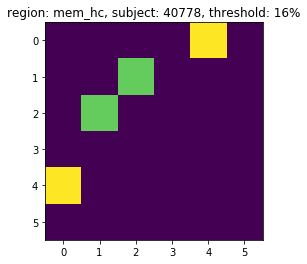

(6,)


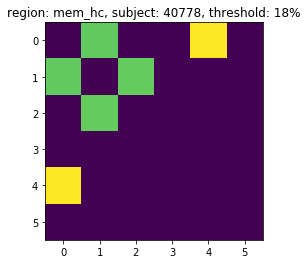

(6,)


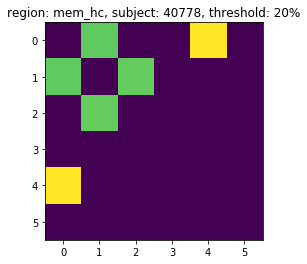

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

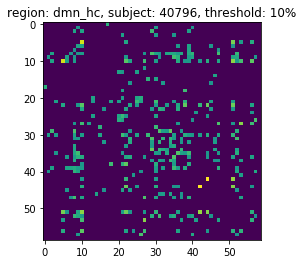

(59,)


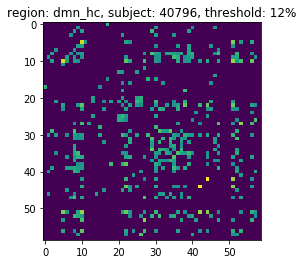

(59,)


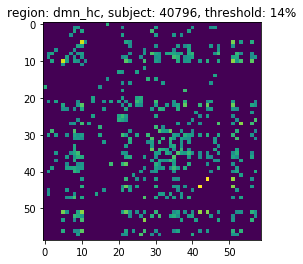

(59,)


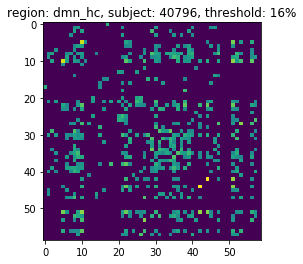

(59,)


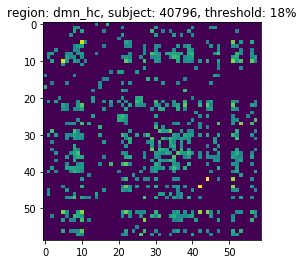

(59,)


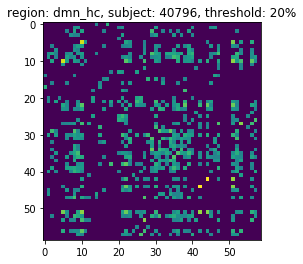

(59,)
(26, 26, 89)


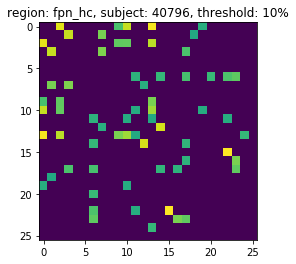

(26,)


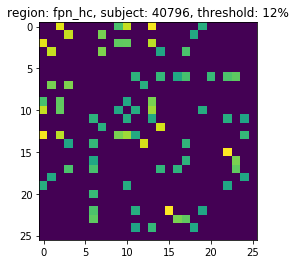

(26,)


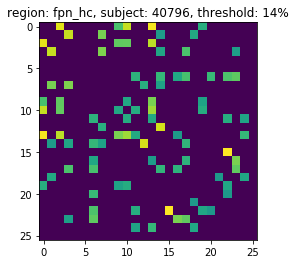

(26,)


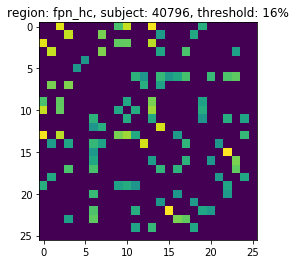

(26,)


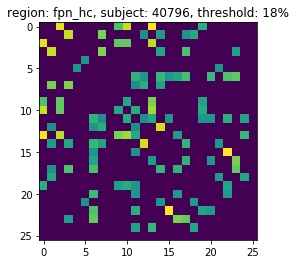

(26,)


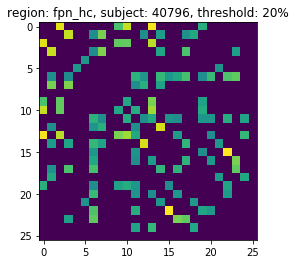

(26,)
(6, 6, 89)


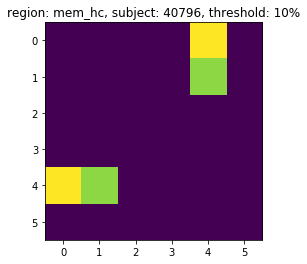

(6,)


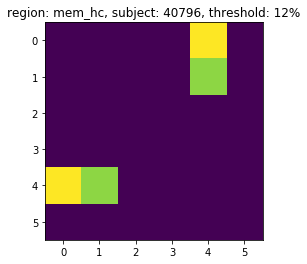

(6,)


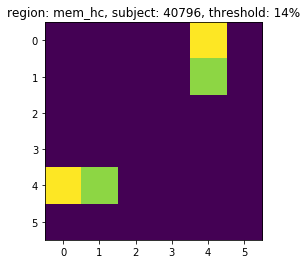

(6,)


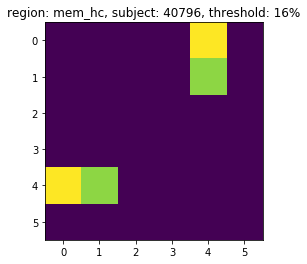

(6,)


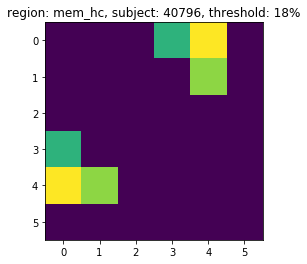

(6,)


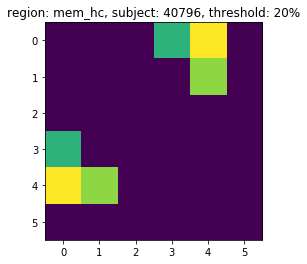

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

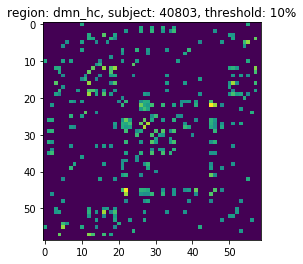

(59,)


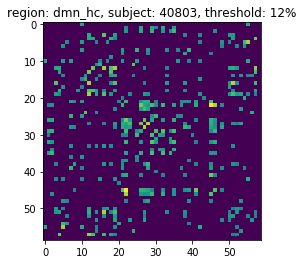

(59,)


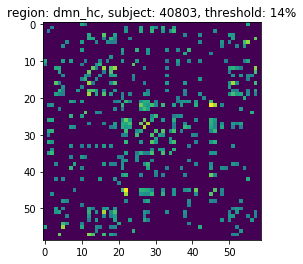

(59,)


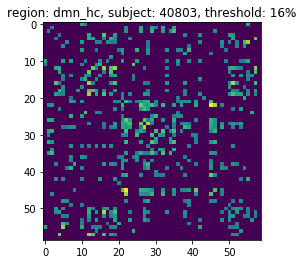

(59,)


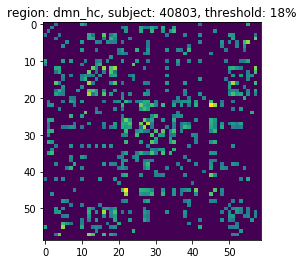

(59,)


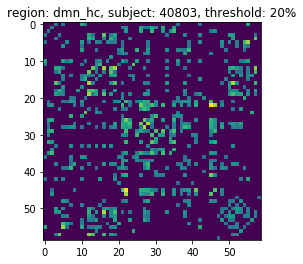

(59,)
(26, 26, 89)


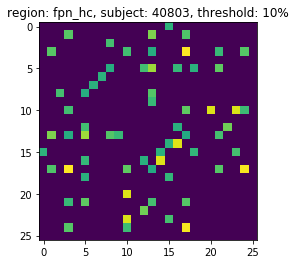

(26,)


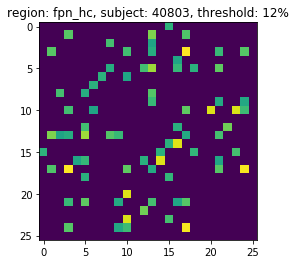

(26,)


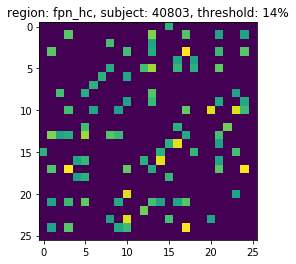

(26,)


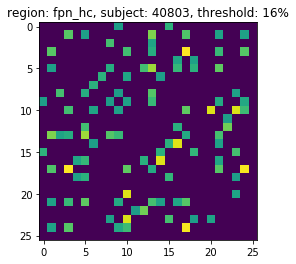

(26,)


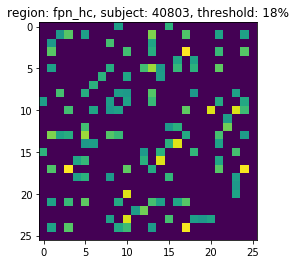

(26,)


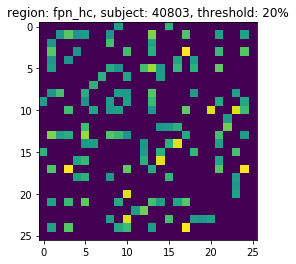

(26,)
(6, 6, 89)


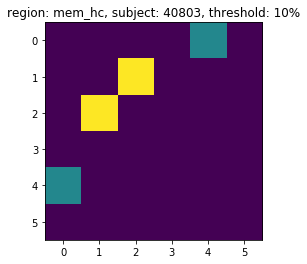

(6,)


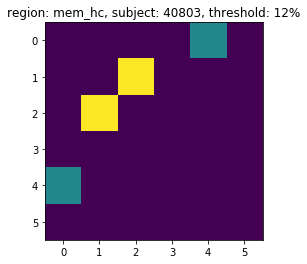

(6,)


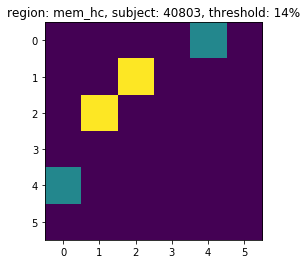

(6,)


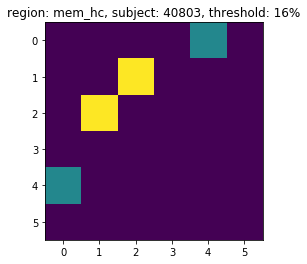

(6,)


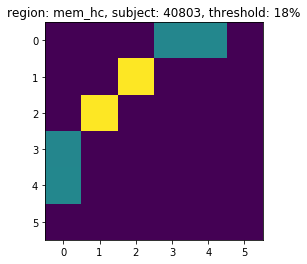

(6,)


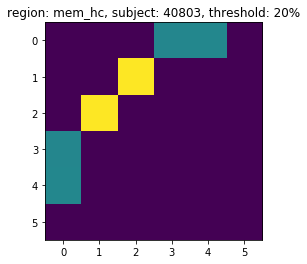

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

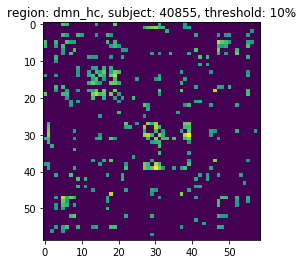

(59,)


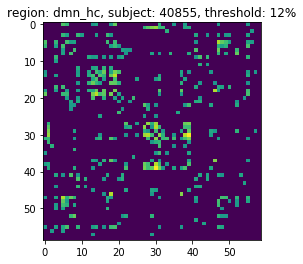

(59,)


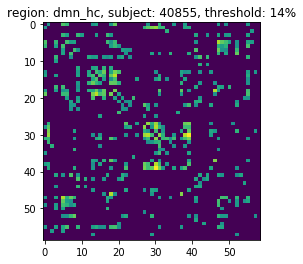

(59,)


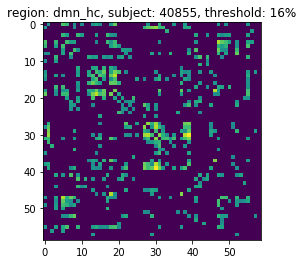

(59,)


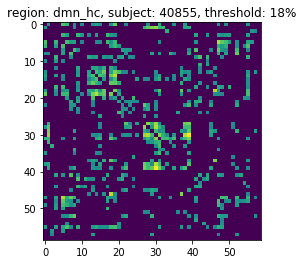

(59,)


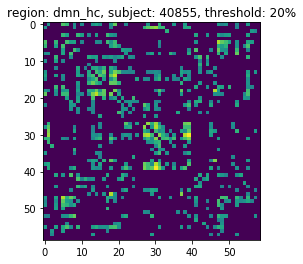

(59,)
(26, 26, 89)


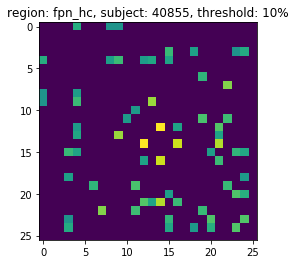

(26,)


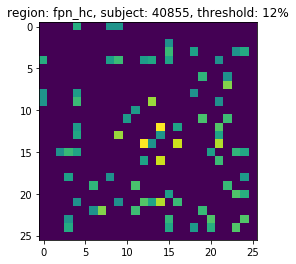

(26,)


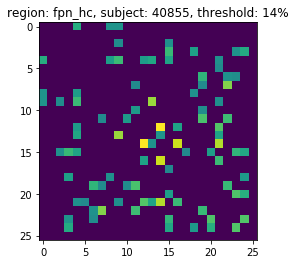

(26,)


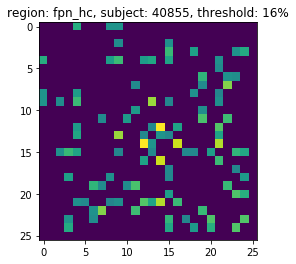

(26,)


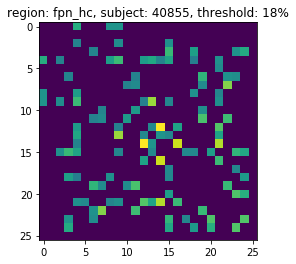

(26,)


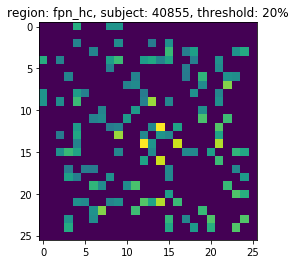

(26,)
(6, 6, 89)


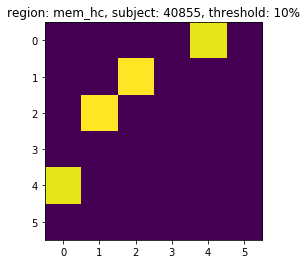

(6,)


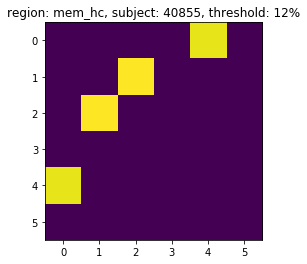

(6,)


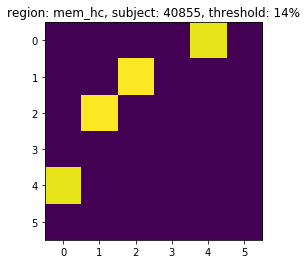

(6,)


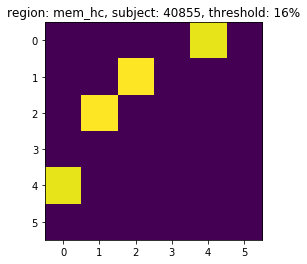

(6,)


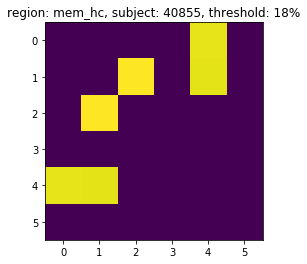

(6,)


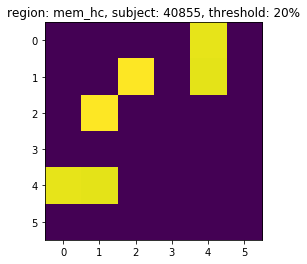

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

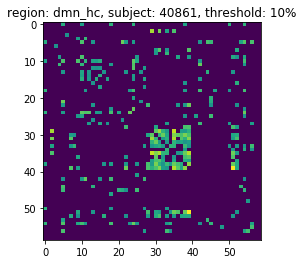

(59,)


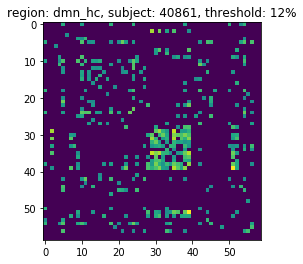

(59,)


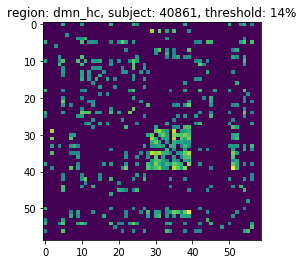

(59,)


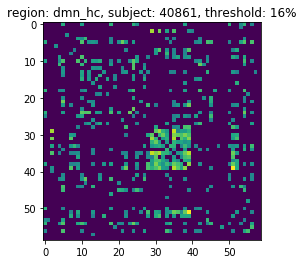

(59,)


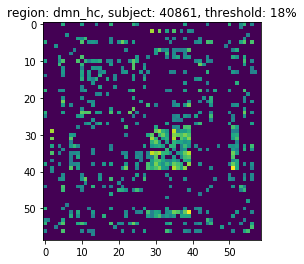

(59,)


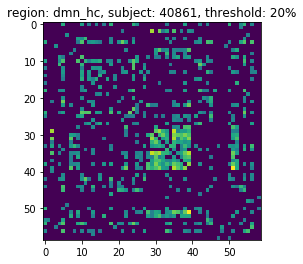

(59,)
(26, 26, 89)


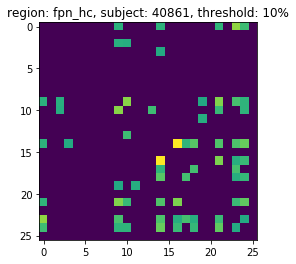

(26,)


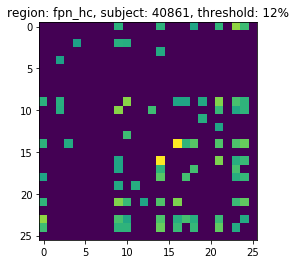

(26,)


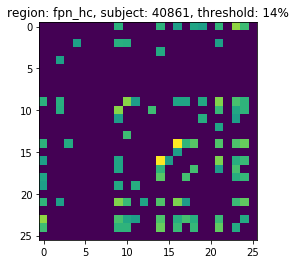

(26,)


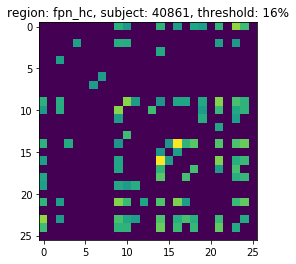

(26,)


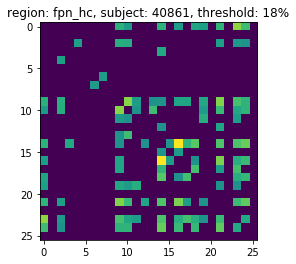

(26,)


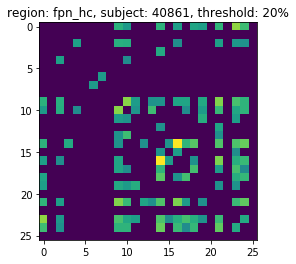

(26,)
(6, 6, 89)


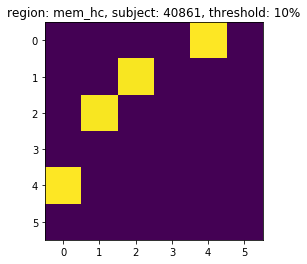

(6,)


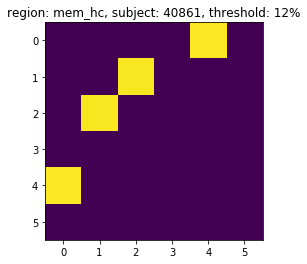

(6,)


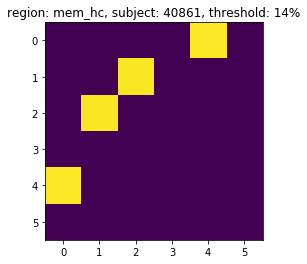

(6,)


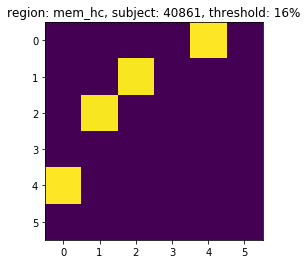

(6,)


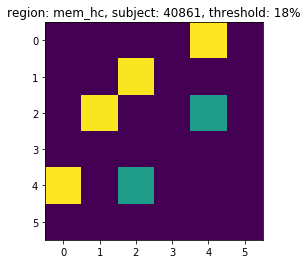

(6,)


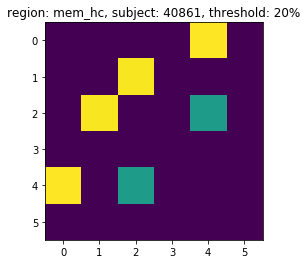

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

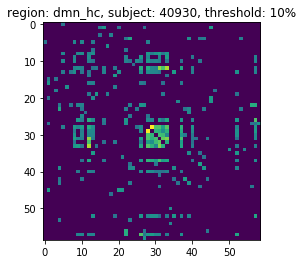

(59,)


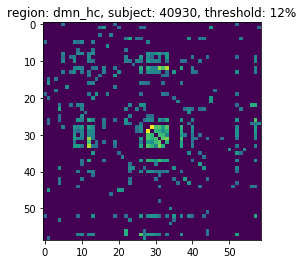

(59,)


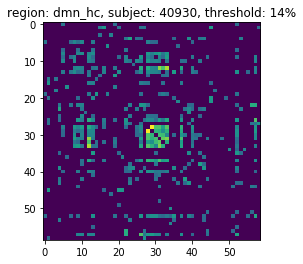

(59,)


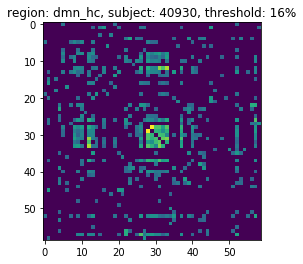

(59,)


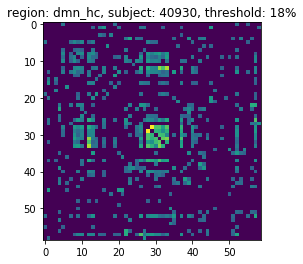

(59,)


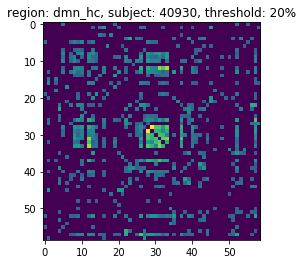

(59,)
(26, 26, 89)


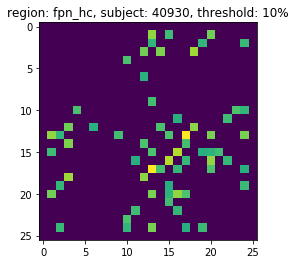

(26,)


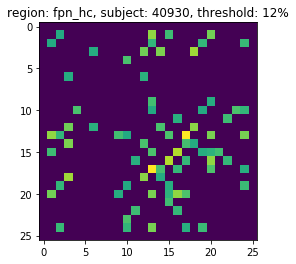

(26,)


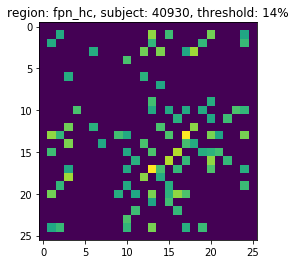

(26,)


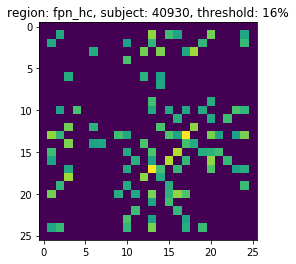

(26,)


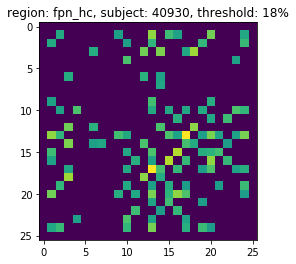

(26,)


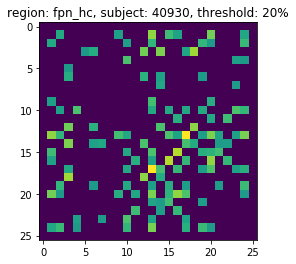

(26,)
(6, 6, 89)


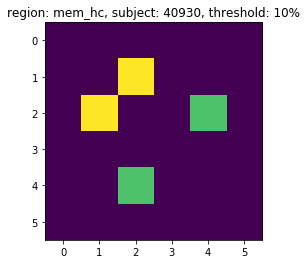

(6,)


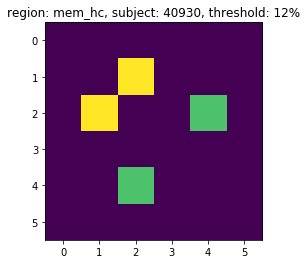

(6,)


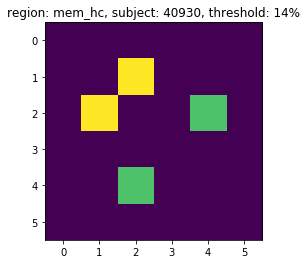

(6,)


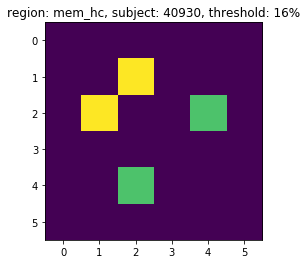

(6,)


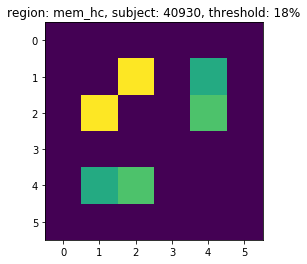

(6,)


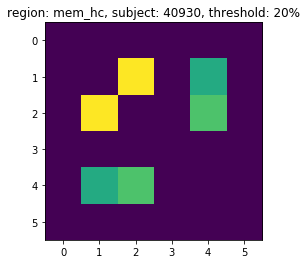

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

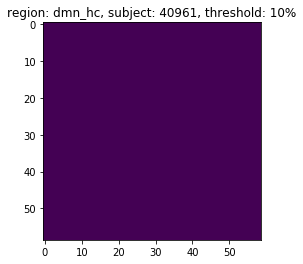

(59,)


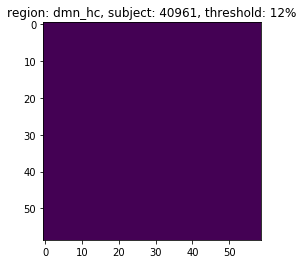

(59,)


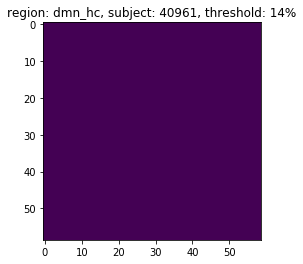

(59,)


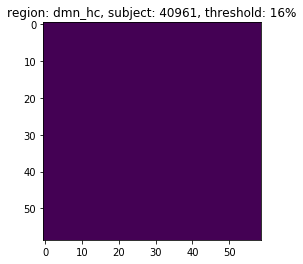

(59,)


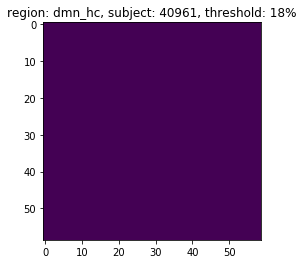

(59,)


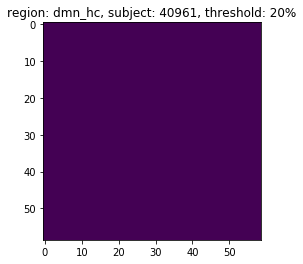

(59,)
(26, 26, 89)


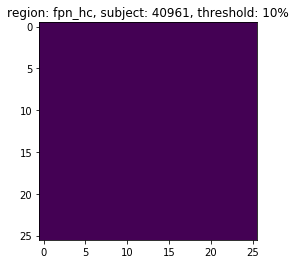

(26,)


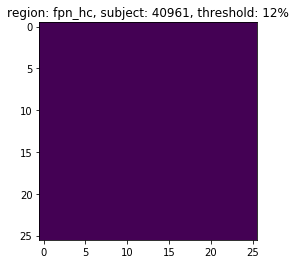

(26,)


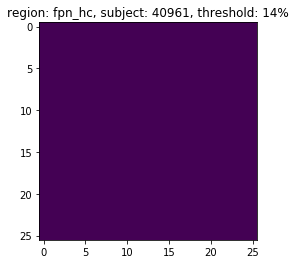

(26,)


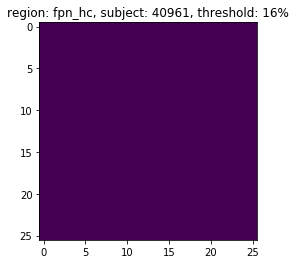

(26,)


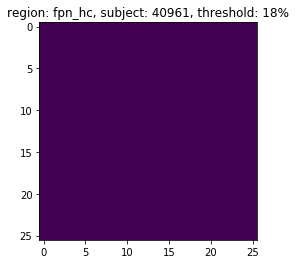

(26,)


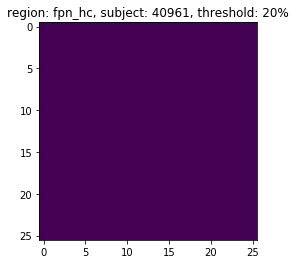

(26,)
(6, 6, 89)


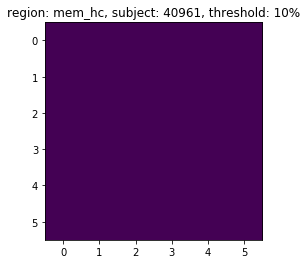

(6,)


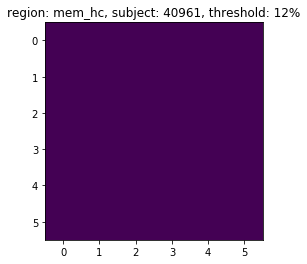

(6,)


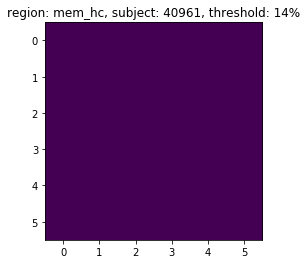

(6,)


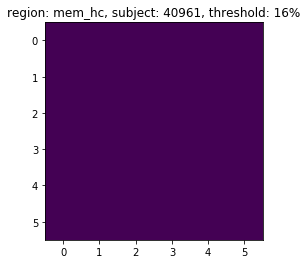

(6,)


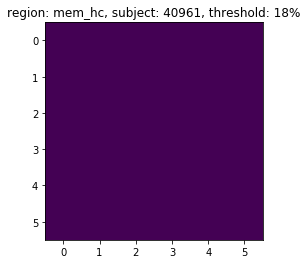

(6,)


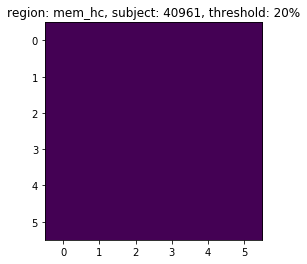

(6,)
     pc_hc_dmn_hc subject  pc_hc_fpn_hc  pc_hc_mem_hc
0             0.0   30004           NaN           NaN
1             NaN   30004           0.0           NaN
2             NaN   30004           NaN           0.0
3             0.0   30008           NaN           NaN
4             NaN   30008           0.0           NaN
5             NaN   30008           NaN           0.0
6             0.0   30009           NaN           NaN
7             NaN   30009           0.0           NaN
8             NaN   30009           NaN           0.0
9             0.0   30015           NaN           NaN
10            NaN   30015           0.0           NaN
11            NaN   30015           NaN           0.0
12            0.0   30019           NaN           NaN
13            NaN   30019           0.0           NaN
14            NaN   30019           NaN           0.0
15            0.0   30020           NaN           NaN
16            NaN   30020           0.0           NaN
17            NaN   300

In [83]:
from bct import modularity
from bct import centrality
from bct import other
from bct import visualization

thresholds = np.arange(10, 22, 2)
regions = ['dmn_hc', 'fpn_hc', 'mem_hc']

pc_array = {}
pc = pd.DataFrame()

m0 = x['cue']

d = {ni: indi for indi, ni in enumerate(set(atlas.regions))}
print(d)


for subject, idx in zip(sorted(subjects), range(0, m0.shape[2])): #     print(x['cue'][dmn_fpn][:,dmn_fpn,idx].shape)
    pc_array[subject] = {}
    
    for region in regions:
        
        m = m0[eval(region)][:,eval(region)]
        communities = [d[ni] for ni in atlas.regions[eval(region)]]
        print(m.shape)

        for threshold in thresholds:

            pc_array[subject][str(threshold)] = {}

            g = other.threshold_proportional(m[:,:,idx], p=float(threshold)*.01, copy=True) #     g = visualization.reorderMAT(m[:,:,idx], H=5000, cost='line')[0]
            plt.imshow(g)
            plt.title('region: %s, subject: %s, threshold: %s%%' % (region, subject, threshold))
            plt.show()

            pc_array[subject][threshold] = centrality.participation_coef(g, ci=communities, degree='undirected')
            print(pc_array[subject][threshold].shape)
        
        pc = pc.append({'subject': subject, 
                        'pc_hc_%s' % region: [ (pc_array[subject][10] + pc_array[subject][12] + pc_array[subject][14] + pc_array[subject][16] + pc_array[subject][18] + pc_array[subject][20])/6 ][-1][-1]

}, ignore_index=True)
    print(pc)


In [84]:
pc.groupby("subject").transform(lambda x: x.fillna(x.max()))

,pc_hc_dmn_hc,pc_hc_fpn_hc,pc_hc_mem_hc
0,0.0,0.0,0.0
1,0.0,0.0,0.0
2,0.0,0.0,0.0
3,0.0,0.0,0.0
4,0.0,0.0,0.0
5,0.0,0.0,0.0
6,0.0,0.0,0.0
7,0.0,0.0,0.0
8,0.0,0.0,0.0
9,0.0,0.0,0.0


In [55]:
np.save('/Volumes/schnyer/Megan/adm_mem-fc/analysis/nbs/withhc/bct/participation_coefficient_nodewise.npy', pc_array)

In [56]:
pc_array['30004']

{'10': array([0.56902044, 0.80000083, 0.66614707, 0.59233608, 0.        ,
        0.        , 0.82435582, 0.65674563, 0.71213477, 0.70720269,
        0.8010905 , 0.86059283, 0.74499573, 0.73053216, 0.52002119,
        0.63000316, 0.63652189, 0.68668847, 0.61395333, 0.64483599,
        0.69071293, 0.75617775, 0.81448196, 0.77411758, 0.71274502,
        0.74698391, 0.76914405, 0.69903169, 0.67264674, 0.66010651,
        0.77806348, 0.77825824, 0.70609089, 0.69902725, 0.79376382,
        0.74643966, 0.58742687, 0.76916717, 0.72909605, 0.7643539 ,
        0.77242994, 0.79018142, 0.8133815 , 0.70445321, 0.86240256,
        0.81151933, 0.57782129, 0.66218653, 0.79852244, 0.86656382,
        0.6986033 , 0.85805148, 0.71354586, 0.83743327, 0.78470735,
        0.82979913, 0.62929549, 0.85530556, 0.66217609, 0.75548058,
        0.76716994, 0.72467775, 0.83314237, 0.83131858, 0.58949954,
        0.75765662, 0.77713875, 0.81788092, 0.77930575, 0.74565525,
        0.76068301, 0.71546221, 0.56405429

In [25]:
for subject in subjects[:-2]:
    pc_array[subject]['mean'] = []
    pc_array[subject]['mean'] = (pc_array[subject][10] + pc_array[subject][12] + pc_array[subject][14] + pc_array[subject][16] + pc_array[subject][18] + pc_array[subject][20])/6
    
np.save('/Volumes/schnyer/Megan/adm_mem-fc/analysis/nbs/withhc/bct/participation_coefficient_nodewise.npy', pc_array)

TypeError: unsupported operand type(s) for +: 'dict' and 'dict'

In [26]:
pc0 = pc.copy().reset_index()
pc0['pc_dmn_fpn_mean'] = pc0.mean(axis=1)

for subject in subjects[:-2]:
    rowIndex = pc0.index[pc0['subject'] == subject].to_list()
    pc0.loc[rowIndex, 'pc_dmn_mean'] = pc_array[subject]['mean'][dmn].mean()
    pc0.loc[rowIndex, 'pc_fpn_mean'] = pc_array[subject]['mean'][fpn].mean()

pc0 = pc0.set_index(['subject'])
pc0.to_csv('/Volumes/schnyer/Megan/adm_mem-fc/analysis/nbs/withhc/bct/participation_coefficient.csv')
pc0

TypeError: list indices must be integers or slices, not list

In [27]:
mod[0:5]

,mod_dmn_fpn_10,mod_dmn_fpn_12,mod_dmn_fpn_14,mod_dmn_fpn_16,mod_dmn_fpn_18,mod_dmn_fpn_20,mod_dmn_mem_10,mod_dmn_mem_12,mod_dmn_mem_14,mod_dmn_mem_16,...,mod_fpn_mem_14,mod_fpn_mem_16,mod_fpn_mem_18,mod_fpn_mem_20,mod_dmn_fpn_mem_10,mod_dmn_fpn_mem_12,mod_dmn_fpn_mem_14,mod_dmn_fpn_mem_16,mod_dmn_fpn_mem_18,mod_dmn_fpn_mem_20
subject,,,,,,,,,,,,,,,,,,,,,
30004,0.264649,0.255235,0.240442,0.228642,0.219572,0.211874,0.009880,0.014677,0.012775,0.015748,...,0.005283,0.002893,-0.000712,0.004422,0.263621,0.248009,0.236959,0.232398,0.221004,0.210506
30008,0.172821,0.168540,0.170297,0.161287,0.149203,0.146402,0.025201,0.027275,0.024098,0.027236,...,0.087804,0.079043,0.071423,0.080499,0.184513,0.185125,0.174179,0.163705,0.157733,0.148640
30009,0.217686,0.220833,0.209516,0.202727,0.196350,0.191559,0.041925,0.035564,0.036035,0.032411,...,0.051000,0.048903,0.038530,0.034655,0.200228,0.201094,0.196773,0.183146,0.181975,0.174920
30015,0.220001,0.211056,0.193341,0.189429,0.182135,0.173488,0.006887,0.005874,0.004960,0.004365,...,0.020665,0.017370,0.010479,0.009923,0.212871,0.199880,0.186818,0.177007,0.171157,0.167335
30019,0.155685,0.146923,0.134819,0.127281,0.123858,0.122730,0.053803,0.047732,0.046373,0.043834,...,0.022489,0.018093,0.006904,0.011887,0.158141,0.147784,0.142941,0.133536,0.130583,0.128131


In [28]:
pc[0:5]

,pc_dmn_fpn_10,pc_dmn_fpn_12,pc_dmn_fpn_14,pc_dmn_fpn_16,pc_dmn_fpn_18,pc_dmn_fpn_20,pc_dmn_mem_10,pc_dmn_mem_12,pc_dmn_mem_14,pc_dmn_mem_16,...,pc_fpn_mem_14,pc_fpn_mem_16,pc_fpn_mem_18,pc_fpn_mem_20,pc_dmn_fpn_mem_10,pc_dmn_fpn_mem_12,pc_dmn_fpn_mem_14,pc_dmn_fpn_mem_16,pc_dmn_fpn_mem_18,pc_dmn_fpn_mem_20
subject,,,,,,,,,,,,,,,,,,,,,
30004,0.142812,0.155427,0.169378,0.195416,0.205245,0.221668,0.031940,0.055516,0.068452,0.070516,...,0.086222,0.090879,0.100315,0.136973,0.201008,0.214650,0.229386,0.250783,0.271386,0.287092
30008,0.167534,0.183188,0.196169,0.218935,0.233372,0.252286,0.020685,0.033818,0.039036,0.057100,...,0.085637,0.087541,0.090117,0.120918,0.190628,0.219183,0.250423,0.273575,0.289264,0.303548
30009,0.194293,0.215750,0.231497,0.248022,0.257143,0.268540,0.123933,0.140237,0.147393,0.146012,...,0.181382,0.217897,0.216765,0.224056,0.262739,0.277301,0.305225,0.312915,0.329447,0.338176
30015,0.179995,0.207145,0.226872,0.231553,0.249026,0.265782,0.039876,0.038525,0.060032,0.058783,...,0.073112,0.077739,0.093341,0.097551,0.209887,0.249898,0.267355,0.283726,0.298641,0.314929
30019,0.252323,0.270597,0.292239,0.309253,0.324849,0.334010,0.079977,0.087349,0.099600,0.109761,...,0.189929,0.194218,0.199354,0.210188,0.295964,0.317551,0.338076,0.355416,0.371896,0.384603
